In [1]:
import os
from textwrap import wrap
from typing import List

import pandas as pd
import numpy as np
from IPython.display import display
from joblib import Parallel, delayed, dump

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.cm as cm 

In [2]:
def readRecord(path, id):
    recordFileName = os.path.join(path, 'records', f'record-{id}.csv')
    return pd.read_csv(recordFileName, sep = ',', keep_default_na=False, na_values=[], na_filter=False)

def readFeature(path, id):
    recordFileName = os.path.join(path, 'features', f'feature-{id}.csv')
    return pd.read_csv(recordFileName, sep = ',', keep_default_na=False, na_values=[], na_filter=False)

def readRecords(path, serverNum):
    recordList = [readRecord(path, serverId) for serverId in range(serverNum)]
    return pd.concat(recordList).sort_values(by='Transaction ID', ascending=True).reset_index(drop=True)

def readFeatures(path, serverNum):
    recordList = [readFeature(path, serverId) for serverId in range(serverNum)]
    return pd.concat(recordList).sort_values(by='Transaction ID', ascending=True).reset_index(drop=True)

def dropWarmUpIdx(df, warmupDrop):
    # Drop warm up rows
    warmupDropTimestamp = df.loc[1, 'Start time'] + warmupDrop
    print(f'Warm Up Drop Timestamp: {warmupDropTimestamp}')
    keepIndices = df['Start time'] > warmupDropTimestamp
    return warmupDropTimestamp, keepIndices

def genSampleIdx(rowNum, sample):
    dropIndices = []
    if sample != None:
        removeN = rowNum - sample
        if removeN > 0:
            np.random.seed(55)
            dropIndices = np.random.choice(rowNum, removeN, replace=False)
    return dropIndices

def union(lst1, lst2):
    if len(lst1) == 0:
        final_list = lst2
    elif len(lst2) == 0:
        final_list = lst1
    else:
        final_list = lst1 + lst2
    return final_list

def dropOutliners(series, r):
    meanC = np.mean(series)
    stdC = np.std(series)

    # Drop rows that out of 'r' times of standard deviation
    indice = ((series < meanC + r * stdC) & (series > meanC - r * stdC))
    return indice

def histogram(series, targetName, unit, figPath='', isSaveFig=False):
    # Show histogram of the latency
    if unit == 'nano':
        # Nanosec
        series = series.to_numpy()
        nBins = np.unique(series)
        unit_str = 'nanosec'
    elif unit == 'micro':
        # Microsec
        series = np.round(series.to_numpy() / 1000, decimals=0)
        nBins = np.unique(series)
        unit_str = 'microsec'
    else: 
        raise BaseException(f'No such unit: {unit}')

    # maxNBins = 1000
    # nBins = np.reshape(np.unique(series), (-1)).shape[0]
    # if nBins > maxNBins:
    #     nBins = maxNBins
    
    # Show mean and std
    print(f'In {unit_str}, Number of bins: {nBins.shape[0]}, nBins: {nBins}')
    meanL = np.round(np.mean(series), 2)
    stdL = np.round(np.std(series), 2)
    print(f'Mean Latency: {meanL}, Std Latency: {stdL} ({unit_str})')
    infos = "\n".join(wrap(f"Mean: {meanL}, Std: {stdL} (in {unit_str})"))
    # Density
    fig = figure(figsize=(16, 9), dpi=120)
    plt.hist(series, bins=nBins, density=True, label='PMF')
    # plt.hist(series, bins=nBins, density=True, histtype='step', cumulative=True, label='CDF')

    plt.title(f'Histogram of {targetName}, {infos}')
    plt.xlabel(f'Values ({unit_str})')
    plt.ylabel('Probability')

    plt.legend()
    plt.tight_layout()
    plt.grid()

    # Save figure under figPath
    if isSaveFig:
        figFileName = os.path.join(figPath, f'hist_{unit_str}.png')
        fig.savefig(figFileName, facecolor='white', edgecolor='white', bbox_inches='tight')
    plt.show()

    # Cumulative
    fig = figure(figsize=(16, 9), dpi=120)
    plt.hist(series, bins=nBins, density=True, histtype='step', cumulative=True, label='CDF')

    plt.title(f'Distribution of {targetName}, {infos}')
    plt.xlabel(f'Values ({unit_str})')
    plt.ylabel('Probability')

    plt.legend()
    plt.tight_layout()
    plt.grid()

    # Save figure under figPath
    if isSaveFig:
        figFileName = os.path.join(figPath, f'cdf_{unit_str}.png')
        fig.savefig(figFileName, facecolor='white', edgecolor='white', bbox_inches='tight')
    plt.show()

def prepareData(feature_df: pd.DataFrame, target_df: pd.DataFrame, 
                featureNames: List[str], targetName: str, figPath: str,
                warmupDrop: int, outlinerDrop: int=None, sample: int=None, 
                histUnit: str="micro", dataUnit: str="micro", isSaveFig: bool=False, isSC: bool=False):

    # Drop warm up Txns
    if warmupDrop > 0:
        dropRowIdx, keepIndices = dropWarmUpIdx(feature_df, warmupDrop=warmupDrop)
        feature_df_drop = feature_df.loc[keepIndices, :]
        target_df_drop = target_df.loc[keepIndices, :]
    else:
        feature_df_drop = feature_df
        target_df_drop = target_df

    # Drop outliners
    if outlinerDrop != None and outlinerDrop >= 0:
        outlinersIndice = dropOutliners(target_df_drop[targetName], r=outlinerDrop)
        feature_df_drop = feature_df_drop.loc[outlinersIndice, :]
        target_df_drop = target_df_drop.loc[outlinersIndice, :]

    # Select features
    features = feature_df_drop[featureNames].reset_index(drop=True)
    # features = feature_df_drop.reset_index(drop=True)
    # features = feature_df_drop.drop(['Transaction ID', 'Start time'], axis=1).reset_index(drop=True)
    targets = target_df_drop[targetName].reset_index(drop=True)

    # Random draw samples
    dropIndices = genSampleIdx(rowNum=features.shape[0], sample=sample)
    features = features.drop(dropIndices).reset_index(drop=True)
    targets = targets.drop(dropIndices).reset_index(drop=True)

    # Draw histogram of the target latency
    histogram(targets, targetName=targetName, unit=histUnit, figPath=figPath, isSaveFig=isSaveFig)
    
    # Standar Scalar
    if isSC:
        sc = StandardScaler()
        return pd.DataFrame(sc.fit_transform(features), columns=features.columns), targets
    else:
        return features, targets

def plot(X_test, y_test, y_pred, figPath='', name='', infos='', isSaveFig=False):
    unit_str = 'nanosec'
    fig = figure(figsize=(16, 9), dpi=120)
    sc = plt.scatter(y_test, y_pred)

    plt.xlabel(f"True Latency (in {unit_str})")
    plt.ylabel(f"Predict Latency (in {unit_str})")
    plt.title(f'{name} Latency Prediction during benchmark (in {unit_str}) {infos}')

    plt.axline((0, 0), (1, 1), color="black", linestyle=(0, (5, 5)))

    plt.legend()
    plt.tight_layout()
    plt.grid()

    # Save figure under path
    if isSaveFig:
        figFileName = os.path.join(figPath, f'fit_{name}_{unit_str}.png')
        fig.savefig(figFileName, facecolor='white', edgecolor='white', bbox_inches='tight')
    plt.show()

def fitModel(model, X_train, X_test, y_train, y_test, figPath='', modelPath='', name='', isSaveFig=False, isSaveModel=False):
    X_train_np = X_train.to_numpy()
    X_test_np = X_test.to_numpy()
    y_train_np = y_train.to_numpy().ravel()
    y_test_np = y_test.to_numpy().ravel()

    # Fir on training data
    model.fit(X_train_np, y_train_np)

    # Test on testing dataset
    score = model.score(X_test_np, y_test_np)
    y_pred = model.predict(X_test_np)

    # Compute score
    trainScore = np.round(-model.best_score_, 4)
    testScore = np.round(-score, 4)
    params = model.best_params_
    print(f'Best training/testing score: {trainScore}/{testScore}')
    print(f'Best Params: {params}')
    
    infos = f"\n relative error on train/test dataset: {trainScore}/{testScore} \n params: {params}"

    plot(X_test_np, y_test_np, y_pred, figPath=figPath, name=name, infos=infos, isSaveFig=isSaveFig)

    # Save model under path
    if isSaveModel:
        modelName = os.path.join(modelPath, f'{name}.joblib')    
        s = dump(model, modelName)
    return model, trainScore, testScore

def modelSearch(model, X_train, X_test, y_train, y_test, name, params, figPath, modelPath, isSaveFig, isSaveModel, n_jobs=-1):
    gs = GridSearchCV(estimator=model, param_grid=params, scoring='neg_mean_absolute_percentage_error', n_jobs=n_jobs, verbose=2)
    bestModel, trainScore, testScore = fitModel(gs, X_train, X_test, y_train, y_test, figPath=figPath, modelPath=modelPath, name=name, isSaveFig=isSaveFig, isSaveModel=isSaveModel)

    return bestModel, trainScore, testScore

def makePath(path: str, dirName: str):
    dirPath = os.path.join(path, dirName)
    if not os.path.exists(dirPath):
        os.makedirs(dirPath)

    return dirPath

In [3]:
class RegressionTask:
    def __init__(self, modelDirName, figDirName, serverNum, warmupDrop, sampleN, outlinerDropR, histUnit, isSC, testSize, isSaveFig, isSaveModel, randomState):
        # Path & Directory options
        self.path = None
        self.modelDirName = modelDirName
        self.figDirName = figDirName
        # Create path
        self.figPath = None
        self.modelPath = None

        self.serverNum = serverNum
        self.warmupDrop = warmupDrop
        self.sampleN = sampleN
        self.outlinerDropR = outlinerDropR
        self.histUnit = histUnit
        self.isSC = isSC
        self.testSize = testSize
        self.isSaveFig = isSaveFig
        self.isSaveModel = isSaveModel
        self.randomState = randomState
    
    def setPath(self, path):
        # Path & Directory options
        self.path = path
        # Create path
        self.figPath = makePath(path, figDirName)
        self.modelPath = makePath(path, modelDirName)        

    def buildDataset(self):
        if (self.path == None) or (self.figPath == None) or (self.modelPath == None):
            raise BaseException('self.path, self.figPath, or self.modelPath is None, please call setPath() method at first.')
        self.records = readRecords(self.path, self.serverNum)
        print(f'Records: Time of Each Component with shape: {self.records.shape}')
        display(self.records)

        self.features = readFeatures(self.path, self.serverNum)
        print(f'Features: Features with shape: {self.features.shape}')
        display(self.features)
        
    def buildModelList(self, modelList):
        self.modelList = modelList

    def fit(self, featureNames, targetName):
        # Create path for OU
        figPathOU = makePath(self.figPath, targetName)
        modelPathOU = makePath(self.modelPath, targetName)

        # Prepare Data
        OUFeatures, OUTargets = prepareData(self.features, self.records, featureNames=featureNames, targetName=targetName, figPath=figPathOU,
                                            warmupDrop=self.warmupDrop, outlinerDrop=self.outlinerDropR, sample=self.sampleN, histUnit=self.histUnit, isSaveFig=self.isSaveFig, isSC=self.isSC)
        print(f'OU - {targetName} Features shape: {OUFeatures.shape}')
        display(OUFeatures)
        print(f'OU - {targetName} Targets shape: {OUTargets.shape}')
        display(OUTargets)

        # Split train/test
        X_train, X_test, y_train, y_test = train_test_split(OUFeatures, OUTargets, test_size=self.testSize, random_state=self.randomState)

        # Fit Model
        results = Parallel(n_jobs=1)(delayed(modelSearch)(m['model'], X_train, X_test, y_train, y_test, name=m['name'], params=m['param'], 
                                                          figPath=figPathOU, modelPath=modelPathOU, 
                                                          isSaveFig=self.isSaveFig, isSaveModel=self.isSaveModel, 
                                                          n_jobs=-1) for m in self.modelList)
        return results

In [4]:
# Path Options
# path = 'ous/REC100_RW0'
modelDirName = 'model'
figDirName = 'img'

# Dataset options
serverNum = 1
# warmupDrop = 90000000
warmupDrop = 0
# sampleN = 10000
sampleN = 10000
outlinerDropR = 1
histUnit = 'micro'
isSC = False
testSize = 0.2

# Save Options
isSaveFig = True
isSaveModel = True

# Random Seed
randomState = 42

# Create RegressionTask
rt = RegressionTask(modelDirName=modelDirName, figDirName=figDirName,
                    serverNum=serverNum, warmupDrop=warmupDrop, sampleN=sampleN, outlinerDropR=outlinerDropR, 
                    histUnit=histUnit, isSC=isSC, testSize=testSize,
                    isSaveFig=isSaveFig, isSaveModel=isSaveModel, randomState=randomState)

# Model Parameters List

In [5]:
krr = {
        'name': 'KRR',
        'model': KernelRidge(),
        'param': {
            'kernel': ['rbf'],
            'gamma': [0.1, 0.5 , 1.0, 2.0],
            'alpha': [1.0]
        }
    }
svr = {
        'name': 'SVR',
        'model': SVR(),
        'param': {
            'kernel': ['rbf'],
            'gamma': [0.1, 0.5 , 1.0, 2.0],
            'C': [0, 0.5, 1.0, 2.0, 4.0]
        }
    }
hr = {
        'name': 'HR',
        'model': HuberRegressor(),
        'param': {
            'epsilon': [1.1, 1.35, 2, 5],
            'alpha': [0, 0.0001, 0.01, 0.1, 1]
        }
    }
rfr = {
        'name': 'RFR',
        'model': RandomForestRegressor(),
        'param': {
            'n_estimators': [50, 100, 500],
            'criterion': ['mse', 'mae'],
            'max_depth': [3, 5, 7, 10],
            'random_state': [0],
            'n_jobs': [None]
        }
    }
modelList = [krr, svr, hr, rfr]

rt.buildModelList(modelList=modelList)

# Features & Tragets List

In [6]:
featureNames = [
                'Num of reads', 'Num of writes',
                'Num of active txs', 'Thread pool size', 'CPU utilization',
                'Num of cache read', 'Num of cache insert', 'Num of cache update', 'Num of arithmetic operations',
                'Num of write record', 'Num of bytes',
                'Num of read write record', 'Num of log flush bytes',
                'Num of Threads'
                ]
# Prediction Targets
targetNames = ['Tx commit', 'Flush', '(Master) Execute SQL', 'Generate plan']

# Training Dataset
paths = ['ous/REC2_RW0', 'ous/REC2_RW1', 'ous/REC2_RW05', 
         'ous/REC10_RW0', 'ous/REC10_RW1', 'ous/REC10_RW05',
         'ous/REC100_RW0', 'ous/REC100_RW1', 'ous/REC100_RW05']

Records: Time of Each Component with shape: (116400, 17)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of Read-Only Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp,Average Time Of R/W Txn
0,1,189237579,2413350991624338,2785219,447779,180874366,71759,180609965,13731,40925,3094,47659,59868,44393,4317,2413351176951099,0
1,2,5862485,2413351268257418,307820,495598,4633718,48042,4368911,3132,11932,592,6899,186238,174380,3733,2413351273134310,0
2,3,5650785,2413351278423903,164957,553509,4693742,48734,2960623,3360,11994,600,7664,1651620,1636150,5170,2413351283214776,0
3,4,4323154,2413351288336560,148439,511675,3492113,28249,3198106,2929,11593,722,7690,234159,221232,4144,2413351291915098,0
4,5,3774862,2413351297104623,123421,486009,2995772,57205,2699227,3933,15109,768,8163,201914,187307,5146,2413351300189895,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116395,116396,491806,2413650920521590,143870,31103,292302,4678,279379,602,1314,65,513,4588,2445,464,2413650920835317,0
116396,116397,459978,2413650922585052,111760,31041,293478,4175,281274,636,1507,71,472,4134,2297,471,2413650922898983,0
116397,116398,474337,2413650925567087,122861,41052,286059,3831,274370,510,1259,62,521,4065,2168,531,2413650925874331,0
116398,116399,474534,2413650927809914,114799,40567,294860,3446,283177,487,1394,63,632,4306,2321,411,2413650928125921,0


Features: Features with shape: (116400, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,10,0,1,50,0.0,20,0,0,0,0,0,10,0,22
1,2,279562672,10,0,1,50,0.0,20,0,0,0,0,0,10,0,25
2,3,289854925,10,0,1,50,1.0,20,0,0,0,0,0,10,0,26
3,4,299883018,10,0,1,50,3.0,20,0,0,0,0,0,10,0,27
4,5,308705806,10,0,1,50,2.0,20,0,0,0,0,0,10,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116395,116396,299932635388,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
116396,116397,299934730941,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
116397,116398,299937691901,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
116398,116399,299939943339,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67


In microsec, Number of bins: 10, nBins: [ 3.  4.  5.  6.  7.  8.  9. 10. 11. 12.]
Mean Latency: 4.45, Std Latency: 0.99 (microsec)


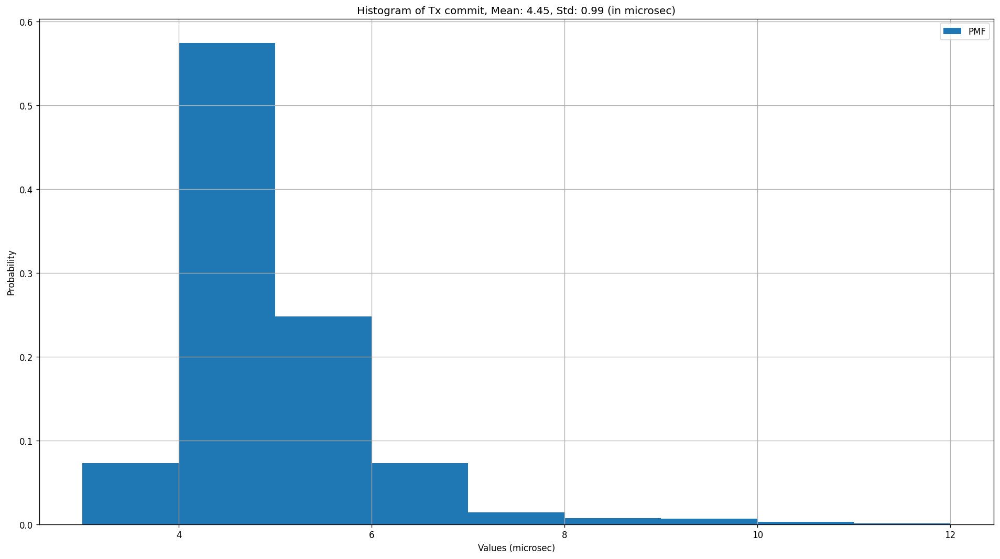

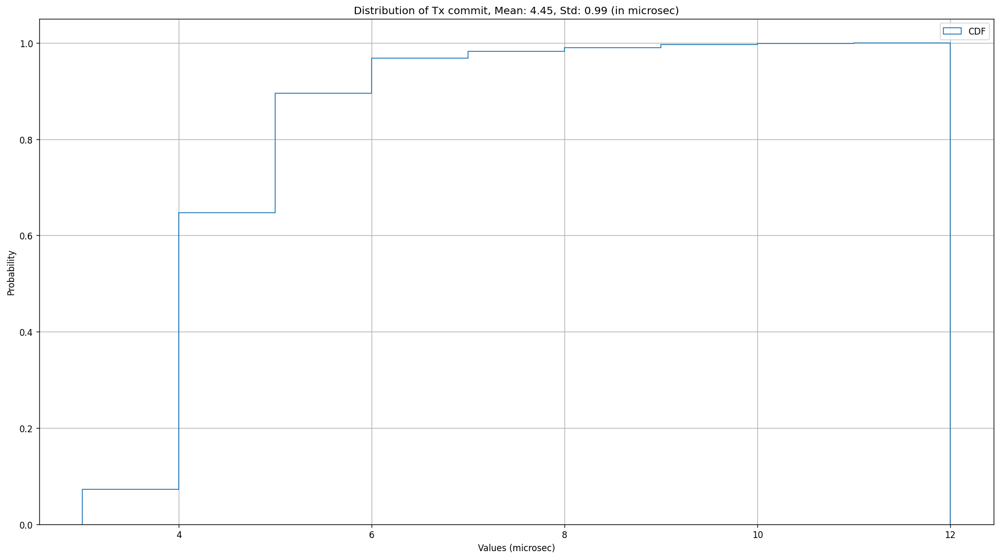

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
1,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
2,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
3,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
4,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9996,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67


OU - Tx commit Targets shape: (10000,)


0       11106
1       11132
2        9931
3        9571
4        8249
        ...  
9995     4625
9996     4128
9997     4598
9998     3874
9999     4207
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1118/0.1121
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


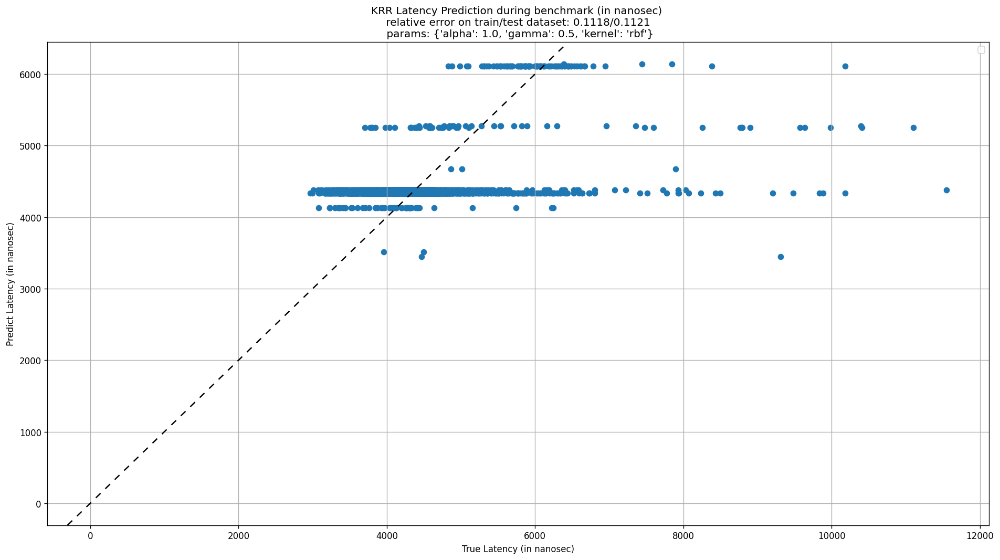

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.12059767 -0.11957109
 -0.11912996 -0.11878445 -0.12020738 -0.1182296  -0.11741359 -0.11679505
 -0.11944916 -0.1160342  -0.11445569 -0.11340571 -0.11826278 -0.11266295
 -0.11058125 -0.1099554 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.11/0.1087
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


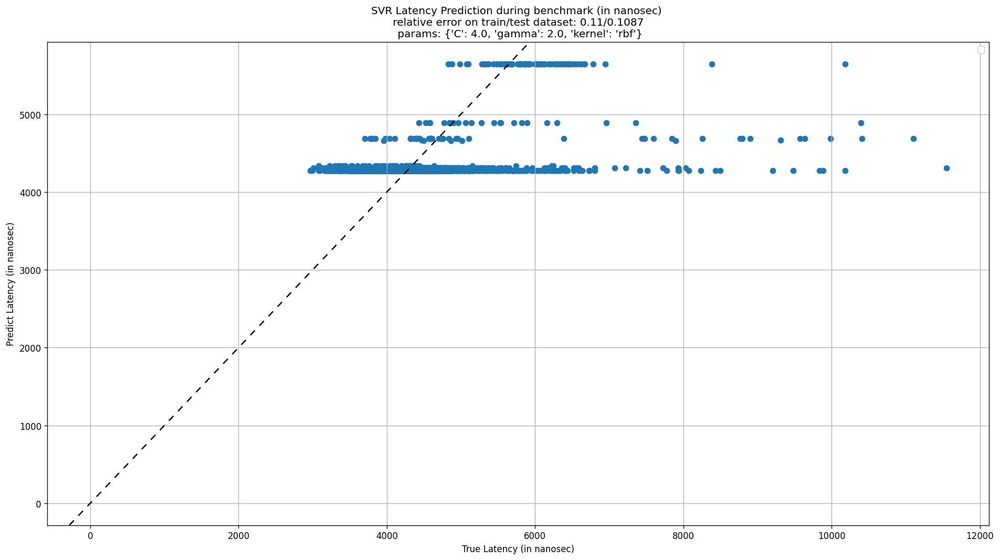

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1207/0.1188
Best Params: {'alpha': 1, 'epsilon': 1.1}


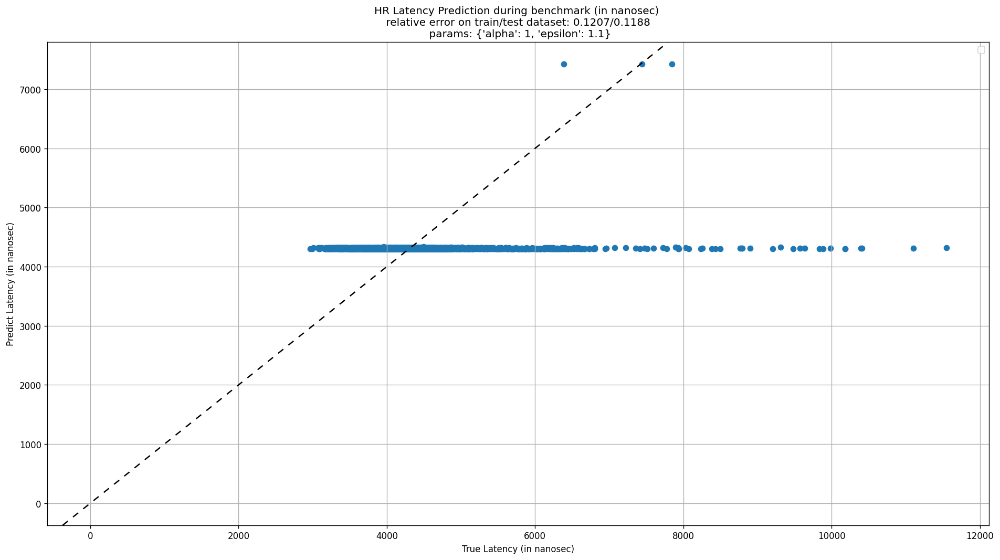

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1071/0.1068
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


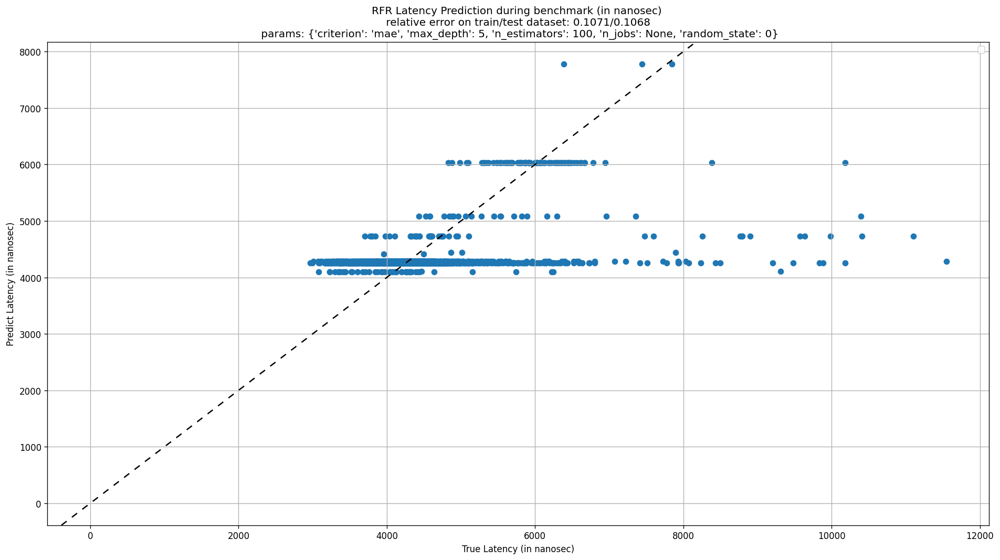

In microsec, Number of bins: 12, nBins: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
Mean Latency: 0.65, Std Latency: 0.66 (microsec)


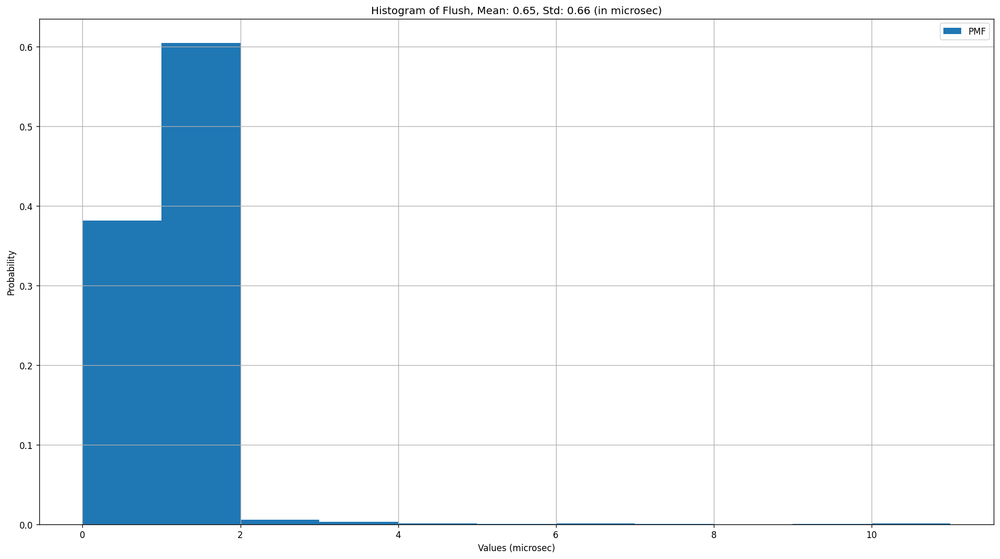

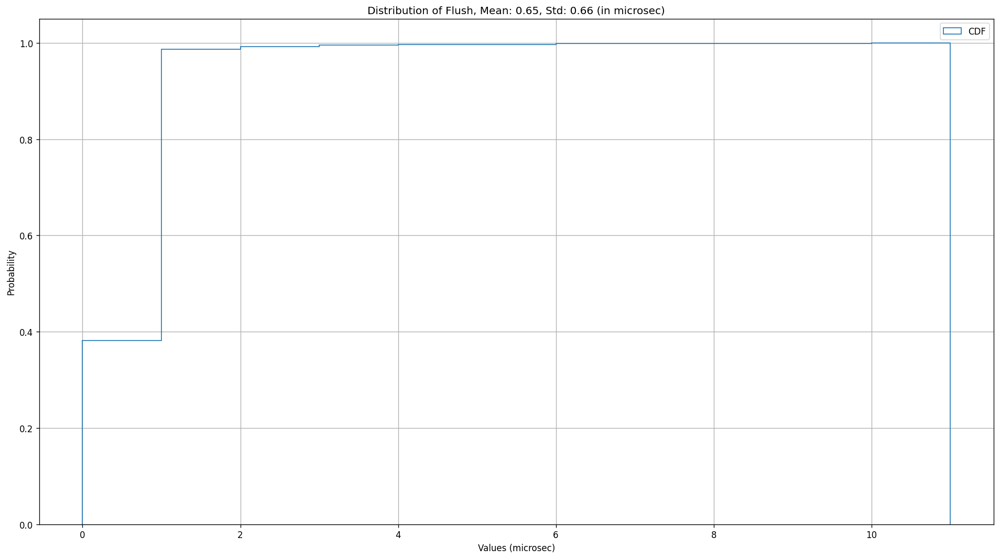

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,3.0,20,0,0,0,0,0,10,0,36
1,10,0,1,50,3.0,20,0,0,0,0,0,10,0,58
2,10,0,1,50,2.0,20,0,0,0,0,0,10,0,66
3,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
4,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9996,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67


OU - Flush Targets shape: (10000,)


0       6632
1       8231
2       6740
3       5072
4       5017
        ... 
9995     507
9996     499
9997     472
9998     410
9999     470
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1786/0.1835
Best Params: {'alpha': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


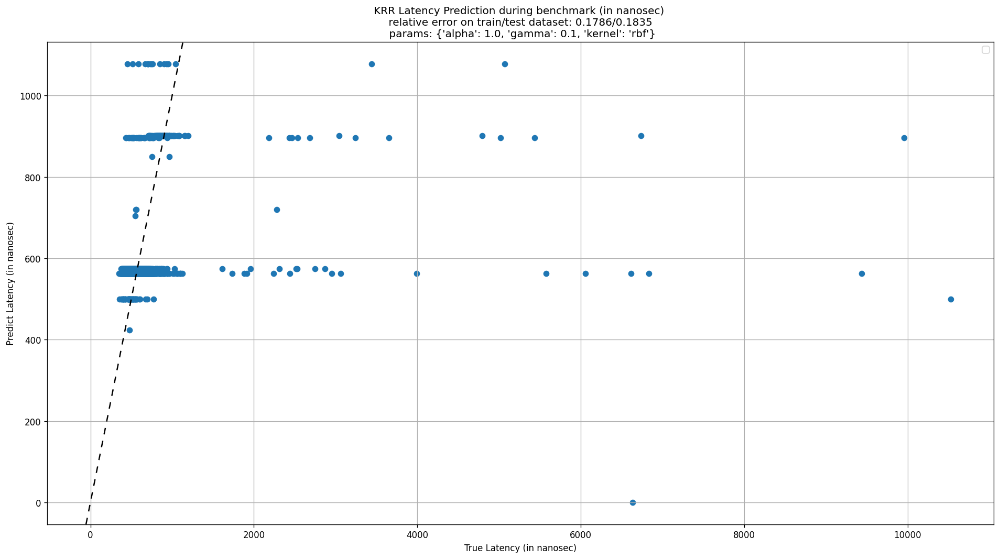

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.15426918 -0.14895847
 -0.14677968 -0.14569351 -0.15264647 -0.1445867  -0.14288294 -0.14266137
 -0.15063952 -0.14200968 -0.14121386 -0.14127646 -0.14795191 -0.14088998
 -0.1406774  -0.14078176]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1407/0.1461
Best Params: {'C': 4.0, 'gamma': 1.0, 'kernel': 'rbf'}


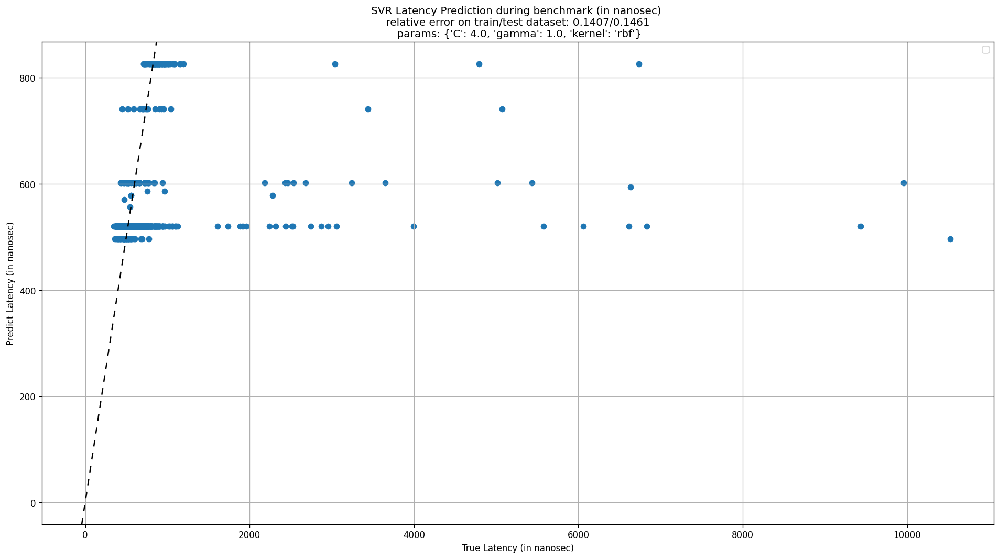

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1574/0.1627
Best Params: {'alpha': 0, 'epsilon': 1.1}


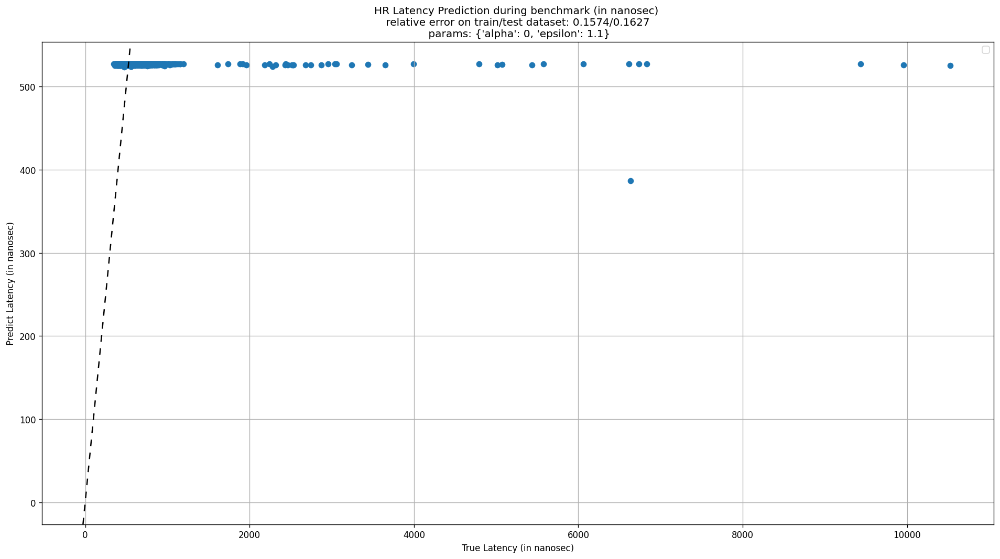

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1403/0.1452
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


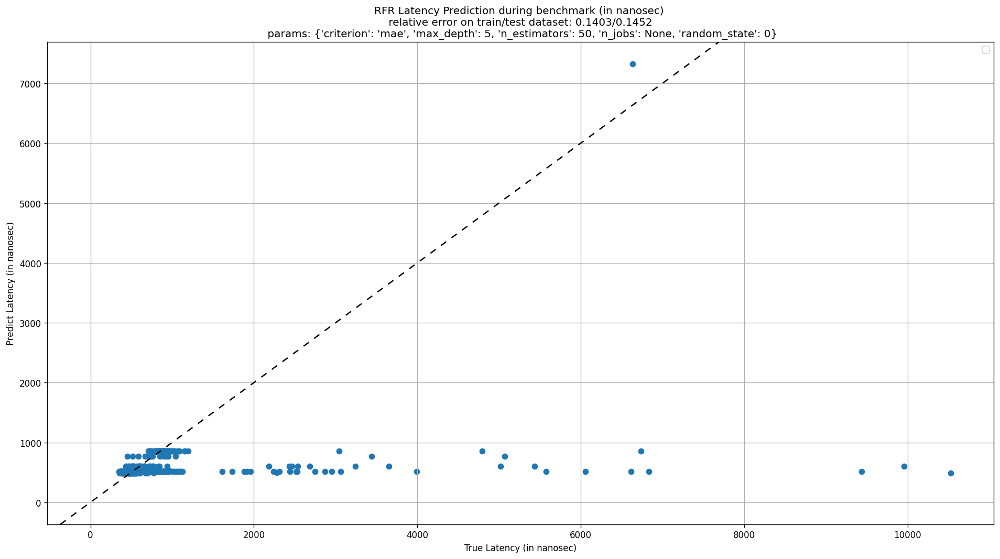

In microsec, Number of bins: 3, nBins: [1. 2. 3.]
Mean Latency: 1.34, Std Latency: 0.48 (microsec)


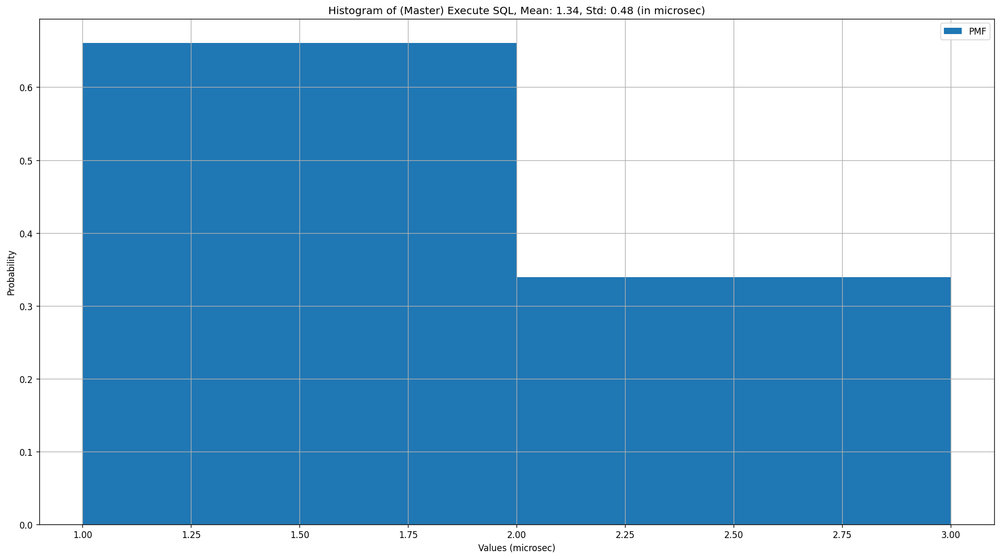

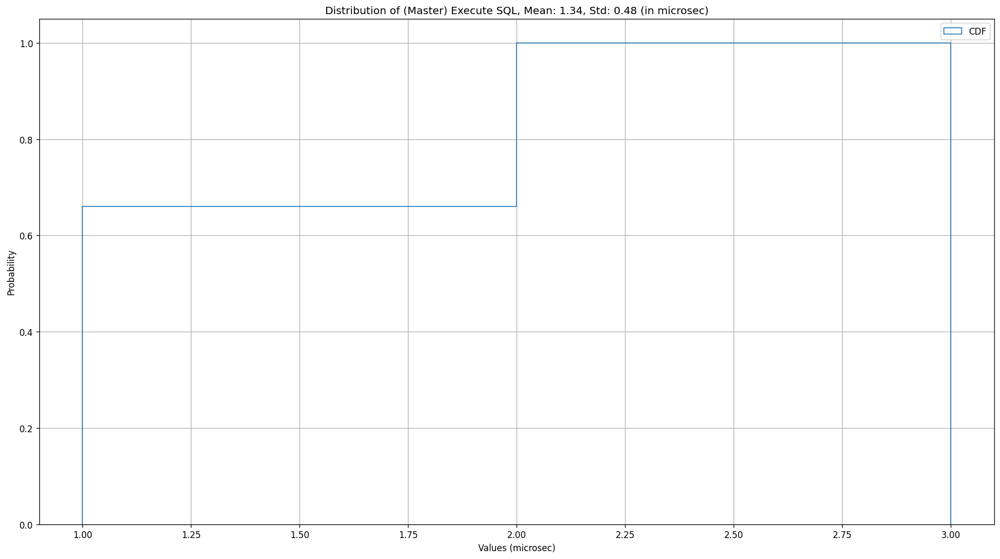

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
1,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
2,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
3,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
4,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9996,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       1109
1       1291
2       1442
3       1200
4       1356
        ... 
9995    1244
9996    1470
9997    1356
9998    1549
9999    1358
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1117/0.1139
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


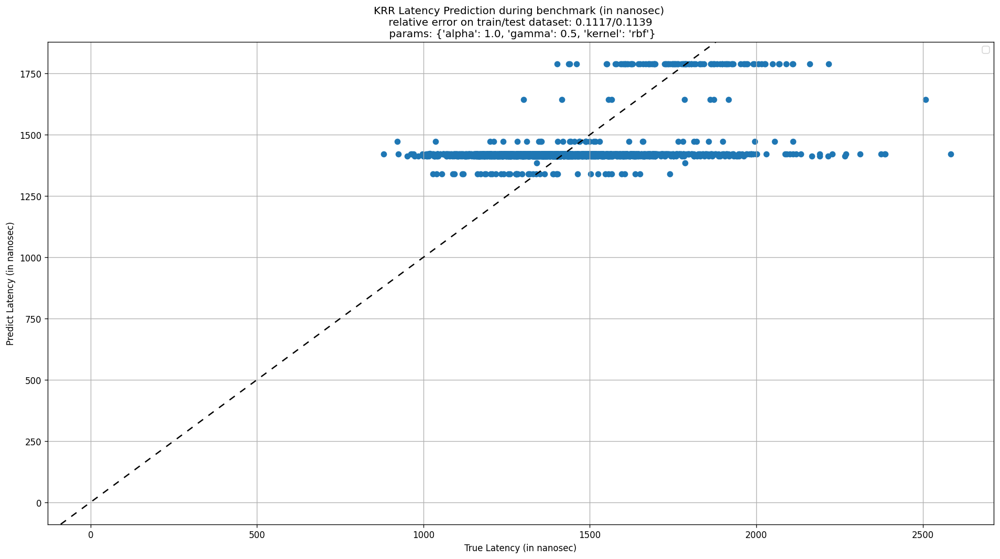

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.11570728 -0.11338693
 -0.11254702 -0.11212665 -0.11482341 -0.11156292 -0.11093676 -0.11068563
 -0.1136347  -0.11026707 -0.10976075 -0.10974573 -0.11237303 -0.10944344
 -0.10923924 -0.10927783]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1092/0.1114
Best Params: {'C': 4.0, 'gamma': 1.0, 'kernel': 'rbf'}


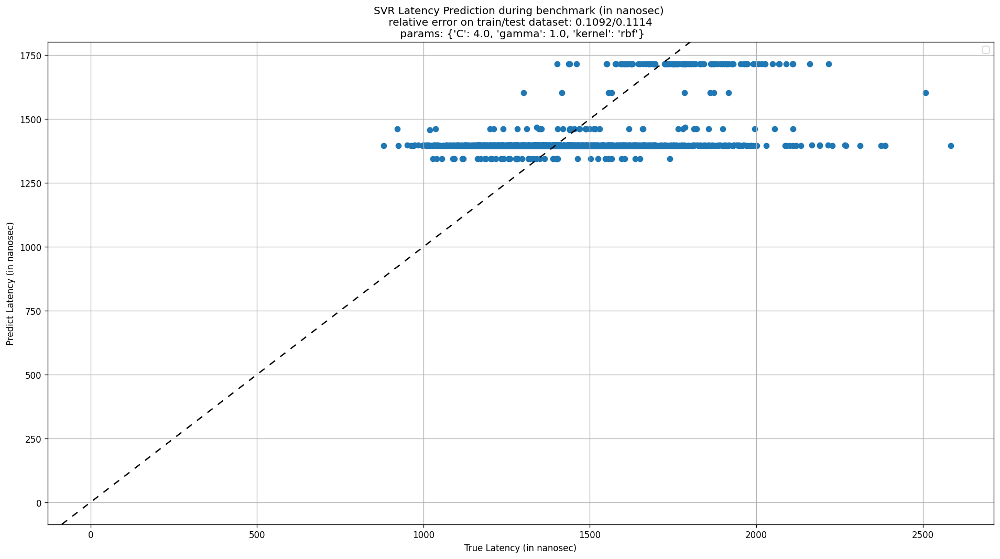

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1169/0.1201
Best Params: {'alpha': 1, 'epsilon': 1.1}


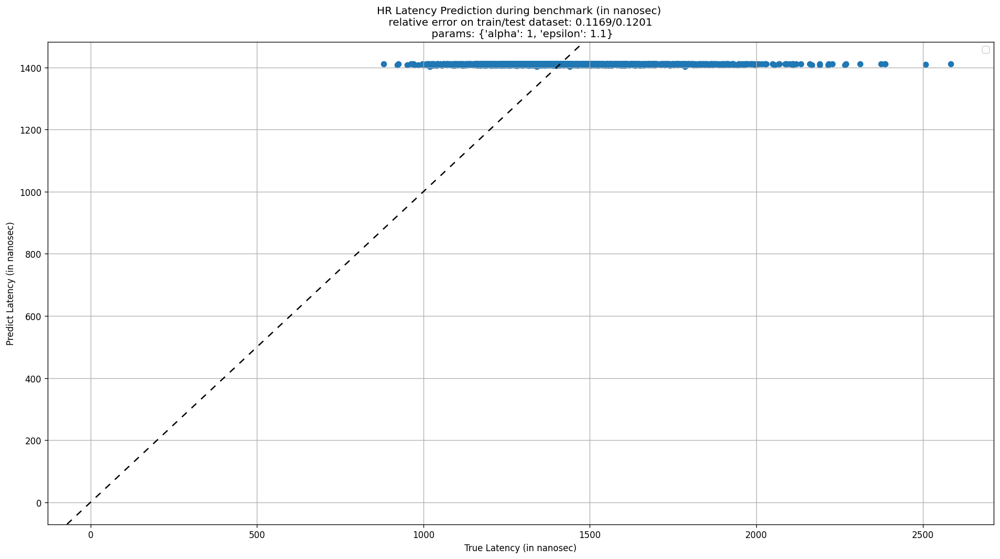

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.109/0.1109
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


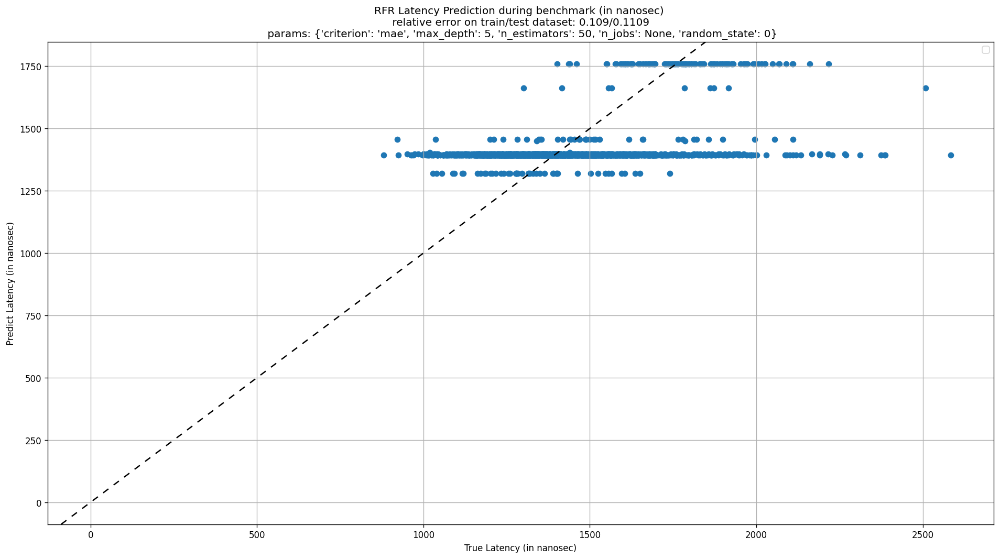

In microsec, Number of bins: 305, nBins: [ 21.  23.  24.  25.  26.  27.  28.  30.  31.  32.  33.  34.  35.  36.
  37.  38.  39.  40.  41.  42.  43.  44.  45.  46.  47.  48.  49.  50.
  51.  52.  53.  54.  55.  56.  57.  58.  59.  60.  61.  62.  63.  64.
  65.  66.  67.  68.  69.  70.  71.  72.  73.  74.  75.  76.  77.  78.
  79.  80.  81.  82.  83.  84.  85.  86.  87.  88.  89.  90.  91.  92.
  93.  94.  95.  96.  97.  98.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118. 119. 120.
 121. 122. 123. 124. 125. 126. 127. 128. 129. 130. 131. 132. 133. 134.
 135. 136. 137. 138. 139. 140. 141. 142. 143. 144. 145. 146. 147. 148.
 149. 150. 151. 152. 153. 154. 155. 156. 157. 158. 159. 160. 161. 162.
 163. 164. 165. 166. 167. 168. 169. 170. 171. 172. 173. 174. 175. 176.
 177. 178. 179. 180. 181. 182. 183. 184. 185. 186. 187. 188. 189. 190.
 191. 192. 193. 194. 195. 196. 197. 198. 199. 200. 201. 202. 203. 204.
 205. 206. 207. 208. 209. 210. 211. 

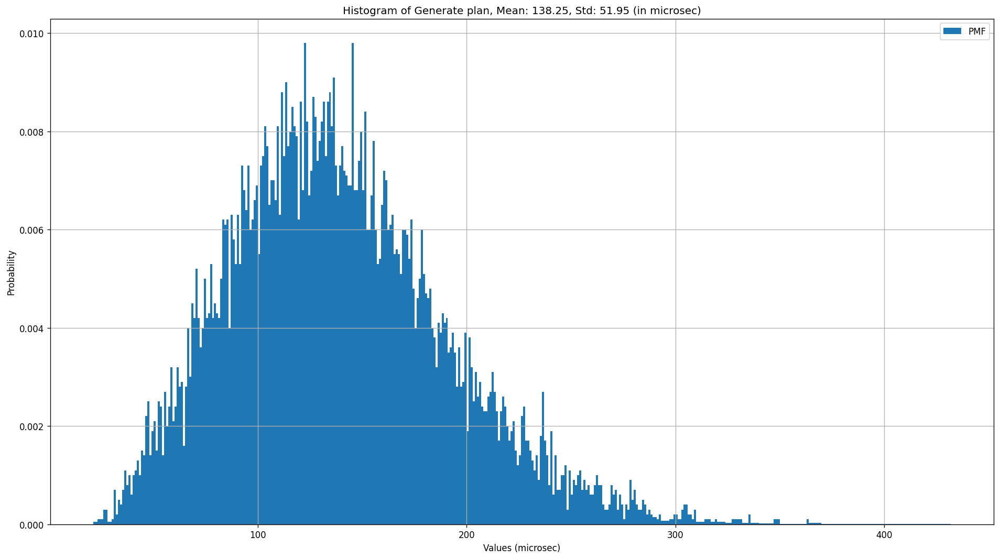

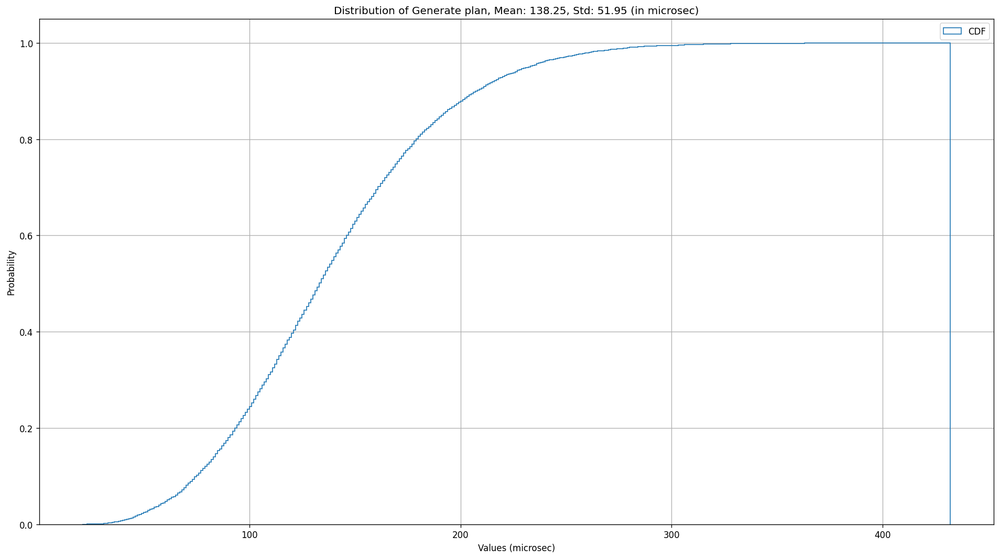

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,3.0,20,0,0,0,0,0,10,0,36
1,10,0,1,50,3.0,20,0,0,0,0,0,10,0,58
2,10,0,1,50,4.0,20,0,0,0,0,0,10,0,65
3,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
4,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9996,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67


OU - Generate plan Targets shape: (10000,)


0       174942
1       125580
2       110435
3        95704
4       130387
         ...  
9995    144748
9996    162841
9997    146063
9998    137321
9999    131170
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.3745/0.3634
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


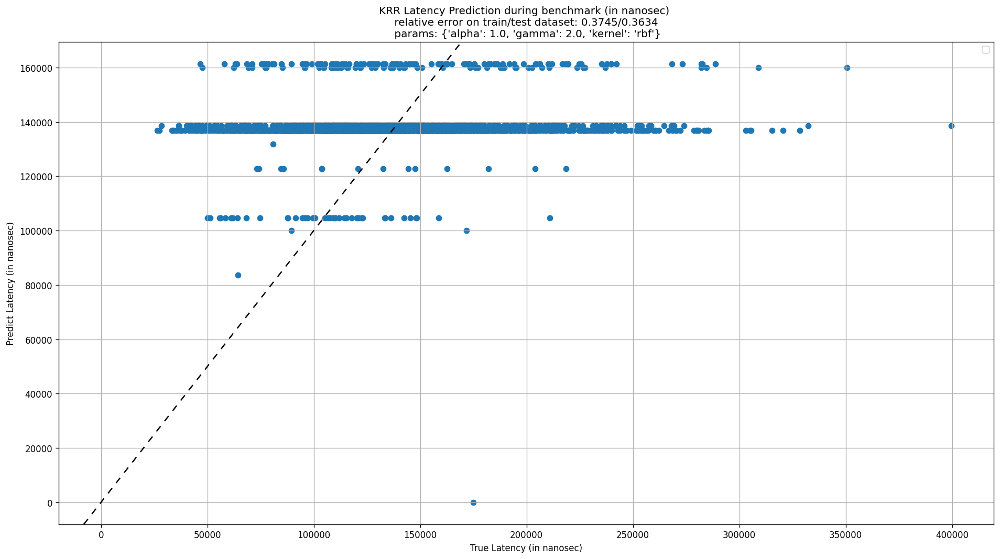

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.36490634 -0.36491062
 -0.36491642 -0.3649154  -0.3649078  -0.3649219  -0.36492307 -0.36492954
 -0.36491683 -0.3649329  -0.36492319 -0.3649226  -0.36493088 -0.36495299
 -0.36493248 -0.36489149]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.3649/0.3512
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


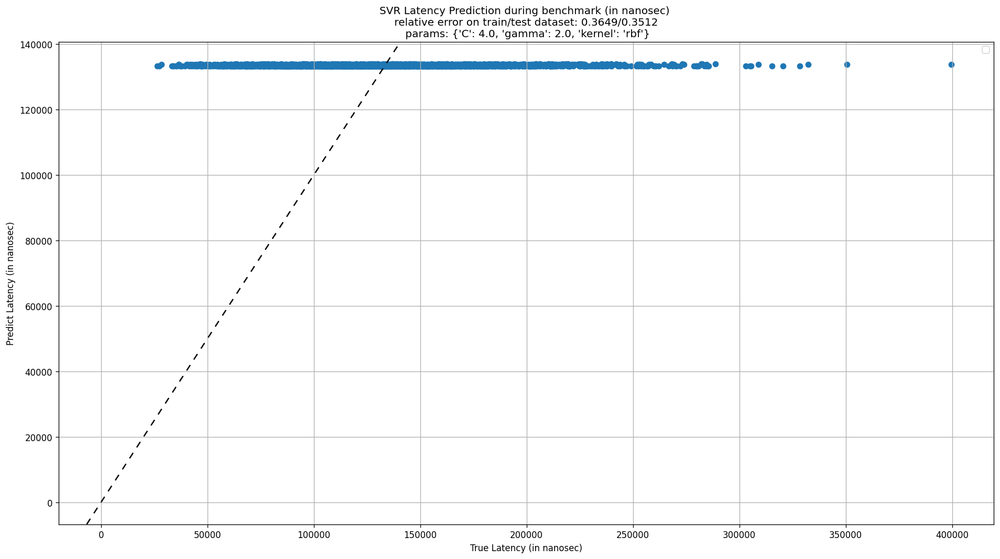

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.3654/0.3514
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


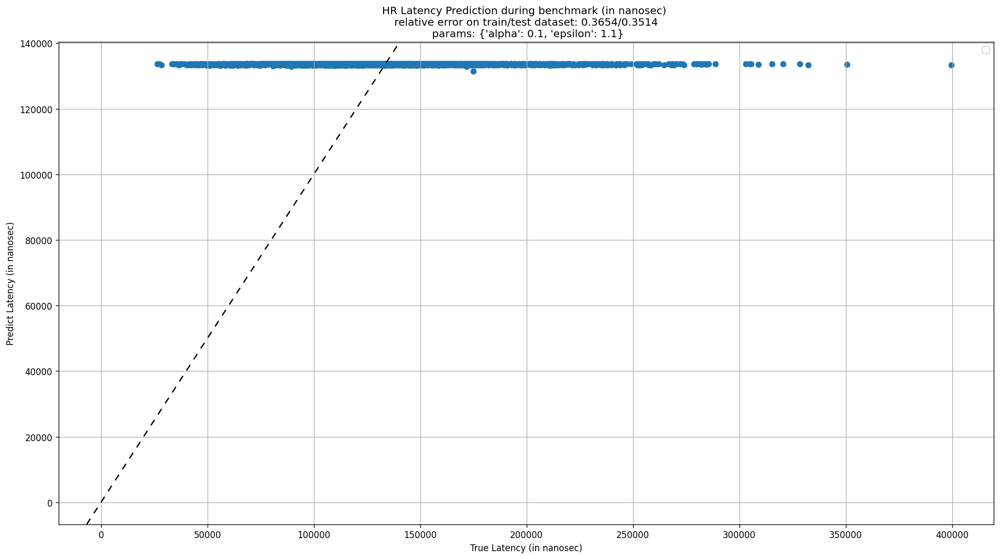

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.3622/0.3497
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


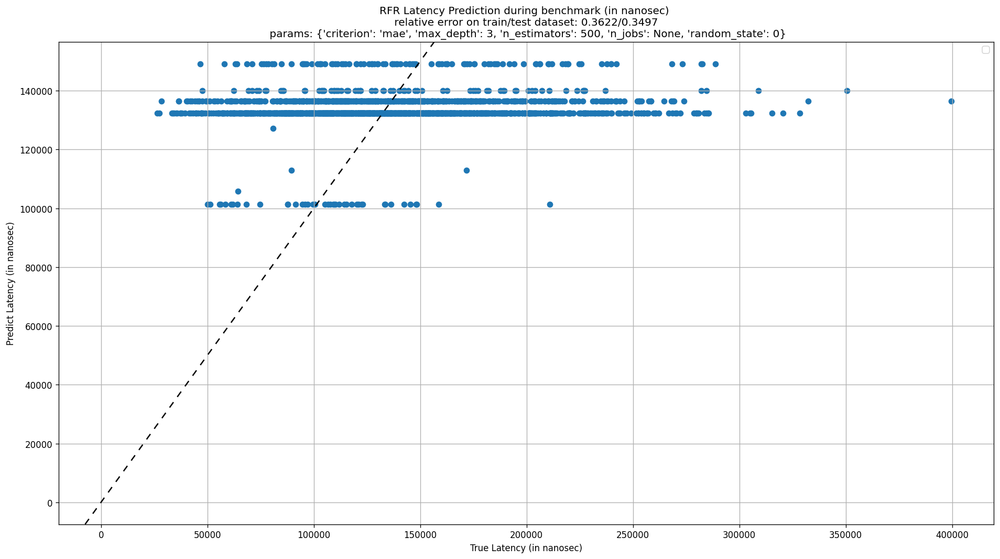

Records: Time of Each Component with shape: (139392, 16)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of R/W Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp
0,1,190144042,2417909583360520,2082661,425100,180294369,82777,179215604,10249,56266,3028,835439,61803,28831,22847,2417909769133465
1,2,4633388,2417909865160694,192649,620402,3569450,30285,2435855,2080,21633,631,1033462,23718,12710,3673,2417909868914815
2,3,2121653,2417909872917525,92715,407627,1362755,27892,732333,1742,13119,643,551762,27496,13238,6492,2417909874515765
3,4,2308133,2417909878390874,107132,505266,1528240,18919,941273,1955,13944,603,519707,23702,12984,3803,2417909880046958
4,5,3255268,2417909884730694,300973,396565,2301924,18508,575837,1754,50500,560,569697,1075428,1058354,4989,2417909887232682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139387,139388,187916,2418209514743863,13556,10268,141542,2412,74313,392,2002,46,56904,3795,1432,838,2418209514905919
139388,139389,194202,2418209516368735,19906,10972,143373,2116,79053,393,1662,46,54759,3685,1594,805,2418209516530483
139389,139390,227122,2418209518121265,23296,10845,157495,2198,88203,727,2210,107,58460,3985,1449,997,2418209518311922
139390,139391,209178,2418209519969184,13256,10222,161101,2416,90003,340,1844,46,61110,3785,1529,969,2418209520152490


Features: Features with shape: (139392, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,2,2,1,50,0.0,4,0,2,0,2,66,4,0,22
1,2,285295022,2,2,1,50,0.0,4,0,2,0,2,66,4,0,25
2,3,293407284,2,2,1,50,1.0,4,0,2,0,2,66,4,0,26
3,4,298752354,2,2,1,50,1.0,4,0,2,0,2,66,4,0,27
4,5,304989673,2,2,1,50,1.0,4,0,2,0,2,66,4,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139387,139388,299935732446,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
139388,139389,299937350723,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
139389,139390,299939099158,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
139390,139391,299940957740,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67


In microsec, Number of bins: 6, nBins: [2. 3. 4. 5. 6. 7.]
Mean Latency: 3.03, Std Latency: 0.88 (microsec)


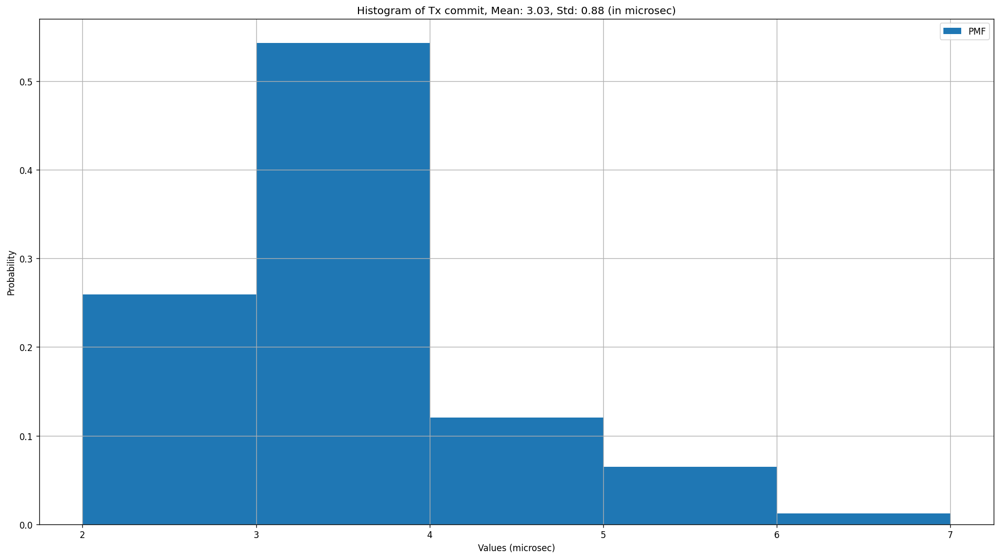

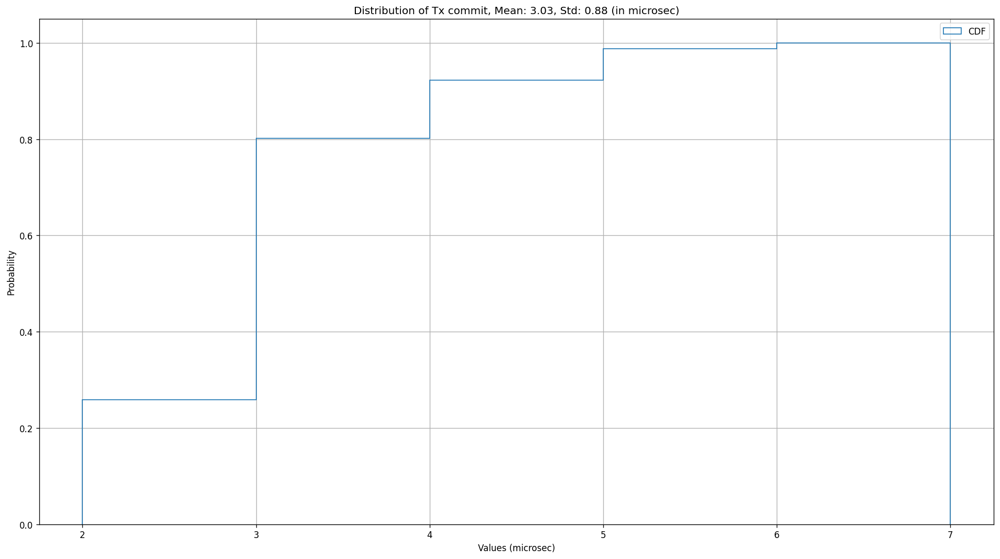

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
1,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
2,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
3,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
4,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9996,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9997,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67


OU - Tx commit Targets shape: (10000,)


0       6548
1       5511
2       6712
3       6499
4       6862
        ... 
9995    2738
9996    3933
9997    4858
9998    3489
9999    1977
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1716/0.1733
Best Params: {'alpha': 1.0, 'gamma': 1.0, 'kernel': 'rbf'}


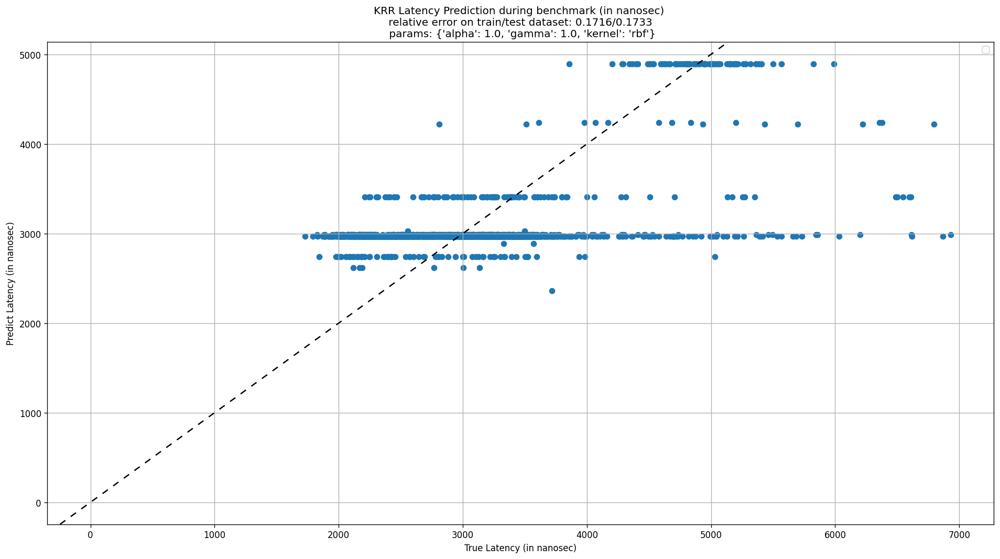

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.18871343 -0.18791027
 -0.18746114 -0.18717345 -0.1881819  -0.18665486 -0.18578633 -0.18532763
 -0.18724886 -0.18428923 -0.18279467 -0.18196895 -0.18572961 -0.18034122
 -0.17793236 -0.17664597]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1766/0.1769
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


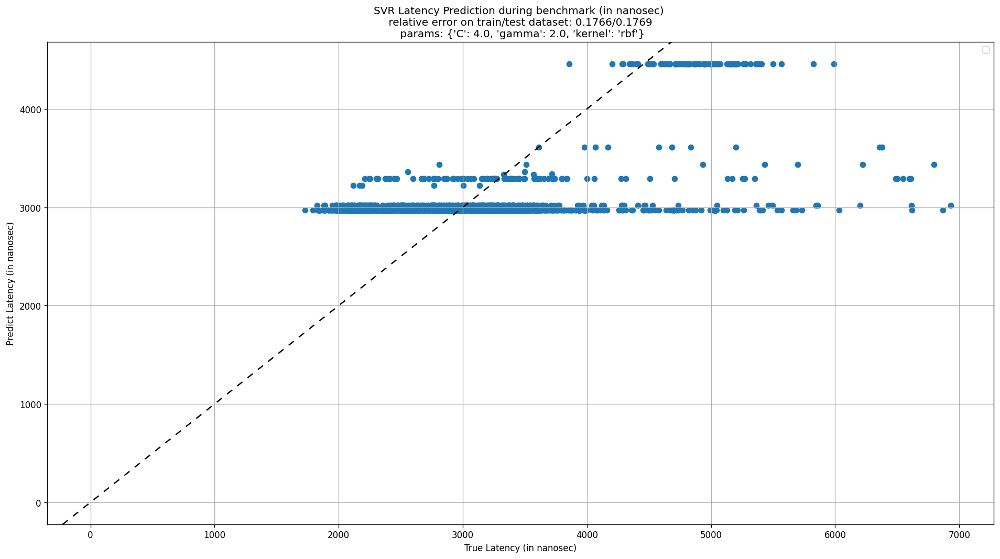

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1874/0.1902
Best Params: {'alpha': 1, 'epsilon': 1.35}


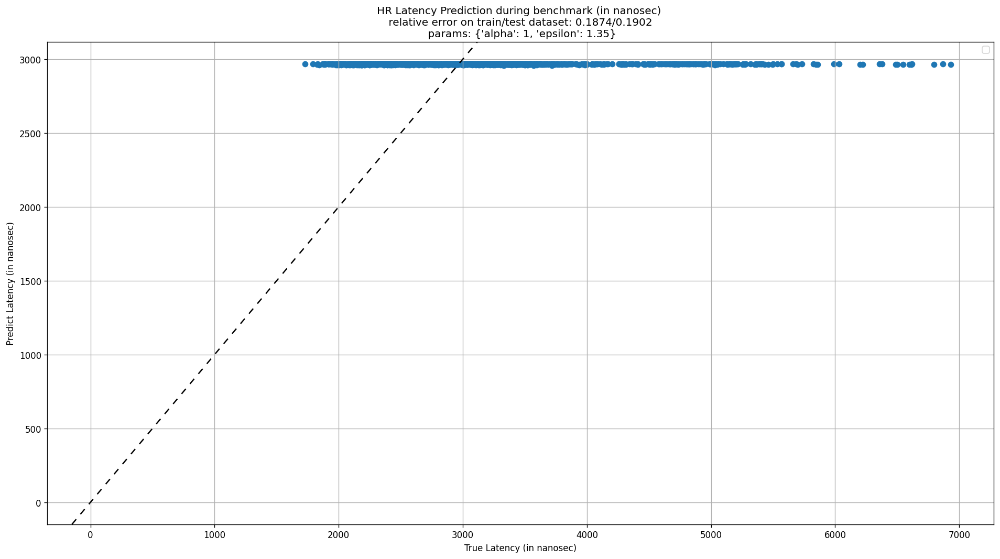

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1703/0.1717
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


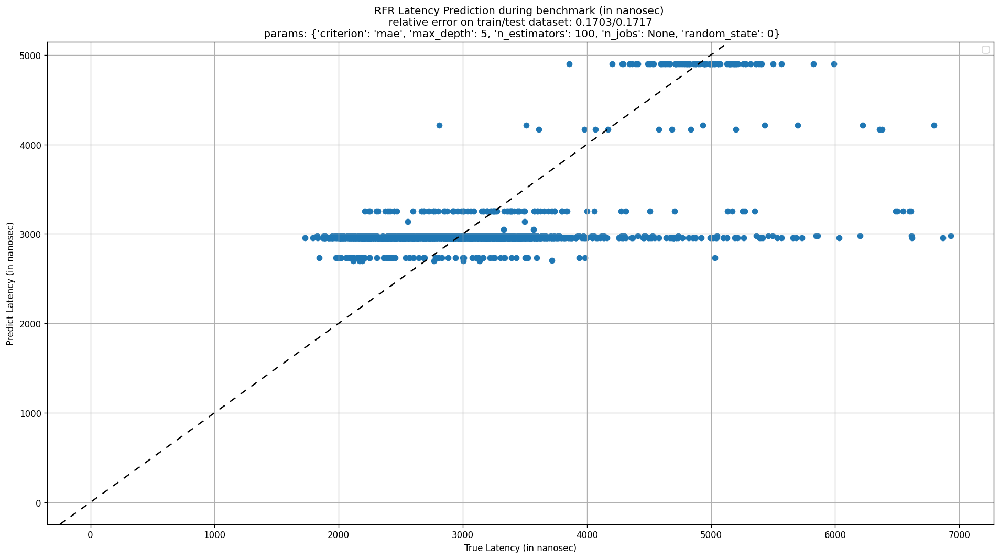

In microsec, Number of bins: 73, nBins: [ 46.  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.  57.  58.  59.
  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.  70.  71.  72.  73.
  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.  84.  85.  86.  87.
  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.  98.  99. 100. 101.
 102. 103. 104. 105. 106. 109. 110. 112. 113. 114. 115. 117. 118. 119.
 120. 121. 125.]
Mean Latency: 54.0, Std Latency: 7.48 (microsec)


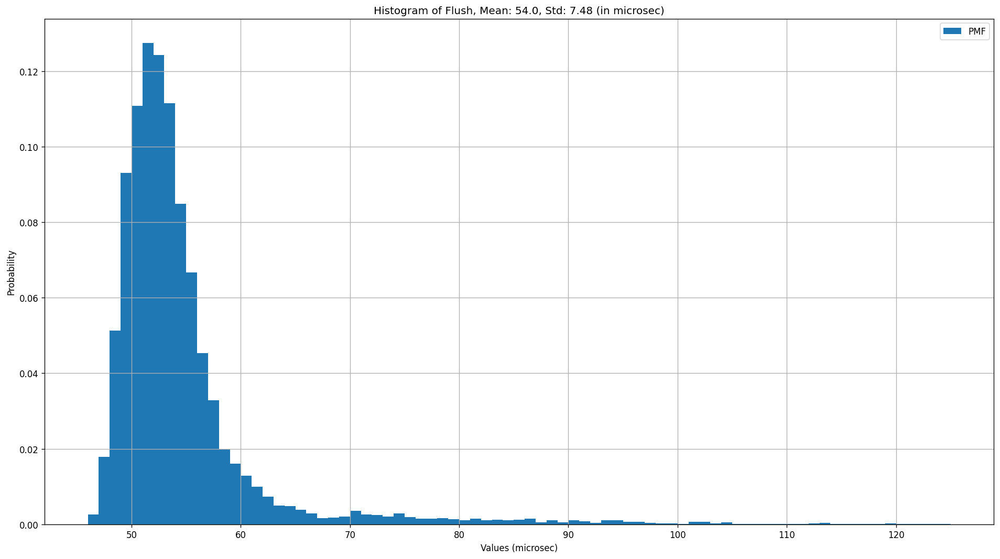

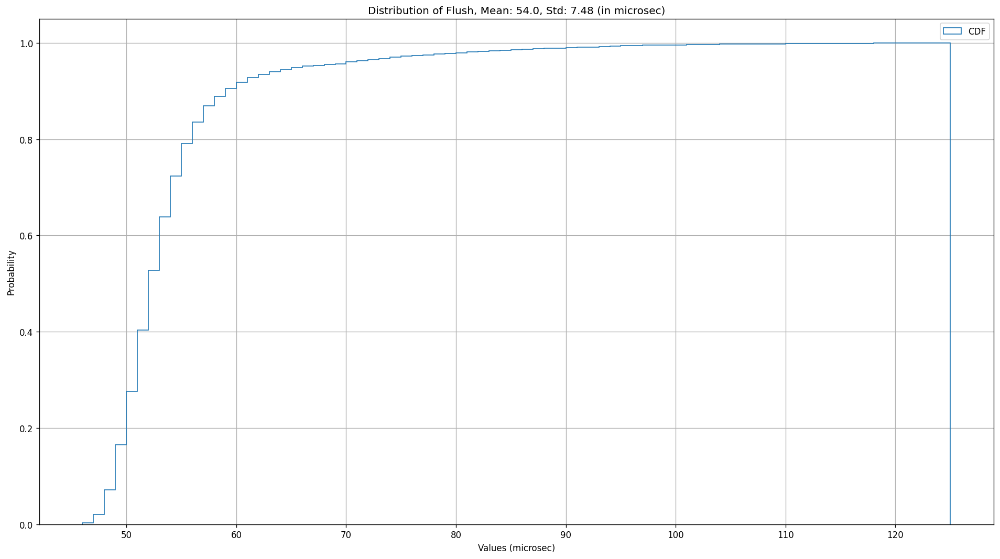

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
1,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
2,2,2,1,50,7.0,4,0,2,0,2,66,4,0,67
3,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
4,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9996,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9997,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67


OU - Flush Targets shape: (10000,)


0       124660
1       119772
2       113498
3       113494
4       117260
         ...  
9995     52899
9996     55508
9997     64994
9998     53268
9999     52931
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0687/0.0687
Best Params: {'alpha': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


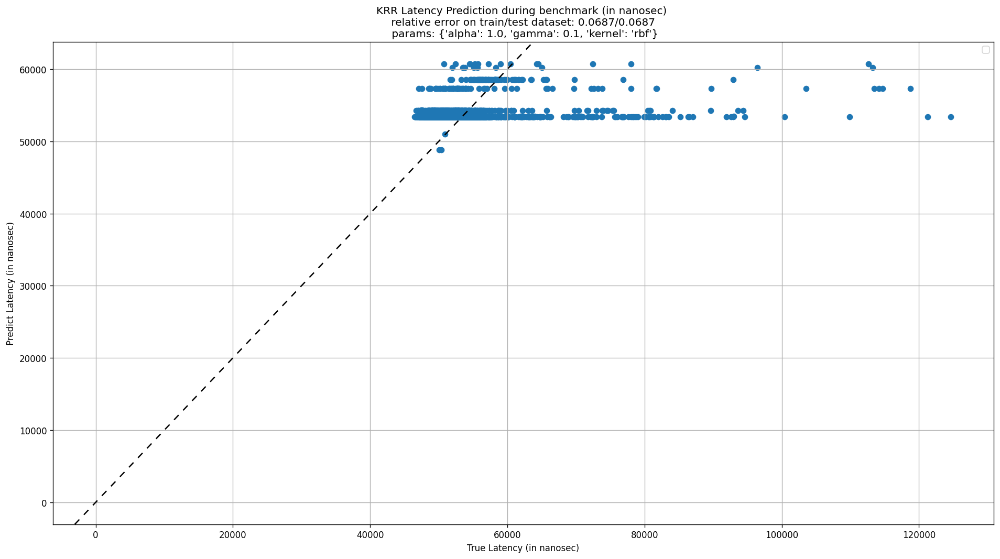

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.06273496 -0.06268942
 -0.06266243 -0.06262985 -0.06271752 -0.06263187 -0.06257566 -0.062533
 -0.06268722 -0.06251921 -0.06242507 -0.06235504 -0.06262477 -0.06231447
 -0.06215561 -0.06205303]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0621/0.0622
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


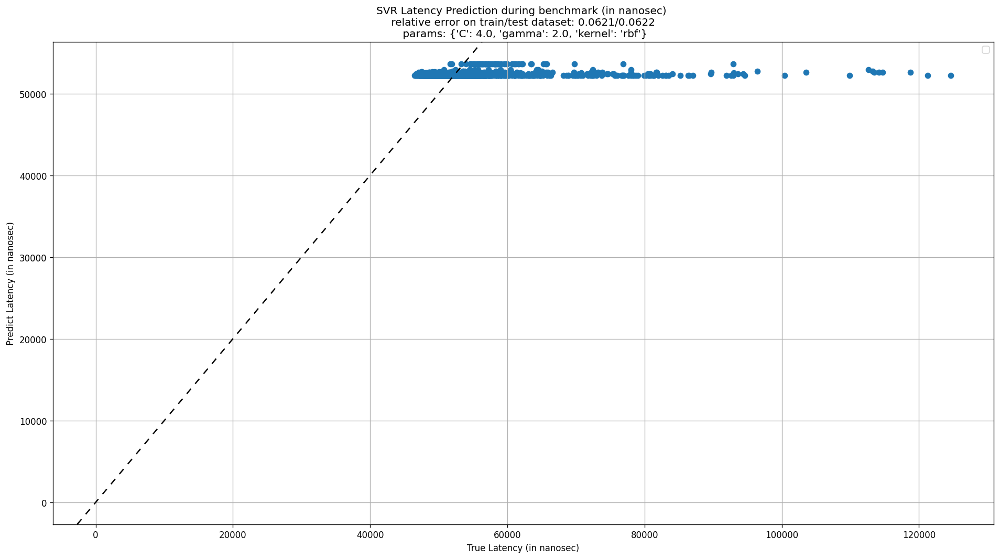

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0628/0.0632
Best Params: {'alpha': 1, 'epsilon': 1.1}


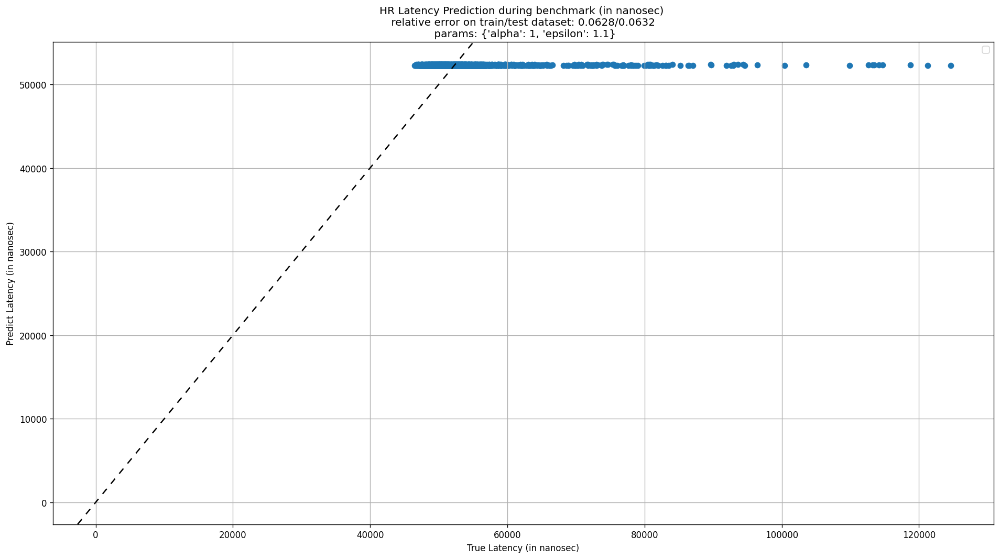

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0607/0.0604
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


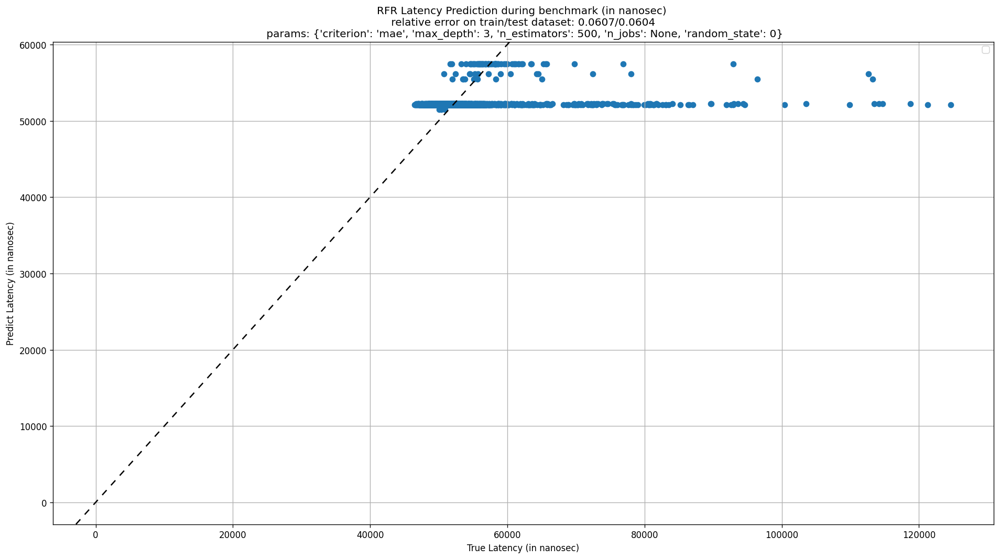

In microsec, Number of bins: 3, nBins: [1. 2. 3.]
Mean Latency: 1.54, Std Latency: 0.54 (microsec)


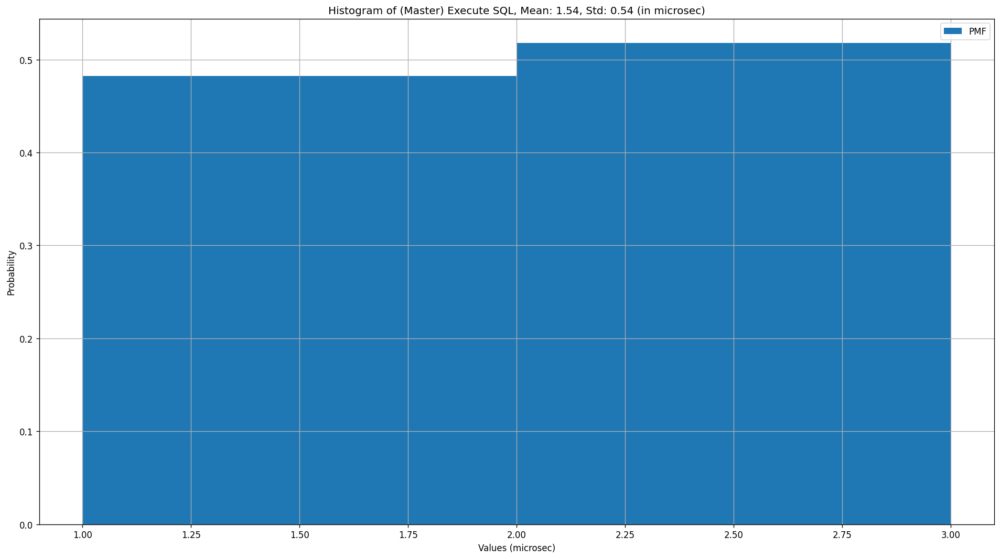

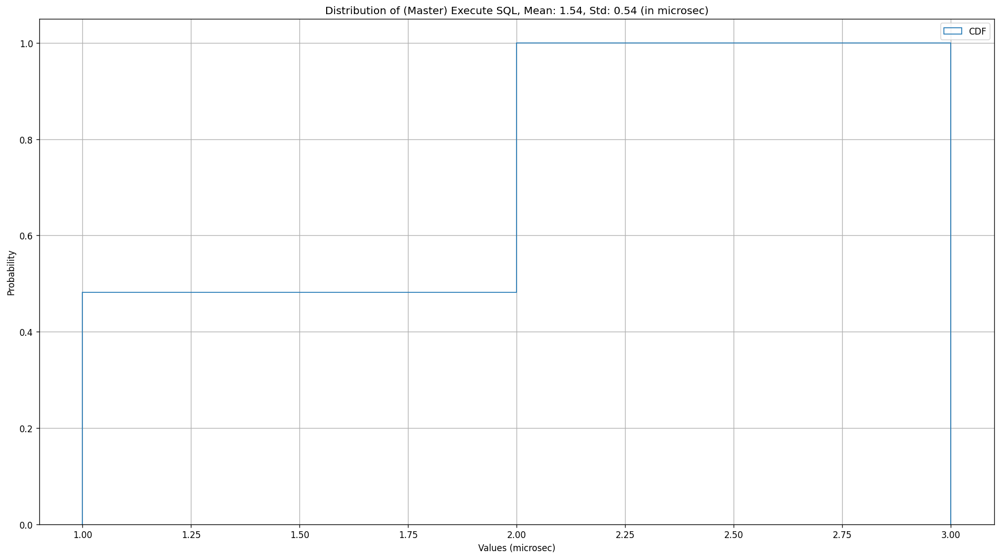

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
1,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
2,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
3,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
4,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9996,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
9997,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       2674
1       2361
2       1902
3       2201
4       2112
        ... 
9995    1572
9996    1679
9997    1541
9998    2224
9999    1877
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1305/0.1258
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


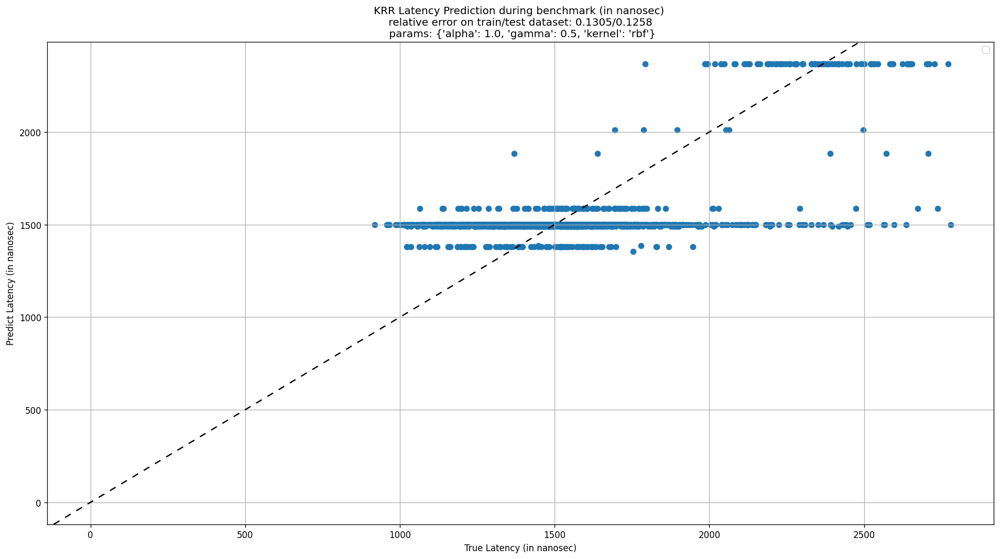

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.14378149 -0.14249439
 -0.14182438 -0.14142792 -0.14294686 -0.14047293 -0.13926099 -0.13857492
 -0.14177275 -0.13734732 -0.13537904 -0.13466284 -0.14024446 -0.13378392
 -0.13227552 -0.13195298]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.132/0.1263
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


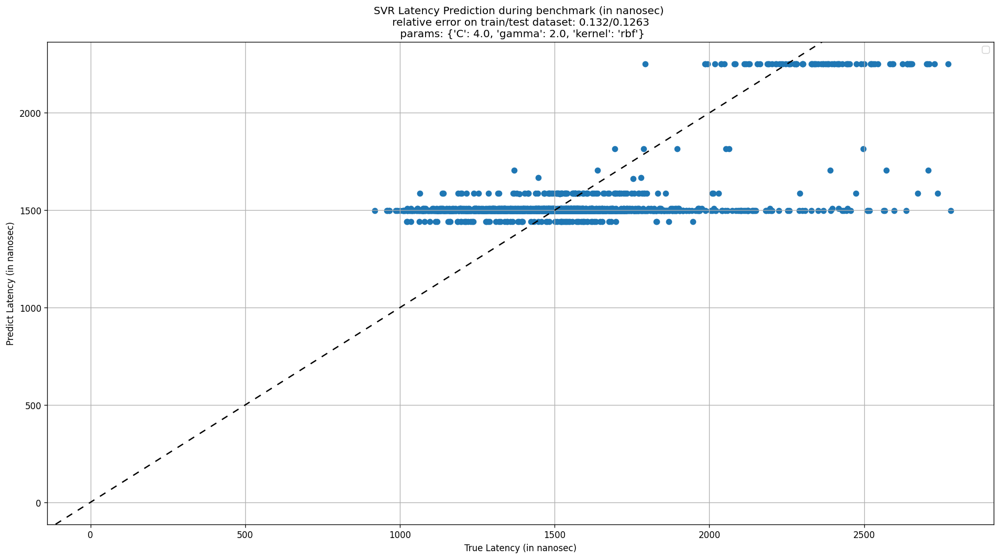

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1441/0.1399
Best Params: {'alpha': 1, 'epsilon': 1.35}


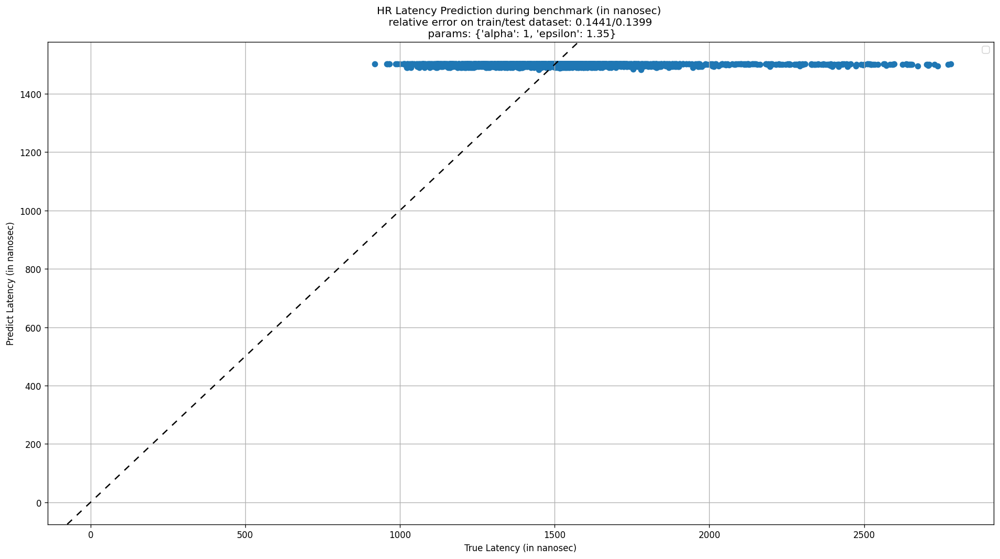

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1303/0.1255
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


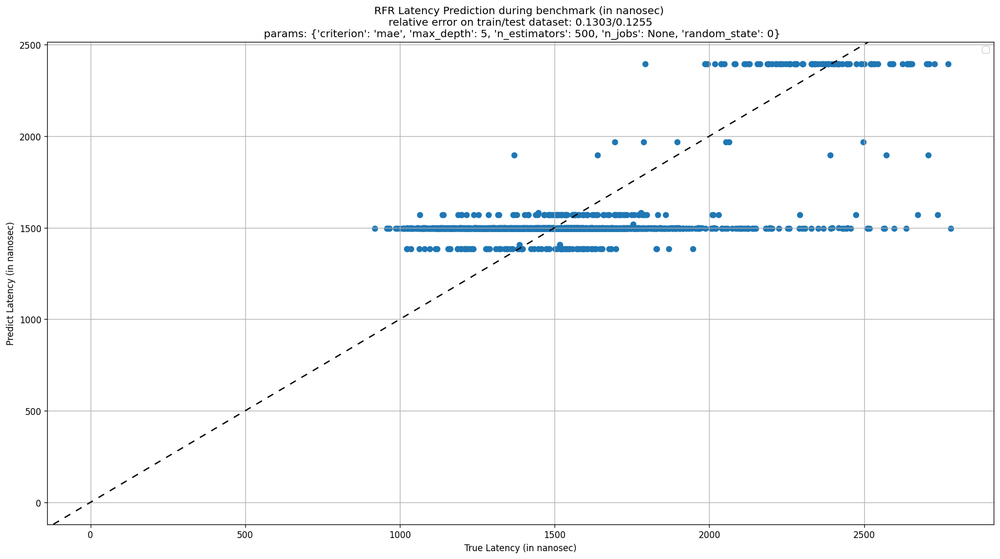

In microsec, Number of bins: 27, nBins: [ 6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21. 22. 23.
 24. 25. 26. 27. 28. 29. 30. 31. 32.]
Mean Latency: 15.36, Std Latency: 5.09 (microsec)


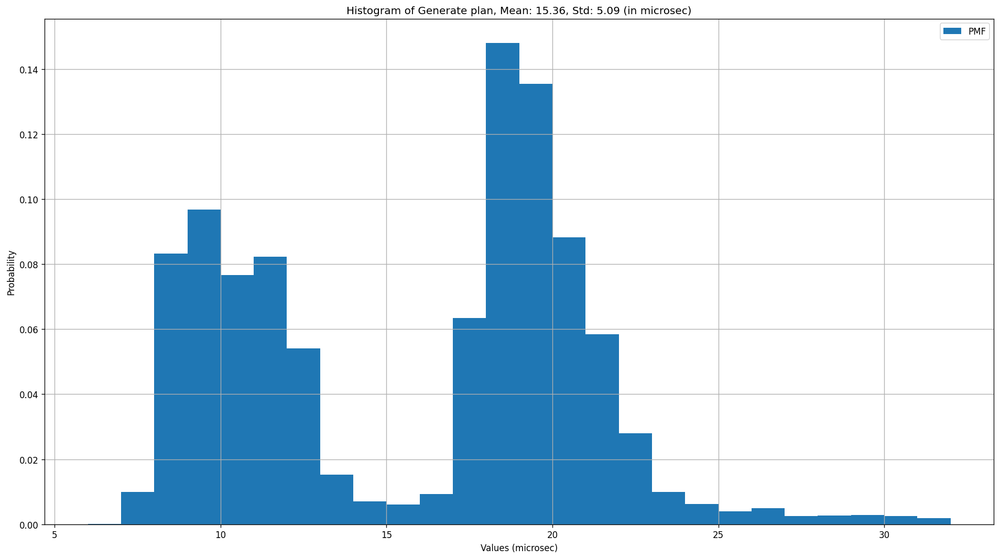

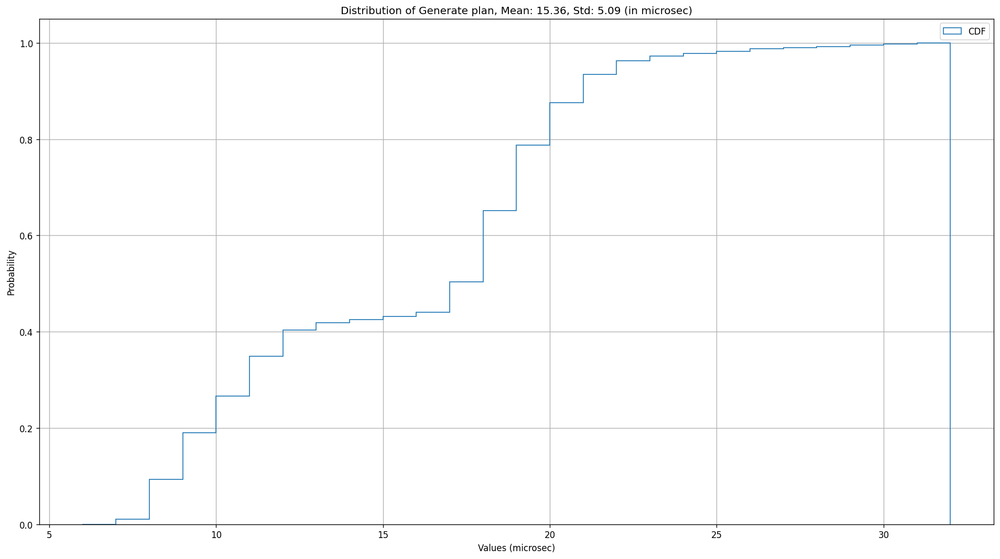

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
1,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
2,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
3,2,2,1,50,2.0,4,0,2,0,2,66,4,0,67
4,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9996,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9997,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67


OU - Generate plan Targets shape: (10000,)


0       21505
1       26643
2       21803
3       27403
4       19857
        ...  
9995    18950
9996    19175
9997    19557
9998    22300
9999    22109
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.3517/0.3555
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


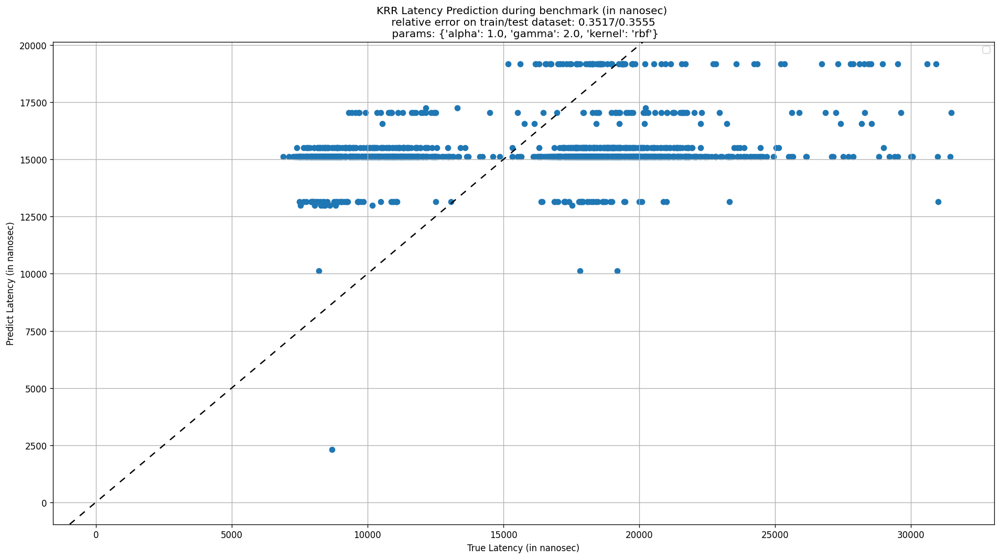

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.39623242 -0.3961409
 -0.39594901 -0.39584501 -0.39618429 -0.39587068 -0.39576242 -0.39573134
 -0.39611812 -0.39574663 -0.39558294 -0.39548437 -0.39589412 -0.39541577
 -0.39509201 -0.3949849 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.395/0.4002
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


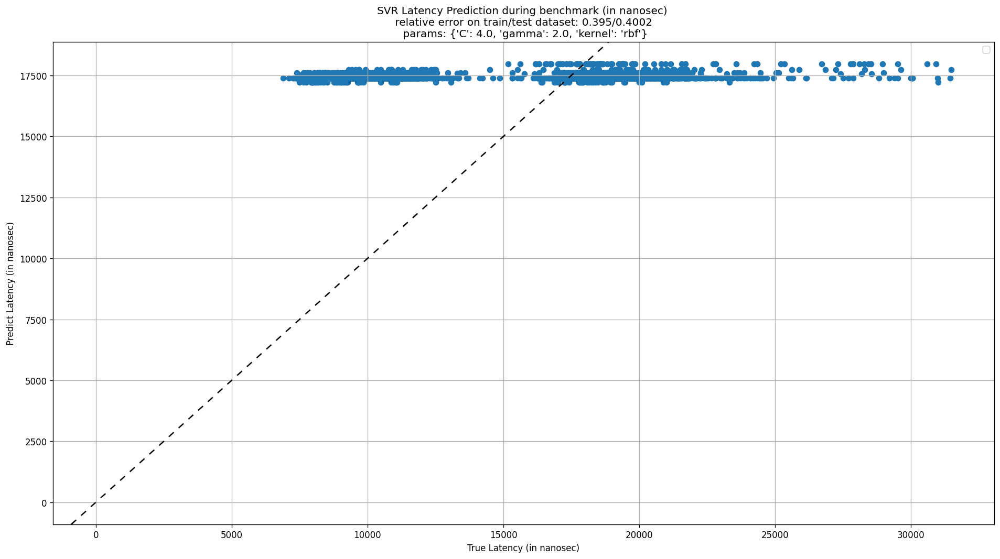

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.3606/0.3663
Best Params: {'alpha': 1, 'epsilon': 2}


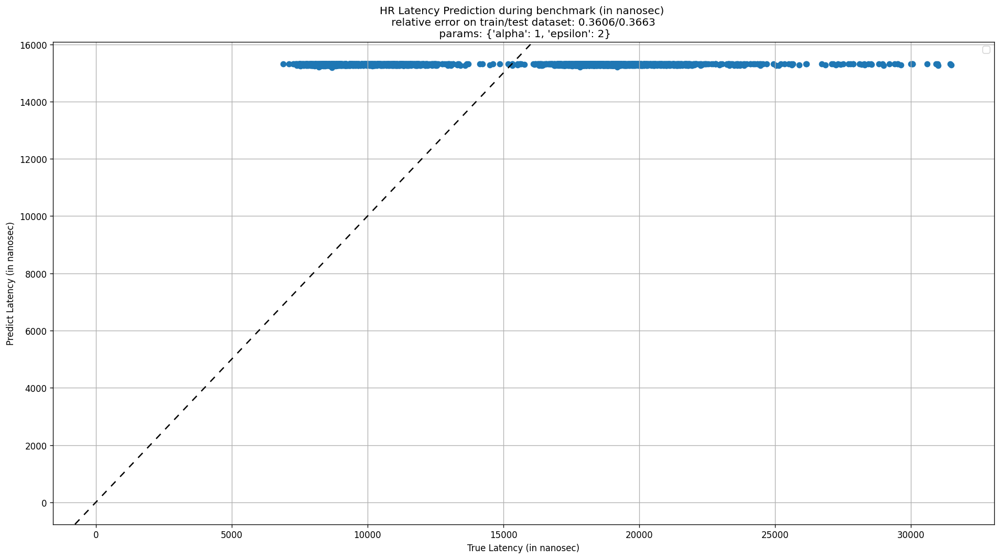

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.3521/0.3558
Best Params: {'criterion': 'mse', 'max_depth': 5, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


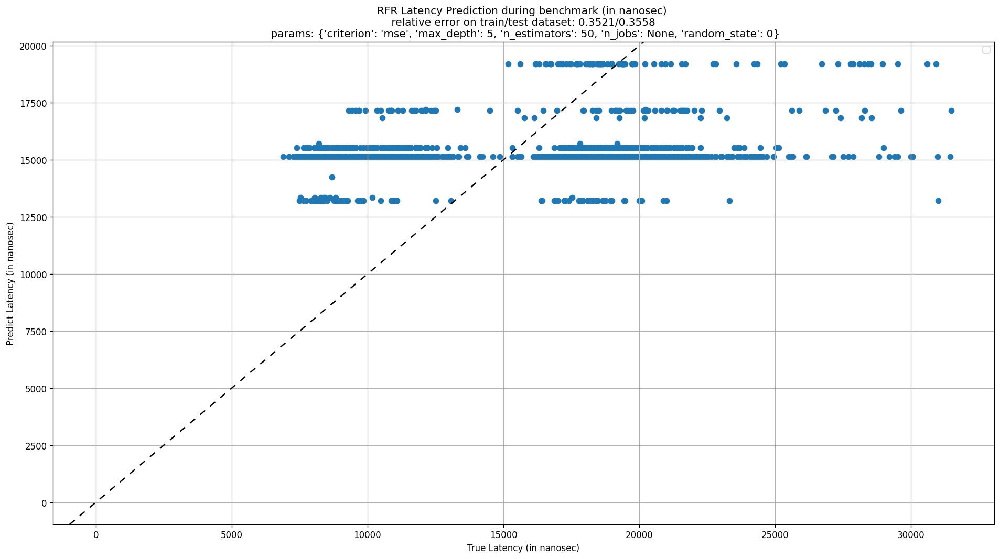

Records: Time of Each Component with shape: (142411, 17)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of R/W Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp,Average Time Of Read-Only Txn
0,1,20675186,2415920849571730,2106061,402987,13970345,67807,12986073,10594,54011,3159,788699,31960,18419,3776,2415920867151666,0
1,2,3052289,2415920959684495,120366,453840,2072573,23743,1292258,2349,16407,646,690709,36337,19041,8971,2415920962118841,0
2,3,2206656,2415920966512159,125906,498653,1465591,19808,853207,1798,12758,604,532265,36933,13784,3443,2415920968054568,0
3,4,1642456,2415920972091149,64700,492473,0,13868,913639,1499,4626,497,5994,21458,10731,3587,2415920973142489,968644
4,5,1895635,2415920976976294,110313,528136,0,13484,1086132,1779,4765,717,10498,21559,11145,3306,2415920978201289,1145900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142406,142407,134807,2416220780213808,6447,34133,0,1779,70973,193,556,42,374,2500,891,370,2416220780307235,77587
142407,142408,150479,2416220781986598,15489,32570,0,2122,75259,299,803,47,451,2632,1010,384,2416220782087912,83034
142408,142409,182137,2416220783744287,13278,21326,129691,2195,64782,351,2458,42,55827,2970,1673,349,2416220783889642,0
142409,142410,139854,2416220785535685,8581,31381,0,1949,72932,238,606,45,436,2611,1001,380,2416220785634048,80158


Features: Features with shape: (142411, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,2,2,1,50,0.0,4,0,2,0,2,66,4,0,22
1,2,112591603,2,2,1,50,0.0,4,0,2,0,2,66,4,0,25
2,3,119373720,2,2,1,50,1.0,4,0,2,0,2,66,4,0,26
3,4,125025884,2,0,1,50,1.0,4,0,0,0,0,0,2,0,27
4,5,129831457,2,0,1,50,2.0,4,0,0,0,0,0,2,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142406,142407,299933698998,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
142407,142408,299935463992,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
142408,142409,299937234113,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
142409,142410,299939020740,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67


In microsec, Number of bins: 5, nBins: [1. 2. 3. 4. 5.]
Mean Latency: 2.81, Std Latency: 0.72 (microsec)


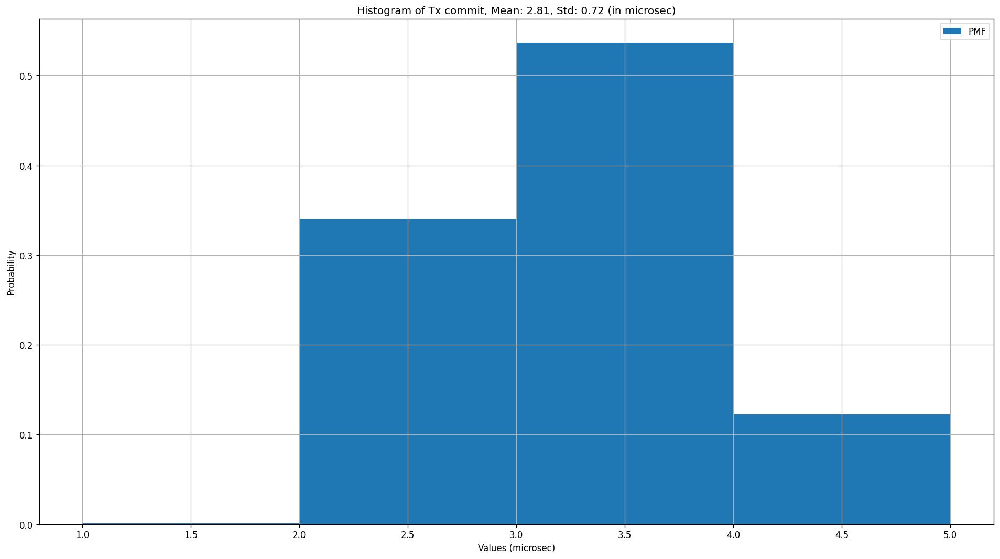

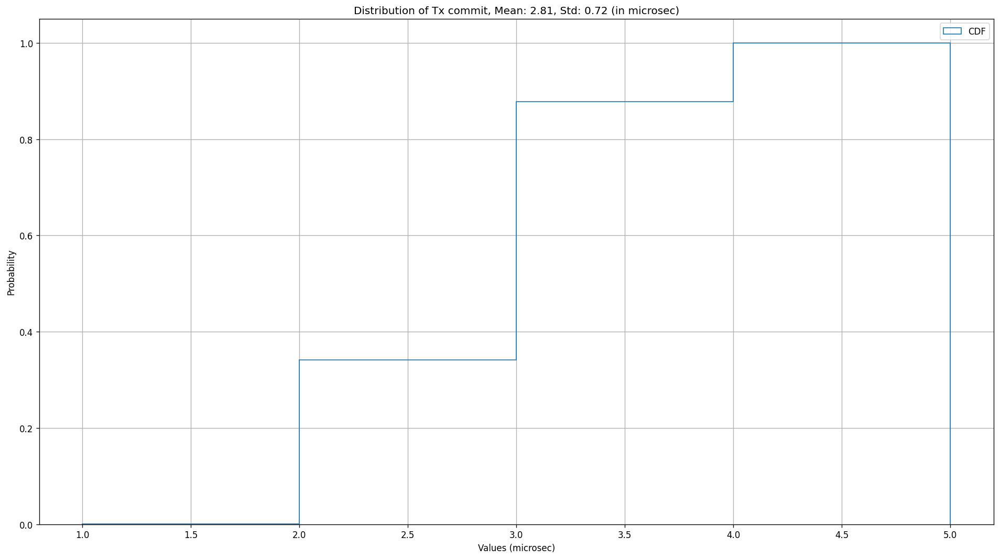

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
1,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
2,2,0,1,50,4.0,4,0,0,0,0,0,2,0,67
3,2,2,1,50,4.0,4,0,2,0,2,66,4,0,67
4,2,0,1,50,5.0,4,0,0,0,0,0,2,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
9996,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
9997,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67


OU - Tx commit Targets shape: (10000,)


0       4854
1       4620
2       4801
3       4857
4       4444
        ... 
9995    2578
9996    4321
9997    3610
9998    3102
9999    2631
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1344/0.1348
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


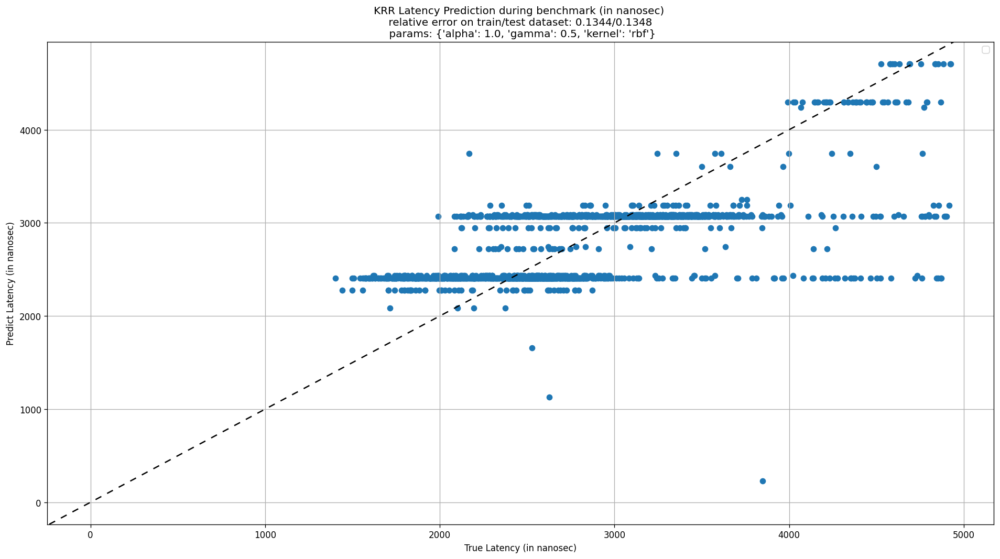

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.15551283 -0.15606524
 -0.15633904 -0.15670389 -0.15204758 -0.1519193  -0.15202567 -0.15226005
 -0.15004548 -0.14915341 -0.14882823 -0.14883804 -0.14881244 -0.14674416
 -0.14579115 -0.1452352 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1452/0.1433
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


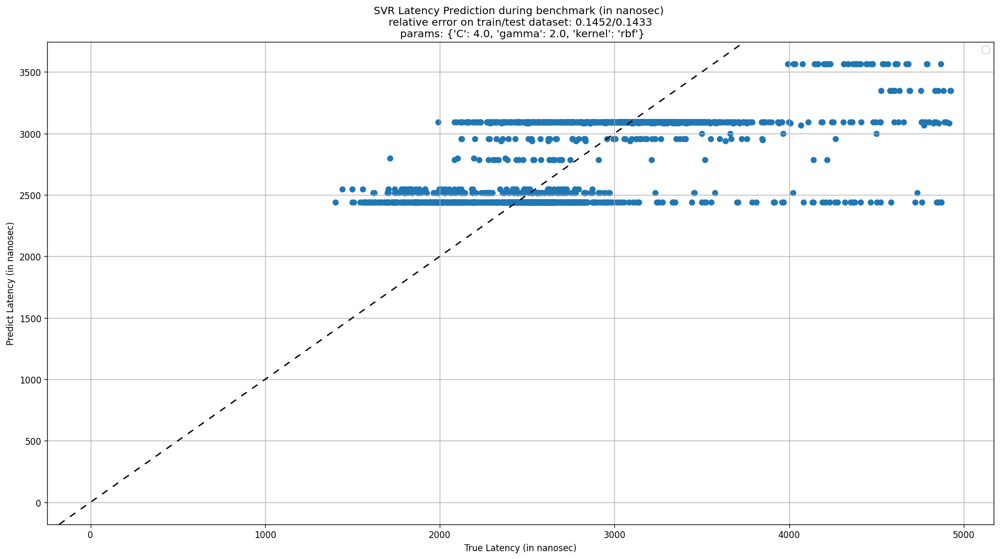

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1483/0.1473
Best Params: {'alpha': 1, 'epsilon': 1.35}


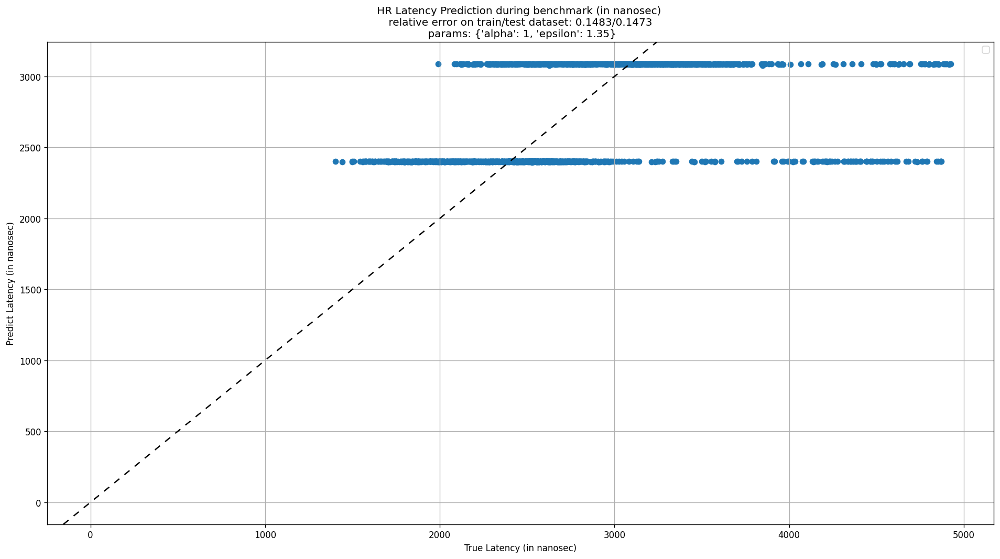

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.134/0.134
Best Params: {'criterion': 'mse', 'max_depth': 7, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


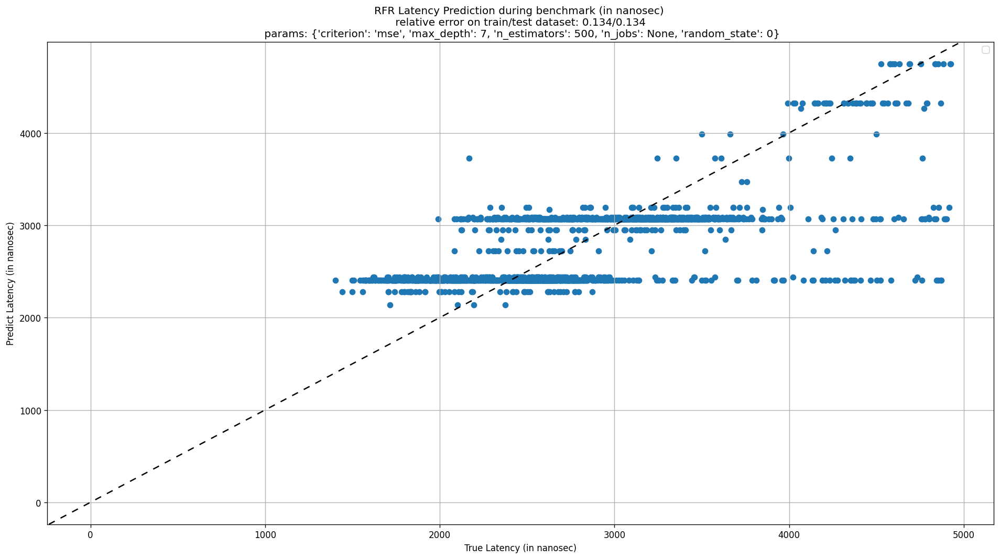

In microsec, Number of bins: 90, nBins: [  0.   1.   2.   3.   4.   5.   6.   9.  10.  13.  46.  47.  48.  49.
  50.  51.  52.  53.  54.  55.  56.  57.  58.  59.  60.  61.  62.  63.
  64.  65.  66.  67.  68.  69.  70.  71.  72.  73.  74.  75.  76.  77.
  78.  79.  80.  81.  82.  83.  84.  85.  86.  87.  88.  89.  90.  91.
  92.  93.  94.  95.  96.  97.  98.  99. 100. 101. 102. 103. 104. 105.
 106. 107. 109. 110. 114. 119. 131. 133. 139. 156. 166. 168. 169. 172.
 193. 228. 280. 342. 349. 388.]
Mean Latency: 28.62, Std Latency: 28.99 (microsec)


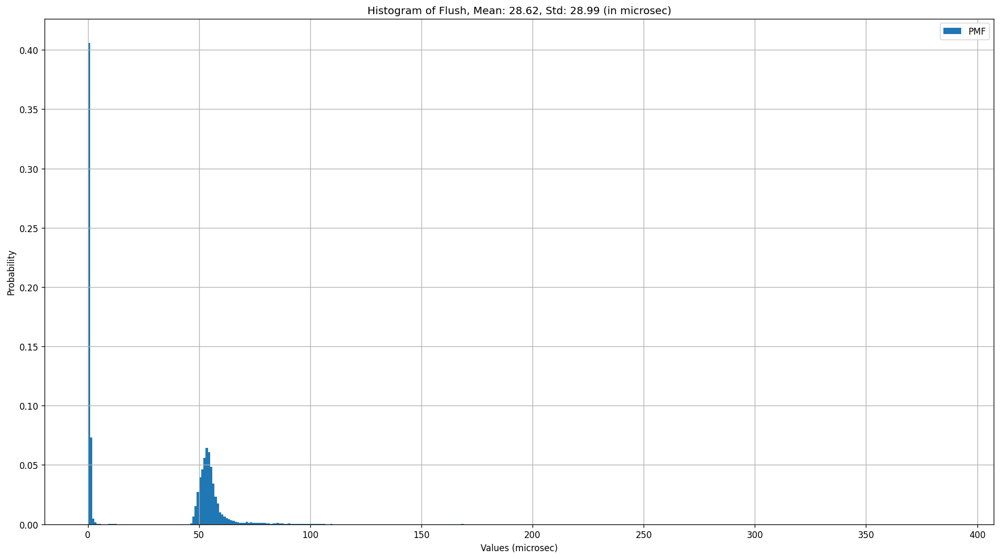

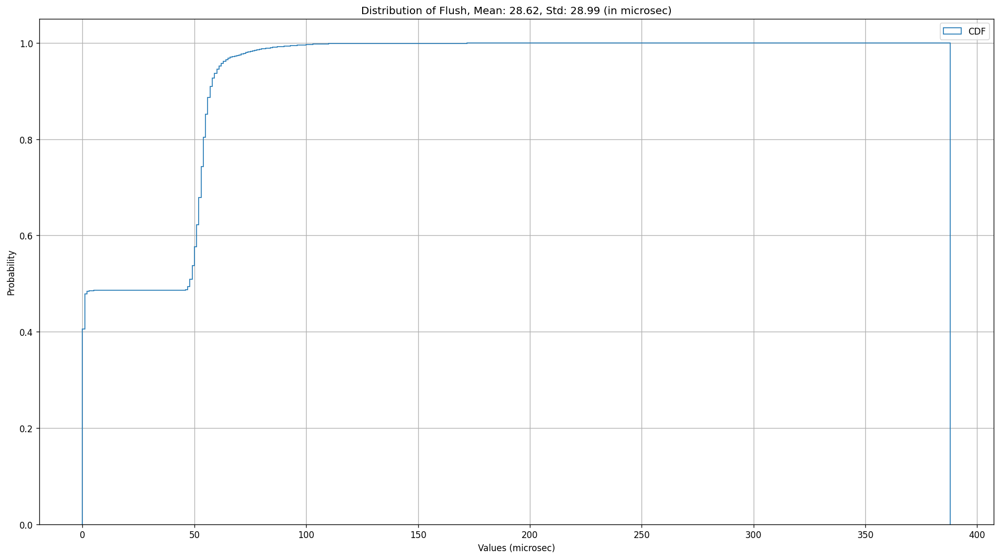

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,2,1,50,3.0,4,0,2,0,2,66,4,0,38
1,2,2,1,50,3.0,4,0,2,0,2,66,4,0,41
2,2,2,1,50,2.0,4,0,2,0,2,66,4,0,61
3,2,2,1,50,2.0,4,0,2,0,2,66,4,0,65
4,2,0,1,50,3.0,4,0,0,0,0,0,2,0,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
9996,2,0,1,50,5.0,4,0,0,0,0,0,2,0,67
9997,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67


OU - Flush Targets shape: (10000,)


0       387859
1       348808
2       280493
3       341580
4         4688
         ...  
9995       400
9996       390
9997     57561
9998     53388
9999       341
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1498/0.1539
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


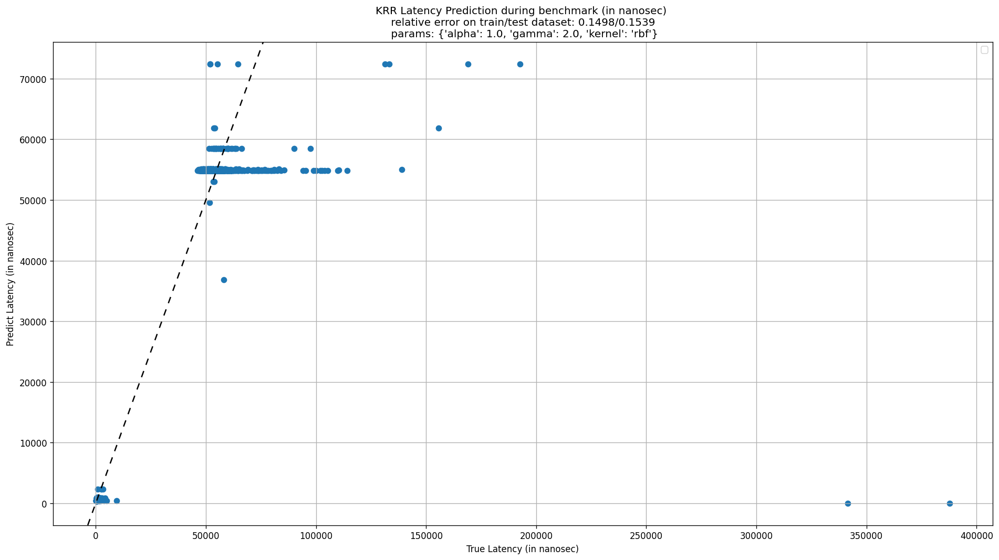

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [         nan          nan          nan          nan -54.77338553
 -54.9885957  -55.04658859 -55.10341564 -52.25495468 -52.64902898
 -52.76046483 -52.86092711 -46.98384966 -47.70365064 -47.92316845
 -48.12228215 -36.34079347 -37.78039542 -38.21943105 -38.61765846]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 36.3408/31.7461
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


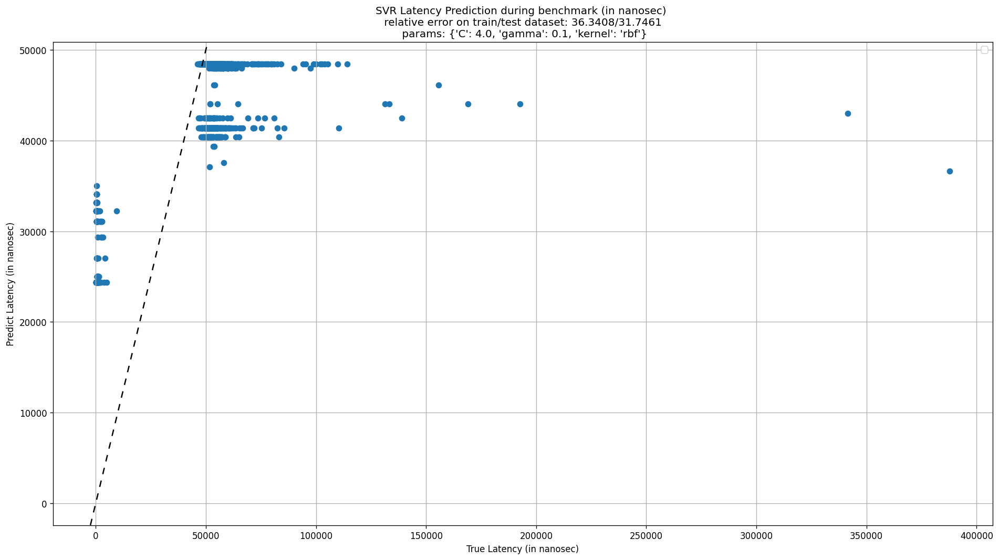

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1221/0.1239
Best Params: {'alpha': 0, 'epsilon': 1.1}


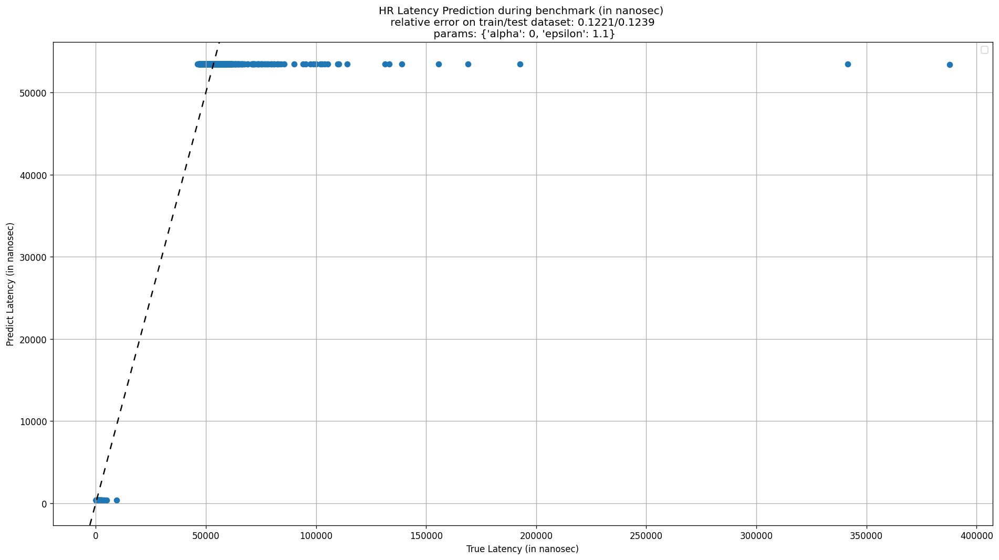

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1106/0.1107
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


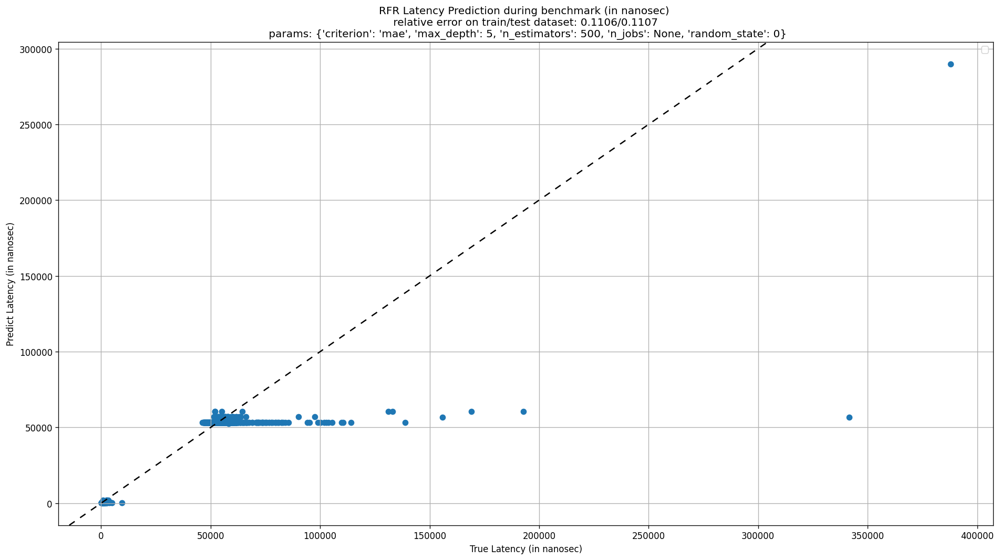

In microsec, Number of bins: 4, nBins: [0. 1. 2. 3.]
Mean Latency: 1.42, Std Latency: 0.68 (microsec)


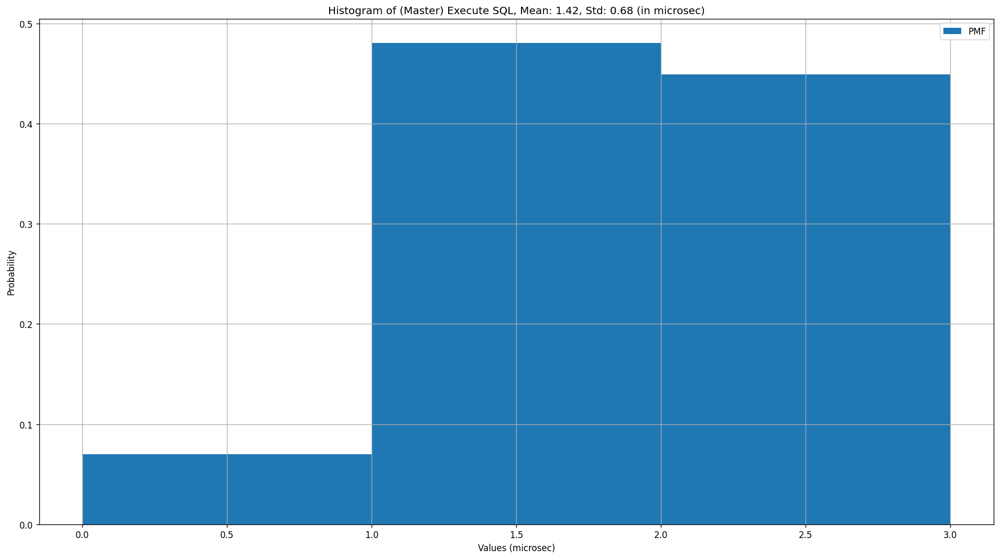

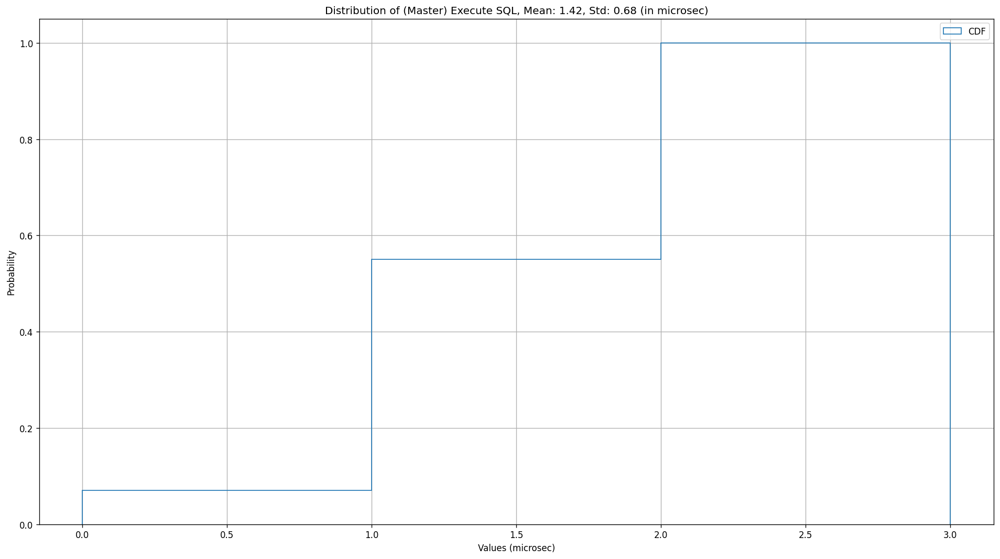

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,0,1,50,3.0,4,0,0,0,0,0,2,0,67
1,2,0,1,50,4.0,4,0,0,0,0,0,2,0,67
2,2,0,1,50,4.0,4,0,0,0,0,0,2,0,67
3,2,0,1,50,4.0,4,0,0,0,0,0,2,0,67
4,2,0,1,50,3.0,4,0,0,0,0,0,2,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
9996,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
9997,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9998,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       2338
1       2686
2       2355
3       2279
4       2660
        ... 
9995    1267
9996    1916
9997    2325
9998    2462
9999    2117
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1833/0.1887
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


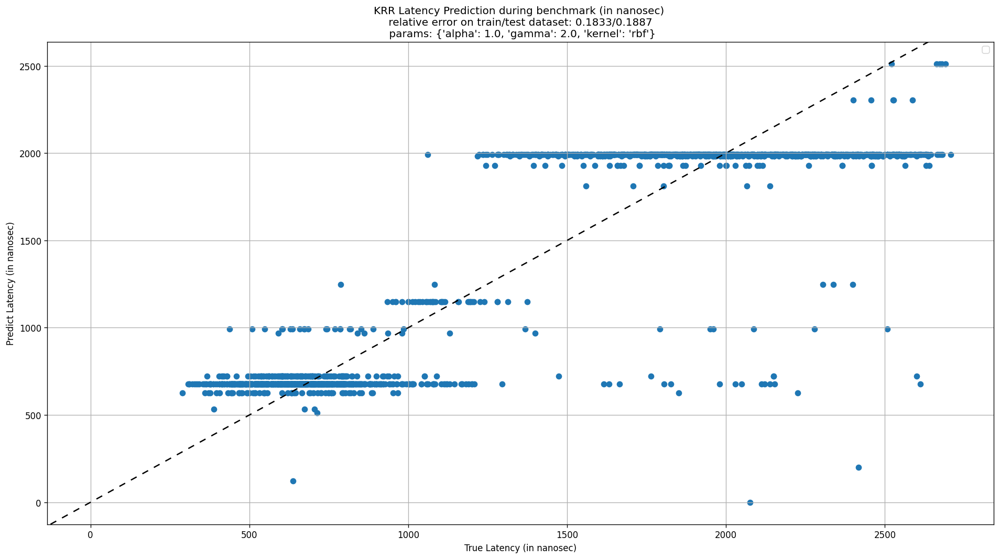

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.24942065 -0.26355547
 -0.26731408 -0.27170566 -0.20869703 -0.21618502 -0.22198687 -0.22941007
 -0.1928521  -0.19456009 -0.19849775 -0.20420249 -0.18584511 -0.18552561
 -0.18773971 -0.19076505]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1855/0.1875
Best Params: {'C': 4.0, 'gamma': 0.5, 'kernel': 'rbf'}


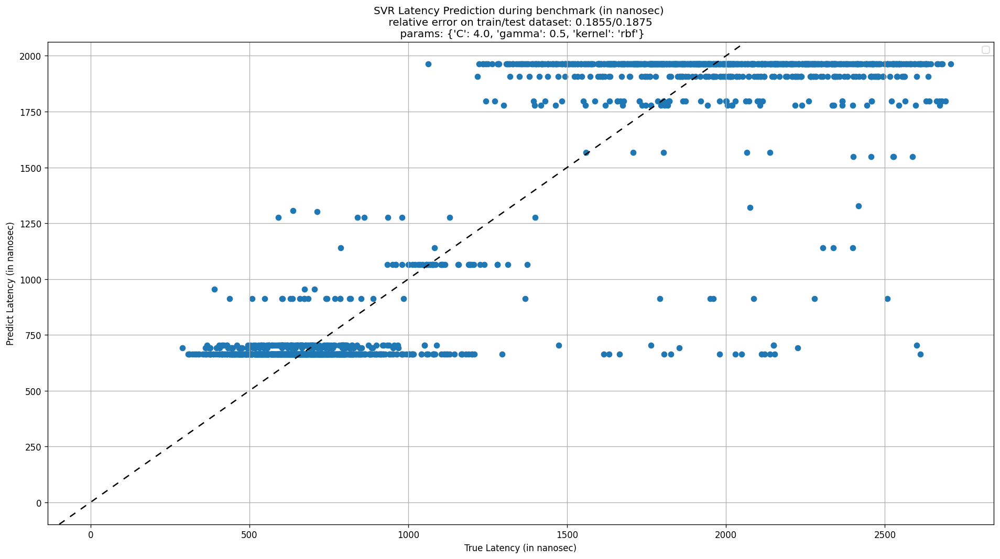

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1861/0.1892
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


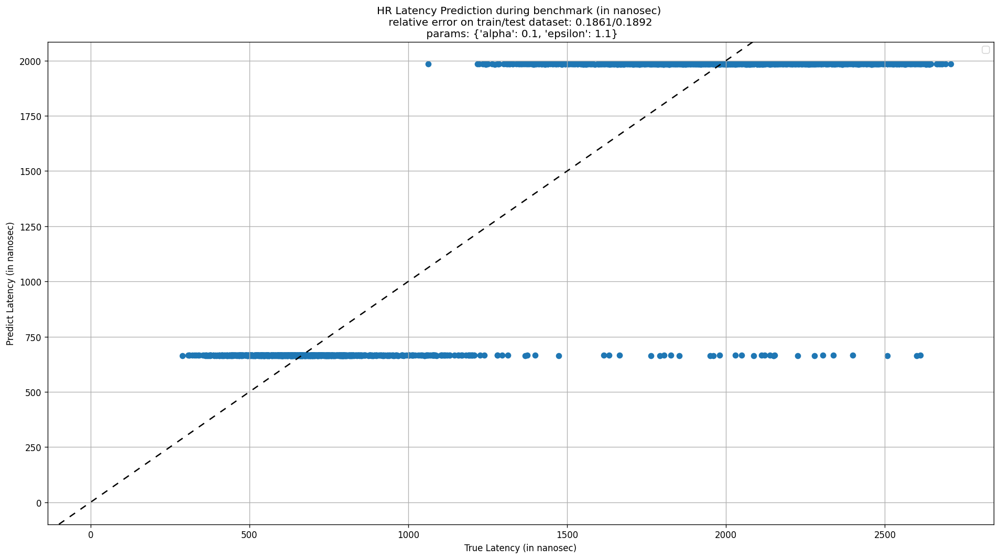

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1742/0.1791
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


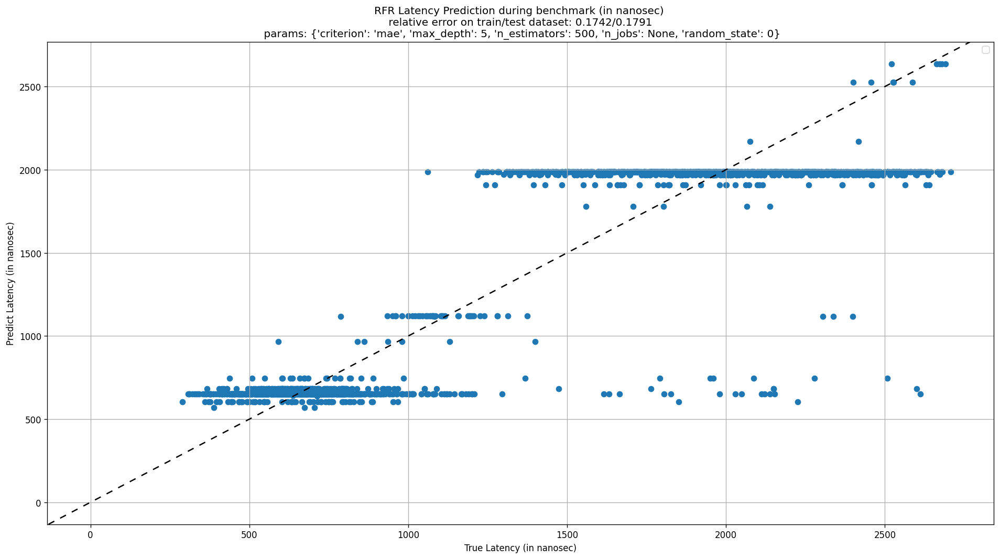

In microsec, Number of bins: 31, nBins: [ 5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21. 22.
 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.]
Mean Latency: 14.07, Std Latency: 6.36 (microsec)


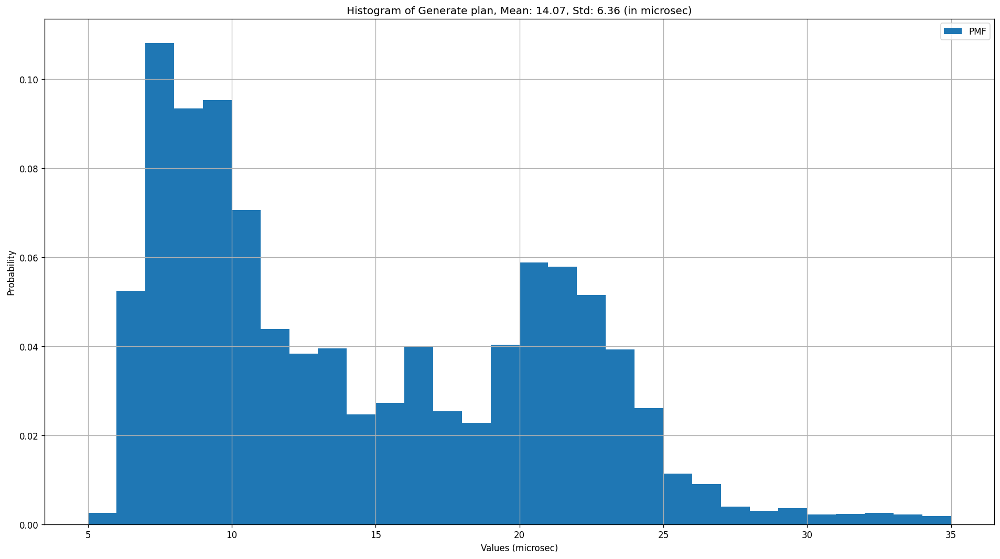

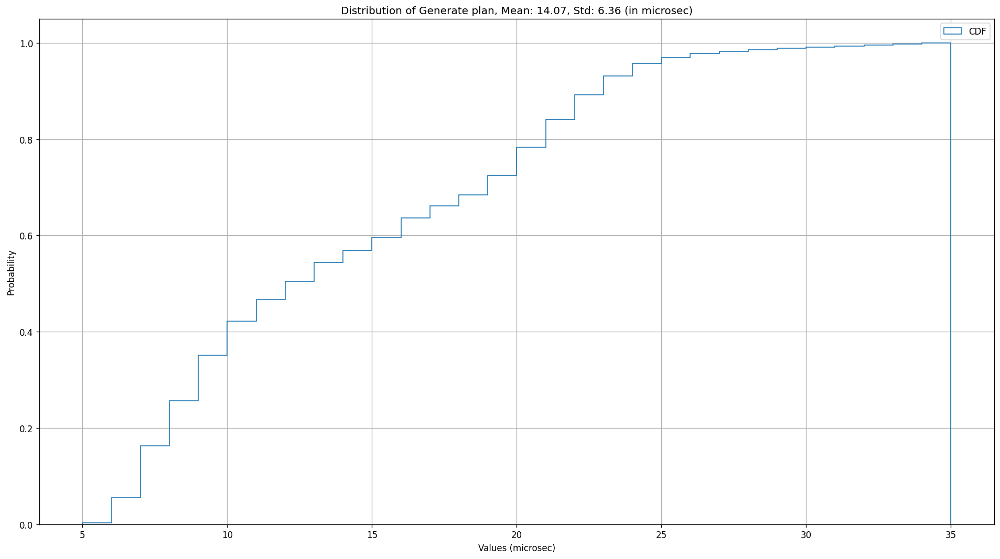

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
1,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
2,2,0,1,50,4.0,4,0,0,0,0,0,2,0,67
3,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
4,2,0,1,50,2.0,4,0,0,0,0,0,2,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,2,1,50,0.0,4,0,2,0,2,66,4,0,67
9996,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67
9997,2,2,1,50,5.0,4,0,2,0,2,66,4,0,67
9998,2,0,1,50,0.0,4,0,0,0,0,0,2,0,67


OU - Generate plan Targets shape: (10000,)


0       30729
1       32107
2       21854
3       21500
4       32259
        ...  
9995    14999
9996    16916
9997    20261
9998     7346
9999    21678
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.2929/0.2953
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


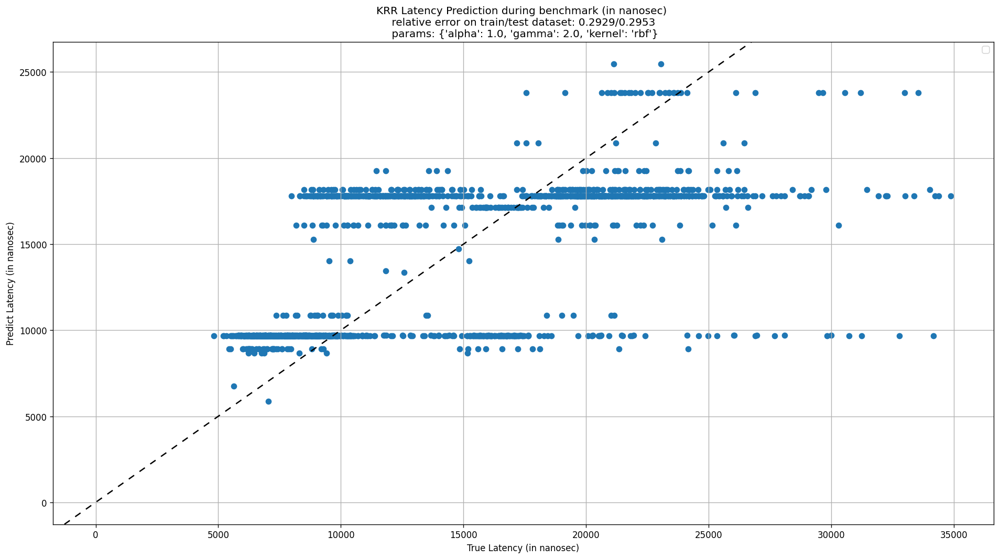

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.37618346 -0.37904127
 -0.37955362 -0.38006554 -0.34702933 -0.35109116 -0.35190509 -0.35252765
 -0.31849261 -0.32246612 -0.32396834 -0.32527777 -0.29804301 -0.30262409
 -0.30504464 -0.30717726]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.298/0.2975
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


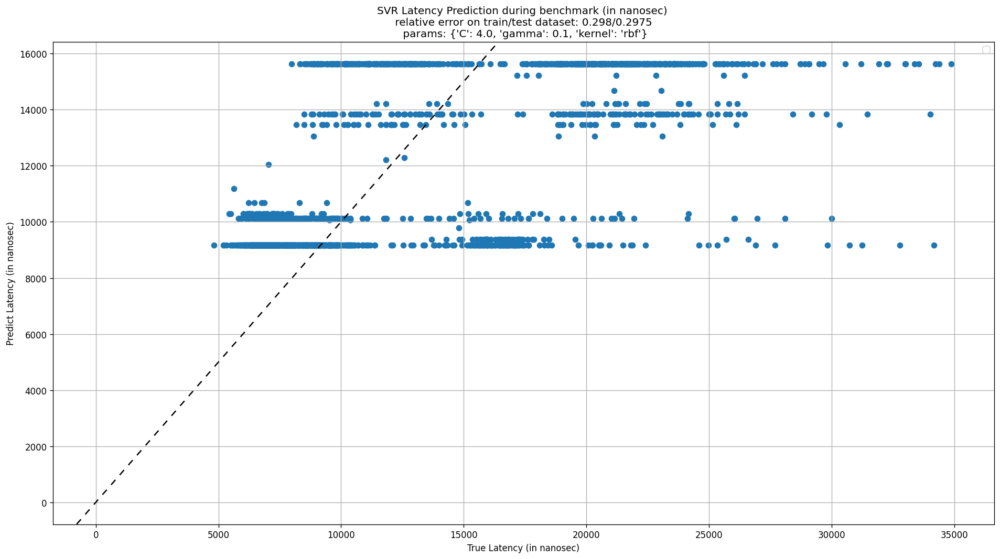

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.2813/0.2869
Best Params: {'alpha': 1, 'epsilon': 1.1}


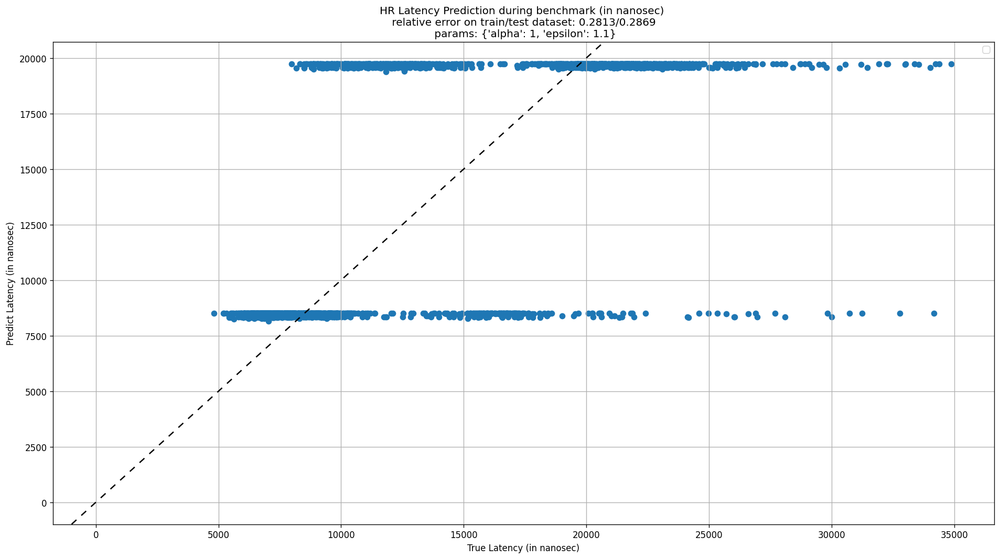

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.265/0.2677
Best Params: {'criterion': 'mae', 'max_depth': 7, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


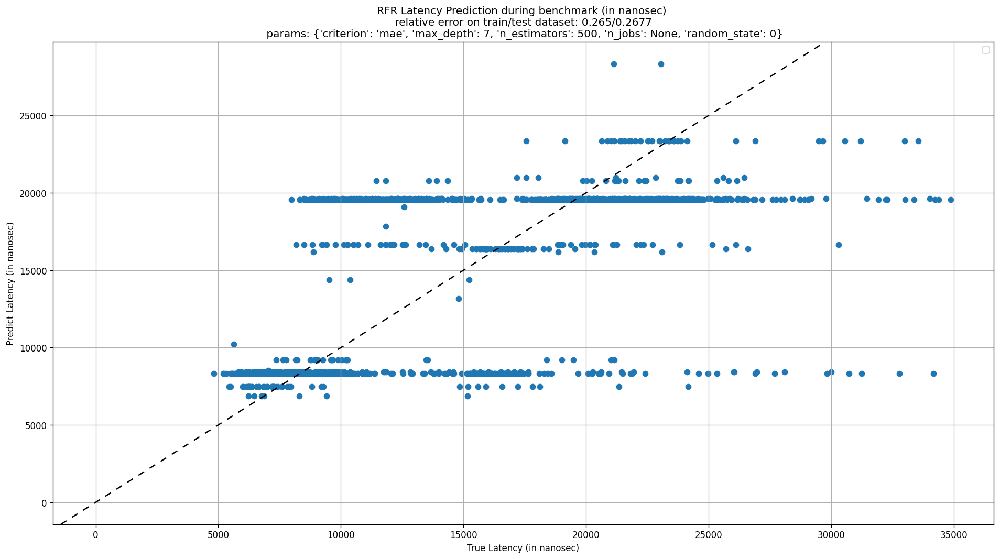

Records: Time of Each Component with shape: (39830, 17)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of Read-Only Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp,Average Time Of R/W Txn
0,1,224127752,2414005791618984,8095209,445127,209767511,262310,208773186,30226,133720,4053,73471,461510,439386,4196,2414006005950037,0
1,2,19990010,2414006106905308,1159354,461345,17639392,111493,16043643,24418,83616,700,23639,1341026,1324368,5692,2414006124773209,0
2,3,16097730,2414006139219303,946774,1258601,13126976,84483,12823424,19593,84027,770,23796,81184,58002,13728,2414006152568471,0
3,4,12745181,2414006162830300,540032,507563,10864956,68889,10599342,20328,76838,795,22950,67652,54880,4072,2414006174192636,0
4,5,10963906,2414006182586489,745817,471869,9445128,75773,9159122,20496,68595,818,22134,89117,74747,4685,2414006192163057,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39825,39826,4963754,2414305681598500,2287990,46810,2536168,20883,2461211,4248,21178,107,3346,22381,18664,1227,2414305684192212,0
39826,39827,4992543,2414305694254464,2136469,40325,2711891,25738,2619197,4950,34429,117,3071,21381,17682,1099,2414305697033247,0
39827,39828,4819803,2414305702219483,2167137,45875,2509748,22249,2436124,4176,19764,114,2810,21162,17538,979,2414305704785471,0
39828,39829,4812310,2414305714507557,2009768,48975,2671311,25556,2589562,4797,22923,174,2824,22150,18393,1119,2414305717224535,0


Features: Features with shape: (39830, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,100,0,1,50,0.0,200,0,0,0,0,0,100,0,22
1,2,322965261,100,0,1,50,0.0,200,0,0,0,0,0,100,0,25
2,3,354652774,100,0,1,50,2.0,200,0,0,0,0,0,100,0,26
3,4,379629291,100,0,1,50,2.0,200,0,0,0,0,0,100,0,27
4,5,399381235,100,0,1,50,2.0,200,0,0,0,0,0,100,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39825,39826,299897411407,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
39826,39827,299910223682,100,0,1,50,0.0,200,0,0,0,0,0,100,0,67
39827,39828,299918148526,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
39828,39829,299930595106,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


In microsec, Number of bins: 15, nBins: [19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33.]
Mean Latency: 22.51, Std Latency: 2.32 (microsec)


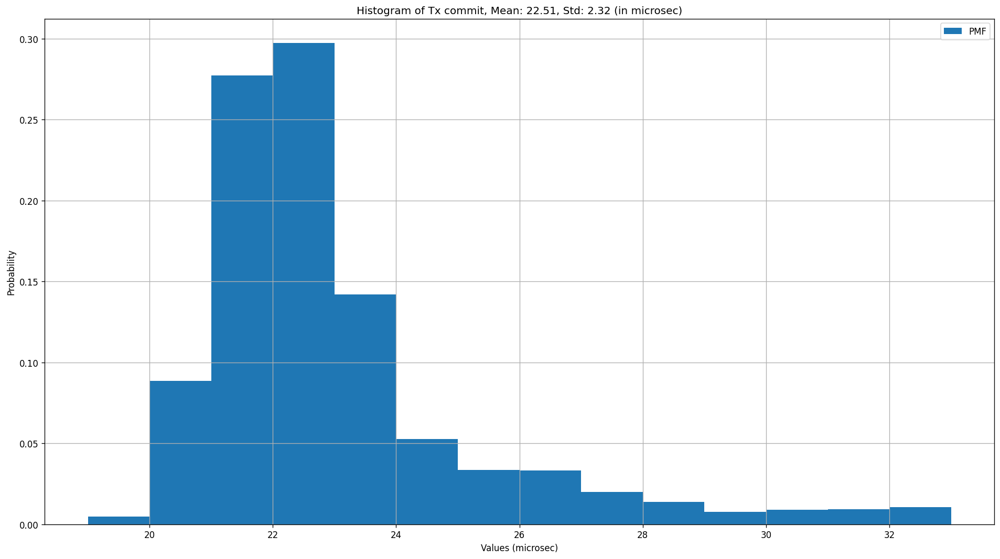

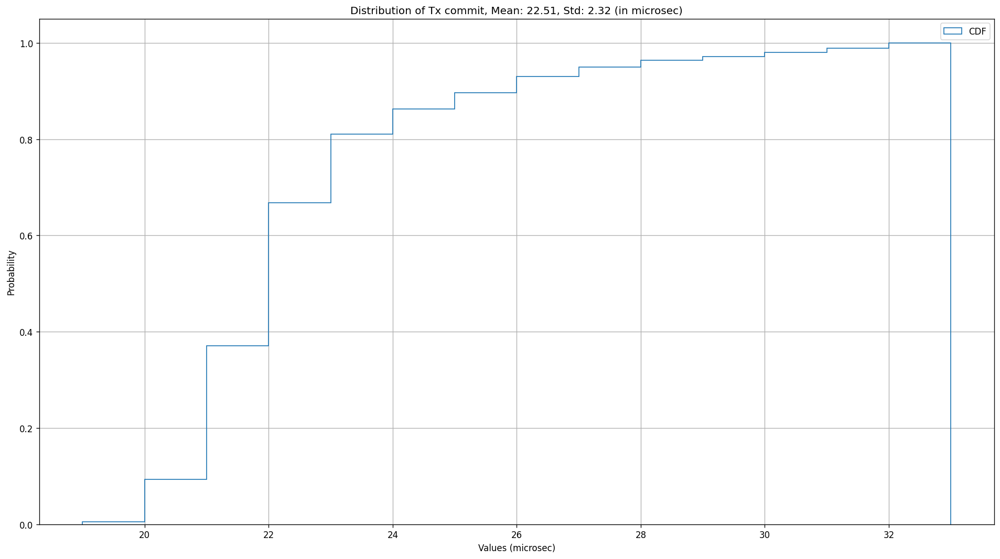

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,4.0,200,0,0,0,0,0,100,0,67
1,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
2,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - Tx commit Targets shape: (10000,)


0       32296
1       30754
2       31046
3       30636
4       31620
        ...  
9995    22018
9996    22506
9997    23782
9998    24571
9999    21162
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0651/0.0663
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


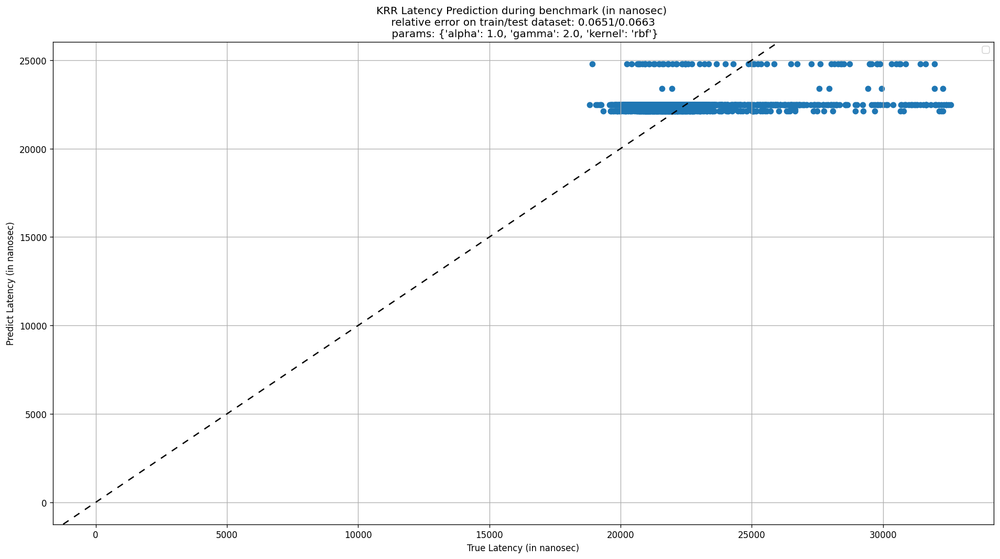

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.0597822  -0.05977018
 -0.05975938 -0.05974612 -0.05977276 -0.05975291 -0.05973274 -0.05971357
 -0.05976011 -0.05972835 -0.05969065 -0.05966868 -0.05974673 -0.05968737
 -0.05962646 -0.05959661]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0596/0.0613
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


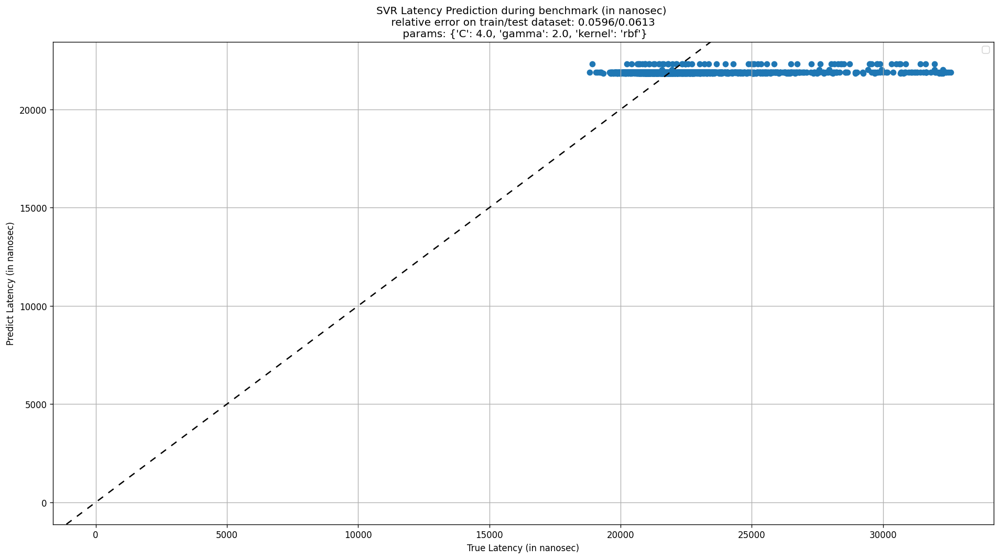

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0598/0.0615
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


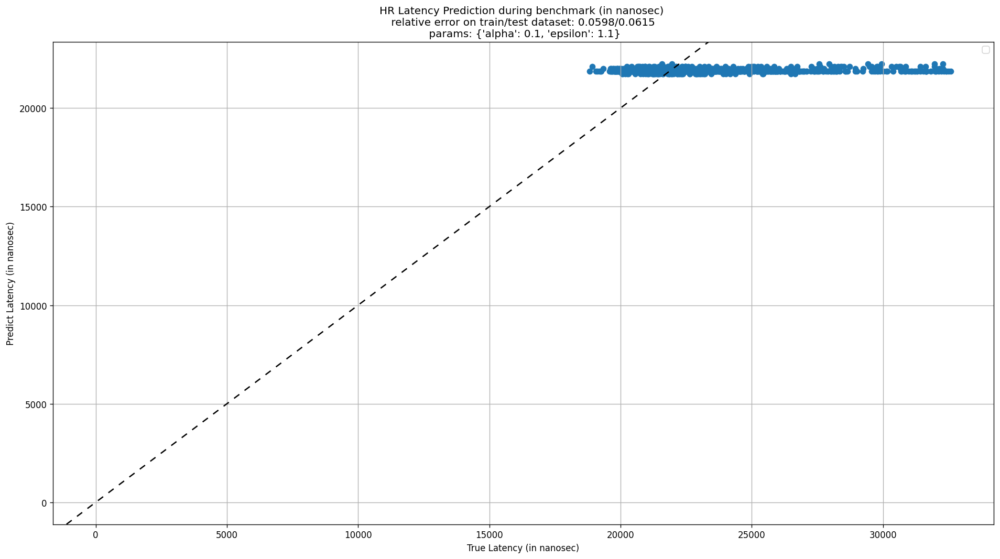

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0594/0.0614
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


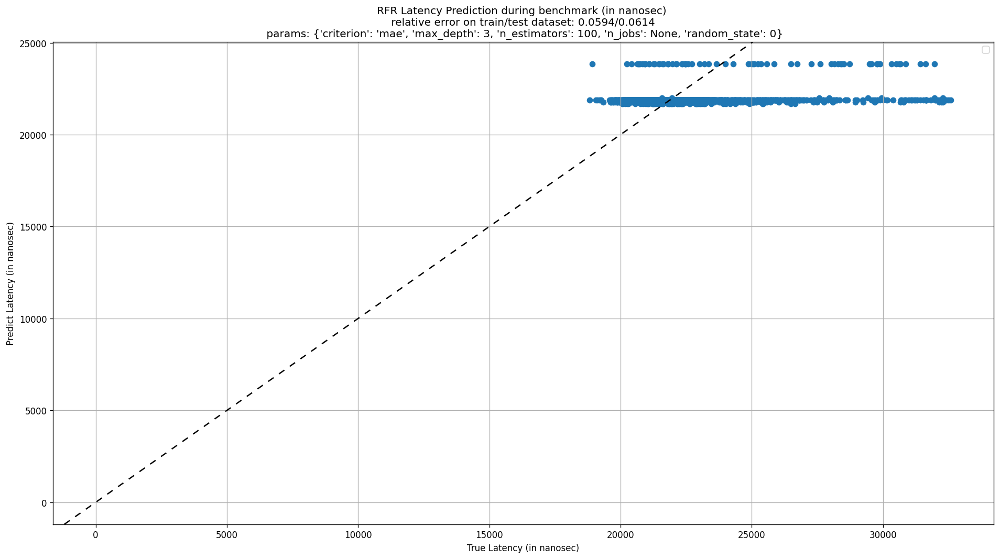

In microsec, Number of bins: 32, nBins: [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 18. 19. 20.
 21. 22. 23. 24. 25. 30. 33. 37. 45. 54. 55. 74. 75. 76.]
Mean Latency: 3.28, Std Latency: 2.15 (microsec)


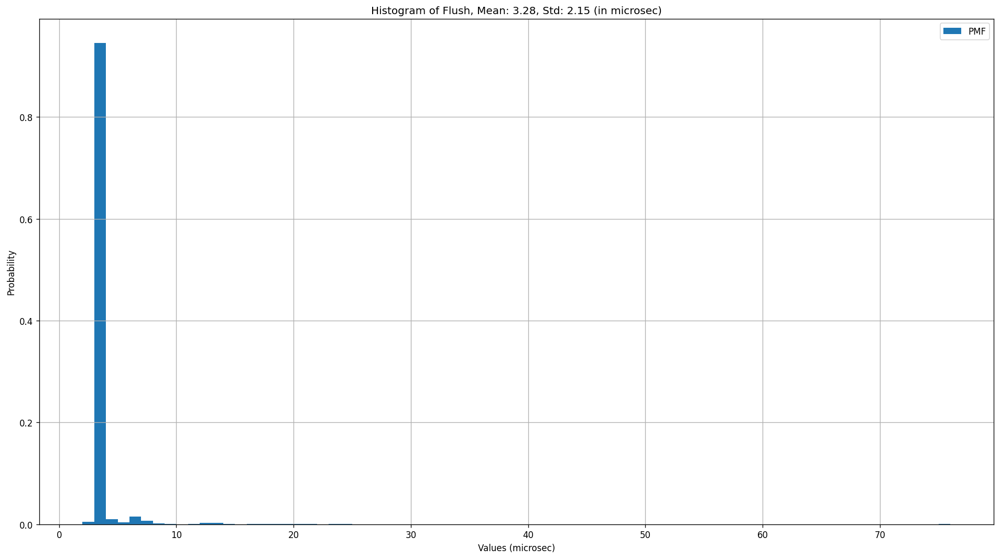

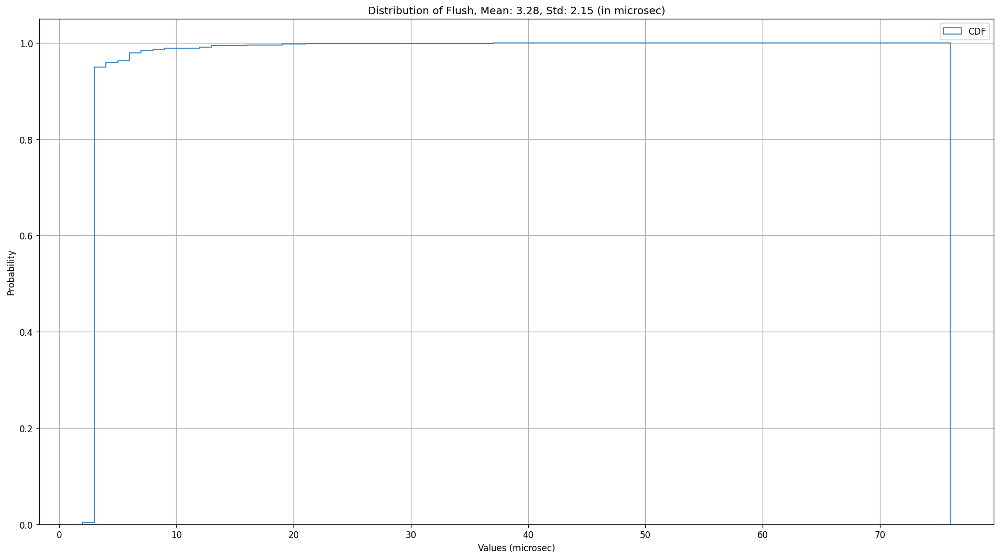

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,1.0,200,0,0,0,0,0,100,0,30
1,100,0,1,50,3.0,200,0,0,0,0,0,100,0,35
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,37
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,38
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - Flush Targets shape: (10000,)


0       18936
1       17970
2       19144
3       19194
4       18640
        ...  
9995     2949
9996     2719
9997     2826
9998     2875
9999     2969
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1126/0.1095
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


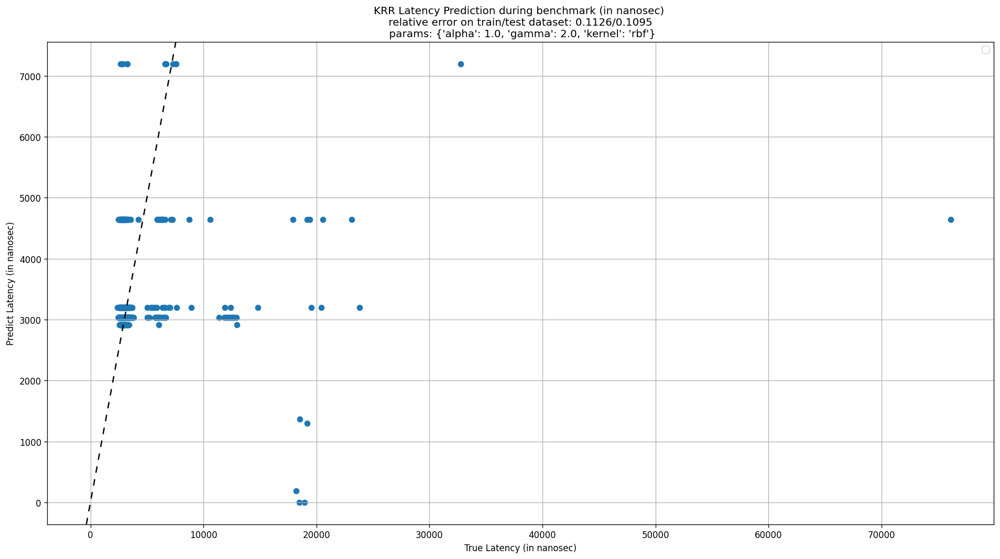

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.07449585 -0.07446589
 -0.07443734 -0.0744238  -0.0744952  -0.07444562 -0.07442737 -0.07442873
 -0.07448991 -0.07445067 -0.07446373 -0.07446711 -0.07448161 -0.07447762
 -0.07451181 -0.0745203 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0744/0.0783
Best Params: {'C': 0.5, 'gamma': 2.0, 'kernel': 'rbf'}


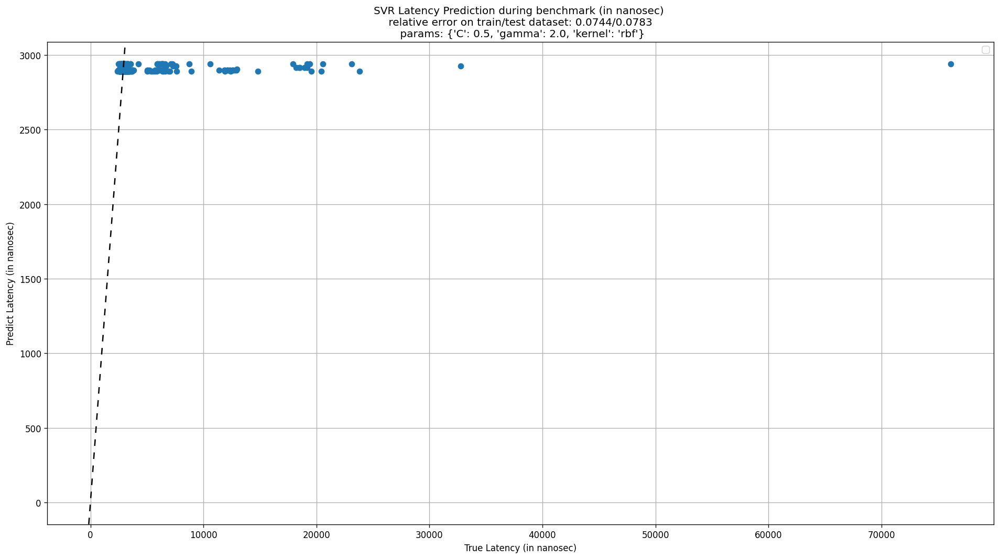

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0741/0.0775
Best Params: {'alpha': 0.01, 'epsilon': 1.1}


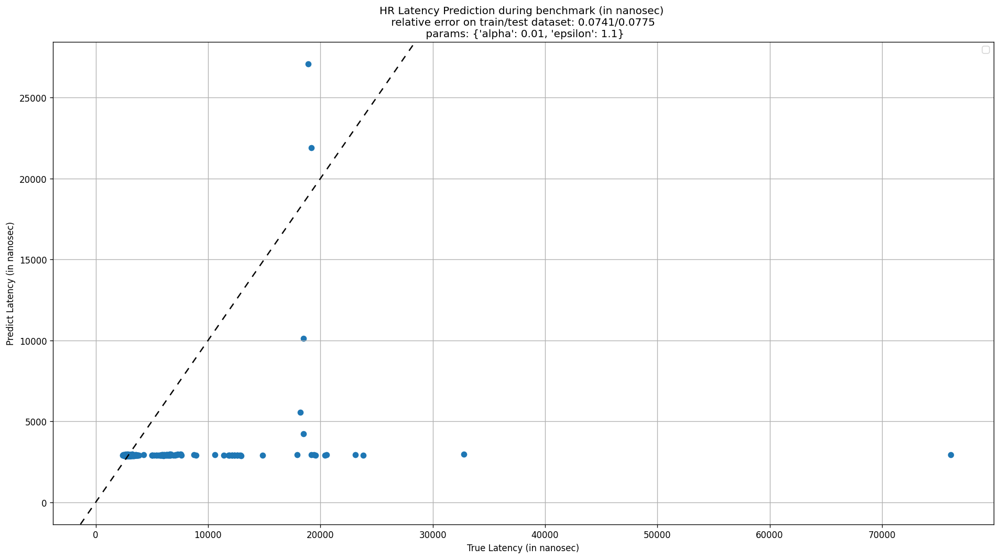

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0747/0.0772
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


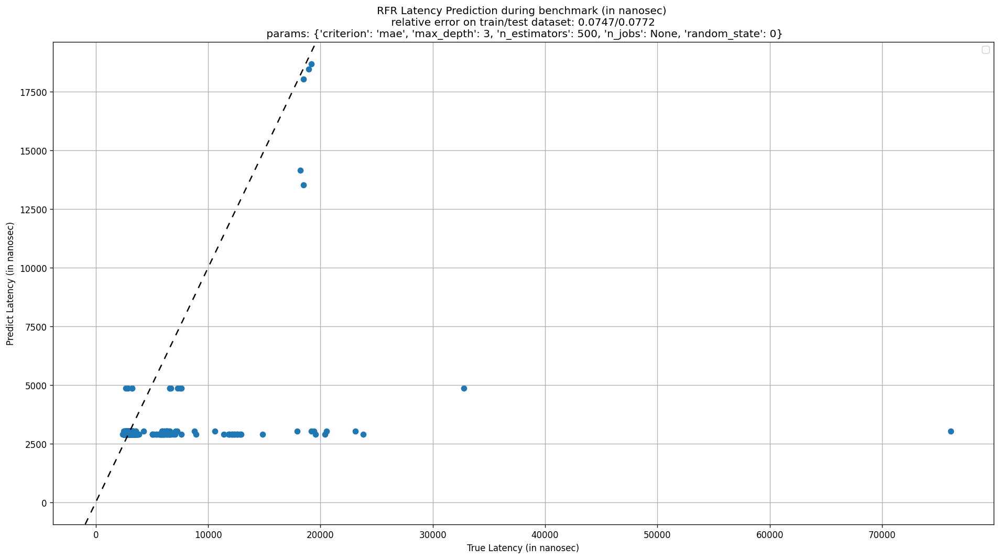

In microsec, Number of bins: 14, nBins: [15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28.]
Mean Latency: 20.57, Std Latency: 1.64 (microsec)


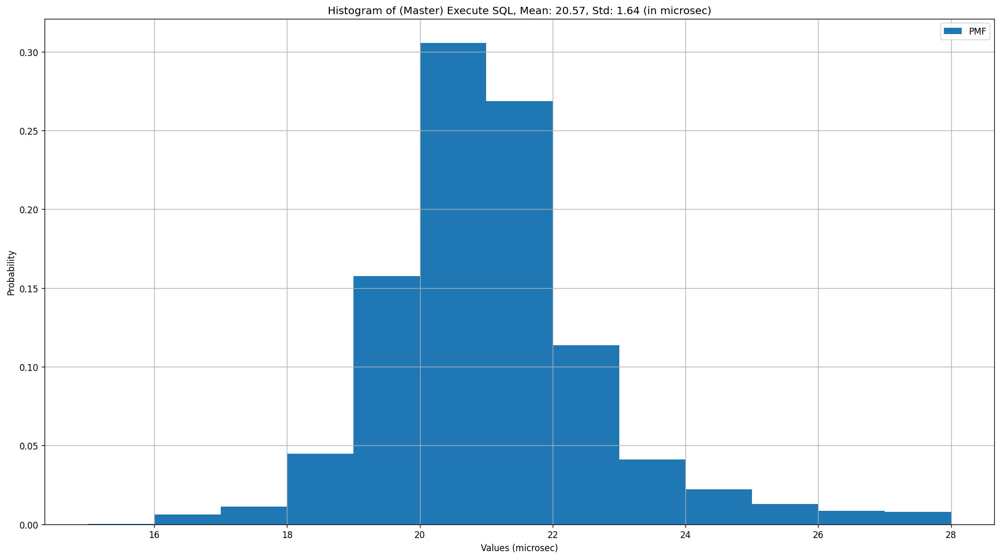

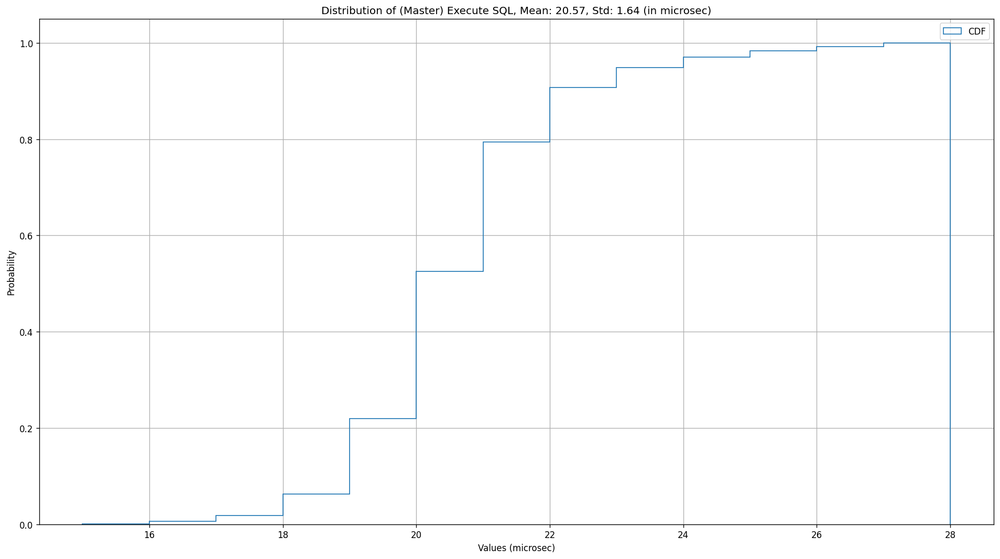

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
1,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
2,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,4.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       27461
1       25430
2       21625
3       26978
4       26550
        ...  
9995    19788
9996    20762
9997    19919
9998    20672
9999    19764
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0558/0.0556
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


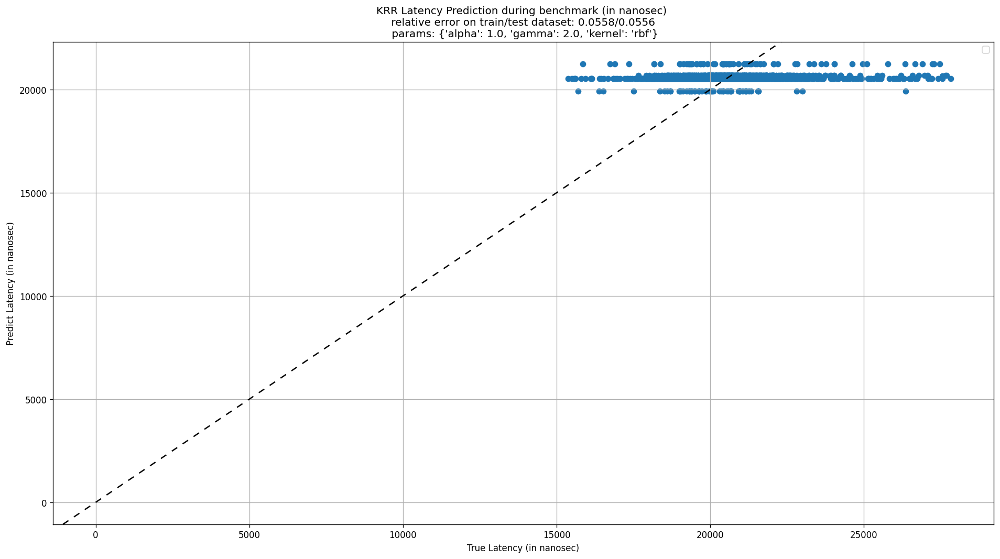

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.05520918 -0.05519641
 -0.05519374 -0.05519236 -0.05519551 -0.05517413 -0.05516783 -0.05516329
 -0.05517286 -0.05514118 -0.0551282  -0.05511971 -0.05514395 -0.0551132
 -0.05508299 -0.05506968]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0551/0.0551
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


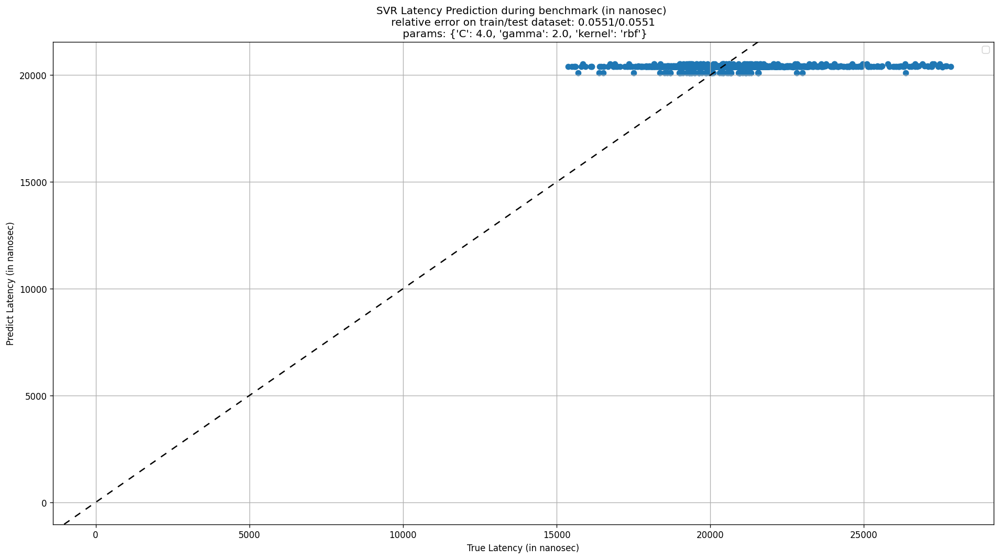

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0552/0.0551
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


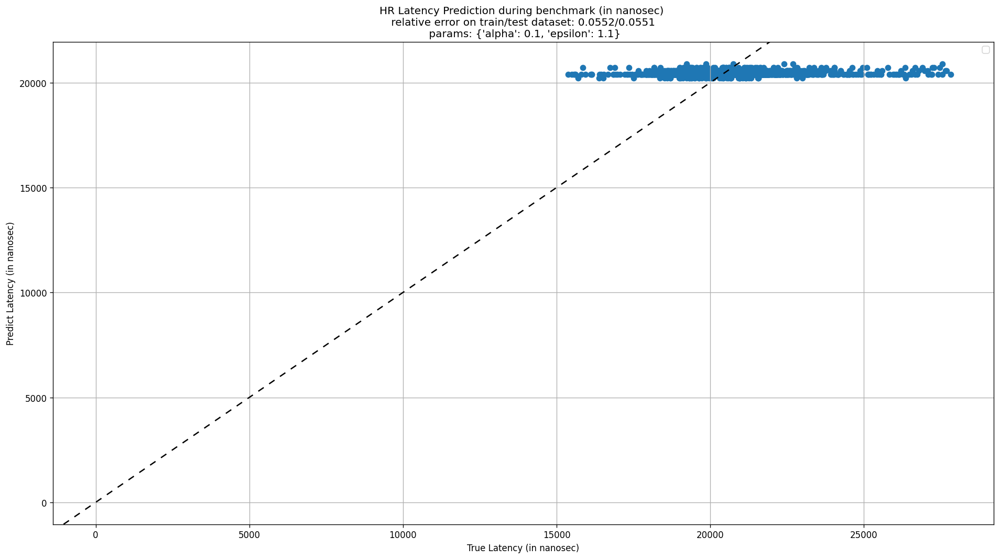

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.055/0.0551
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


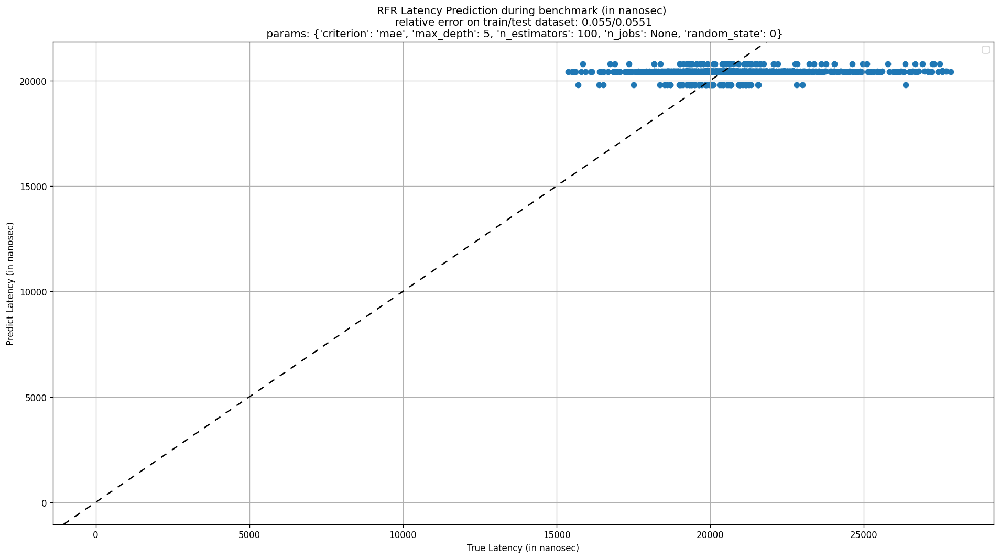

In microsec, Number of bins: 1014, nBins: [ 802.  803.  804. ... 1815. 1816. 1817.]
Mean Latency: 1347.43, Std Latency: 250.0 (microsec)


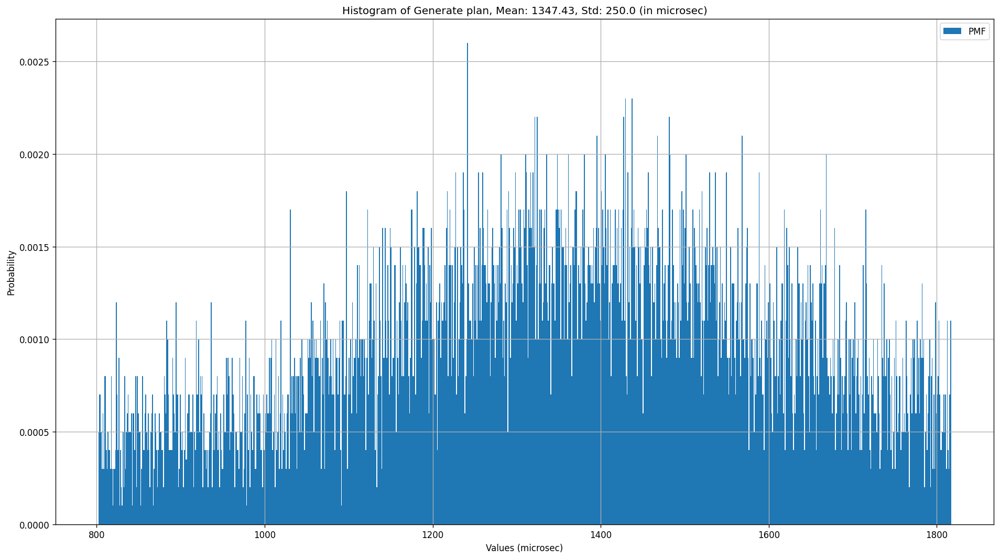

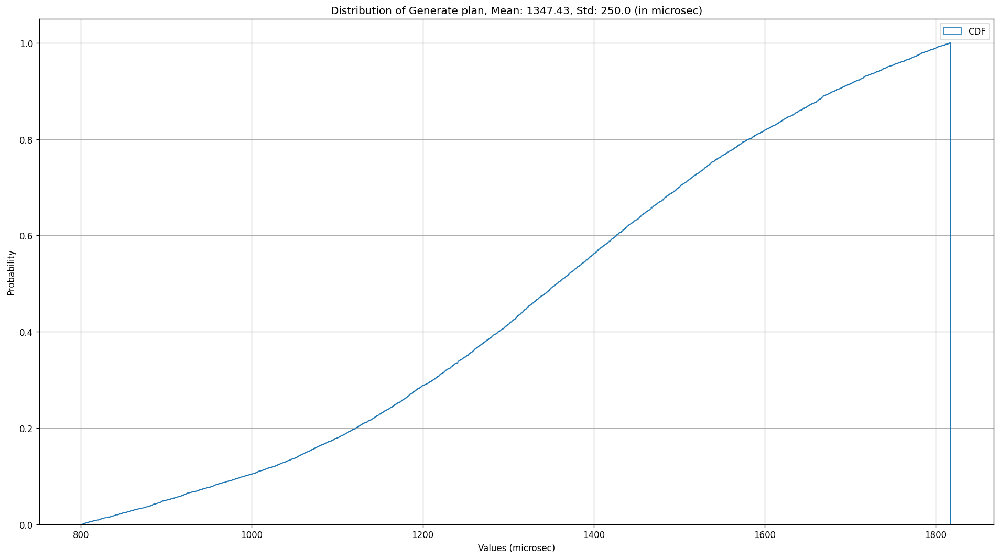

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,2.0,200,0,0,0,0,0,100,0,26
1,100,0,1,50,3.0,200,0,0,0,0,0,100,0,53
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67


OU - Generate plan Targets shape: (10000,)


0        946774
1       1066310
2        834564
3        836158
4        874266
         ...   
9995    1695053
9996    1782975
9997    1755048
9998    1680008
9999    1806014
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1597/0.167
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


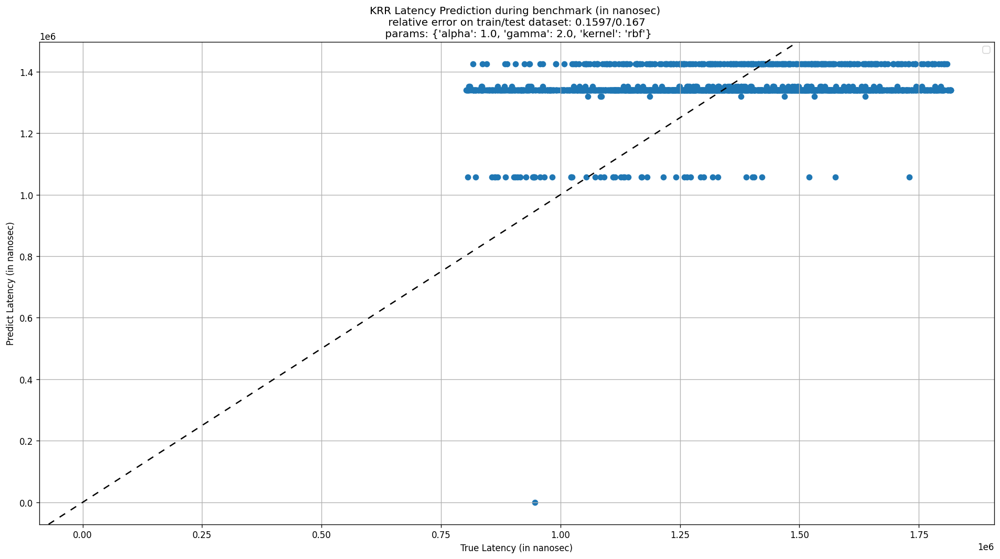

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.1660515  -0.16605024
 -0.16604792 -0.16604479 -0.16605151 -0.16604899 -0.16604347 -0.16603823
 -0.16605152 -0.1660456  -0.16603542 -0.16601769 -0.16605154 -0.16603985
 -0.16601224 -0.1659985 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.166/0.1722
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


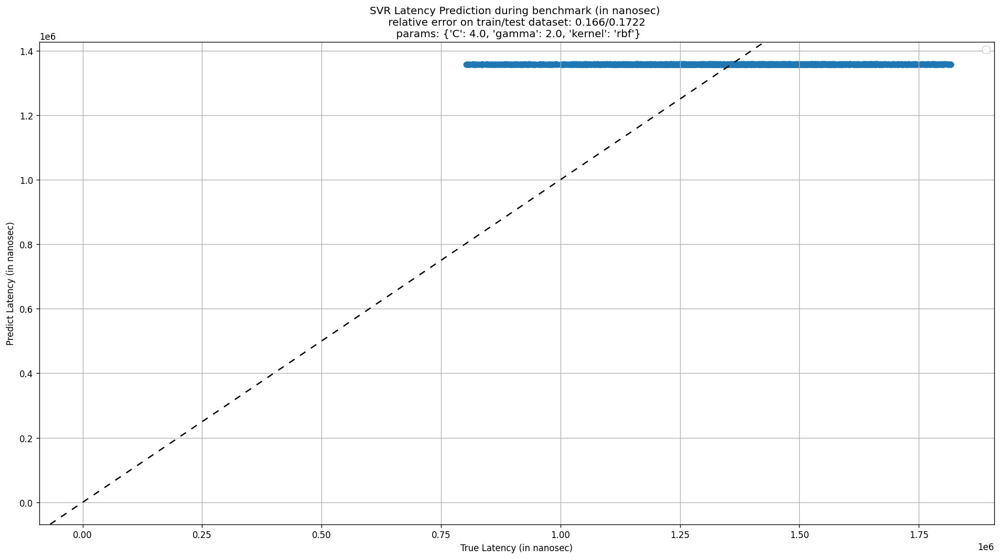

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.165/0.1712
Best Params: {'alpha': 0.1, 'epsilon': 5}


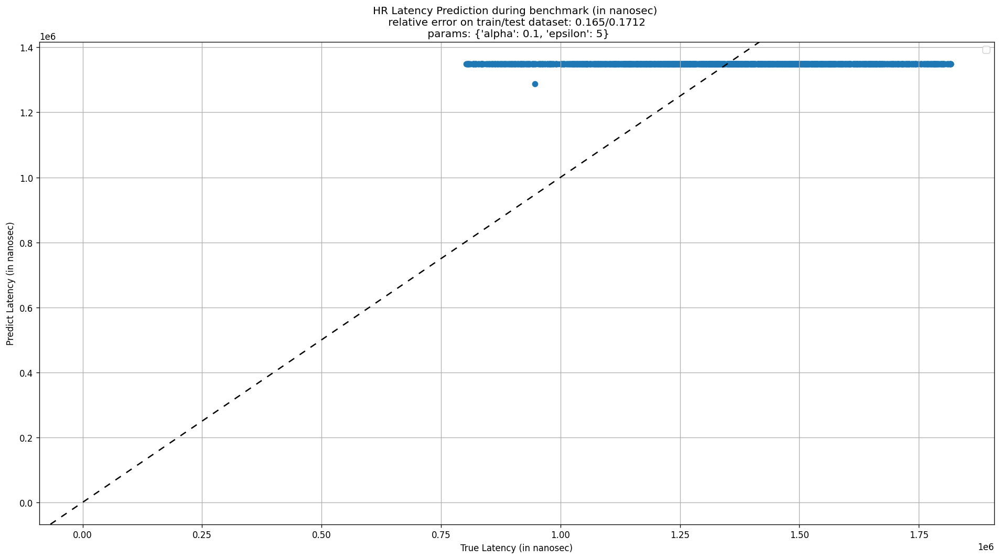

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1596/0.1668
Best Params: {'criterion': 'mse', 'max_depth': 3, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


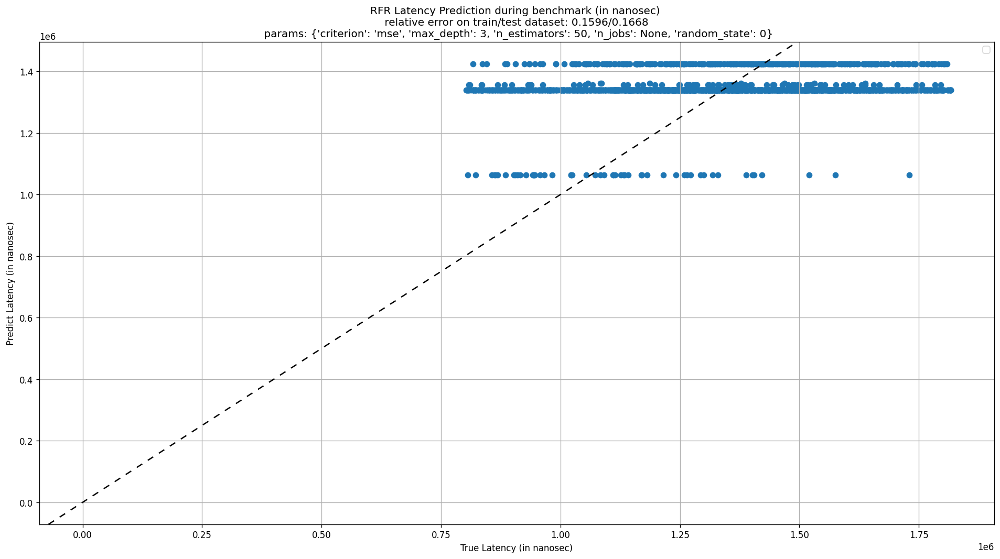

Records: Time of Each Component with shape: (98554, 16)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of R/W Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp
0,1,193826362,2419593489377024,2853088,529615,185327248,130389,182044487,16468,110399,3433,2931082,58162,43313,3800,2419593679006161
1,2,9135420,2419593771438396,346023,593692,7905205,59730,5149824,13612,40304,608,2278917,352039,337686,4456,2419593779523733
2,3,8015601,2419593786582172,393254,1776107,5474102,73038,3170557,3622,39752,620,1997475,178557,163549,5205,2419593792347334
3,4,7162954,2419593798454575,202581,1241125,5526324,48419,2775515,3618,51345,867,2266977,368180,330622,10188,2419593804087318
4,5,5061339,2419593810397837,177700,1085040,3612421,29613,1741200,3157,31508,735,1540554,254991,236450,6340,2419593814110040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98549,98550,601550,2419893414579449,37014,25015,495261,4261,248284,614,4860,40,230787,5078,3504,378,2419893415114655
98550,98551,643834,2419893417011477,40204,38108,528465,5475,274896,687,5656,118,234379,5854,3857,523,2419893417562635
98551,98552,587211,2419893419481710,27816,11652,513700,3772,252088,675,4561,88,231307,19598,17853,407,2419893420024905
98552,98553,603511,2419893421984757,36635,27112,506005,9877,259221,618,4271,57,226113,4524,3377,356,2419893422510927


Features: Features with shape: (98554, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,10,10,1,50,0.0,20,0,10,0,10,330,20,0,22
1,2,285216135,10,10,1,50,0.0,20,0,10,0,10,330,20,0,25
2,3,299158894,10,10,1,50,2.0,20,0,10,0,10,330,20,0,26
3,4,311752084,10,10,1,50,3.0,20,0,10,0,10,330,20,0,27
4,5,323876105,10,10,1,50,2.0,20,0,10,0,10,330,20,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98549,98550,299929332074,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
98550,98551,299931747429,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
98551,98552,299934266433,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
98552,98553,299936736098,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67


In microsec, Number of bins: 26, nBins: [ 4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21.
 22. 23. 24. 25. 26. 27. 30. 31.]
Mean Latency: 6.03, Std Latency: 1.65 (microsec)


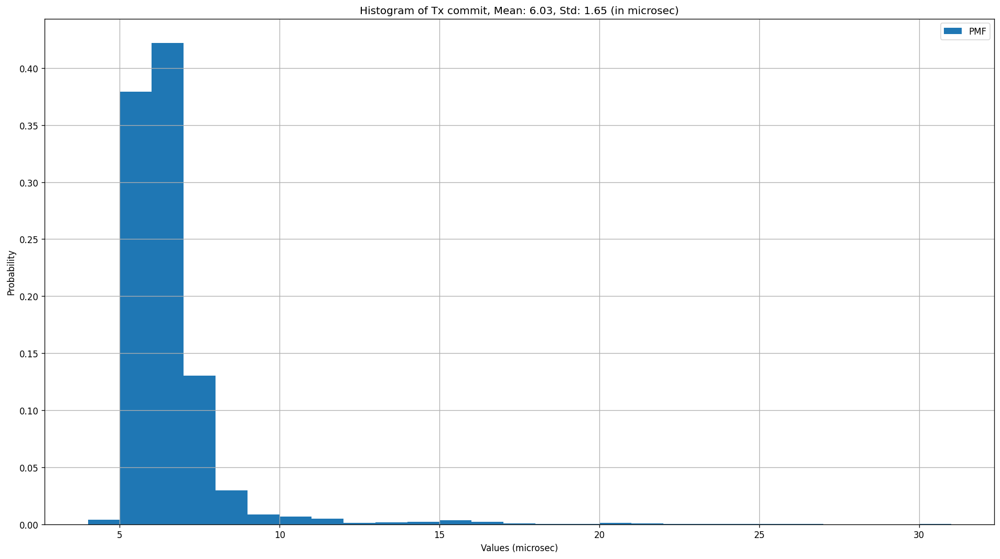

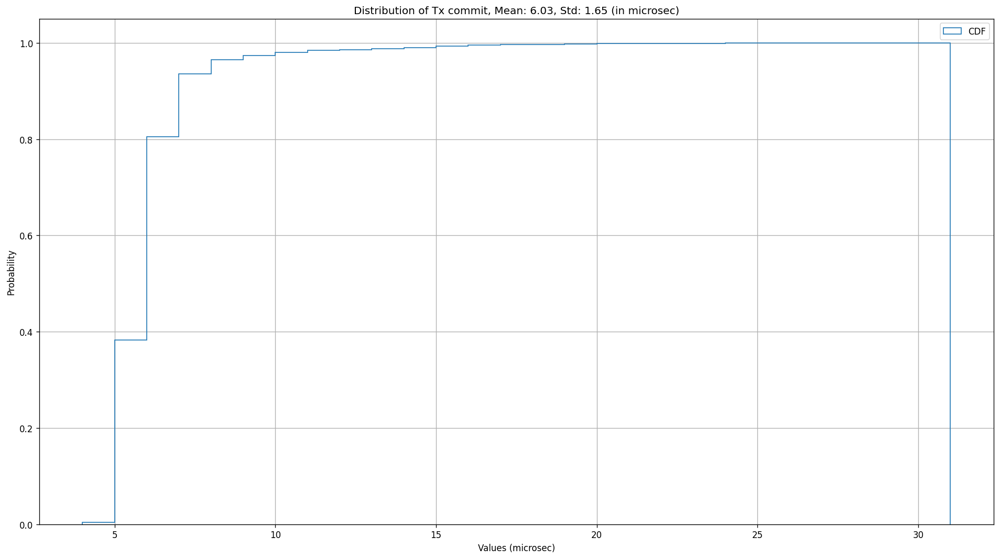

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,10,1,50,3.0,20,0,10,0,10,330,20,0,51
1,10,10,1,50,3.0,20,0,10,0,10,330,20,0,55
2,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
3,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
4,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
9997,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9998,10,10,1,50,1.0,20,0,10,0,10,330,20,0,67


OU - Tx commit Targets shape: (10000,)


0       25187
1       30478
2       22399
3       26040
4       20464
        ...  
9995     4759
9996     4874
9997     5128
9998     6941
9999     5211
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.098/0.1014
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


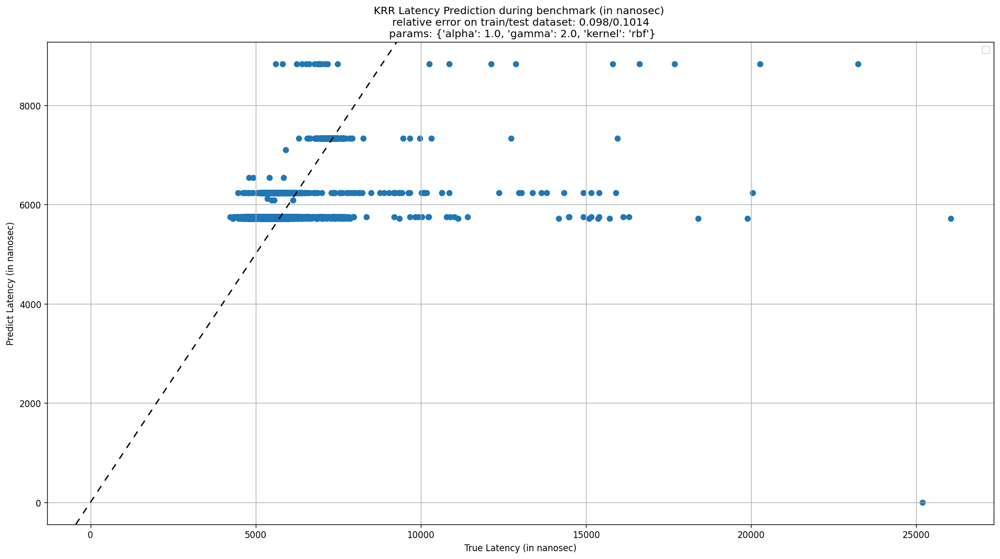

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.102609   -0.0999796
 -0.09865149 -0.09772204 -0.10189318 -0.09697208 -0.09435366 -0.09264126
 -0.10078593 -0.09149764 -0.08712029 -0.08581751 -0.09932975 -0.08511316
 -0.08395272 -0.08373398]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0837/0.0887
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


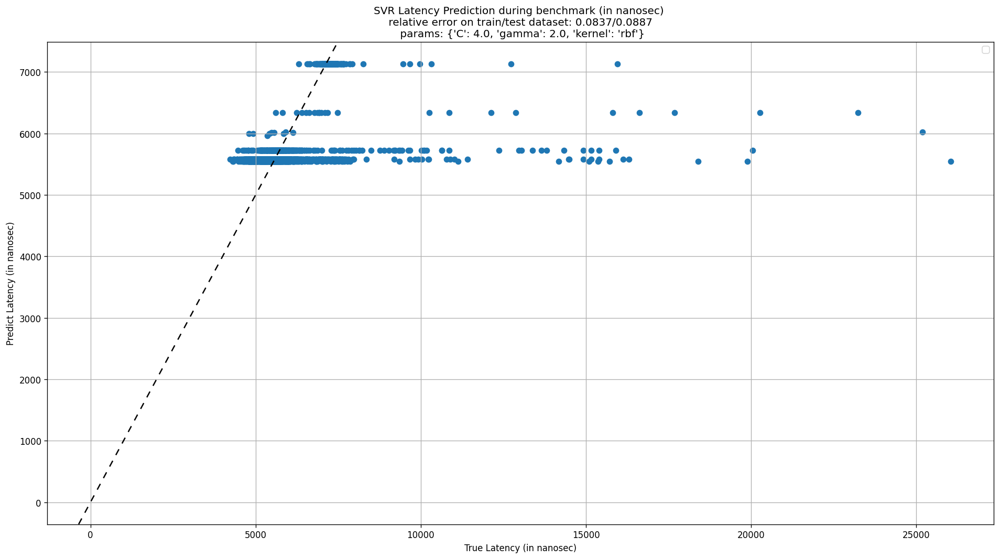

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1035/0.1089
Best Params: {'alpha': 0.0001, 'epsilon': 1.1}


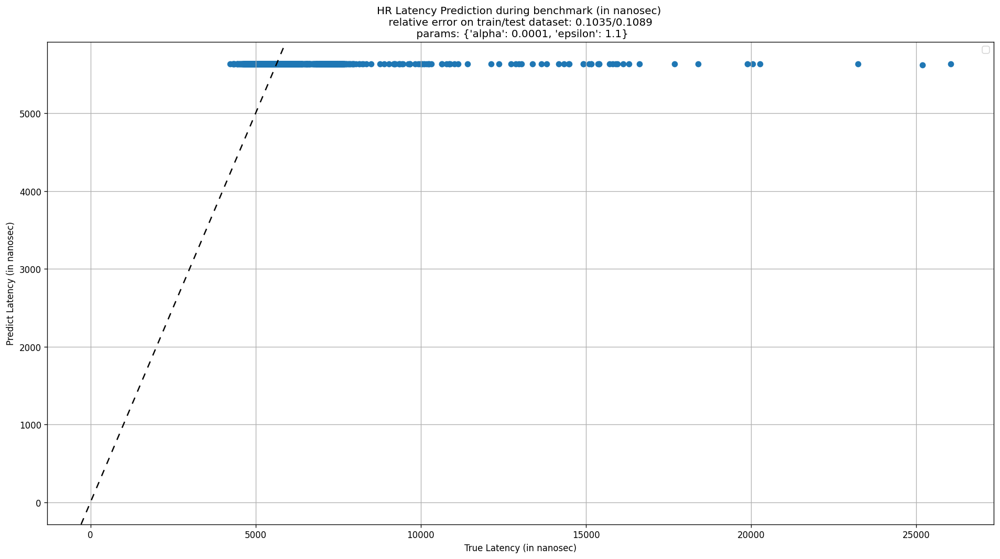

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0824/0.0876
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


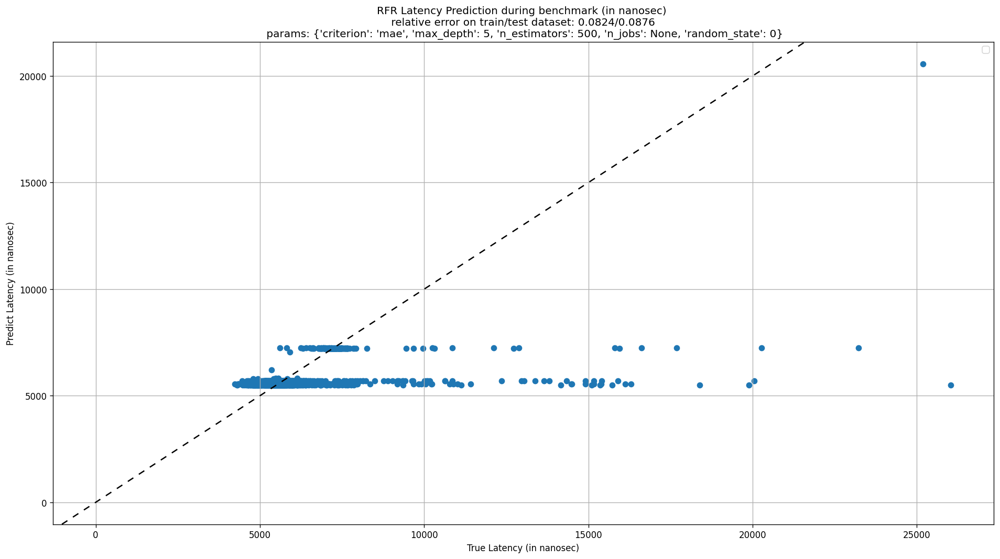

In microsec, Number of bins: 158, nBins: [217. 218. 219. 220. 221. 222. 223. 224. 225. 226. 227. 228. 229. 230.
 231. 232. 233. 234. 235. 236. 237. 238. 239. 240. 241. 242. 243. 244.
 245. 246. 247. 248. 249. 250. 251. 252. 253. 254. 255. 256. 257. 258.
 259. 260. 261. 262. 263. 264. 265. 266. 267. 268. 269. 270. 271. 272.
 273. 274. 275. 276. 277. 278. 279. 280. 281. 282. 283. 284. 285. 286.
 287. 288. 289. 290. 291. 292. 293. 294. 295. 296. 297. 298. 299. 300.
 301. 302. 303. 304. 305. 306. 307. 308. 309. 310. 311. 312. 313. 314.
 315. 316. 317. 318. 319. 320. 321. 322. 323. 324. 325. 326. 327. 328.
 329. 330. 331. 332. 333. 334. 335. 336. 337. 338. 339. 340. 341. 342.
 343. 344. 345. 347. 348. 352. 353. 354. 355. 356. 358. 360. 365. 368.
 370. 371. 372. 377. 392. 400. 402. 406. 450. 456. 470. 471. 484. 495.
 496. 504. 508. 665.]
Mean Latency: 235.17, Std Latency: 20.73 (microsec)


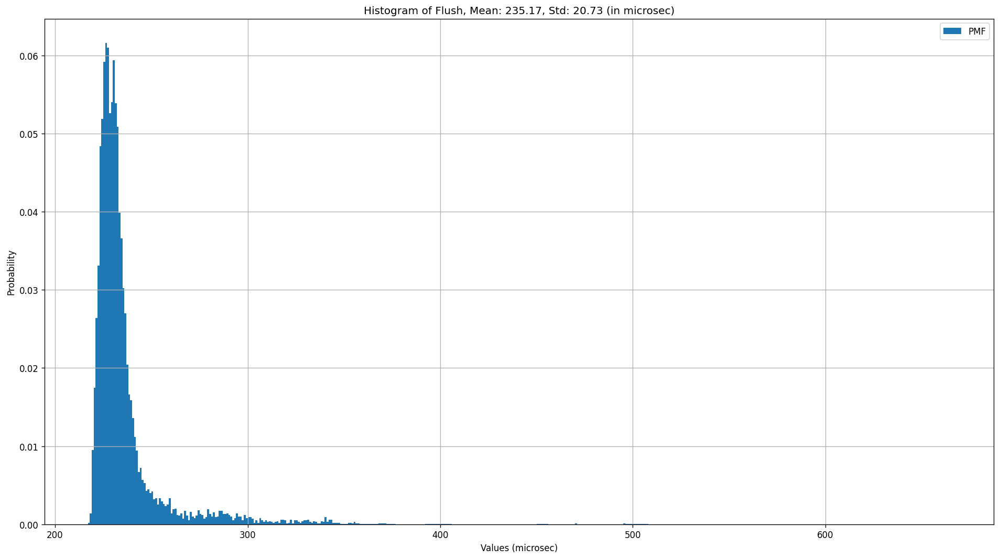

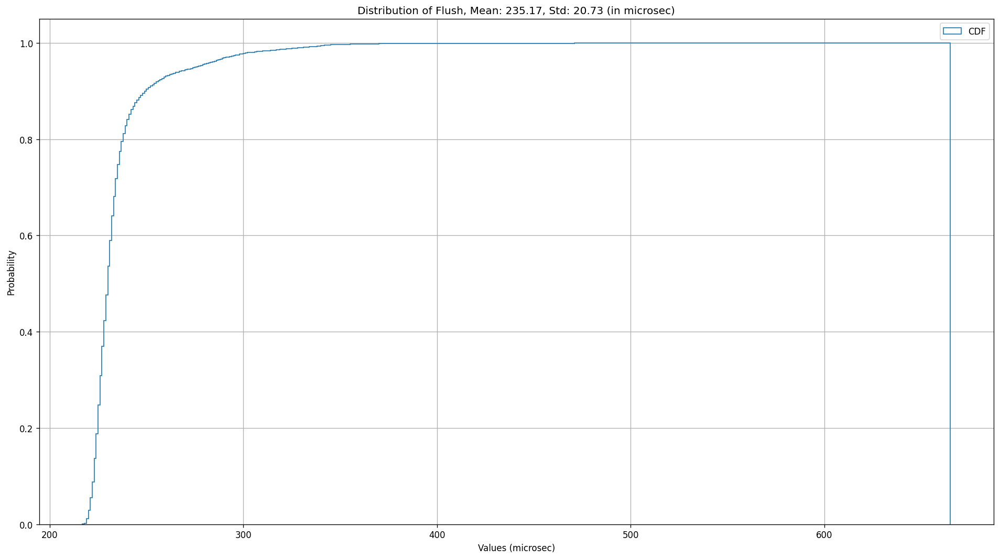

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,10,1,50,3.0,20,0,10,0,10,330,20,0,60
1,10,10,1,50,4.0,20,0,10,0,10,330,20,0,65
2,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
3,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
4,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
9997,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9998,10,10,1,50,1.0,20,0,10,0,10,330,20,0,67


OU - Flush Targets shape: (10000,)


0       665144
1       503763
2       508138
3       496469
4       483638
         ...  
9995    223879
9996    228873
9997    223220
9998    227305
9999    220470
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0431/0.0462
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


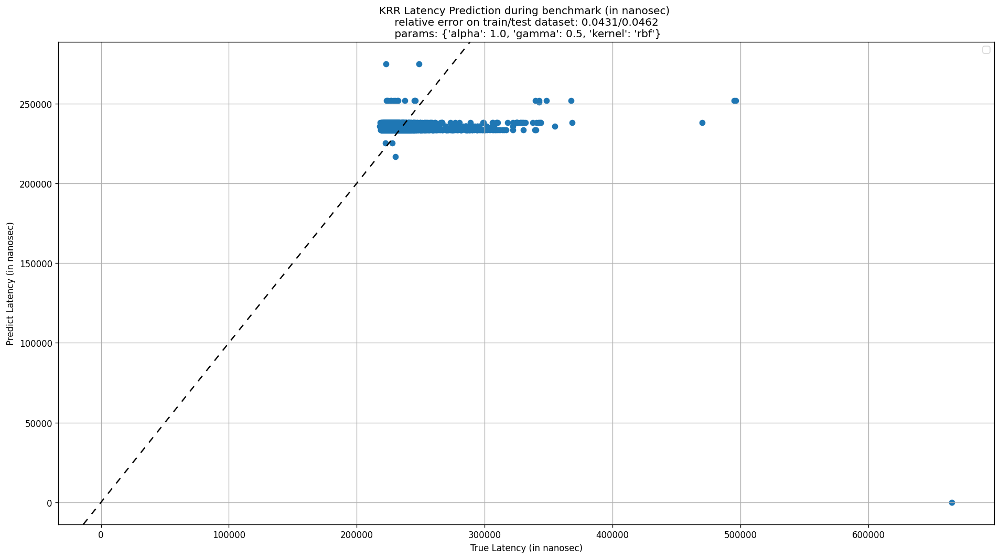

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.03658286 -0.03657694
 -0.0365728  -0.03656873 -0.03658122 -0.03657006 -0.03656247 -0.03655762
 -0.03657907 -0.03655881 -0.03654759 -0.03654005 -0.03657594 -0.03654161
 -0.03652498 -0.03651546]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0365/0.0399
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


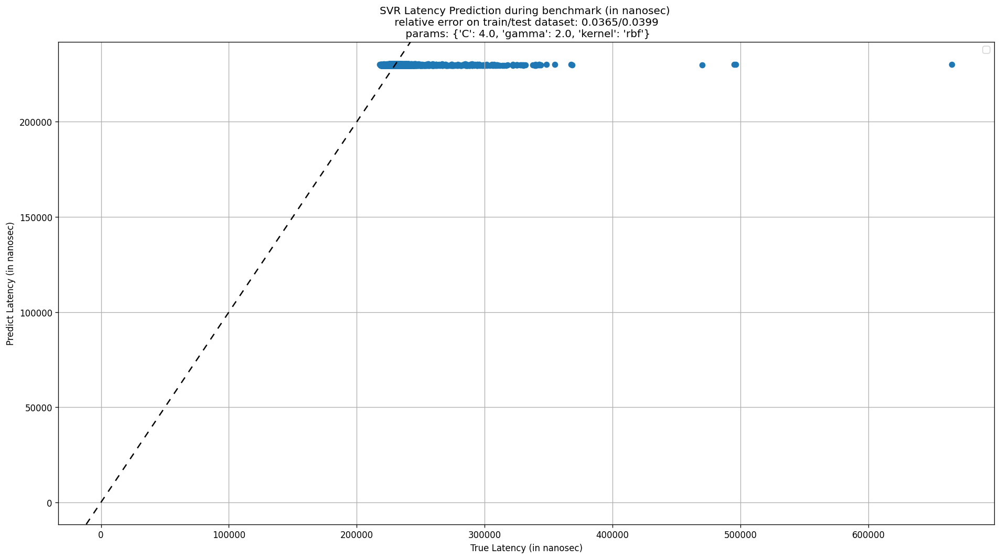

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0366/0.0399
Best Params: {'alpha': 1, 'epsilon': 1.1}


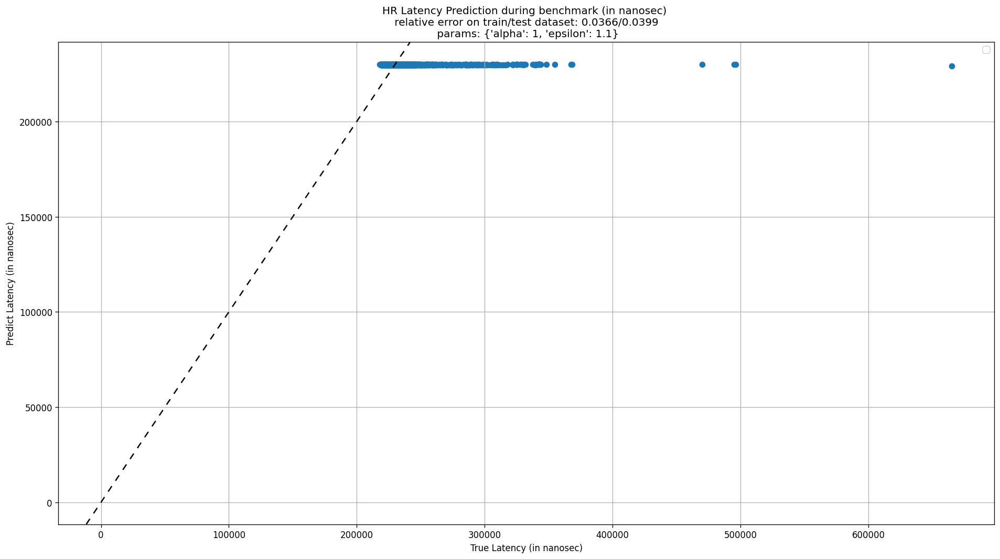

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0364/0.0398
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


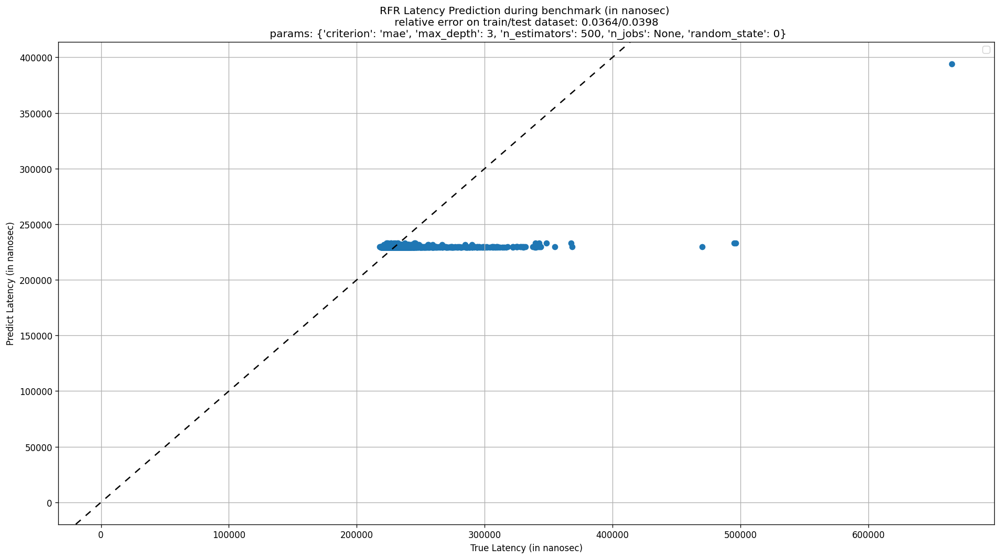

In microsec, Number of bins: 19, nBins: [ 4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20. 21.
 22.]
Mean Latency: 5.31, Std Latency: 1.37 (microsec)


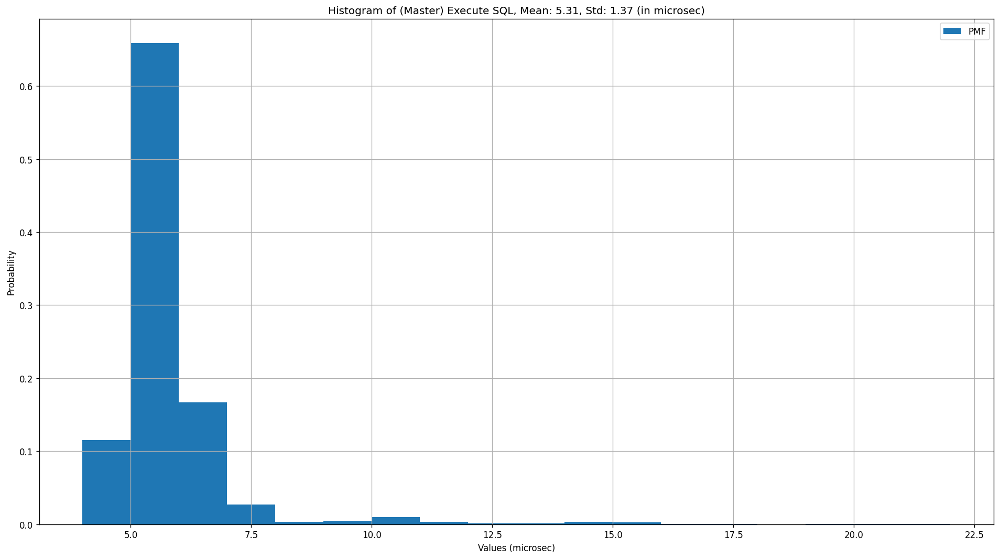

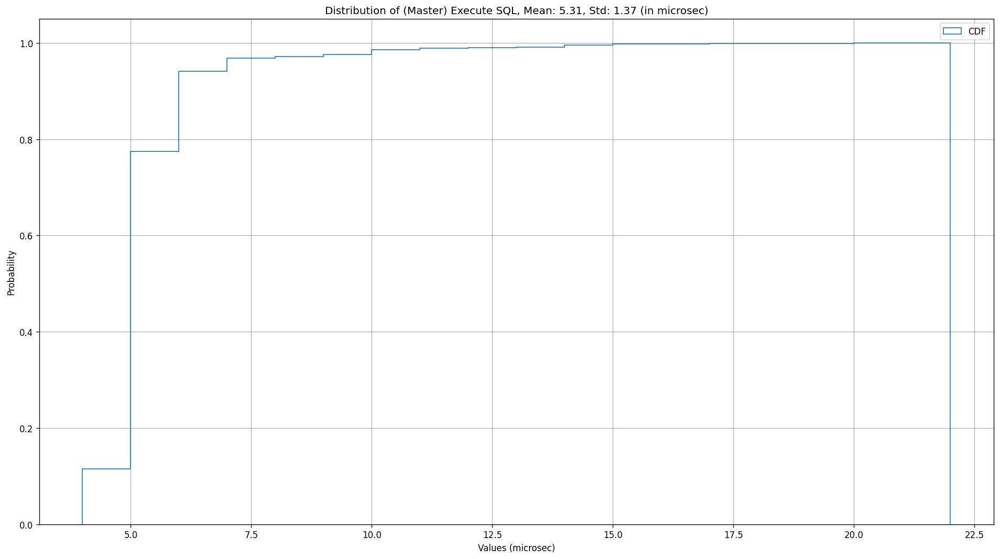

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
1,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
2,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
3,10,10,1,50,3.0,20,0,10,0,10,330,20,0,67
4,10,10,1,50,1.0,20,0,10,0,10,330,20,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
9997,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9998,10,10,1,50,1.0,20,0,10,0,10,330,20,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       19261
1       18255
2       17194
3       17429
4       16432
        ...  
9995     4591
9996     4389
9997     4224
9998     6360
9999     4469
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.095/0.096
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


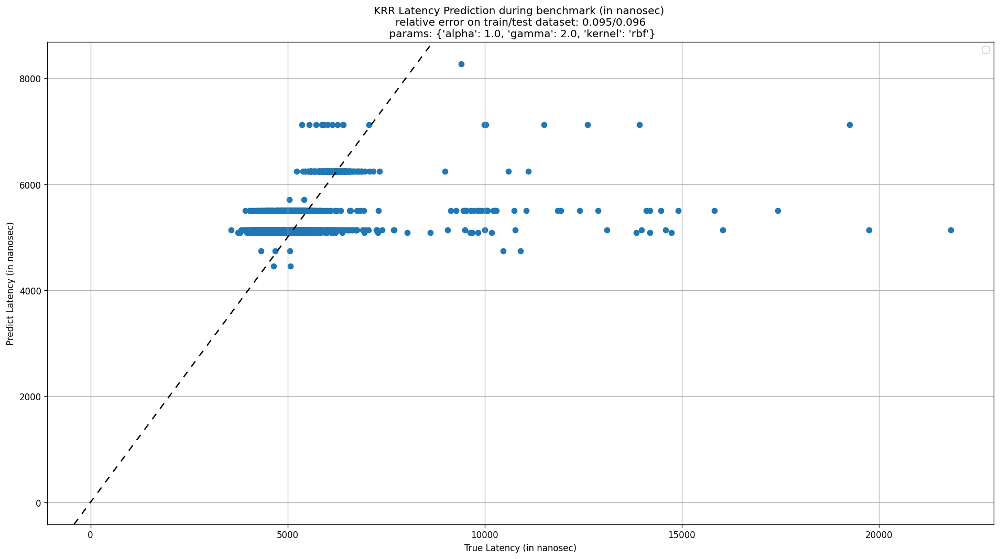

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.09644033 -0.09366065
 -0.09219141 -0.09120049 -0.09575936 -0.0905412  -0.08829355 -0.08713976
 -0.09472061 -0.08650037 -0.08464818 -0.08418177 -0.09331628 -0.08384734
 -0.08313523 -0.0830629 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0831/0.0849
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


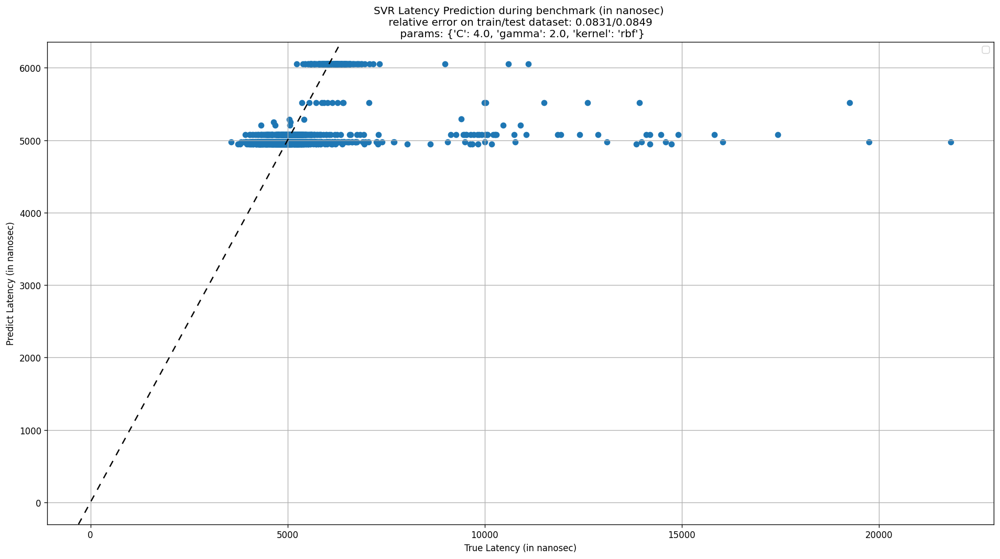

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0973/0.1015
Best Params: {'alpha': 1, 'epsilon': 1.1}


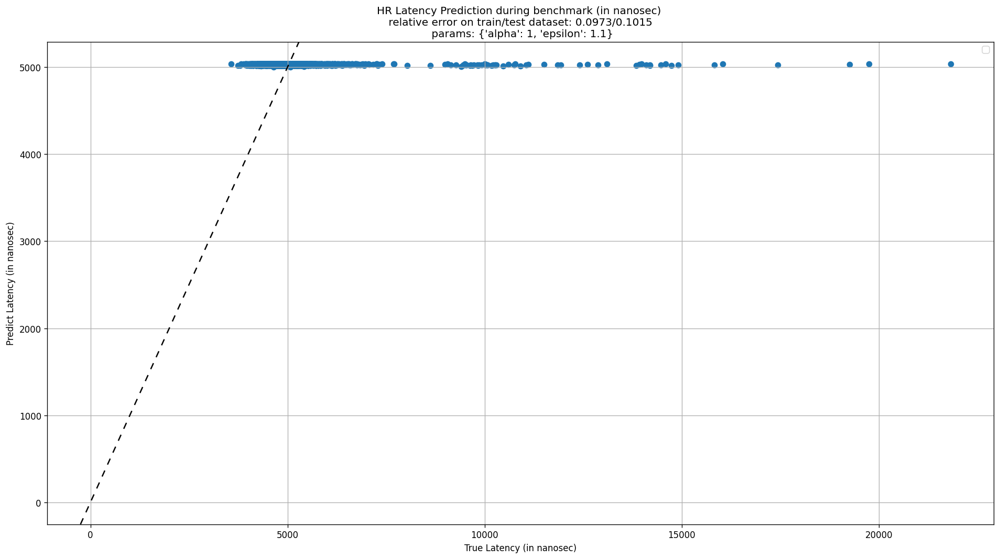

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0823/0.0842
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


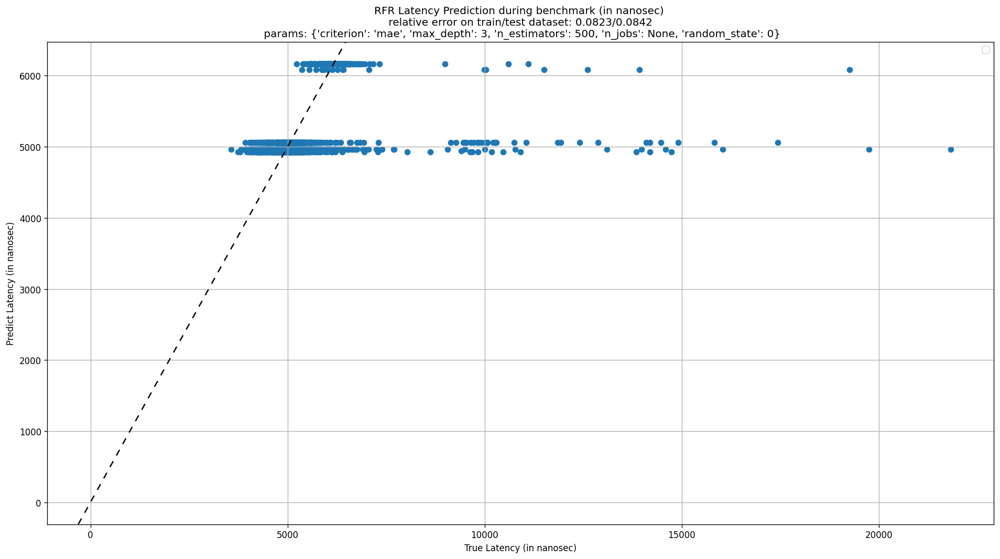

In microsec, Number of bins: 30, nBins: [22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36. 37. 38. 39.
 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51.]
Mean Latency: 34.04, Std Latency: 6.6 (microsec)


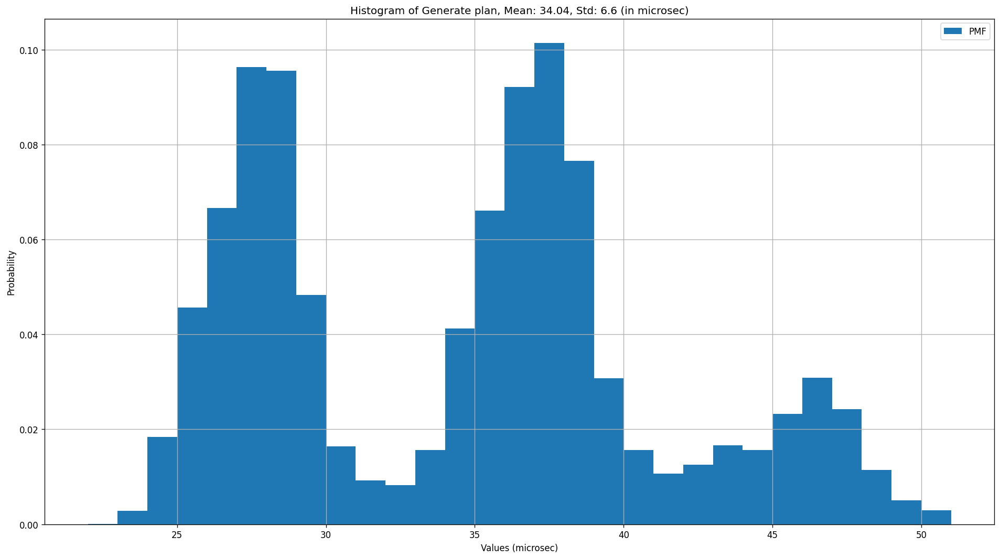

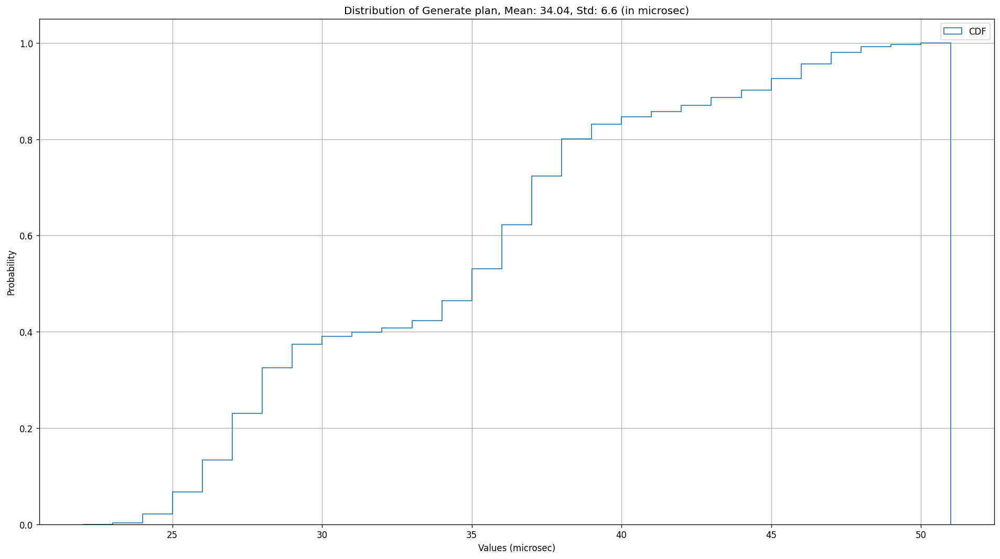

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,10,1,50,3.0,20,0,10,0,10,330,20,0,67
1,10,10,1,50,3.0,20,0,10,0,10,330,20,0,67
2,10,10,1,50,3.0,20,0,10,0,10,330,20,0,67
3,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
4,10,10,1,50,3.0,20,0,10,0,10,330,20,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9997,10,10,1,50,3.0,20,0,10,0,10,330,20,0,67
9998,10,10,1,50,1.0,20,0,10,0,10,330,20,0,67


OU - Generate plan Targets shape: (10000,)


0       45182
1       44360
2       47661
3       48585
4       48822
        ...  
9995    28496
9996    27634
9997    40154
9998    35678
9999    28661
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1522/0.1522
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


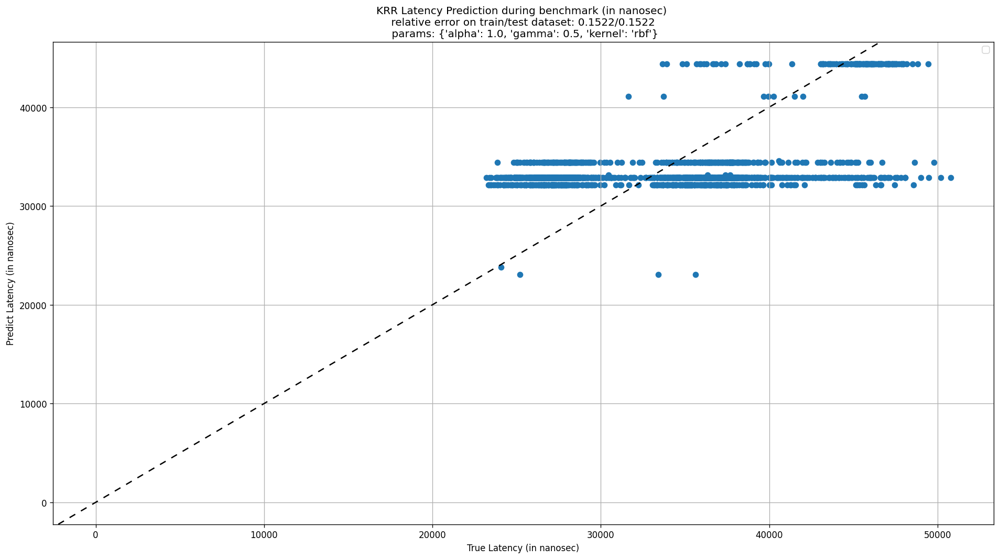

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.17462453 -0.17417884
 -0.17394797 -0.17369517 -0.17448032 -0.17358288 -0.17315066 -0.17279189
 -0.17418554 -0.17262827 -0.17186111 -0.17122816 -0.17371241 -0.17094849
 -0.16975366 -0.16890082]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1689/0.1681
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


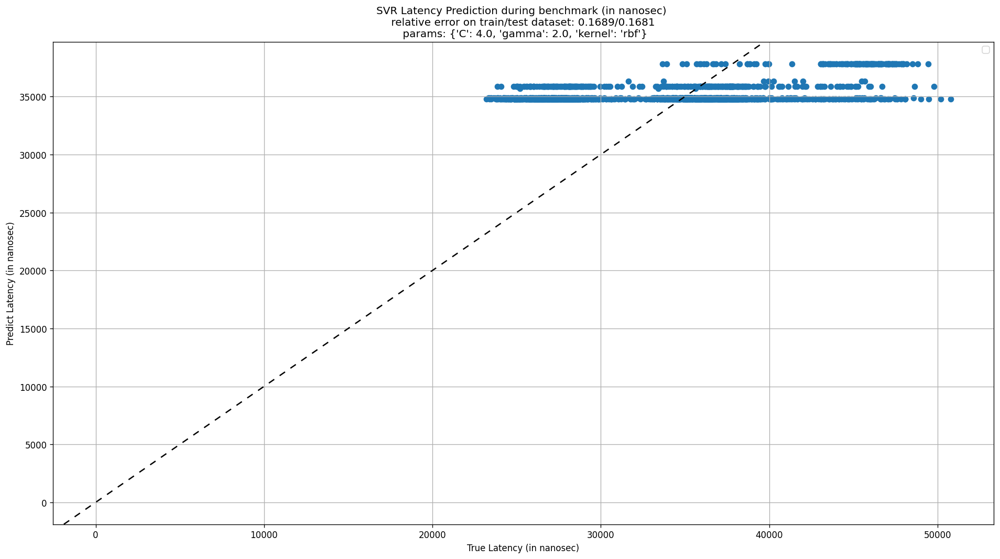

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1708/0.1689
Best Params: {'alpha': 1, 'epsilon': 1.35}


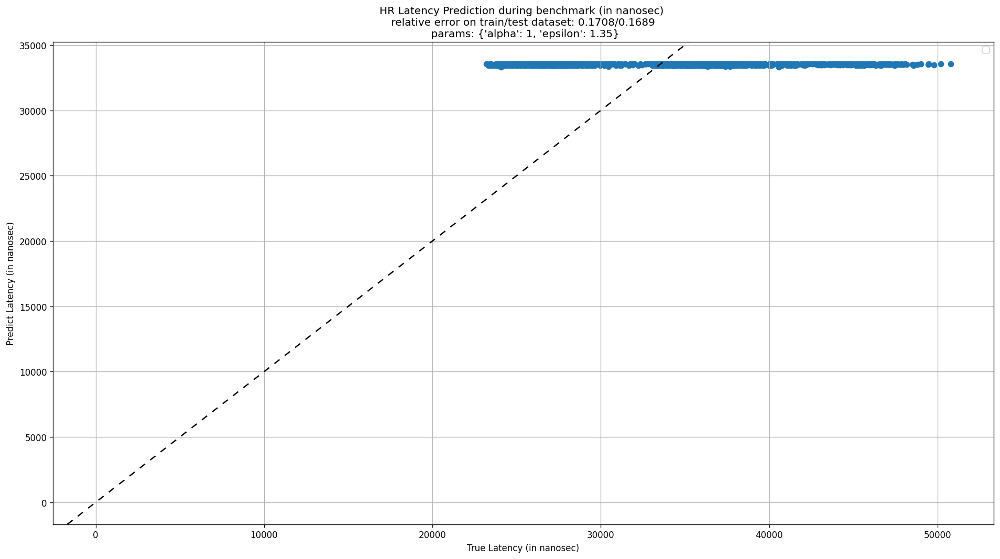

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.152/0.1522
Best Params: {'criterion': 'mse', 'max_depth': 7, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


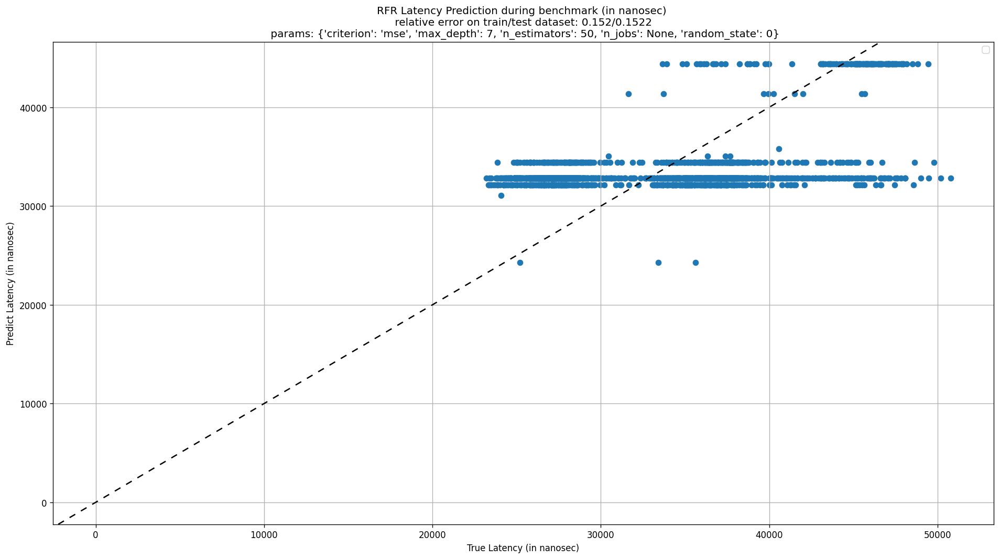

Records: Time of Each Component with shape: (114770, 17)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of R/W Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp,Average Time Of Read-Only Txn
0,1,191588367,2416820115681835,2401669,431671,183563846,108081,180385126,15170,98418,3433,2786956,132174,44479,4364,2416820302972950,0
1,2,9843777,2416820398426362,451516,661701,8232588,77093,5675476,3289,37592,582,2160657,262473,245188,8925,2416820407018699,0
2,3,5821272,2416820412605519,231760,362149,4896151,38161,2345078,3152,39071,618,2147022,312831,299788,4313,2416820417738524,0
3,4,4414205,2416820423388805,119296,1558190,0,76306,2241982,3179,9320,621,6371,208103,177380,15182,2416820426045558,2554633
4,5,4607333,2416820431197066,210621,404063,3802947,43799,1837376,2632,44725,571,1669502,194667,181134,4676,2416820435087556,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114765,114766,369521,2417120040531457,19997,41087,0,3336,273716,527,2007,76,557,3773,2295,401,2417120040835432,285131
114766,114767,398650,2417120042699555,20271,26569,0,3404,307245,603,1875,83,519,3975,2301,443,2417120043056322,319140
114767,114768,372332,2417120044850433,20181,45645,0,3492,272737,673,2061,64,550,3703,2170,432,2417120045153177,284444
114768,114769,374525,2417120046803982,19332,40871,0,3496,281880,515,1859,74,454,3793,2214,369,2417120047114792,293309


Features: Features with shape: (114770, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,10,10,1,50,0.0,20,0,10,0,10,330,20,0,22
1,2,285793030,10,10,1,50,0.0,20,0,10,0,10,330,20,0,25
2,3,300535069,10,10,1,50,1.0,20,0,10,0,10,330,20,0,26
3,4,310249535,10,0,1,50,3.0,20,0,0,0,0,0,10,0,27
4,5,319098230,10,10,1,50,1.0,20,0,10,0,10,330,20,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114765,114766,299929084985,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
114766,114767,299931267311,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
114767,114768,299933399903,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
114768,114769,299935359329,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67


In microsec, Number of bins: 25, nBins: [ 3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18. 19. 20.
 22. 23. 24. 25. 26. 28. 33.]
Mean Latency: 5.36, Std Latency: 1.96 (microsec)


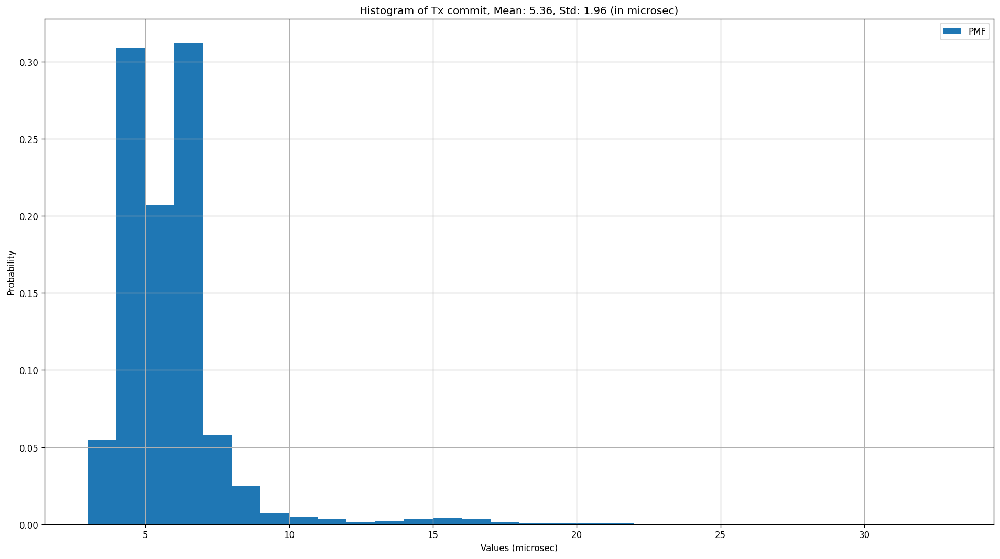

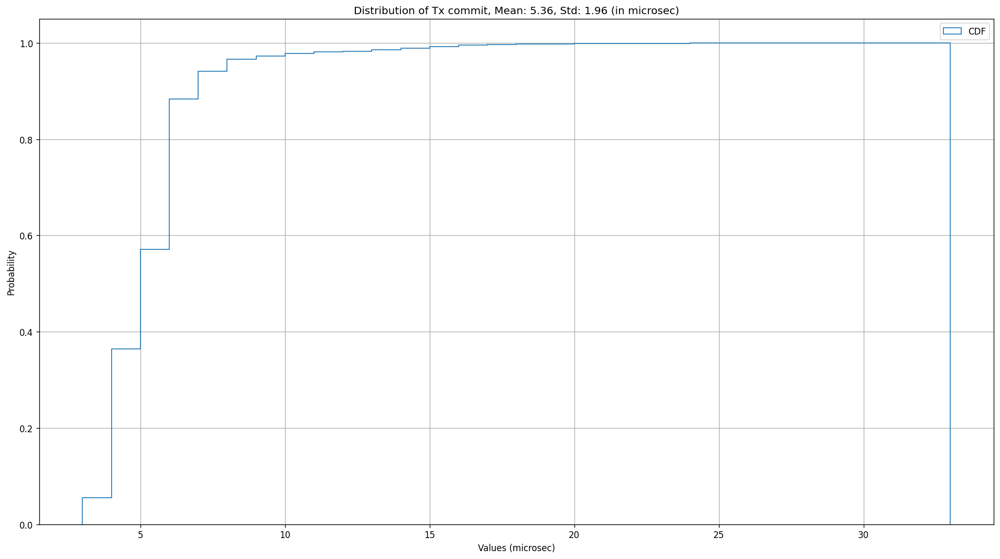

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,10,1,50,3.0,20,0,10,0,10,330,20,0,52
1,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
2,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
3,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
4,10,10,1,50,4.0,20,0,10,0,10,330,20,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67


OU - Tx commit Targets shape: (10000,)


0       32548
1       22985
2       17737
3       18543
4       21530
        ...  
9995     5656
9996     4705
9997     4373
9998     3902
9999     7681
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1238/0.1256
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


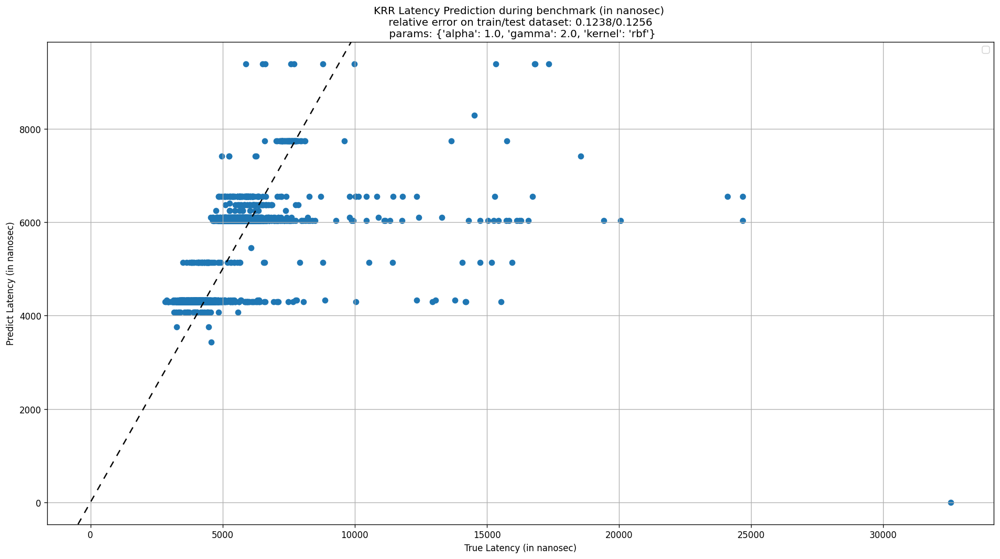

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.14085219 -0.14766165
 -0.14913771 -0.1503603  -0.12626358 -0.13018145 -0.13183117 -0.13342733
 -0.12006473 -0.12044312 -0.12100374 -0.1222077  -0.11690927 -0.11501825
 -0.11469312 -0.11552108]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1147/0.1166
Best Params: {'C': 4.0, 'gamma': 1.0, 'kernel': 'rbf'}


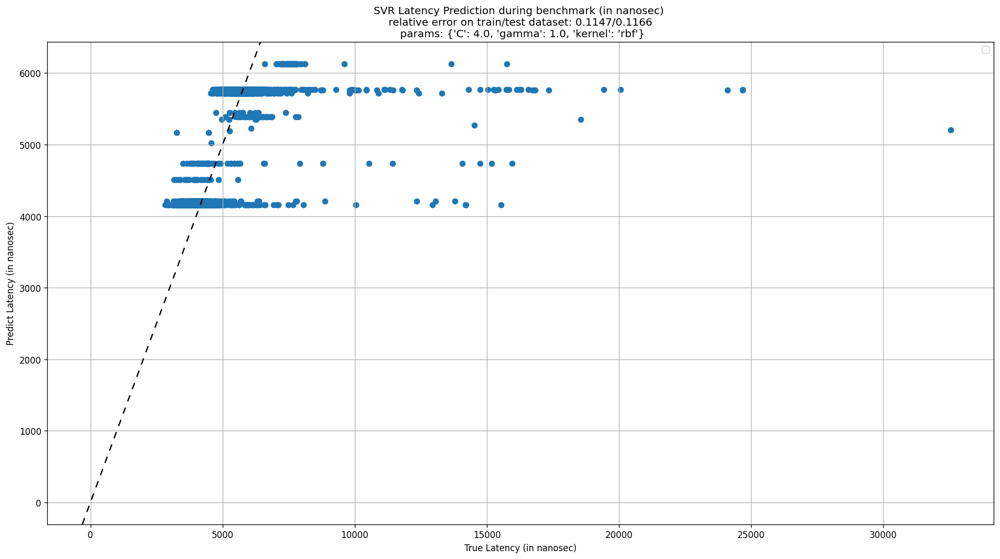

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1166/0.1205
Best Params: {'alpha': 1, 'epsilon': 1.1}


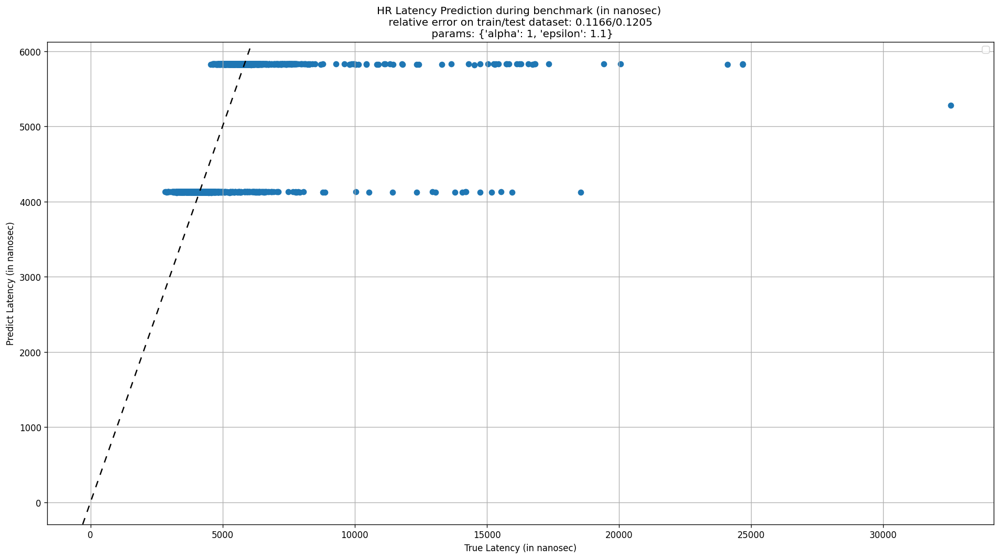

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1044/0.1073
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


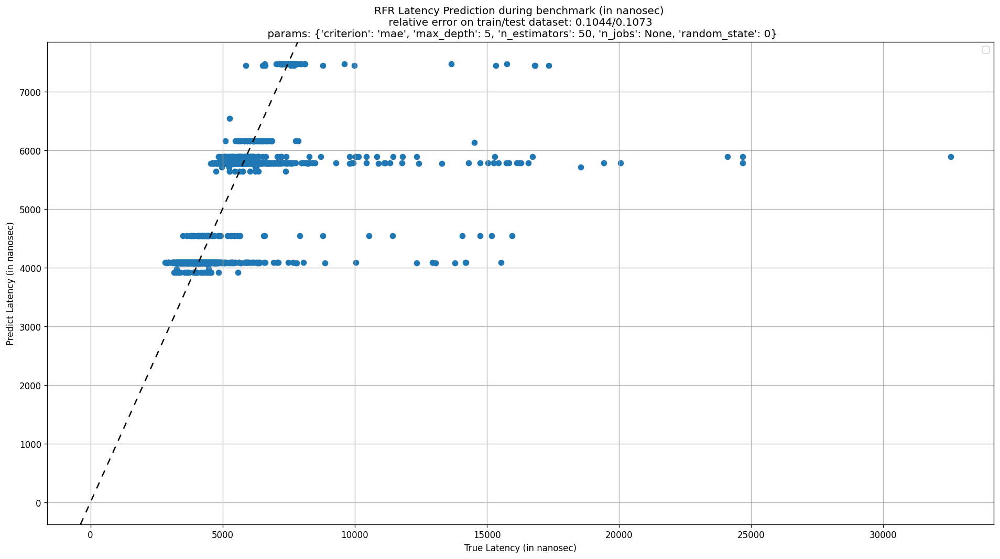

In microsec, Number of bins: 149, nBins: [  0.   1.   2.   3.   4.   5.   6.   8.  10.  12.  20. 226. 227. 228.
 229. 230. 231. 232. 233. 234. 235. 236. 237. 238. 239. 240. 241. 242.
 243. 244. 245. 246. 247. 248. 249. 250. 251. 252. 253. 254. 255. 256.
 257. 258. 259. 260. 261. 262. 263. 264. 265. 266. 267. 268. 269. 270.
 271. 272. 273. 274. 275. 276. 277. 278. 279. 280. 281. 282. 283. 284.
 285. 286. 287. 288. 289. 290. 291. 292. 293. 294. 295. 296. 297. 298.
 299. 300. 301. 302. 303. 304. 305. 306. 307. 308. 309. 310. 311. 312.
 313. 314. 315. 316. 317. 318. 319. 320. 321. 322. 323. 324. 325. 326.
 328. 329. 330. 331. 332. 333. 334. 338. 339. 341. 344. 345. 346. 347.
 348. 349. 350. 351. 352. 353. 354. 355. 356. 357. 359. 361. 365. 368.
 371. 375. 377. 378. 381. 385. 410. 454. 517.]
Mean Latency: 124.97, Std Latency: 125.24 (microsec)


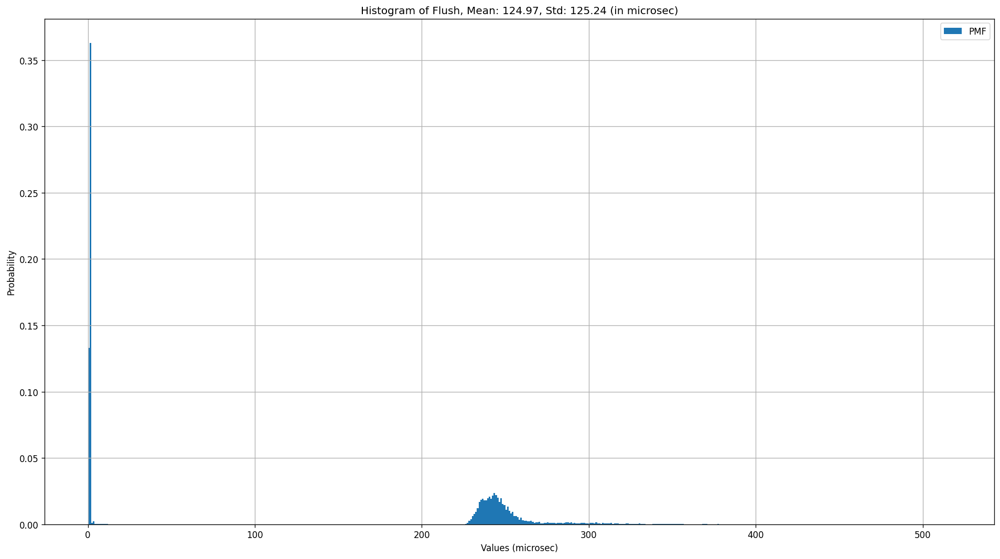

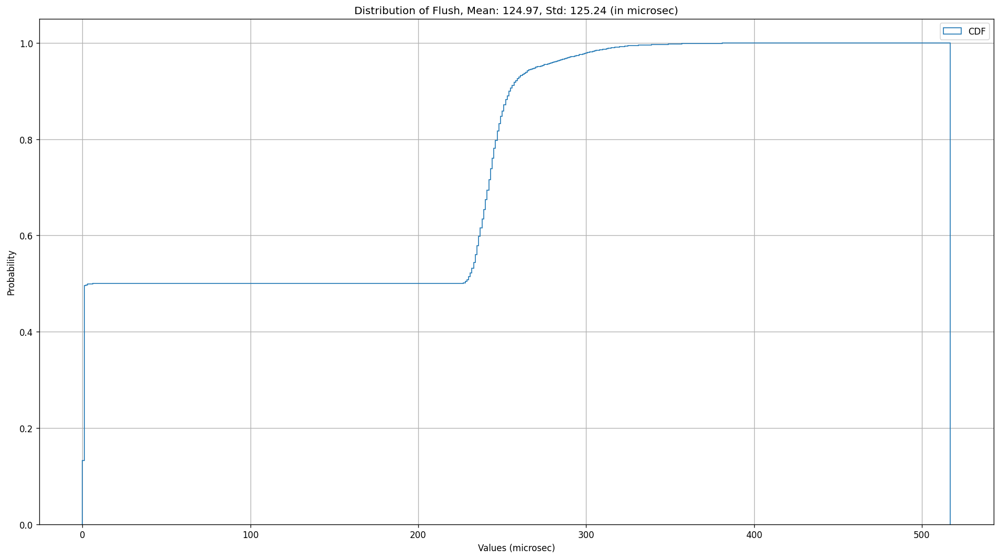

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,2.0,20,0,0,0,0,0,10,0,59
1,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
2,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
3,10,10,1,50,5.0,20,0,10,0,10,330,20,0,67
4,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9996,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9998,10,10,1,50,1.0,20,0,10,0,10,330,20,0,67


OU - Flush Targets shape: (10000,)


0         7794
1       517470
2       454182
3       385198
4        12025
         ...  
9995       681
9996       515
9997       603
9998    257066
9999       900
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1053/0.1052
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


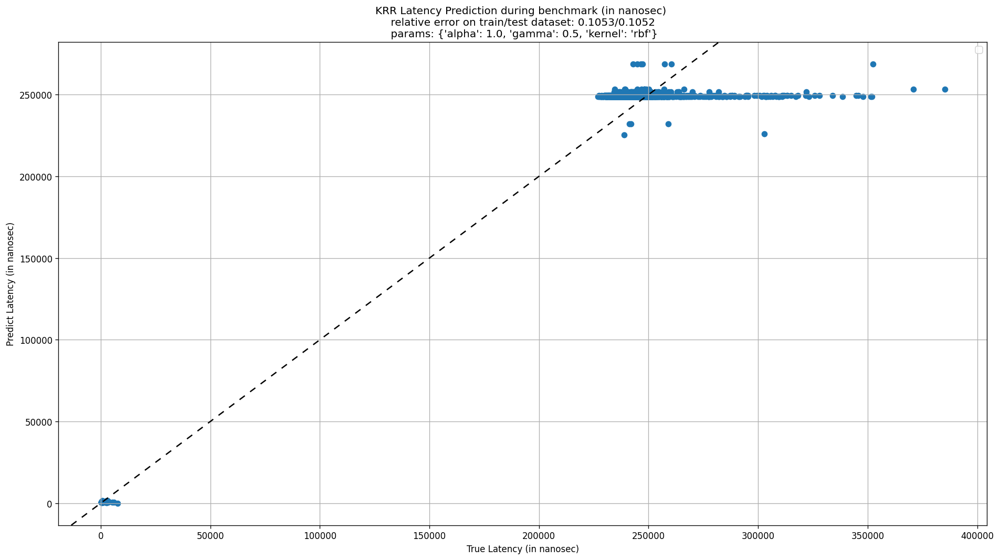

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [          nan           nan           nan           nan -124.74438679
 -124.84133947 -124.83818774 -124.85812311 -123.51672287 -123.73004753
 -123.74223345 -123.7916437  -121.10871248 -121.61294453 -121.63250169
 -121.72917237 -116.37518186 -117.30043147 -117.44066985 -117.66509712]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 116.3752/184.4674
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


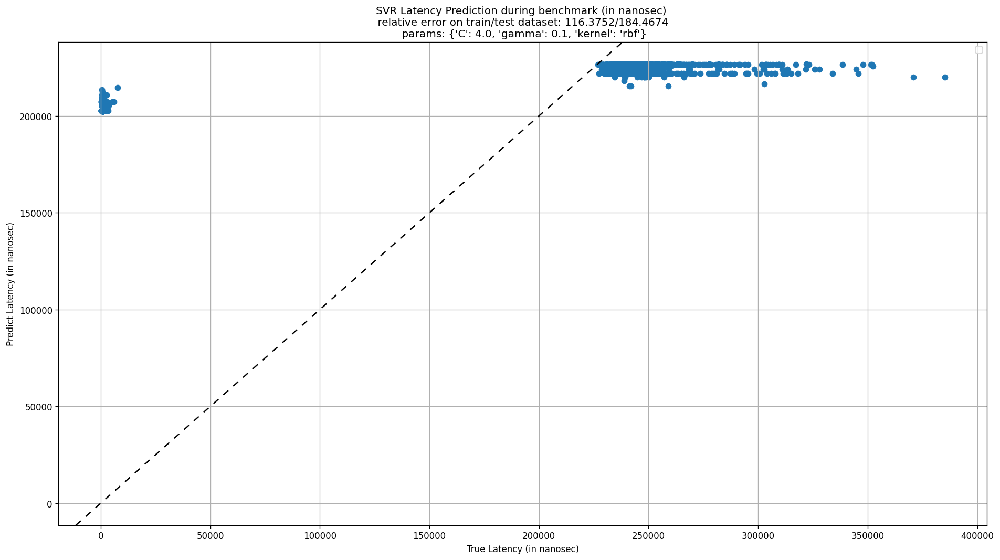

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0916/0.0934
Best Params: {'alpha': 0.0001, 'epsilon': 1.1}


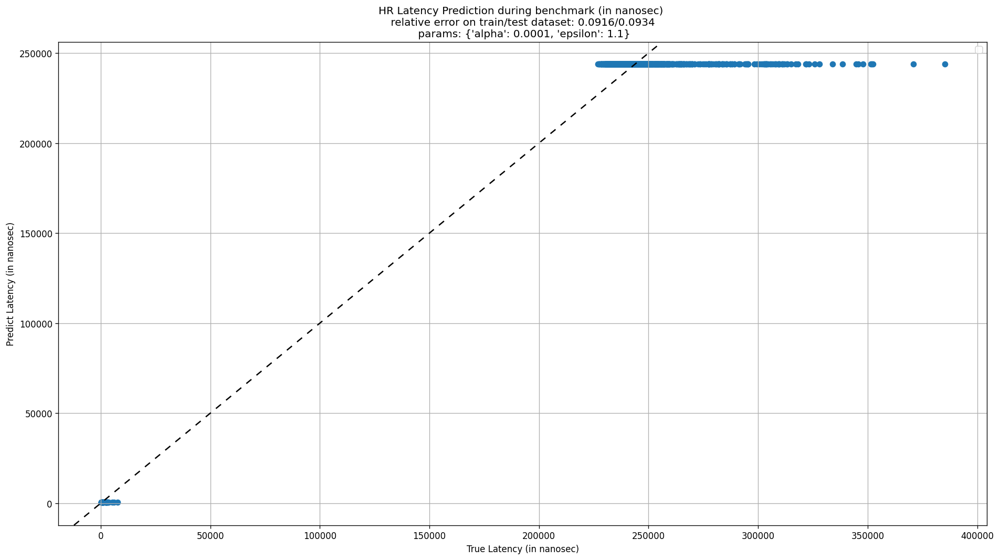

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0847/0.0873
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


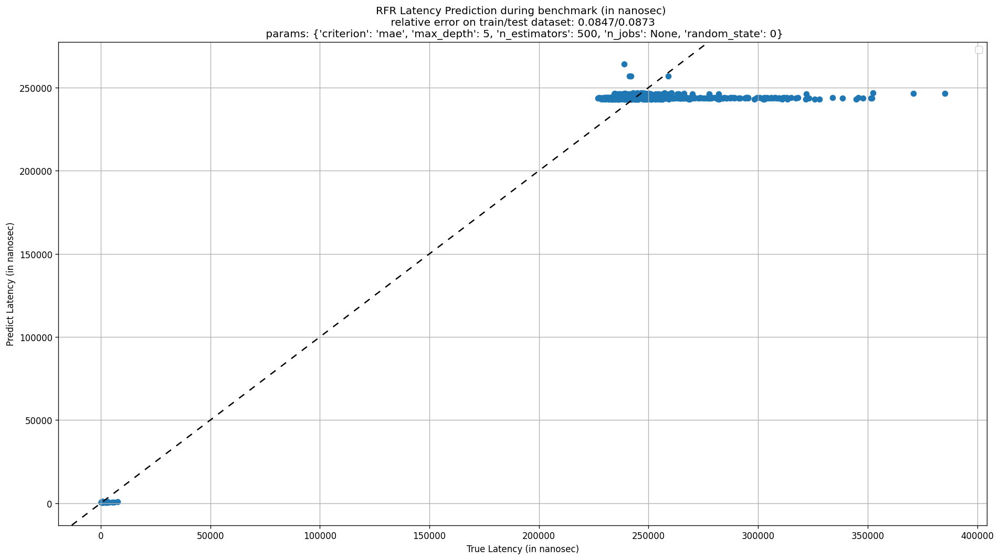

In microsec, Number of bins: 22, nBins: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22.]
Mean Latency: 4.29, Std Latency: 2.46 (microsec)


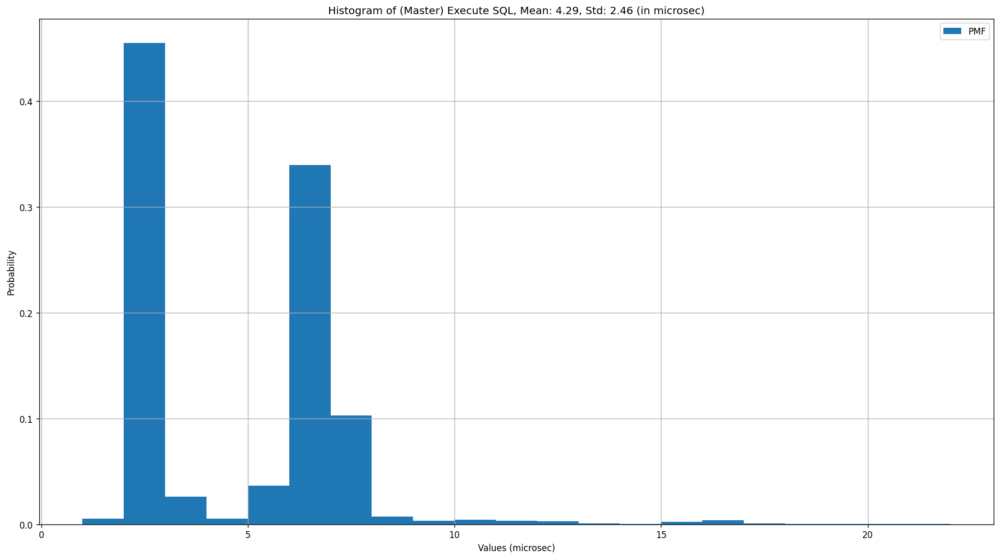

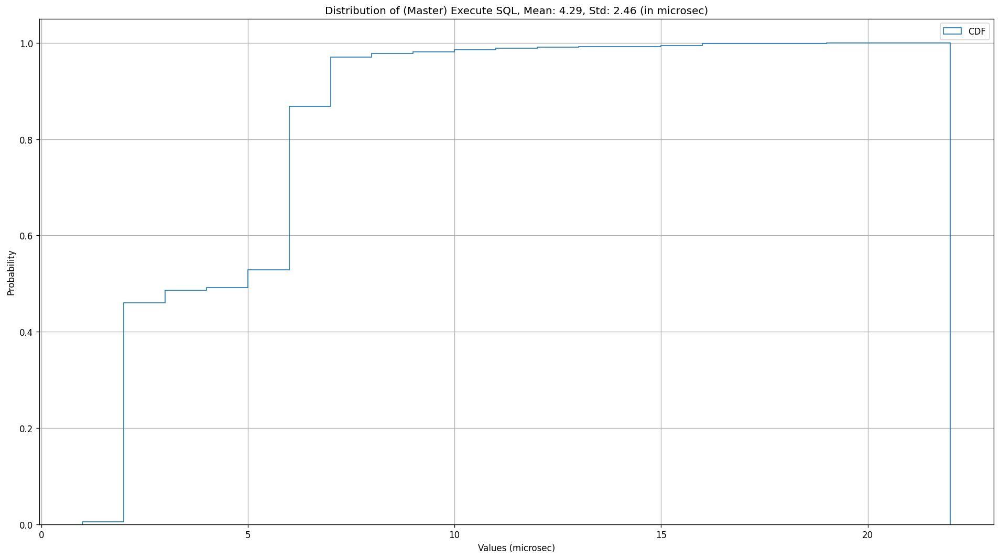

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,3.0,20,0,0,0,0,0,10,0,44
1,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
2,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
3,10,10,1,50,2.0,20,0,10,0,10,330,20,0,67
4,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9997,10,0,1,50,4.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       11145
1        8218
2        9577
3       18748
4        9543
        ...  
9995     5745
9996     2214
9997     2078
9998     2223
9999     7341
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1018/0.1035
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


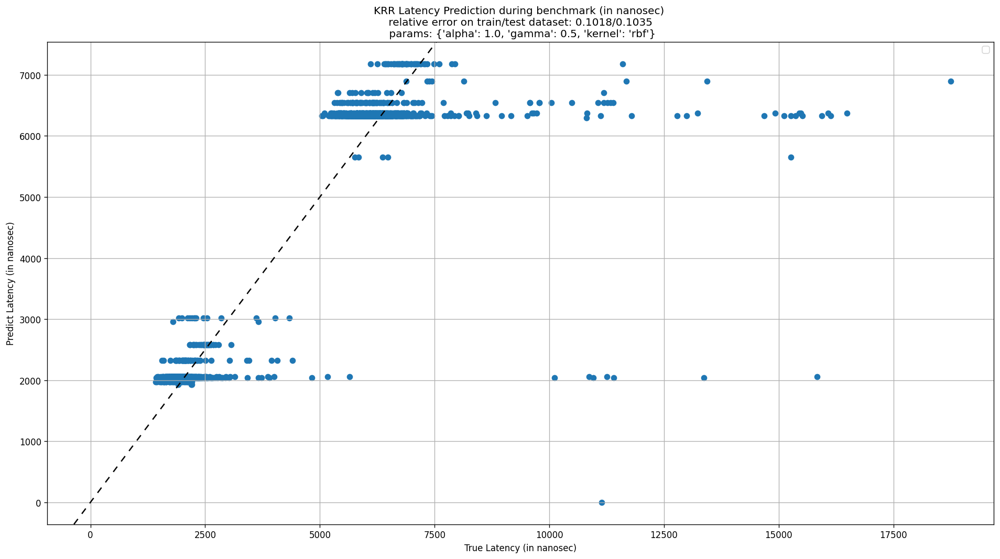

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.40879182 -0.48944424
 -0.50212111 -0.5142272  -0.19567663 -0.24833232 -0.26482375 -0.28077916
 -0.12218779 -0.15090822 -0.17185885 -0.19278759 -0.10331209 -0.11285169
 -0.12554909 -0.14143302]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1033/0.1036
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


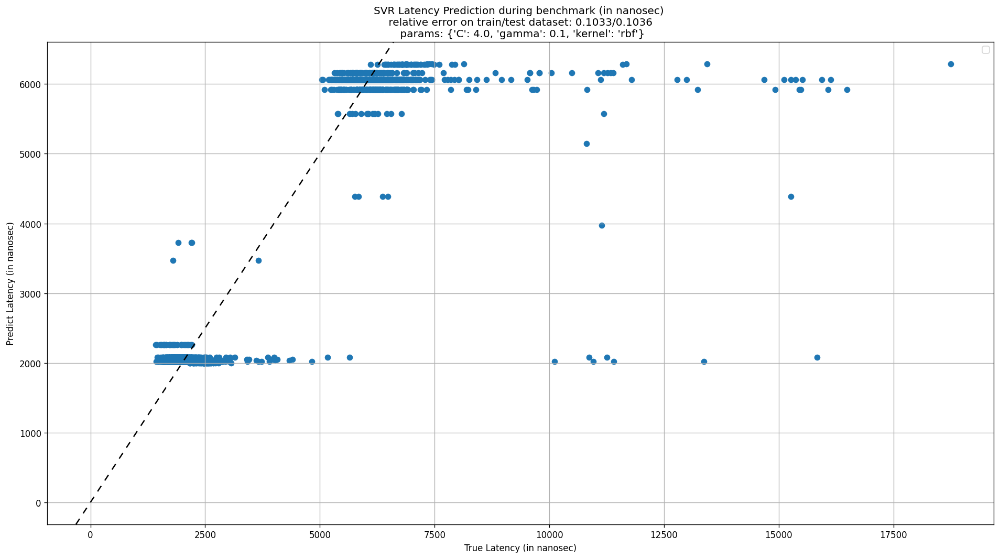

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0939/0.097
Best Params: {'alpha': 1, 'epsilon': 1.1}


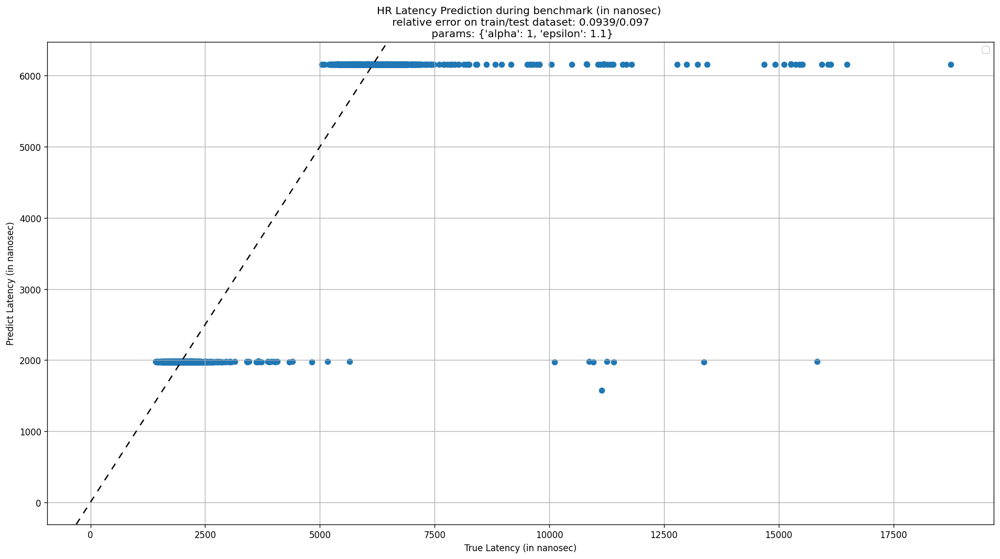

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0886/0.0908
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


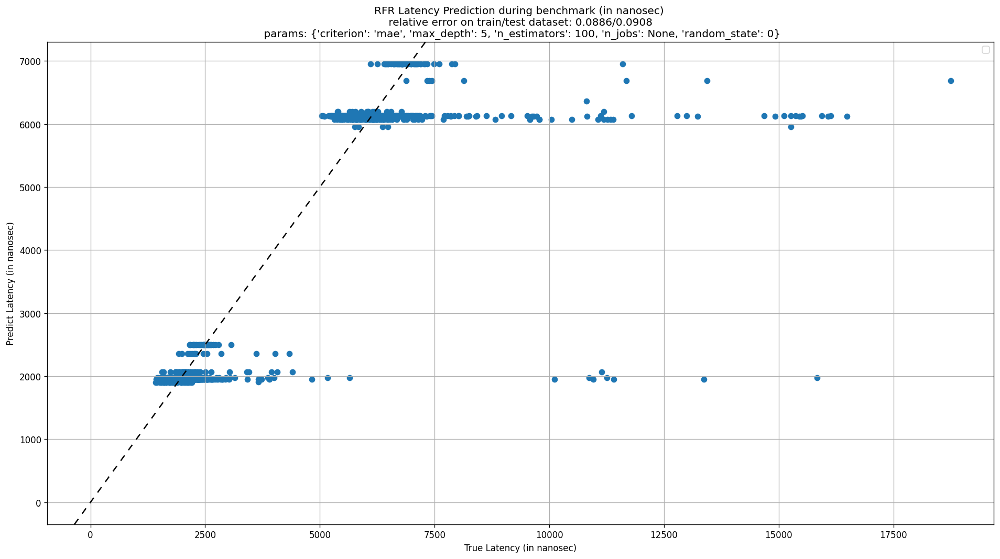

In microsec, Number of bins: 37, nBins: [13. 14. 15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30.
 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48.
 49.]
Mean Latency: 27.95, Std Latency: 9.97 (microsec)


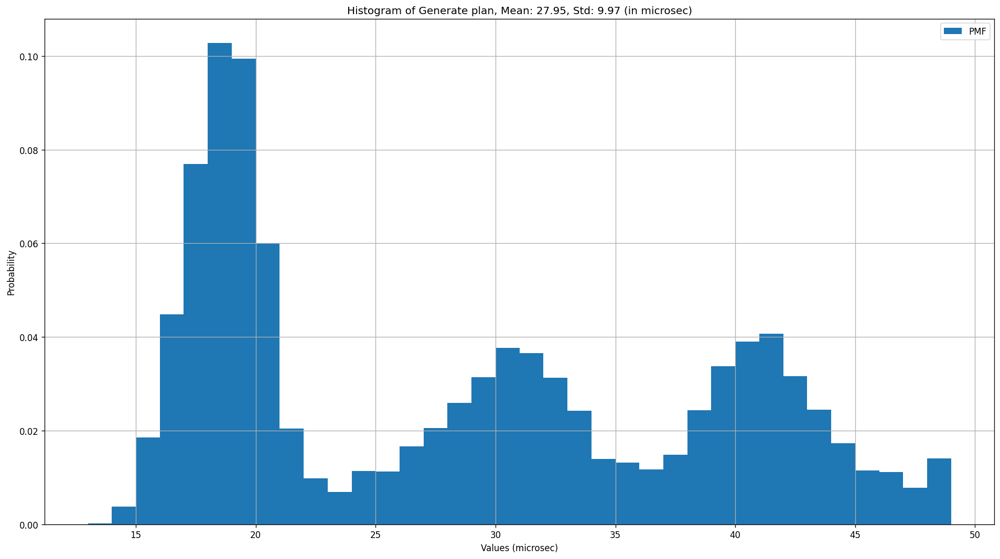

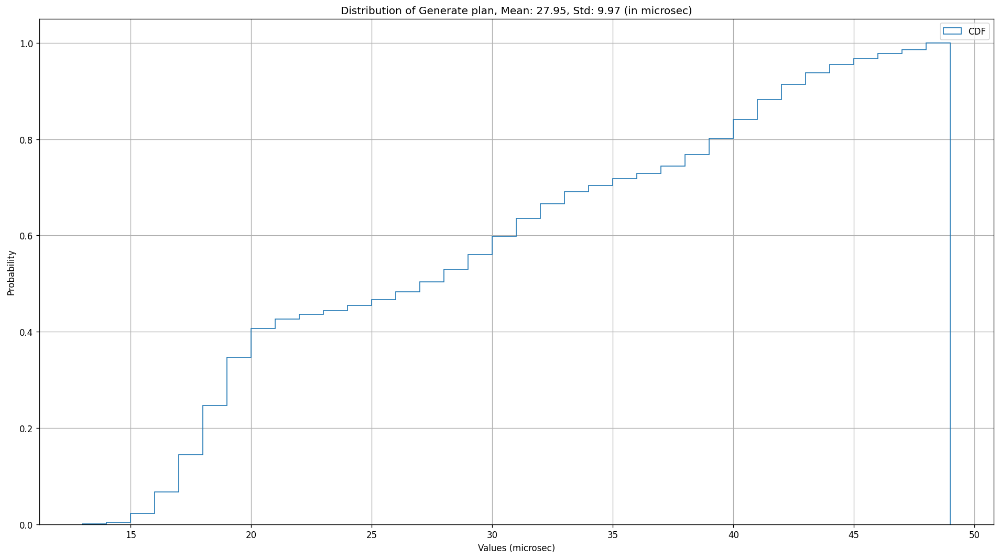

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,10,0,1,50,2.0,20,0,0,0,0,0,10,0,67
1,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
2,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
3,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
4,10,0,1,50,3.0,20,0,0,0,0,0,10,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9996,10,10,1,50,0.0,20,0,10,0,10,330,20,0,67
9997,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67
9998,10,0,1,50,0.0,20,0,0,0,0,0,10,0,67


OU - Generate plan Targets shape: (10000,)


0       35410
1       32056
2       46705
3       36831
4       32834
        ...  
9995    39448
9996    32316
9997    24445
9998    20401
9999    21386
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1313/0.1316
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


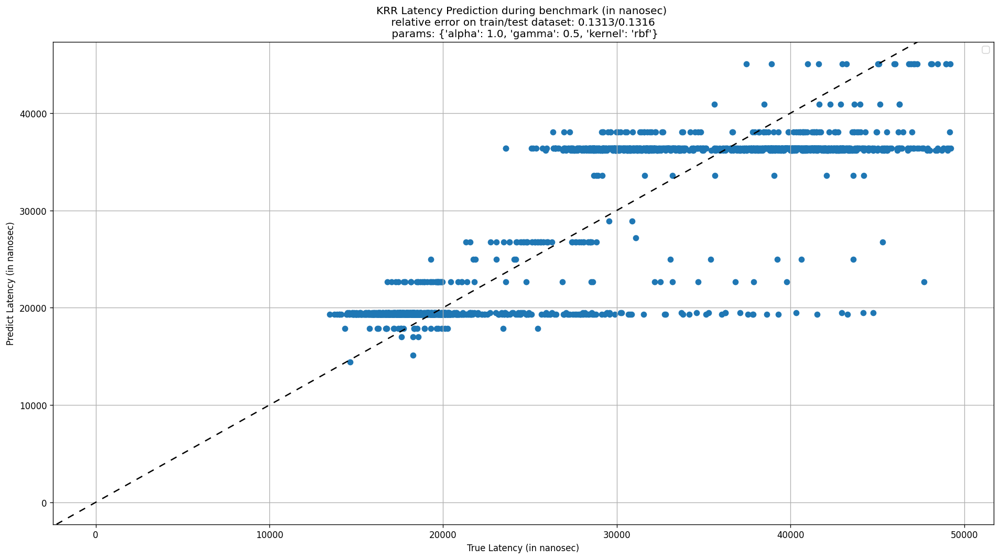

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.31548261 -0.32041813
 -0.32088612 -0.32136573 -0.28520969 -0.29480884 -0.29523904 -0.29556789
 -0.23460988 -0.25052617 -0.25154093 -0.25187274 -0.17370045 -0.18973456
 -0.19192284 -0.19425198]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1737/0.1647
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


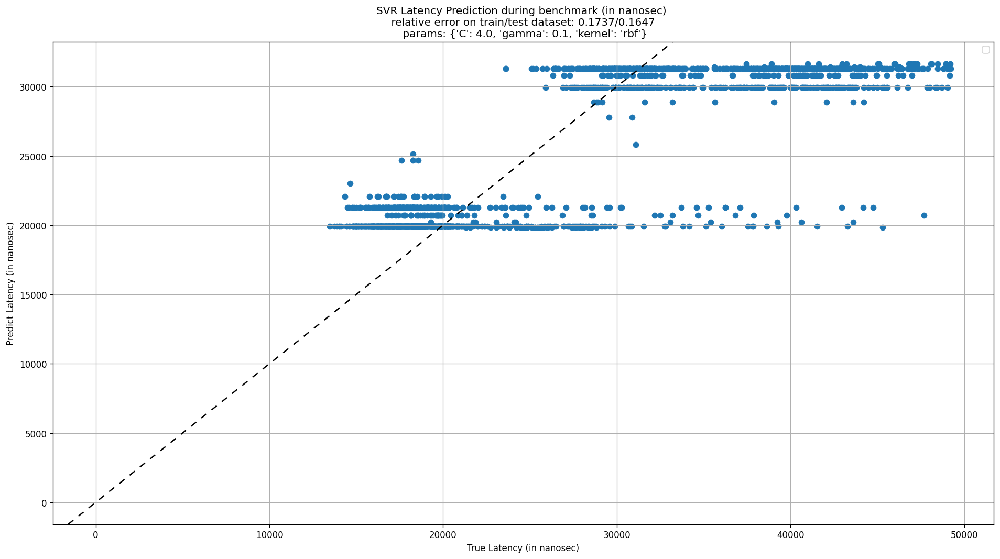

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1331/0.1325
Best Params: {'alpha': 1, 'epsilon': 1.1}


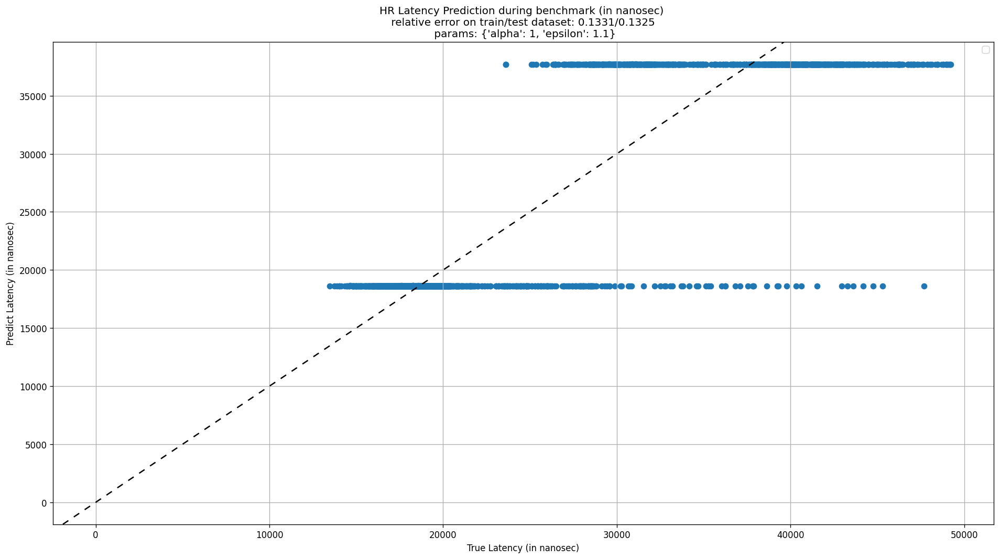

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1241/0.1234
Best Params: {'criterion': 'mae', 'max_depth': 7, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


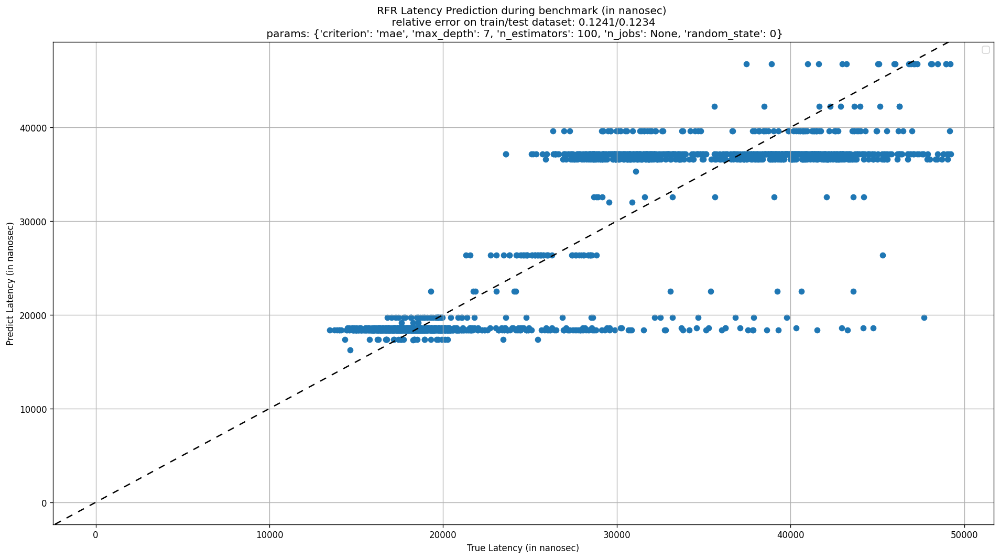

Records: Time of Each Component with shape: (39648, 17)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of Read-Only Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp,Average Time Of R/W Txn
0,1,220371674,2415396441726226,4510530,445043,210299134,267411,209087294,30626,138226,3898,62595,678526,656968,5204,2415396655829712,0
1,2,20336763,2415396760508633,1200845,441927,17758477,89330,16364590,24008,109371,769,23046,1137208,1119785,6148,2415396778655631,0
2,3,14663267,2415396793689176,592468,458714,12828318,81573,12530190,20472,90590,829,23128,72007,56565,5488,2415396806765921,0
3,4,14532760,2415396818299399,453528,455322,12791523,68720,12505476,24635,84662,641,24147,73631,59951,4584,2415396831548651,0
4,5,9524874,2415396840719673,511425,387532,8314746,69093,8010947,27933,67596,630,20755,108512,93384,5515,2415396849169173,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39643,39644,4151021,2415696340316461,1414982,53807,2592184,19720,2526720,3673,15808,149,2596,20617,17078,1202,2415696342963826,0
39644,39645,4060289,2415696347263483,1350763,51326,2582452,19293,2516385,3394,16751,92,2621,21210,17730,1148,2415696349897385,0
39645,39646,4163591,2415696354355153,1448464,47266,2583548,19644,2515354,4216,17626,92,2902,20829,17140,1283,2415696356989008,0
39646,39647,4010794,2415696362981005,1269021,50768,2604412,24025,2533889,3941,16377,86,2601,20763,17310,1154,2415696365637576,0


Features: Features with shape: (39648, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,100,0,1,50,0.0,200,0,0,0,0,0,100,0,22
1,2,322862681,100,0,1,50,0.0,200,0,0,0,0,0,100,0,25
2,3,356646257,100,0,1,50,2.0,200,0,0,0,0,0,100,0,26
3,4,381559567,100,0,1,50,2.0,200,0,0,0,0,0,100,0,27
4,5,404188318,100,0,1,50,2.0,200,0,0,0,0,0,100,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39643,39644,299903357551,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
39644,39645,299910372048,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
39645,39646,299917370189,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
39646,39647,299926171570,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


In microsec, Number of bins: 36, nBins: [19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36.
 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54.]
Mean Latency: 22.66, Std Latency: 4.07 (microsec)


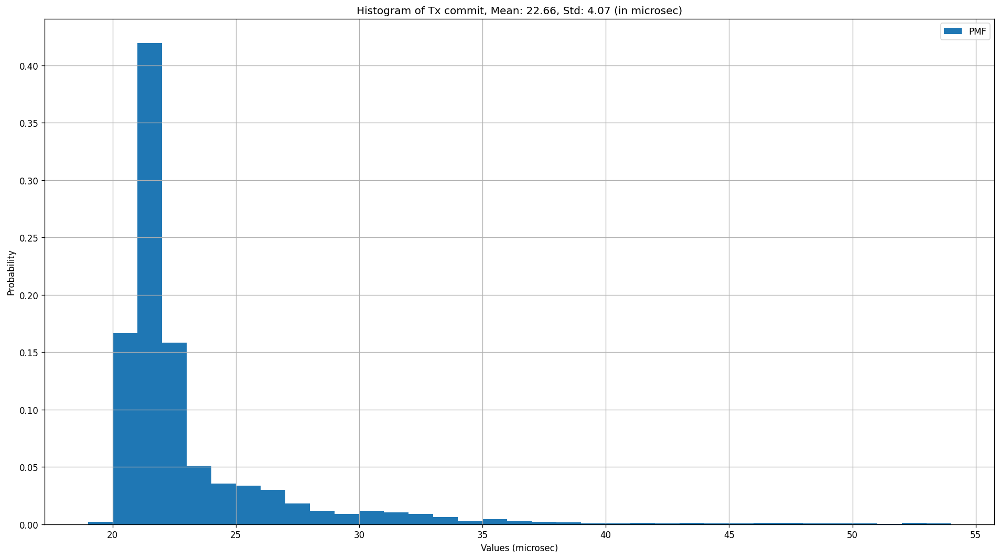

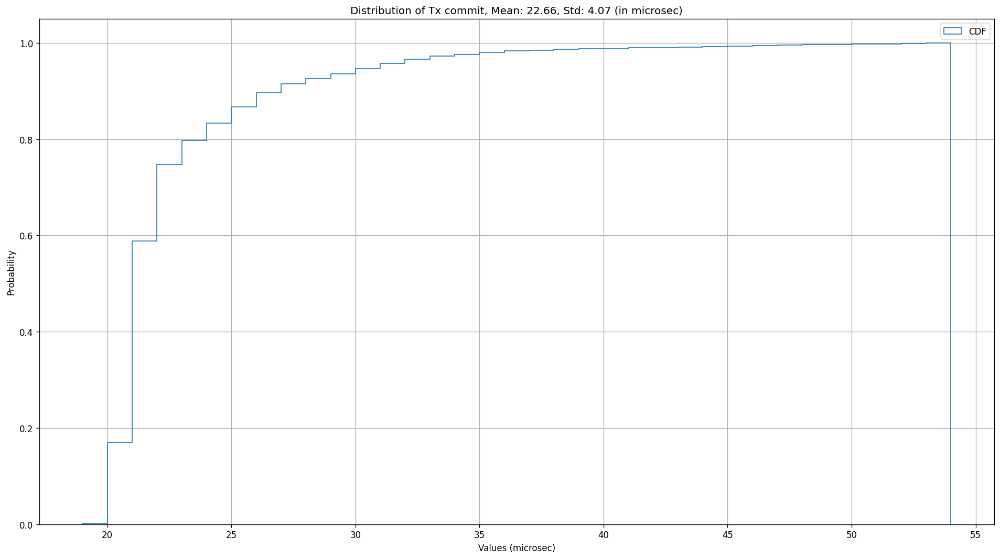

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,48
1,100,0,1,50,3.0,200,0,0,0,0,0,100,0,56
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,60
3,100,0,1,50,4.0,200,0,0,0,0,0,100,0,62
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67


OU - Tx commit Targets shape: (10000,)


0       50206
1       52700
2       52102
3       49003
4       48475
        ...  
9995    20544
9996    21311
9997    21142
9998    21504
9999    20829
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0918/0.0924
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


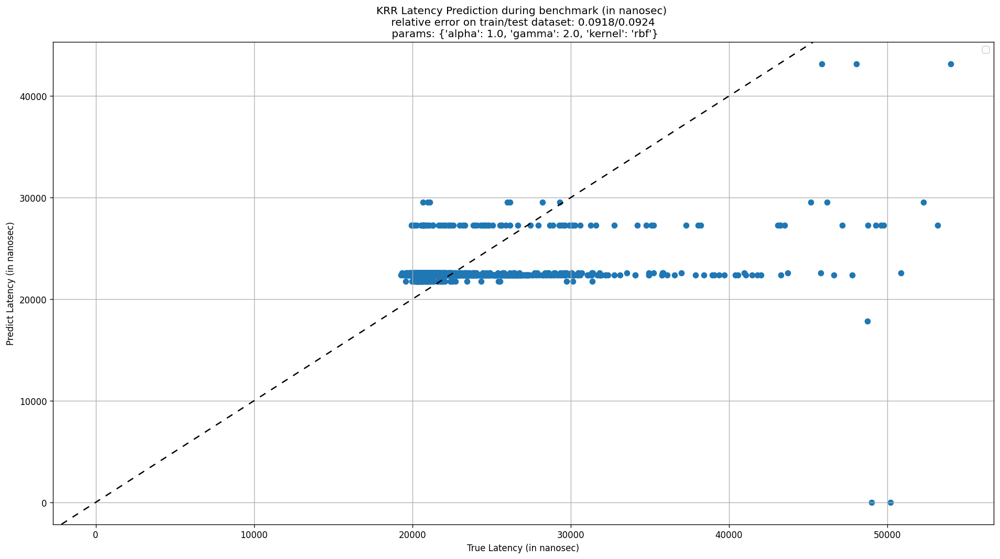

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.07181262 -0.07177462
 -0.07177681 -0.07178466 -0.07175957 -0.07171821 -0.07170638 -0.07170586
 -0.07170666 -0.07163294 -0.07159297 -0.07158242 -0.07164644 -0.07150165
 -0.07142648 -0.07141572]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0714/0.0715
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


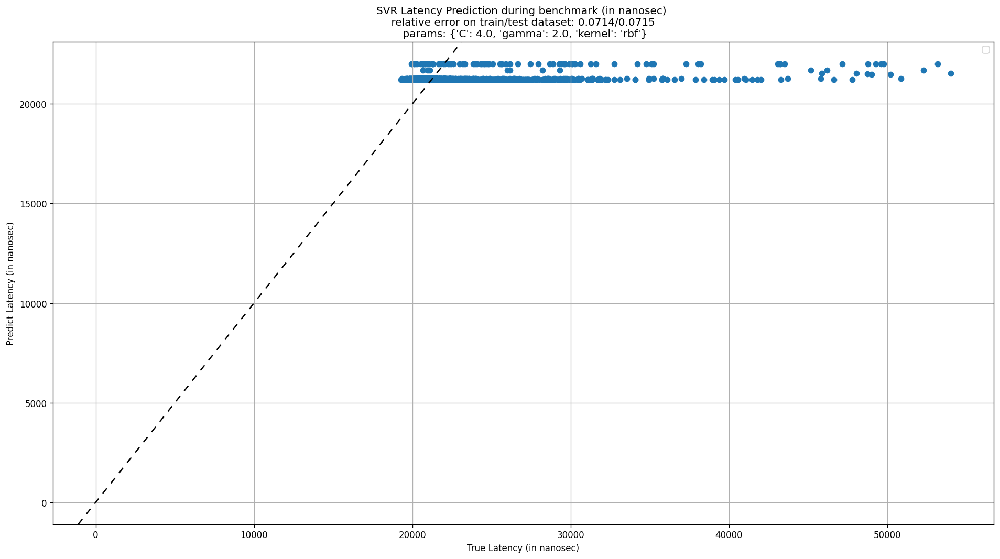

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0711/0.0712
Best Params: {'alpha': 1, 'epsilon': 1.1}


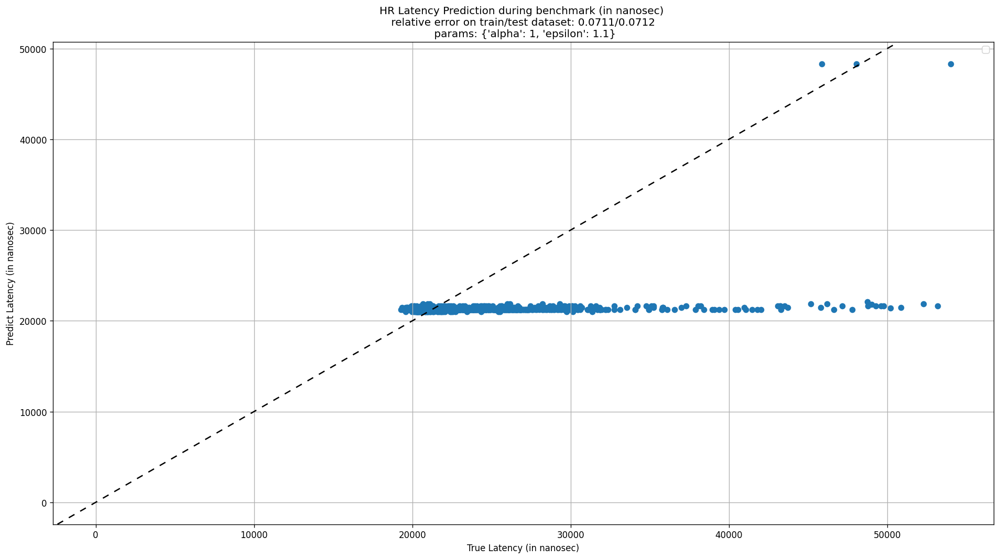

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0701/0.07
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


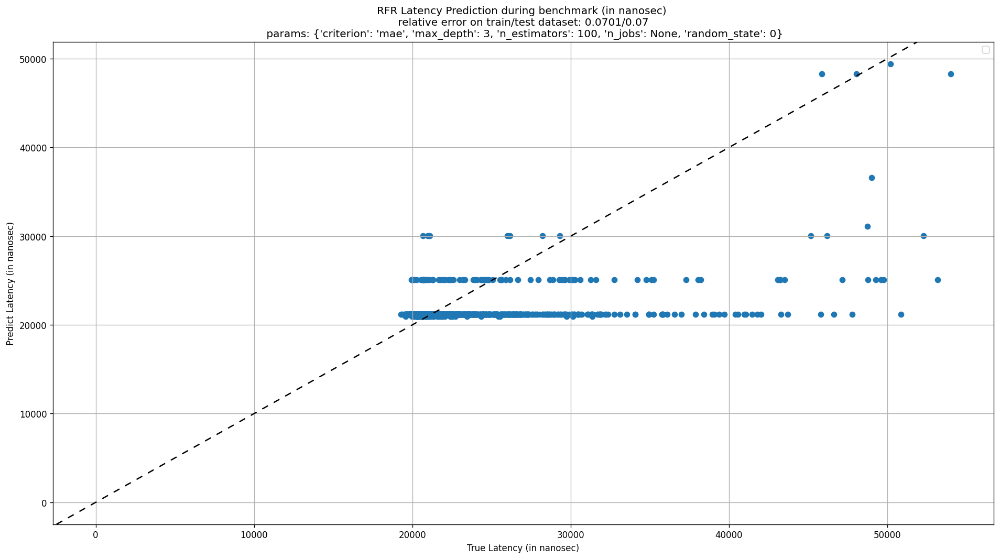

In microsec, Number of bins: 33, nBins: [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 15. 16. 17. 18. 19. 20.
 21. 22. 23. 24. 25. 26. 34. 37. 38. 40. 42. 46. 53. 56. 71.]
Mean Latency: 3.22, Std Latency: 2.02 (microsec)


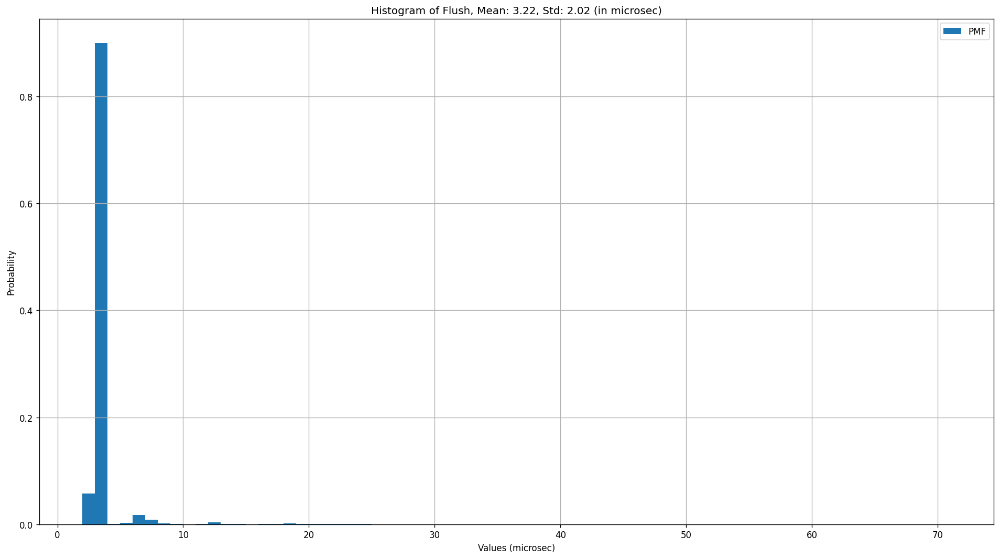

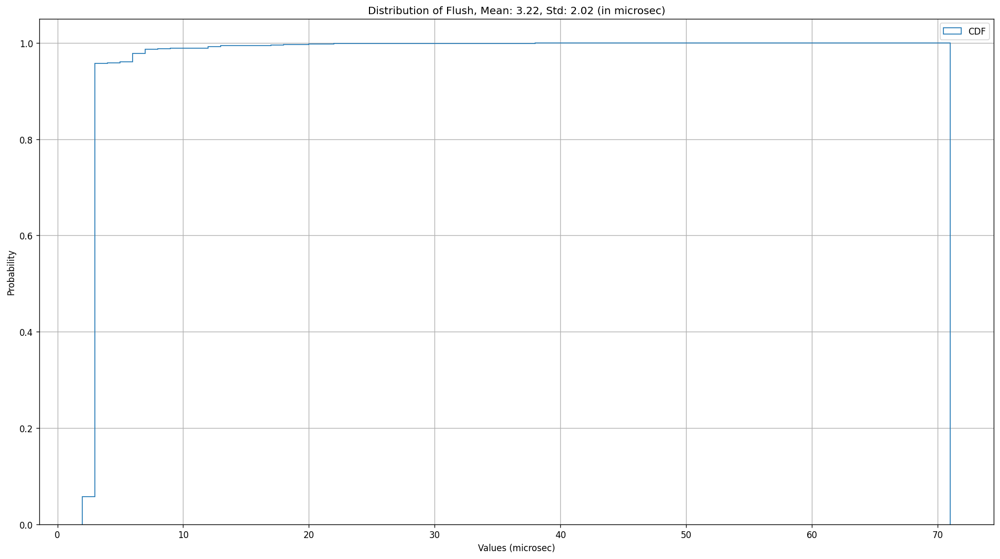

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,2.0,200,0,0,0,0,0,100,0,30
1,100,0,1,50,4.0,200,0,0,0,0,0,100,0,35
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,37
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,38
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - Flush Targets shape: (10000,)


0       18163
1       19497
2       22777
3       20934
4       18281
        ...  
9995     2613
9996     2622
9997     2765
9998     2804
9999     2902
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1128/0.1199
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


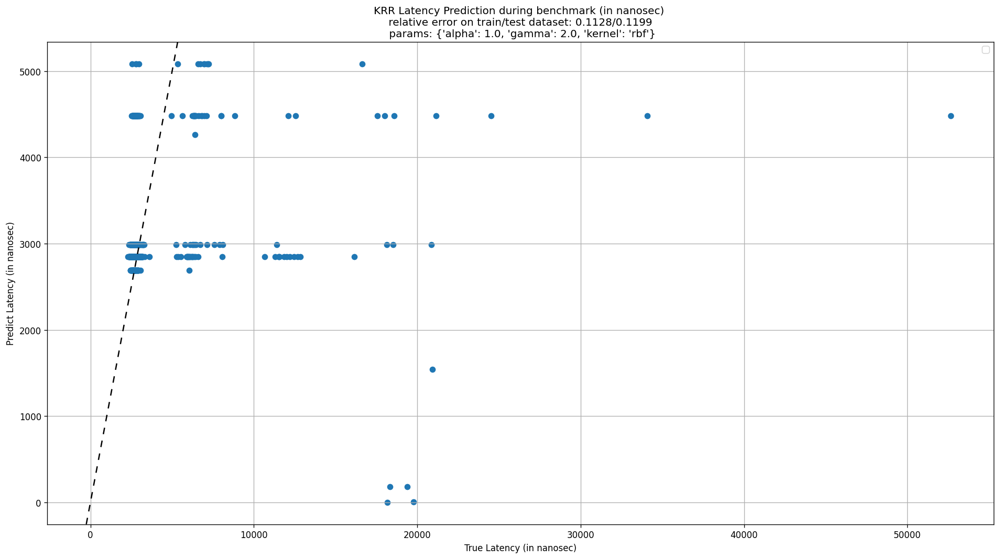

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.0645655  -0.06456259
 -0.06455714 -0.06455473 -0.06456264 -0.0645424  -0.06452933 -0.06453221
 -0.06456157 -0.06452917 -0.06452523 -0.0645368  -0.06456345 -0.06452913
 -0.0645227  -0.06453   ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0645/0.071
Best Params: {'C': 4.0, 'gamma': 1.0, 'kernel': 'rbf'}


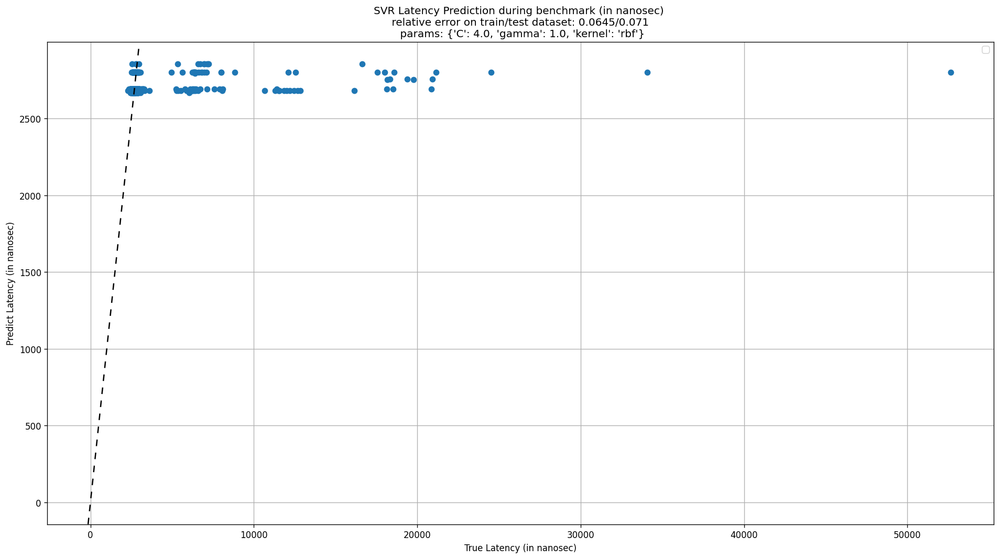

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0641/0.0702
Best Params: {'alpha': 0.01, 'epsilon': 1.1}


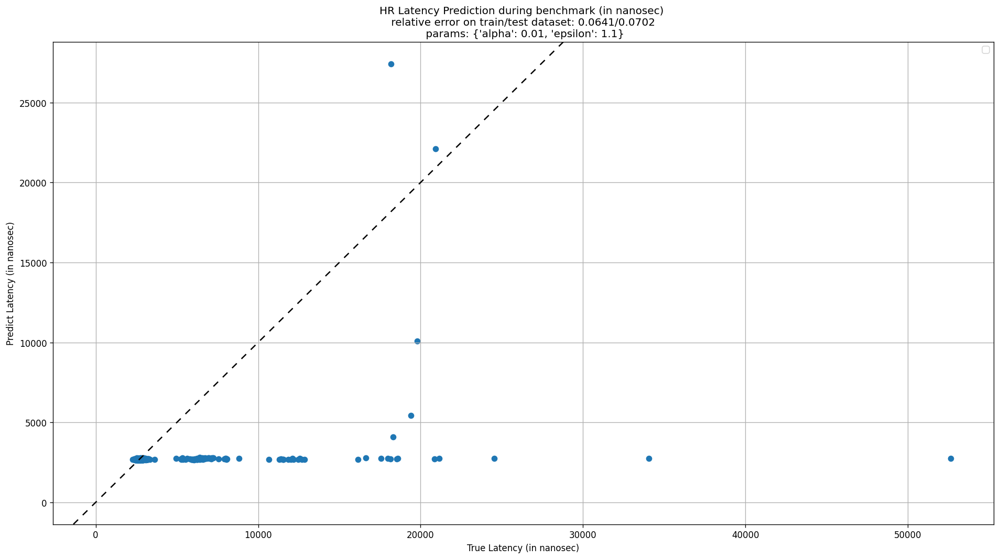

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0649/0.0691
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


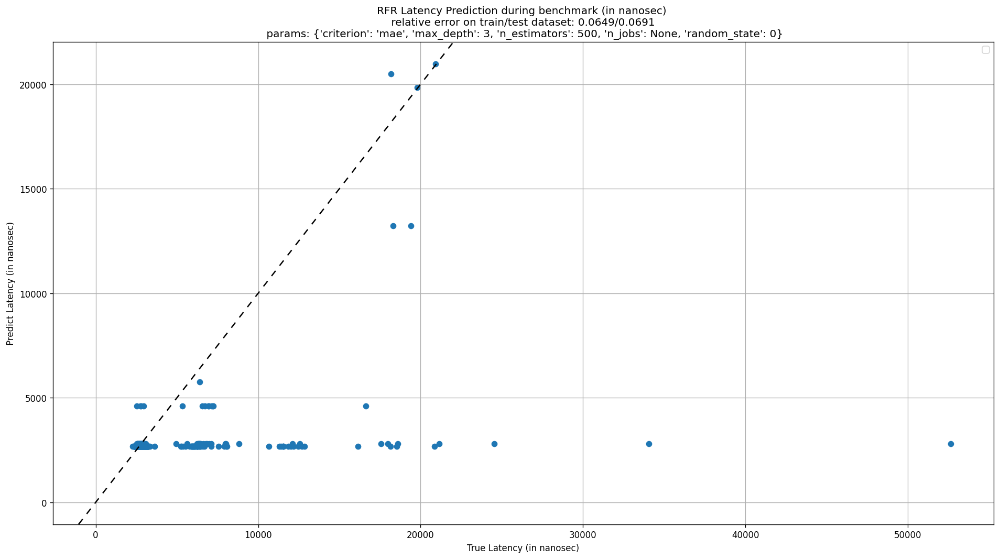

In microsec, Number of bins: 12, nBins: [14. 15. 16. 17. 18. 19. 20. 21. 22. 23. 24. 25.]
Mean Latency: 17.85, Std Latency: 1.87 (microsec)


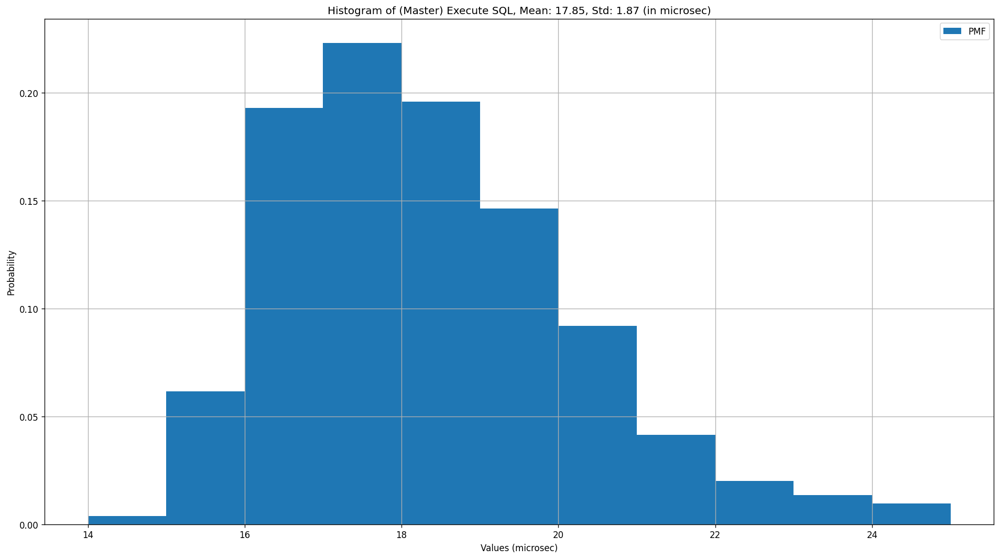

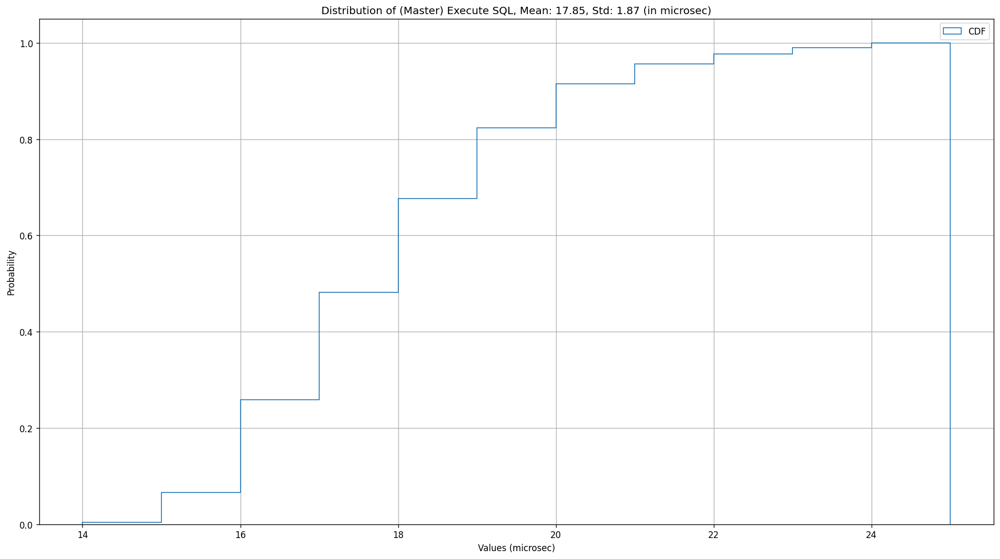

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
1,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       24400
1       24030
2       22541
3       19698
4       17664
        ...  
9995    17654
9996    15775
9997    16142
9998    16056
9999    17626
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0805/0.0801
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


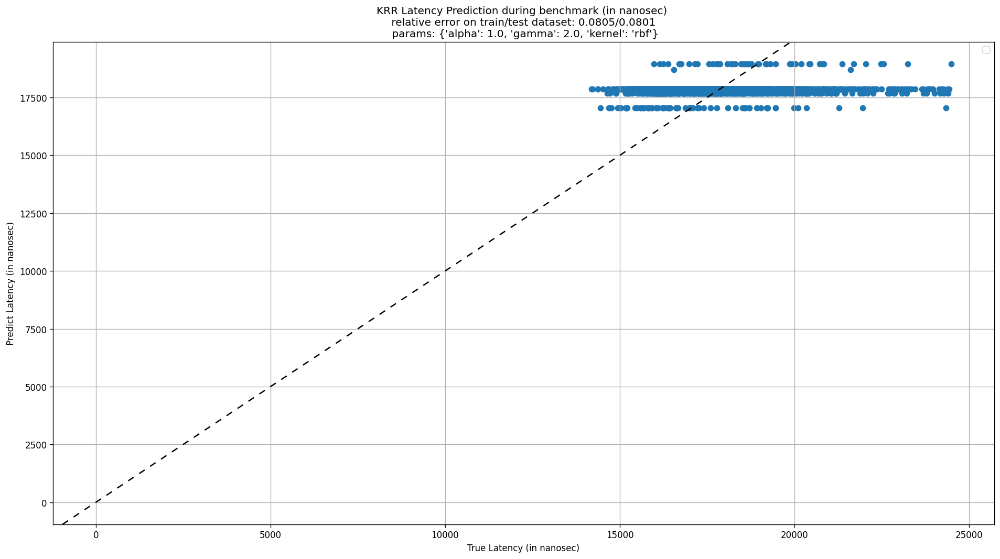

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.07951592 -0.07949069
 -0.07943917 -0.07939535 -0.07951075 -0.07945891 -0.07937989 -0.07931846
 -0.0795068  -0.07940506 -0.07927527 -0.07918462 -0.07949162 -0.07930902
 -0.07912382 -0.07901682]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.079/0.0791
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


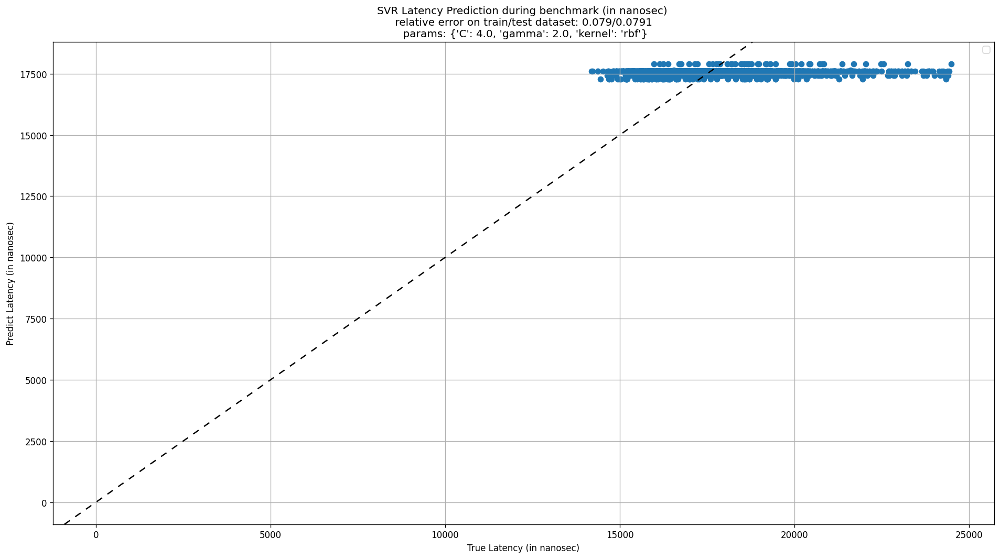

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0794/0.0793
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


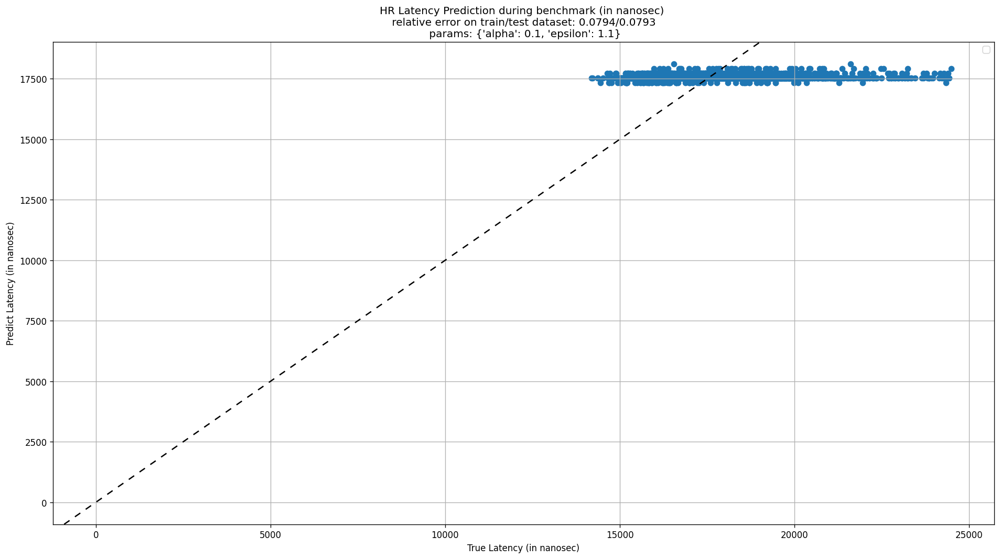

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0785/0.0786
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


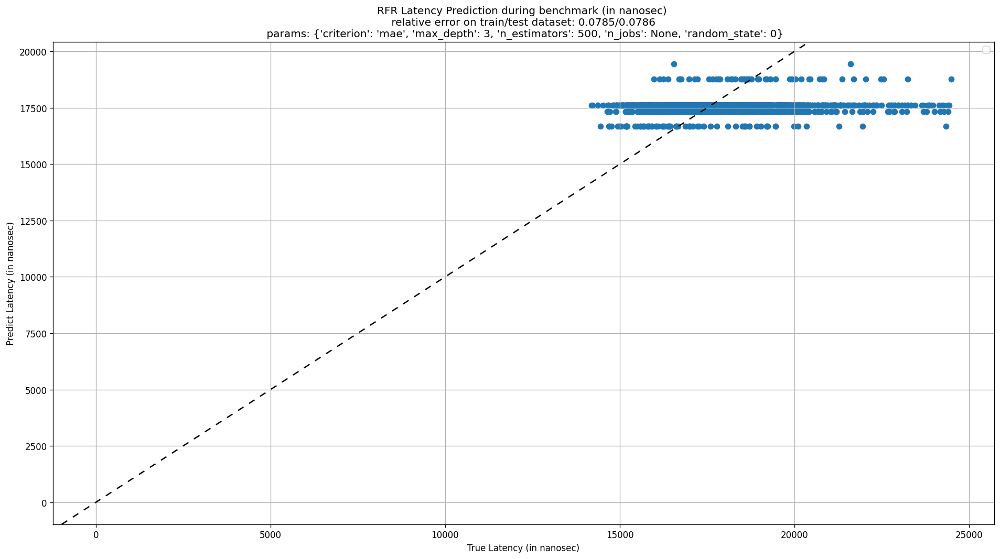

In microsec, Number of bins: 952, nBins: [ 791.  792.  793.  794.  795.  796.  797.  798.  799.  800.  801.  802.
  803.  804.  805.  806.  807.  808.  809.  810.  811.  812.  813.  814.
  815.  816.  817.  818.  819.  820.  821.  822.  823.  824.  825.  826.
  827.  828.  829.  830.  831.  832.  833.  834.  835.  836.  837.  838.
  839.  840.  841.  842.  843.  844.  845.  846.  847.  848.  849.  850.
  851.  852.  853.  854.  855.  856.  857.  858.  859.  860.  861.  862.
  863.  864.  865.  866.  867.  868.  869.  870.  871.  872.  873.  874.
  875.  876.  877.  878.  879.  880.  881.  882.  883.  884.  885.  886.
  887.  888.  889.  890.  891.  892.  893.  894.  895.  896.  897.  898.
  899.  900.  901.  902.  903.  904.  905.  906.  907.  908.  909.  910.
  911.  912.  913.  914.  915.  916.  917.  918.  919.  920.  921.  922.
  923.  924.  925.  926.  927.  928.  929.  930.  931.  932.  933.  934.
  935.  936.  937.  938.  939.  940.  941.  942.  943.  944.  945.  946.
  947.  94

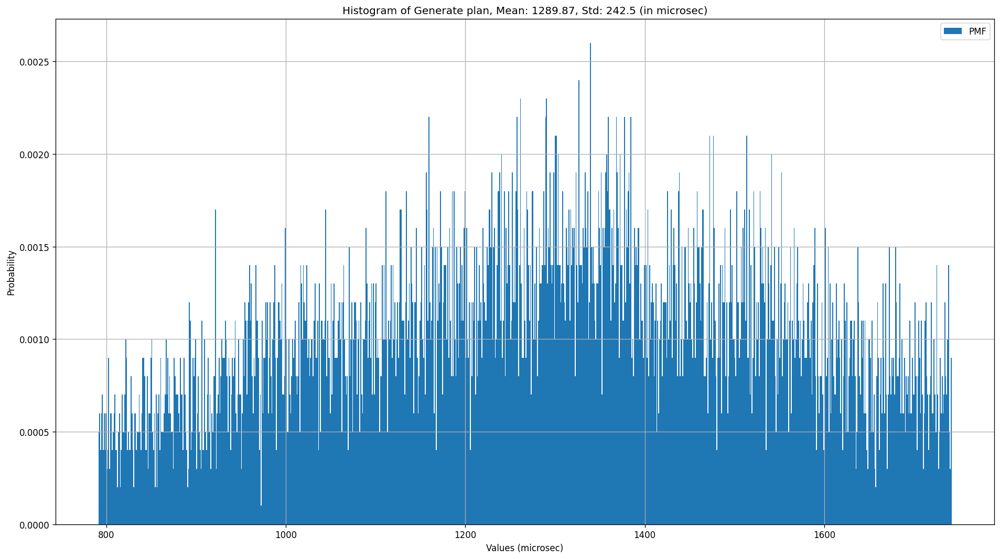

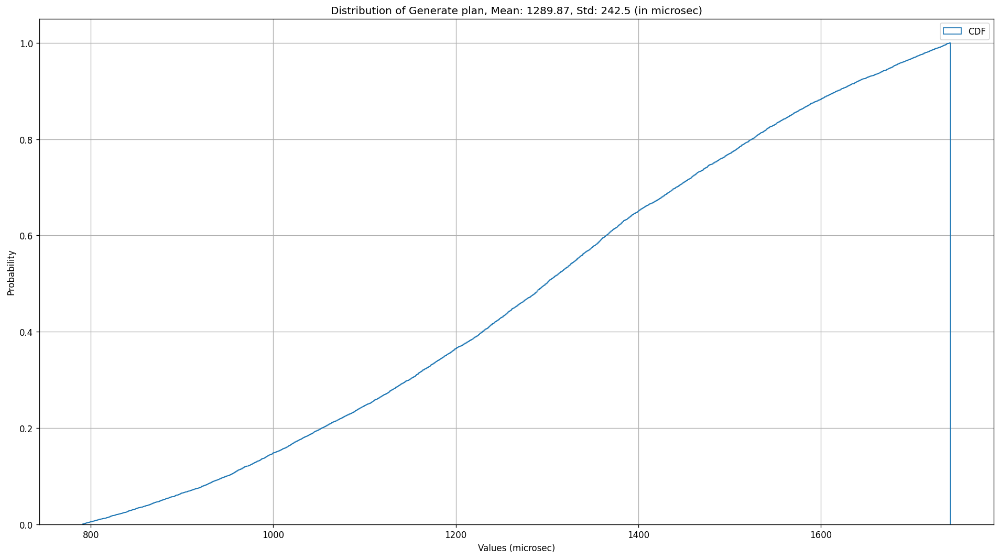

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,38
1,100,0,1,50,5.0,200,0,0,0,0,0,100,0,67
2,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67
9997,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9998,100,0,1,50,2.0,200,0,0,0,0,0,100,0,67


OU - Generate plan Targets shape: (10000,)


0        823357
1        800440
2        804642
3        812342
4        832848
         ...   
9995    1352545
9996    1255441
9997    1356738
9998    1350763
9999    1448464
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1642/0.1707
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


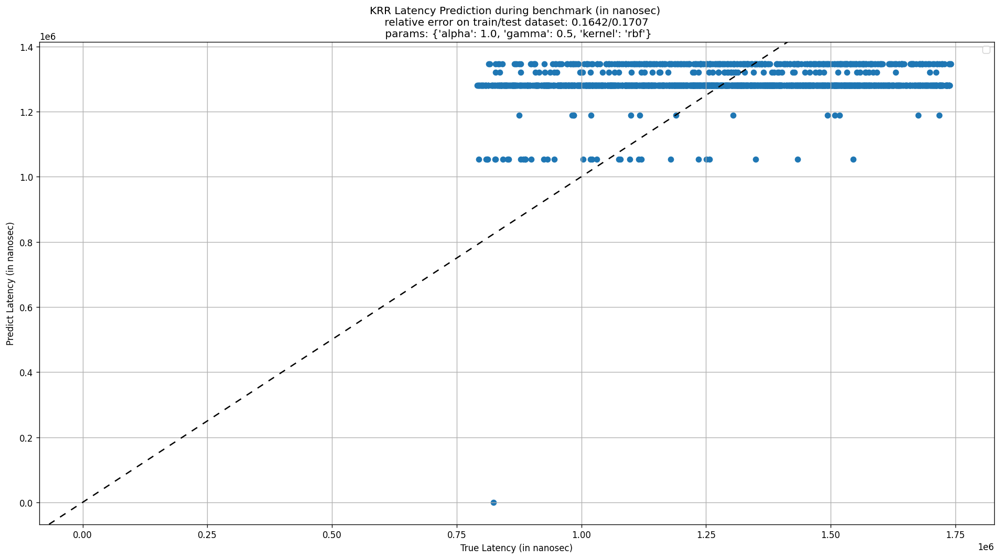

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.16904032 -0.16903836
 -0.16903485 -0.1690308  -0.16904025 -0.16903607 -0.16902832 -0.16901876
 -0.16904012 -0.16903102 -0.16901427 -0.16899608 -0.16903988 -0.1690165
 -0.16898439 -0.16895157]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.169/0.1749
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


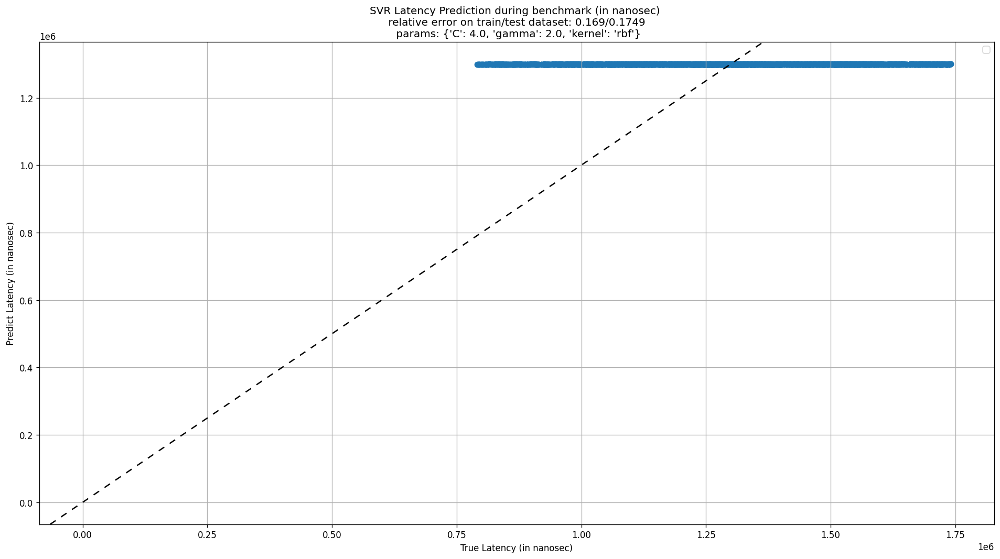

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1679/0.1738
Best Params: {'alpha': 1, 'epsilon': 2}


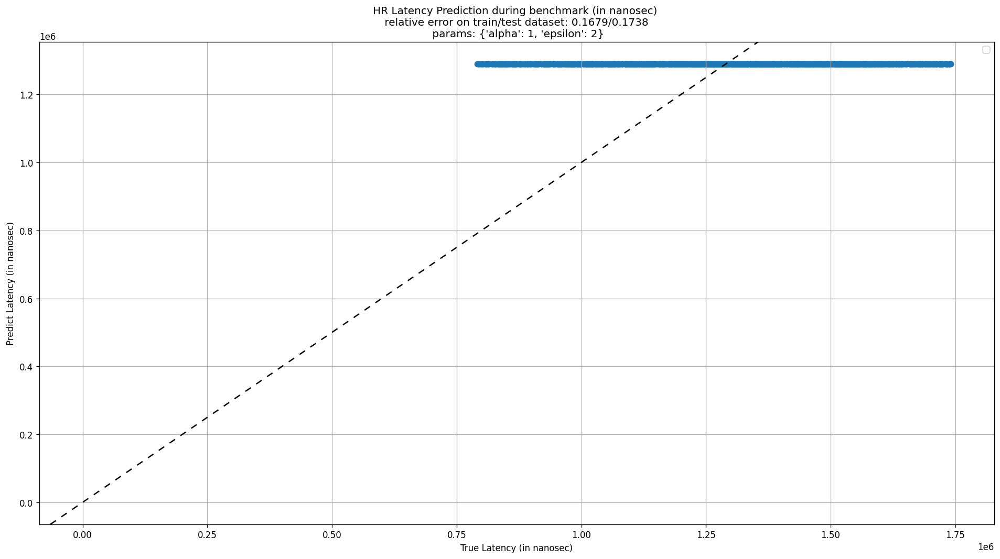

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.1642/0.1704
Best Params: {'criterion': 'mse', 'max_depth': 3, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


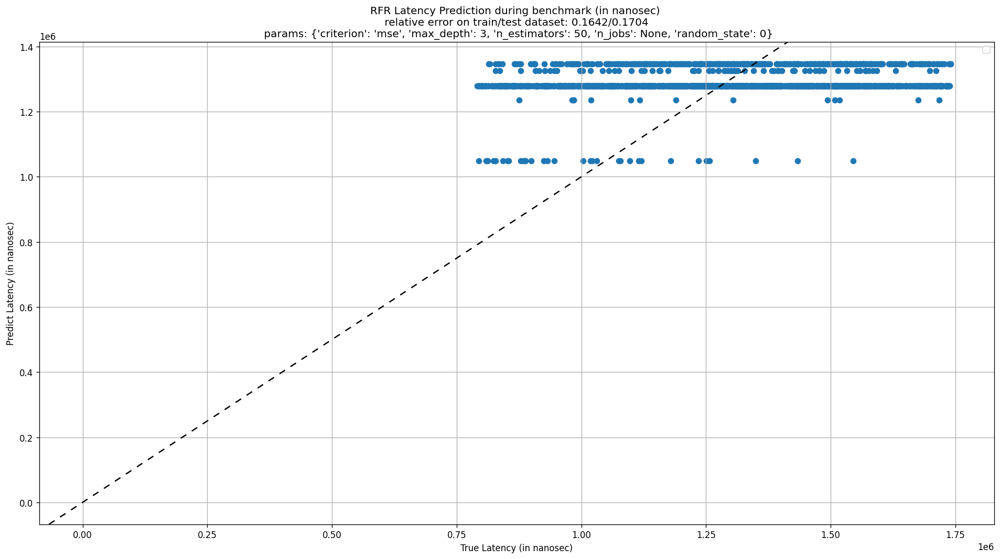

Records: Time of Each Component with shape: (30764, 16)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of R/W Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp
0,1,71248986,2420669787700191,6290905,494040,59357263,319526,43942036,37838,358466,4355,14117666,538660,500723,19305,2420669850896465
1,2,29667292,2420669961736027,1433293,401653,27128667,184689,16201897,20113,258653,758,9022246,1427853,1409065,6102,2420669989122840
2,3,21040057,2420670006150304,1277449,407639,18905542,162736,9835440,18050,276993,833,8441795,158168,143844,4784,2420670025197817
3,4,17801590,2420670038512715,1082531,545164,15792586,136459,8799393,23053,244476,1040,6444060,130392,112758,6309,2420670054461789
4,5,15261526,2420670065622794,892186,430927,13318511,154108,7354818,22991,299207,940,5346776,126410,108758,6105,2420670079399793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30759,30760,5488955,2420969660272144,228331,16577,5127189,33267,2541420,3757,61479,134,2436892,46781,42574,1168,2420969665461227
30760,30761,5509123,2420969669241176,230308,39925,5121300,32413,2527528,3659,94410,109,2416859,43081,38887,1067,2420969674431628
30761,30762,5521069,2420969681482863,227329,45470,5146671,33150,2540095,4309,59560,135,2460503,45346,41280,1061,2420969686684010
30762,30763,5494054,2420969690301247,222233,39679,5120598,33242,2606043,3973,63477,155,2367378,43059,38832,1215,2420969695490431


Features: Features with shape: (30764, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,100,100,1,50,0.0,200,0,100,0,100,3300,200,0,22
1,2,179811047,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,25
2,3,224513271,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,26
3,4,257015271,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,27
4,5,284493137,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30759,30760,299880328559,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
30760,30761,299889278722,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
30761,30762,299901519247,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
30762,30763,299910352646,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67


In microsec, Number of bins: 30, nBins: [37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54.
 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66.]
Mean Latency: 47.64, Std Latency: 4.44 (microsec)


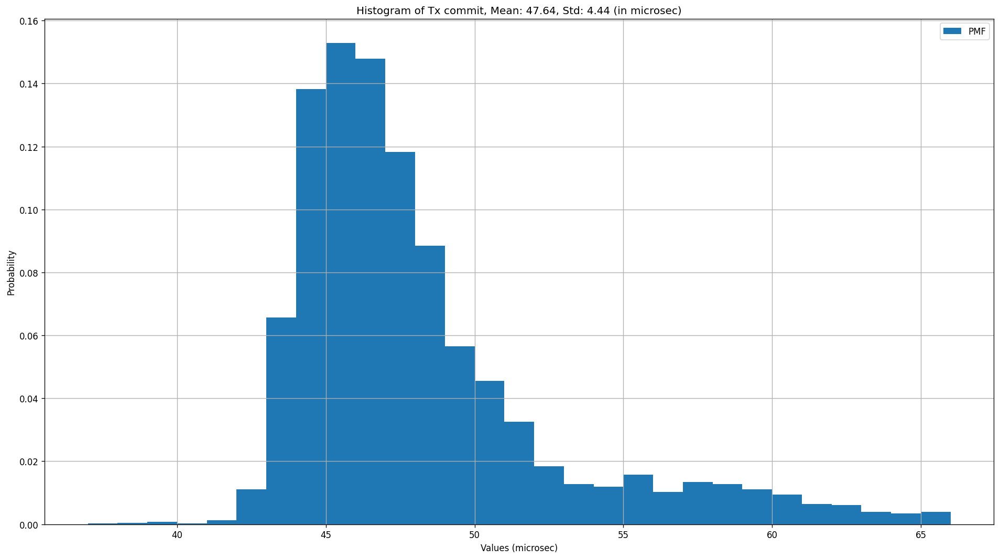

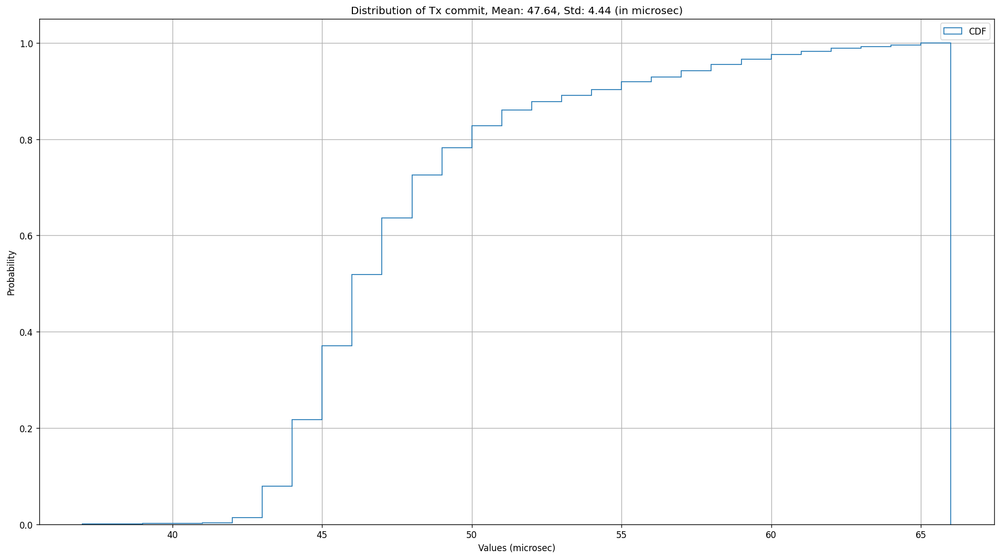

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
1,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
2,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
3,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
4,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9996,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9997,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9998,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67


OU - Tx commit Targets shape: (10000,)


0       61465
1       55784
2       56615
3       61967
4       57507
        ...  
9995    45278
9996    58268
9997    44605
9998    45724
9999    43059
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0642/0.0644
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


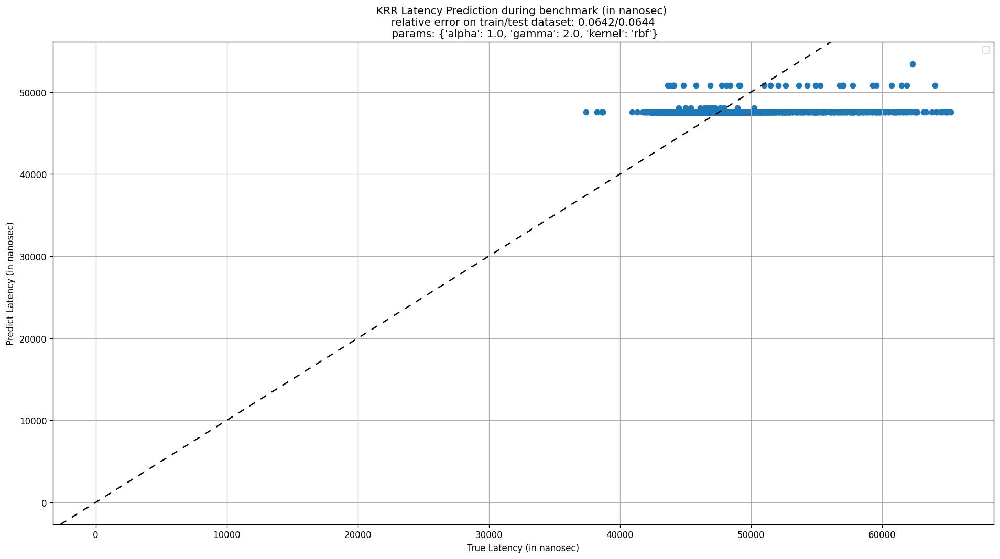

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.05871719 -0.05870378
 -0.05869803 -0.05869011 -0.05871323 -0.05869493 -0.05868479 -0.05867919
 -0.0587077  -0.05868145 -0.05866639 -0.05866015 -0.05869911 -0.05866335
 -0.05864951 -0.05864312]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0586/0.0592
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


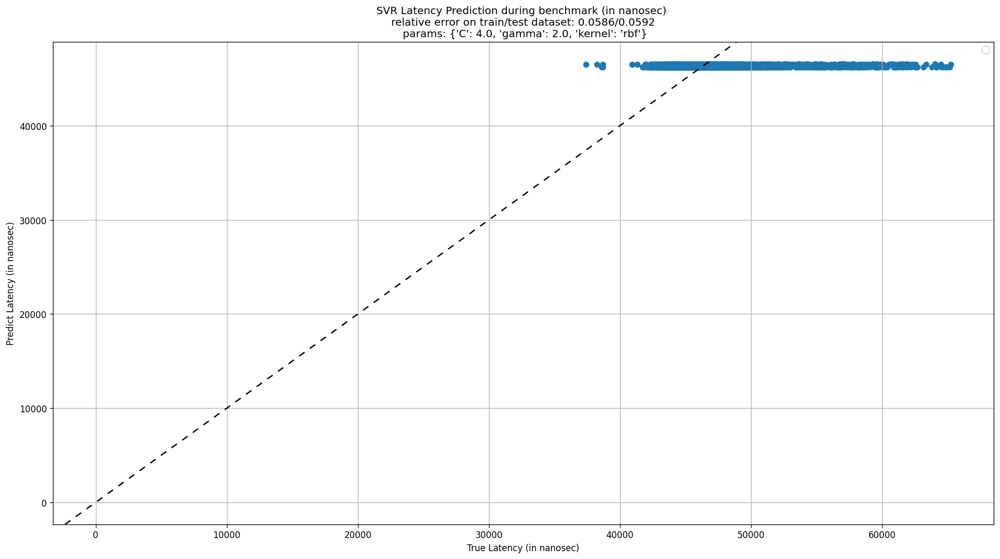

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0587/0.0593
Best Params: {'alpha': 1, 'epsilon': 1.1}


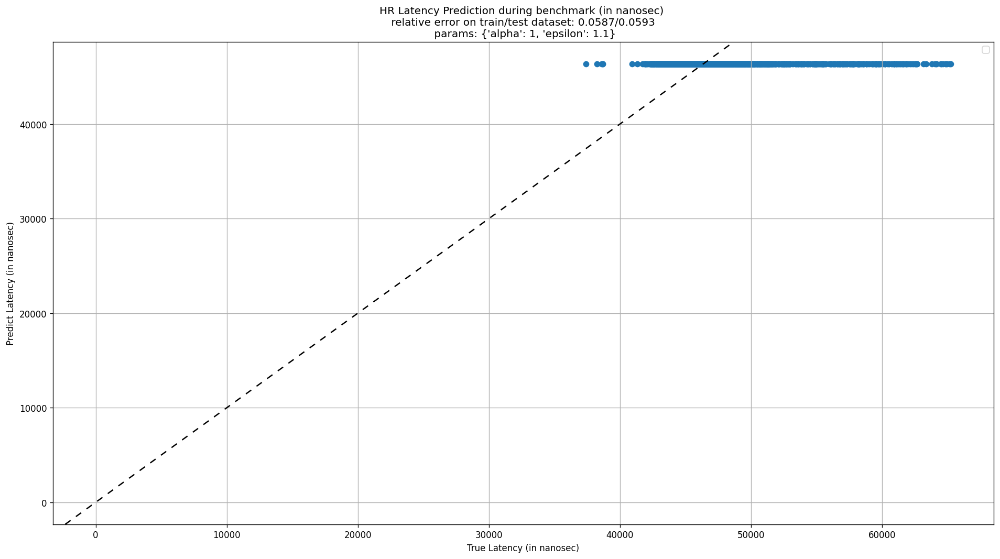

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0584/0.0588
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


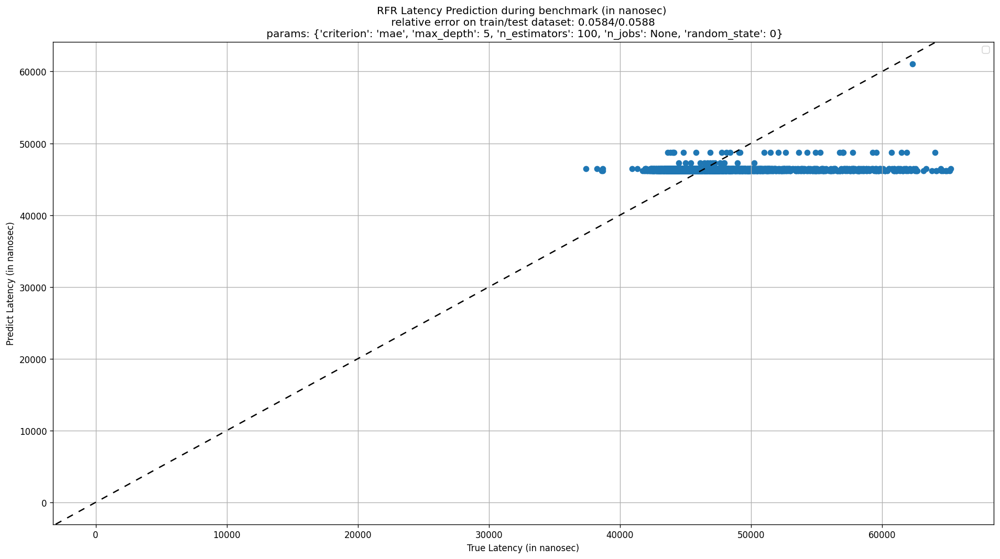

In microsec, Number of bins: 523, nBins: [2327. 2329. 2330. 2331. 2332. 2333. 2334. 2336. 2337. 2338. 2339. 2340.
 2341. 2342. 2343. 2344. 2345. 2346. 2347. 2348. 2349. 2350. 2351. 2352.
 2353. 2354. 2355. 2356. 2357. 2358. 2359. 2360. 2361. 2362. 2363. 2364.
 2365. 2366. 2367. 2368. 2369. 2370. 2371. 2372. 2373. 2374. 2375. 2376.
 2377. 2378. 2379. 2380. 2381. 2382. 2383. 2384. 2385. 2386. 2387. 2388.
 2389. 2390. 2391. 2392. 2393. 2394. 2395. 2396. 2397. 2398. 2399. 2400.
 2401. 2402. 2403. 2404. 2405. 2406. 2407. 2408. 2409. 2410. 2411. 2412.
 2413. 2414. 2415. 2416. 2417. 2418. 2419. 2420. 2421. 2422. 2423. 2424.
 2425. 2426. 2427. 2428. 2429. 2430. 2431. 2432. 2433. 2434. 2435. 2436.
 2437. 2438. 2439. 2440. 2441. 2442. 2443. 2444. 2445. 2446. 2447. 2448.
 2449. 2450. 2451. 2452. 2453. 2454. 2455. 2456. 2457. 2458. 2459. 2460.
 2461. 2462. 2463. 2464. 2465. 2466. 2467. 2468. 2469. 2470. 2471. 2472.
 2473. 2474. 2475. 2476. 2477. 2478. 2479. 2480. 2481. 2482. 2483. 2484.
 2485. 248

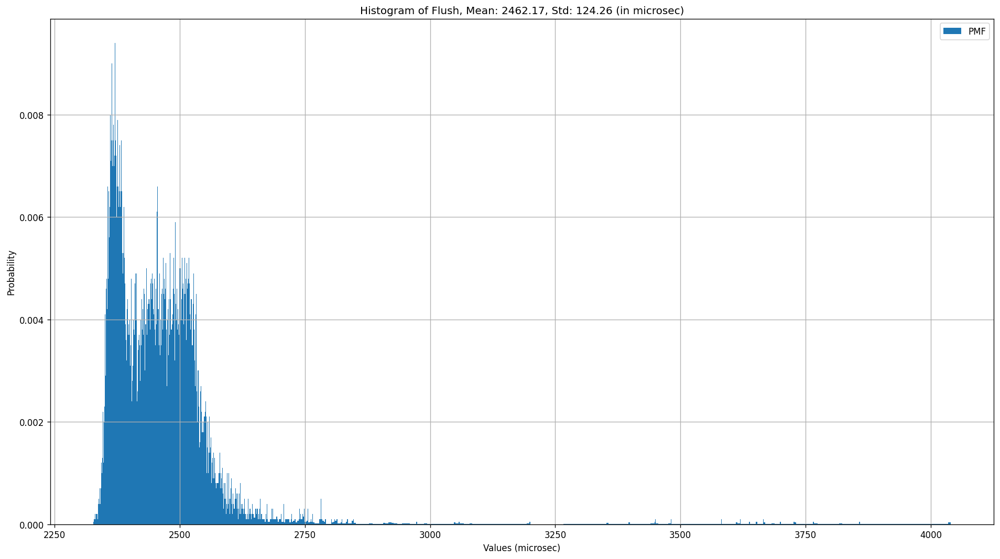

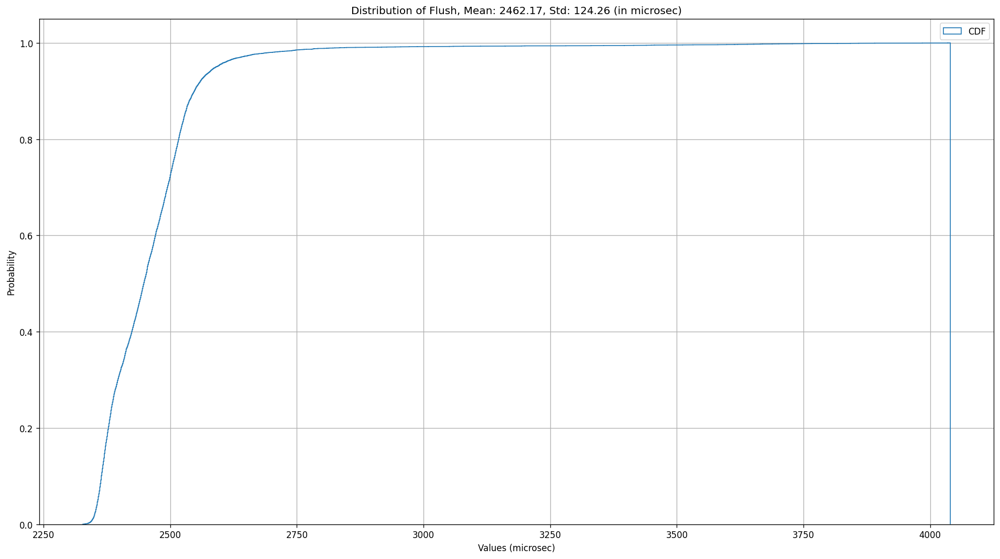

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,40
1,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,42
2,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,48
3,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,51
4,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9996,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9997,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9998,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67


OU - Flush Targets shape: (10000,)


0       3764868
1       3688414
2       3868229
3       3731151
4       3664855
         ...   
9995    2457880
9996    2466996
9997    2357881
9998    2416859
9999    2460503
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0274/0.0291
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


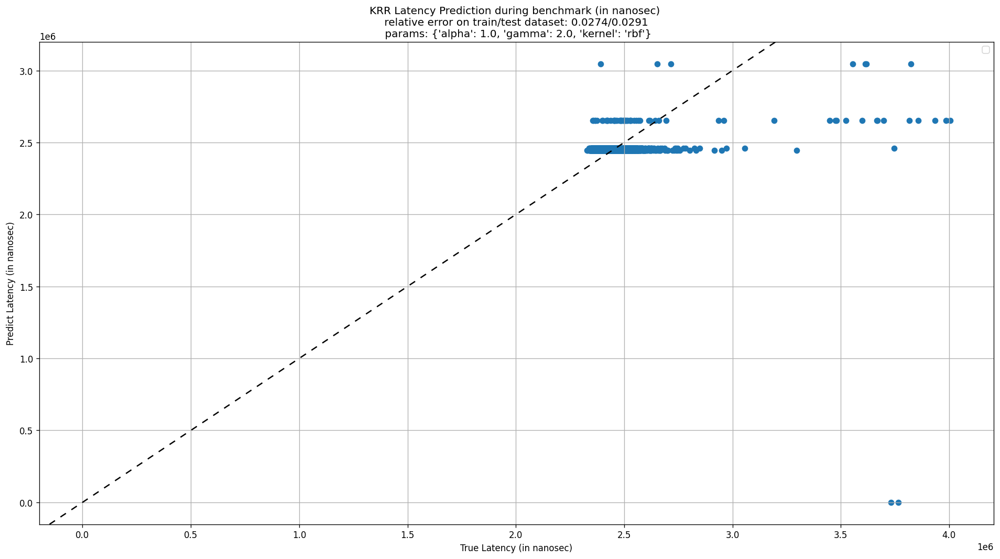

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.0270235  -0.02702179
 -0.02702033 -0.02701899 -0.02702308 -0.02701987 -0.02701676 -0.0270139
 -0.02702243 -0.02701572 -0.02701015 -0.02700447 -0.02702111 -0.0270083
 -0.02699742 -0.02698769]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.027/0.0282
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


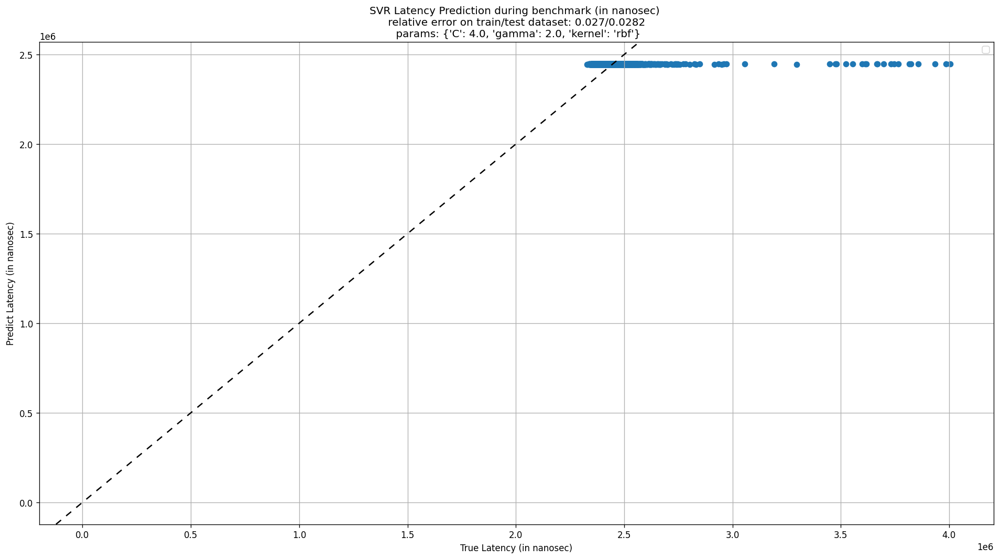

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.027/0.0282
Best Params: {'alpha': 0, 'epsilon': 1.35}


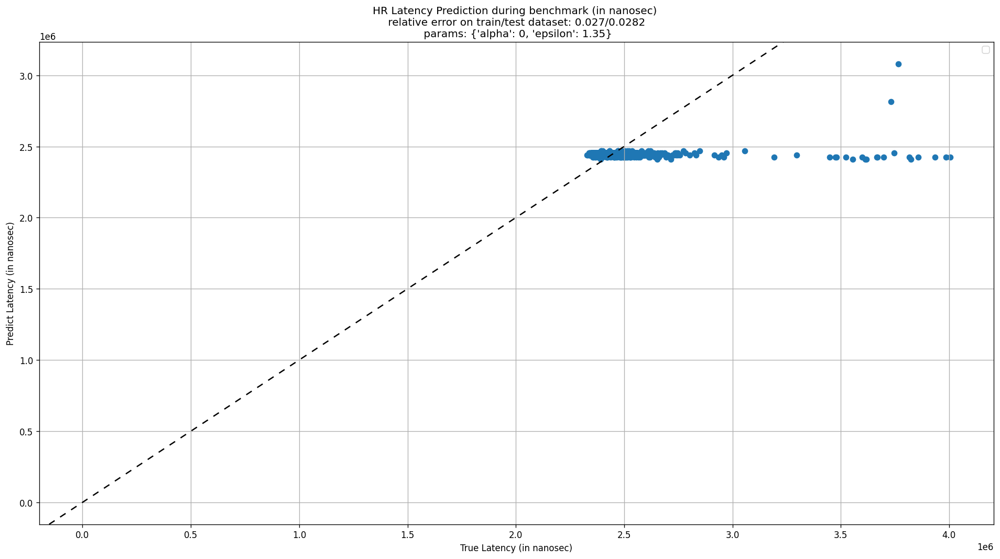

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0264/0.0276
Best Params: {'criterion': 'mae', 'max_depth': 7, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


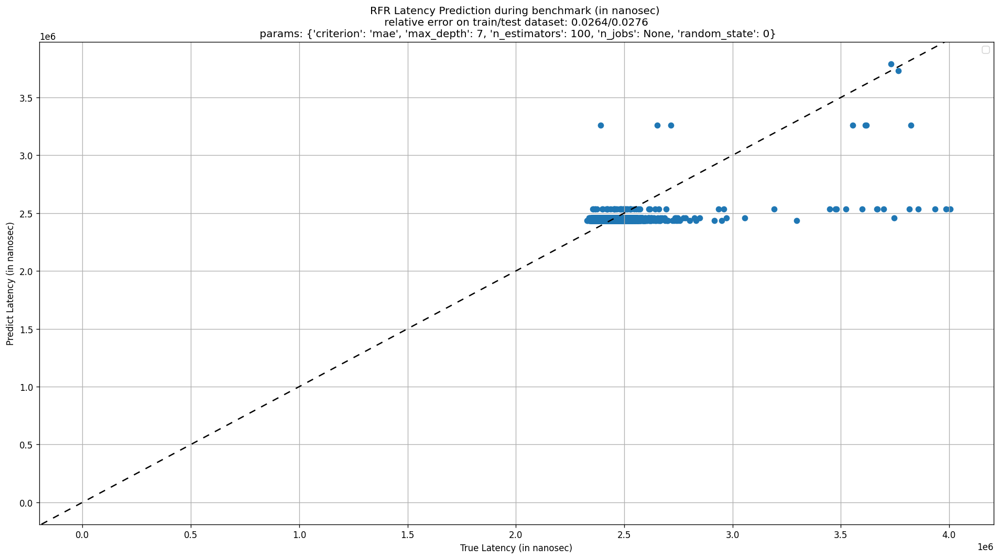

In microsec, Number of bins: 75, nBins: [ 49.  51.  52.  53.  54.  55.  56.  57.  58.  59.  60.  61.  62.  63.
  64.  65.  66.  67.  68.  69.  70.  71.  72.  73.  74.  75.  76.  77.
  78.  79.  80.  81.  82.  83.  84.  85.  86.  87.  88.  89.  90.  91.
  92.  93.  94.  95.  96.  97.  98.  99. 100. 101. 102. 103. 104. 105.
 106. 107. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 119. 120.
 121. 122. 123. 124. 125.]
Mean Latency: 64.22, Std Latency: 9.61 (microsec)


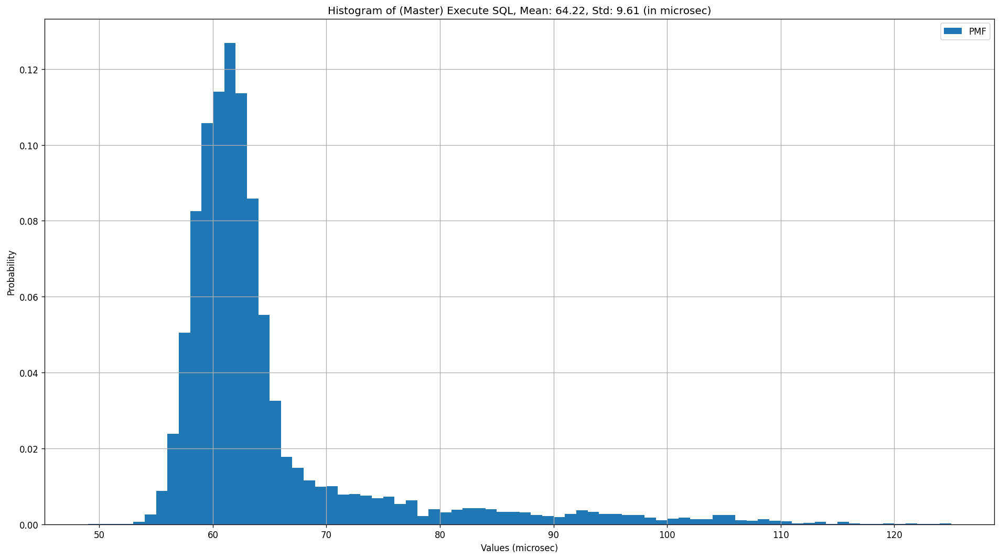

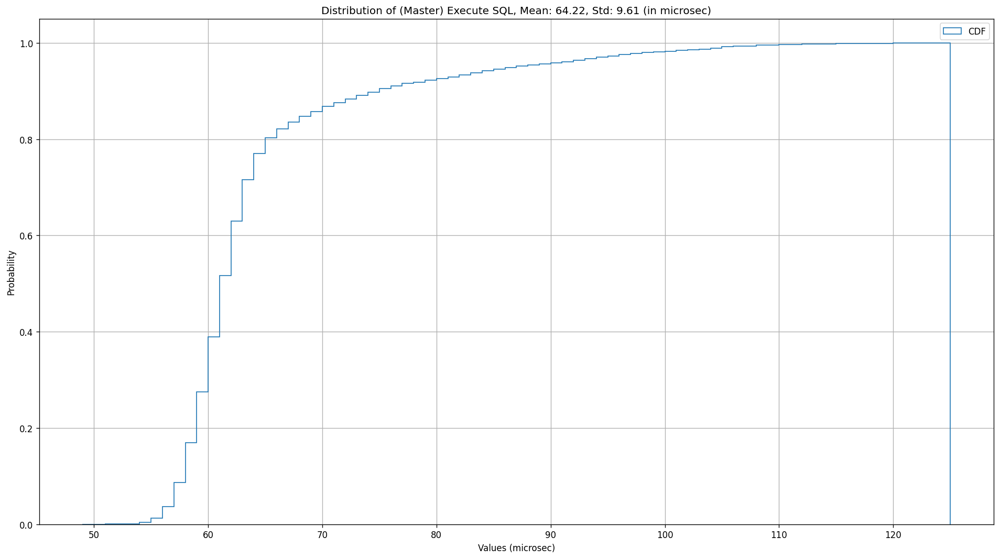

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
1,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
2,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
3,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
4,100,100,1,50,4.0,200,0,100,0,100,3300,200,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9996,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9997,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9998,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0        96934
1       100271
2        89568
3       104596
4        96808
         ...  
9995     86420
9996     60836
9997     60526
9998     57523
9999     94410
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0815/0.0819
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


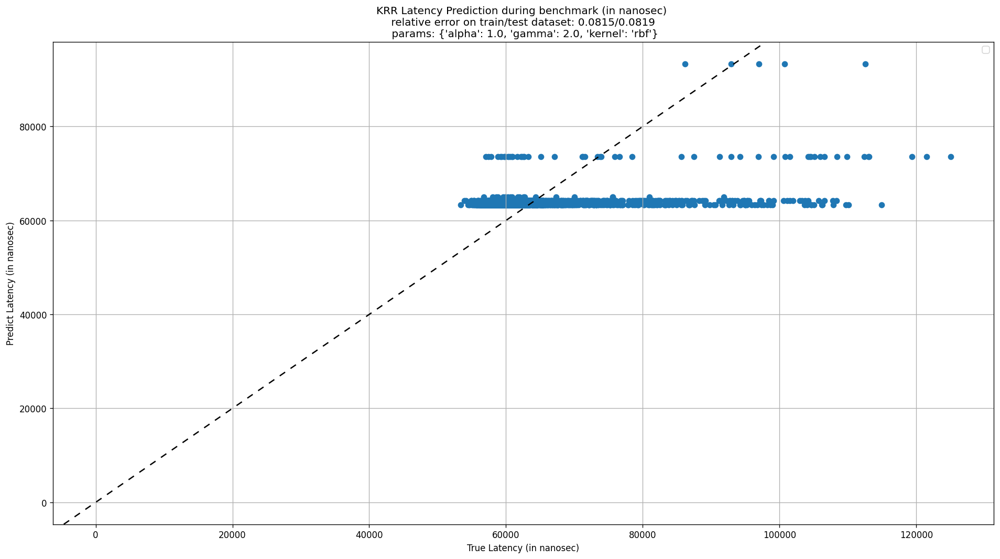

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.06790467 -0.06785595
 -0.06784225 -0.06783355 -0.0678779  -0.06780669 -0.06778492 -0.06777497
 -0.06783356 -0.06772765 -0.06771103 -0.06770887 -0.06776923 -0.06765485
 -0.06765463 -0.06765948]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0677/0.0701
Best Params: {'C': 4.0, 'gamma': 1.0, 'kernel': 'rbf'}


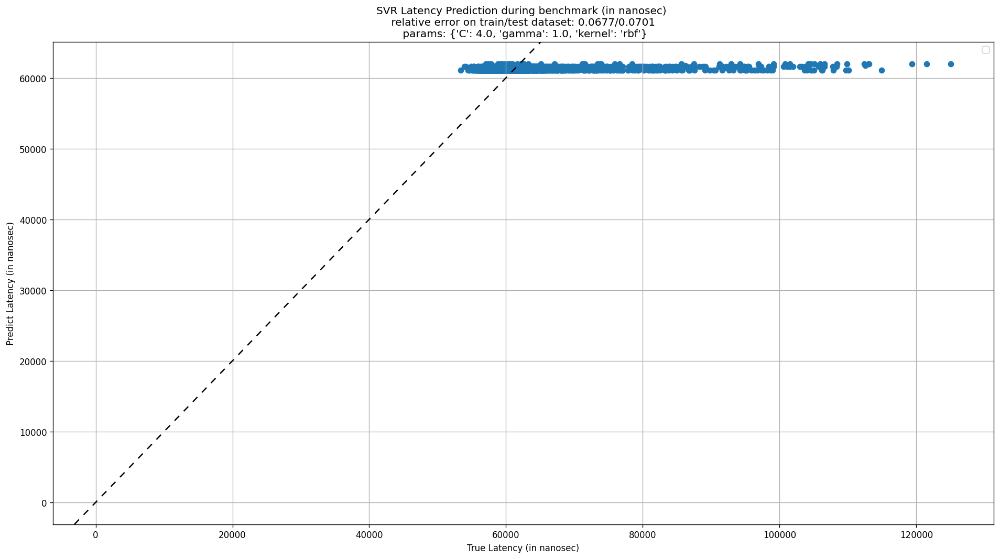

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0678/0.0702
Best Params: {'alpha': 0.1, 'epsilon': 1.35}


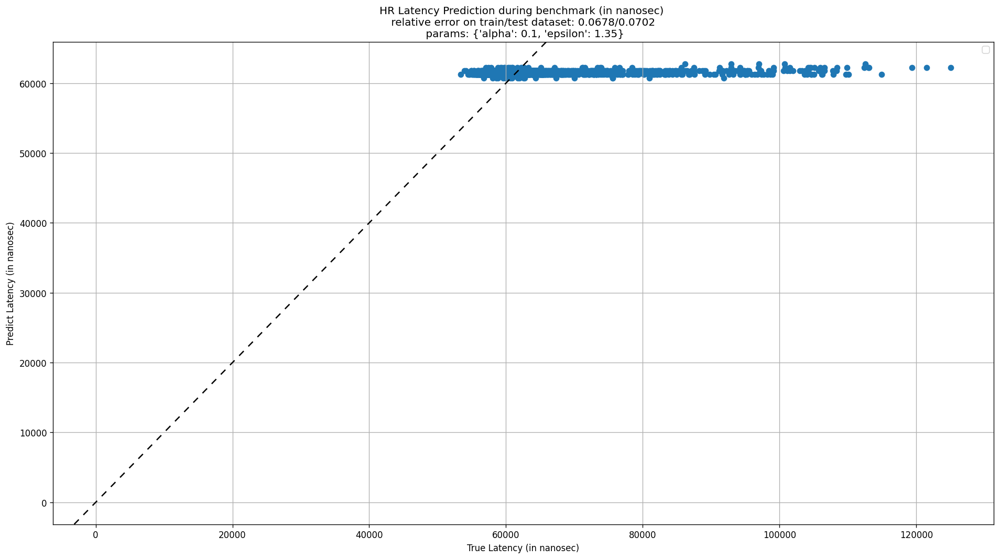

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0671/0.0692
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 50, 'n_jobs': None, 'random_state': 0}


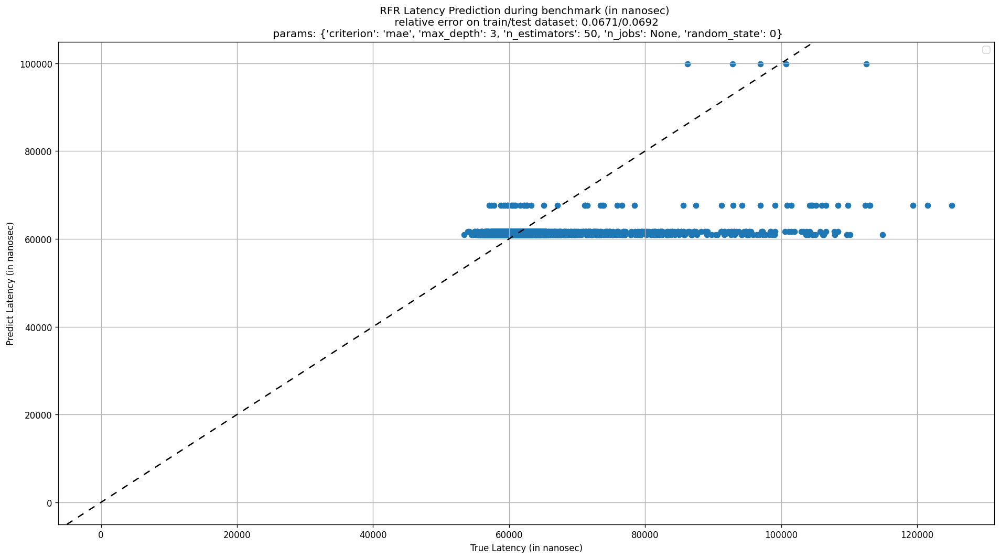

In microsec, Number of bins: 109, nBins: [215. 216. 217. 218. 219. 220. 221. 222. 223. 224. 225. 226. 227. 228.
 229. 230. 231. 232. 233. 234. 235. 236. 237. 238. 239. 240. 241. 242.
 243. 244. 245. 246. 247. 248. 249. 250. 251. 252. 253. 254. 255. 256.
 257. 258. 259. 260. 261. 262. 263. 264. 265. 266. 267. 268. 269. 270.
 271. 272. 273. 274. 275. 276. 277. 278. 279. 280. 281. 282. 283. 284.
 285. 286. 287. 288. 289. 290. 291. 292. 293. 294. 295. 296. 297. 298.
 299. 300. 301. 302. 303. 304. 305. 306. 307. 308. 309. 310. 311. 312.
 313. 314. 315. 316. 317. 318. 319. 320. 321. 322. 323.]
Mean Latency: 238.0, Std Latency: 20.61 (microsec)


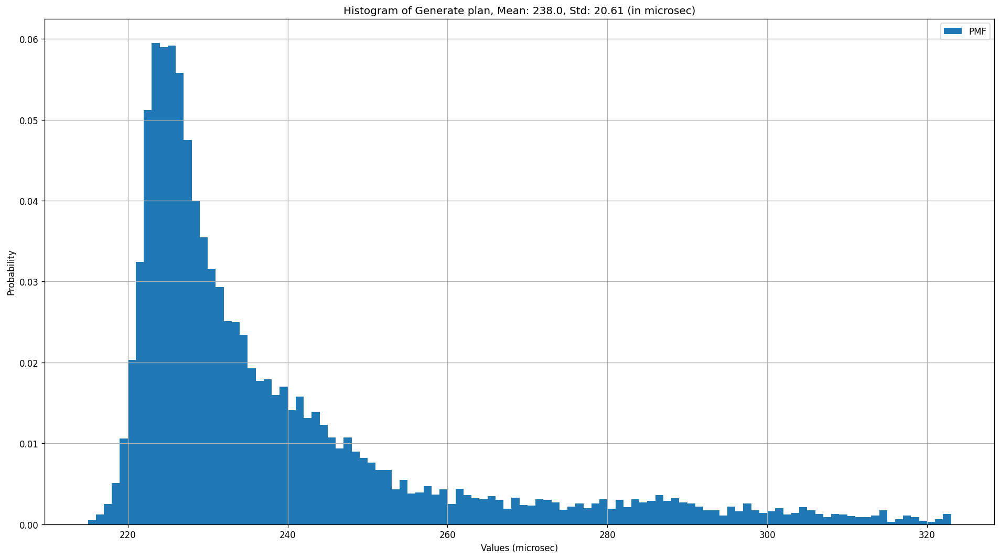

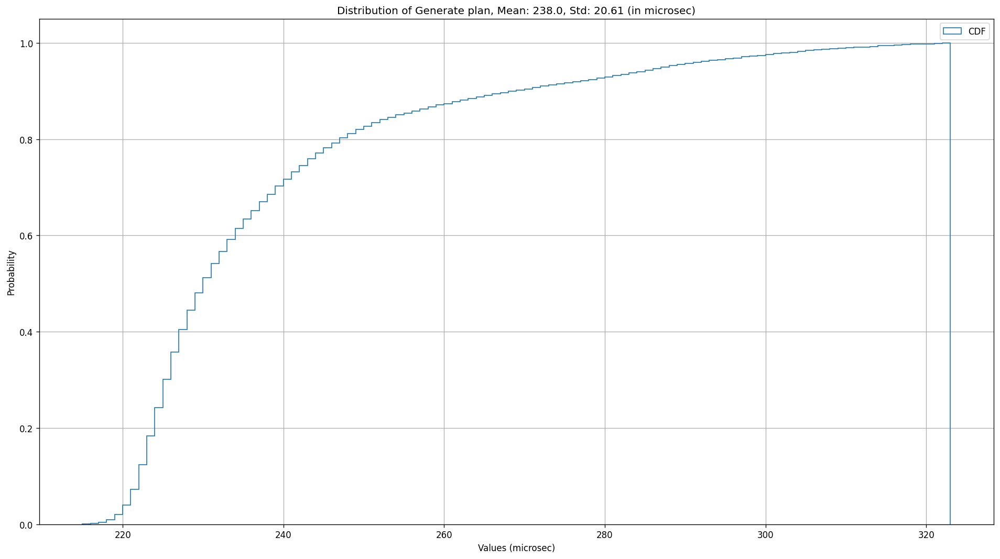

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
1,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
2,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
3,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
4,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9996,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9997,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9998,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67


OU - Generate plan Targets shape: (10000,)


0       298687
1       314440
2       321046
3       317570
4       316241
         ...  
9995    224431
9996    222720
9997    263658
9998    228873
9999    230308
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0591/0.0592
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


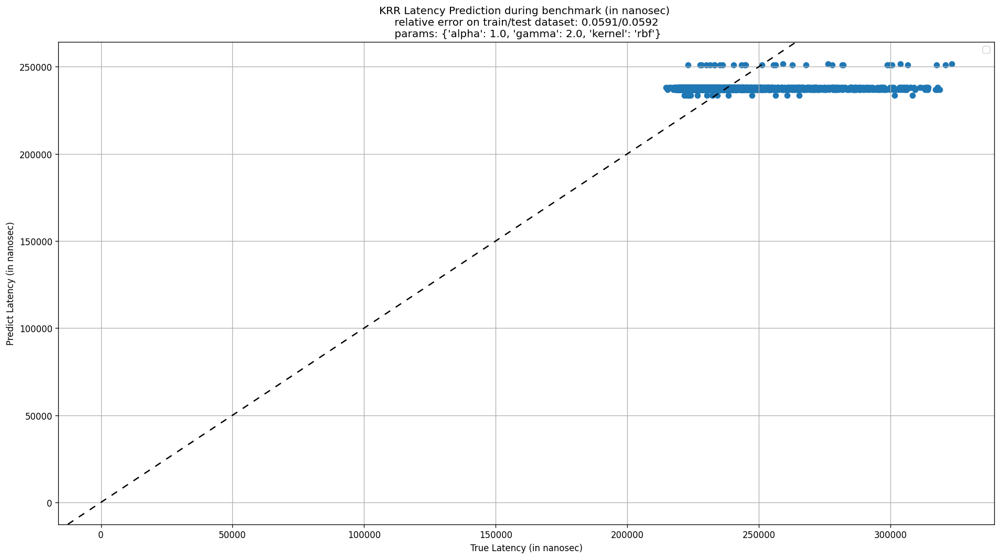

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.05115549 -0.05115424
 -0.05115273 -0.05115111 -0.05115564 -0.05115296 -0.05115056 -0.051149
 -0.05115545 -0.05115099 -0.05114762 -0.05114623 -0.05115568 -0.05114774
 -0.05114397 -0.0511409 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.0511/0.0523
Best Params: {'C': 4.0, 'gamma': 2.0, 'kernel': 'rbf'}


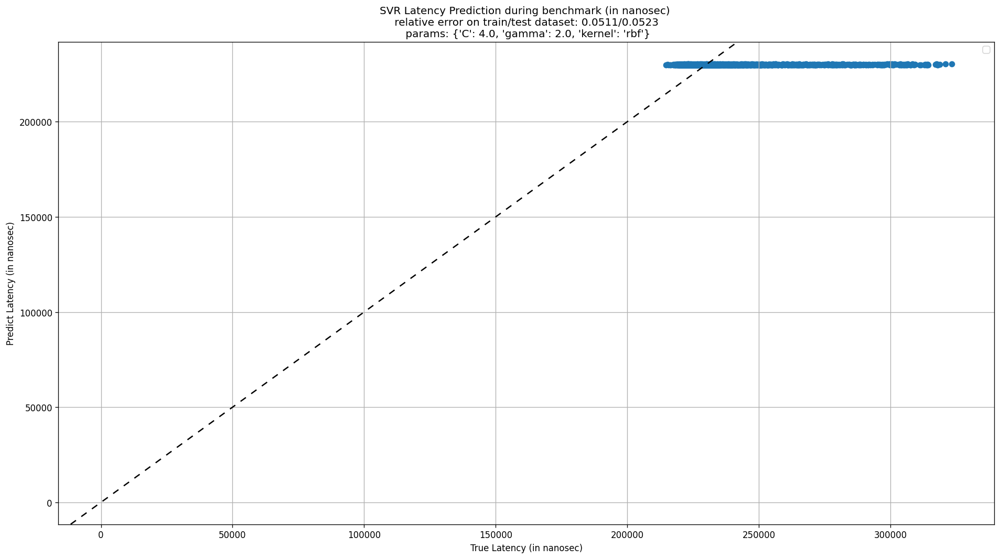

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0512/0.0524
Best Params: {'alpha': 1, 'epsilon': 1.1}


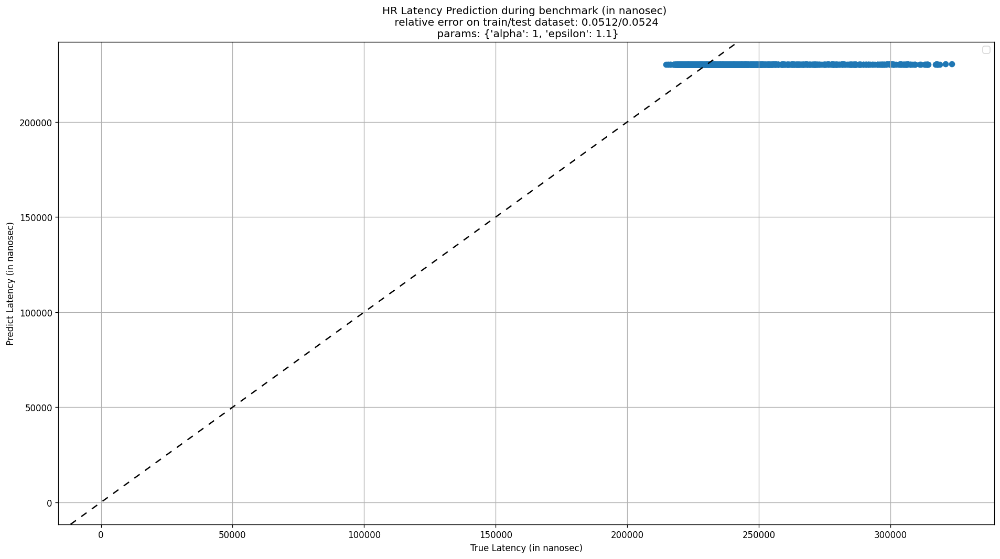

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.051/0.0518
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


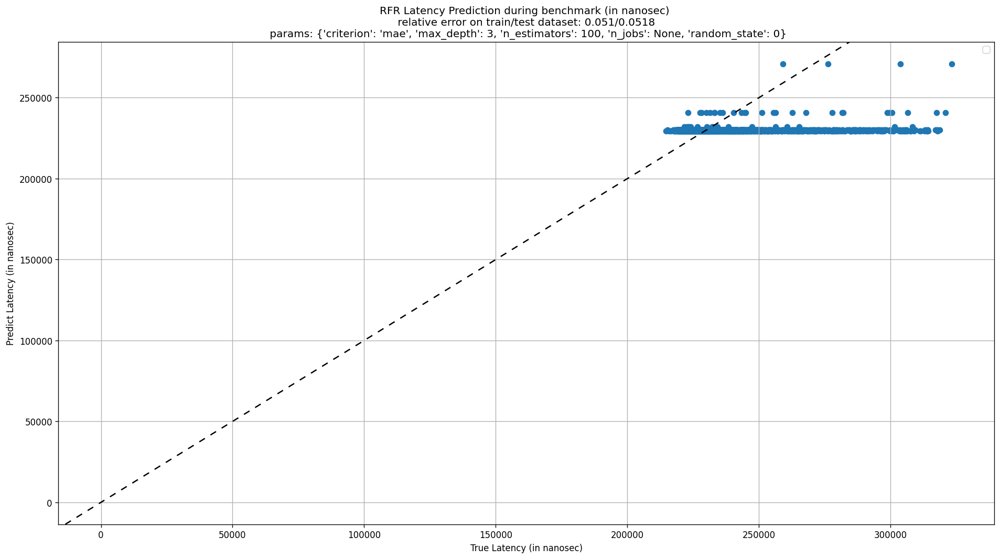

Records: Time of Each Component with shape: (37417, 17)


,Transaction ID,Execution Time,Txn Start TimeStamp,Generate plan,Init thread,Average Time Of R/W Txn,Get locks,(Master) Read from local storage,(Master) Read from remote,(Master) Execute SQL,(Master) Push,Flush,Tx commit,Release Lock,Unpin,Txn End TimeStamp,Average Time Of Read-Only Txn
0,1,68521176,2417251096920844,5592392,511599,57033950,316243,40952558,29773,371889,4310,14813465,509592,483522,5529,2417251157884451,0
1,2,27708102,2417251273422388,1505764,416862,25022850,191426,13917917,27262,282163,799,9106762,1483923,1461245,10180,2417251298682903,0
2,3,12255621,2417251315614353,888947,410418,0,78129,10193232,19203,87756,802,24222,81863,56305,14177,2417251326254465,10494806
3,4,21631949,2417251342229399,1157058,492231,19546697,190001,10108524,22737,279661,856,8790242,141929,126993,4510,2417251361937784,0
4,5,10154949,2417251370358656,576295,523729,0,82254,8017229,21520,71282,1073,43746,76085,59719,5197,2417251379260139,8324165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37412,37413,5304292,2417550976433861,243808,44791,4904400,31873,2375100,3667,67682,155,2375540,47752,44297,903,2417550981390272,0
37413,37414,2860800,2417550984762446,149722,46824,0,19962,2504985,4476,19307,134,2526,21854,18560,937,2417550987389998,2575988
37414,37415,2901099,2417550990484390,154365,36192,0,23776,2556087,4557,19255,120,2651,21613,18434,903,2417550993158800,2630574
37415,37416,2762416,2417550996298267,151019,45663,0,19116,2404252,3539,19177,171,2444,22439,19076,783,2417550998828002,2473560


Features: Features with shape: (37417, 16)


,Transaction ID,Start time,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,1,0,100,100,1,50,0.0,200,0,100,0,100,3300,200,0,22
1,2,181614079,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,25
2,3,224638219,100,0,1,50,2.0,200,0,0,0,0,0,100,0,26
3,4,250945070,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,27
4,5,279743366,100,0,1,50,3.0,200,0,0,0,0,0,100,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37412,37413,299886726253,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
37413,37414,299895169364,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
37414,37415,299900897866,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
37415,37416,299906705793,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


In microsec, Number of bins: 35, nBins: [19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36.
 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53.]
Mean Latency: 33.45, Std Latency: 11.56 (microsec)


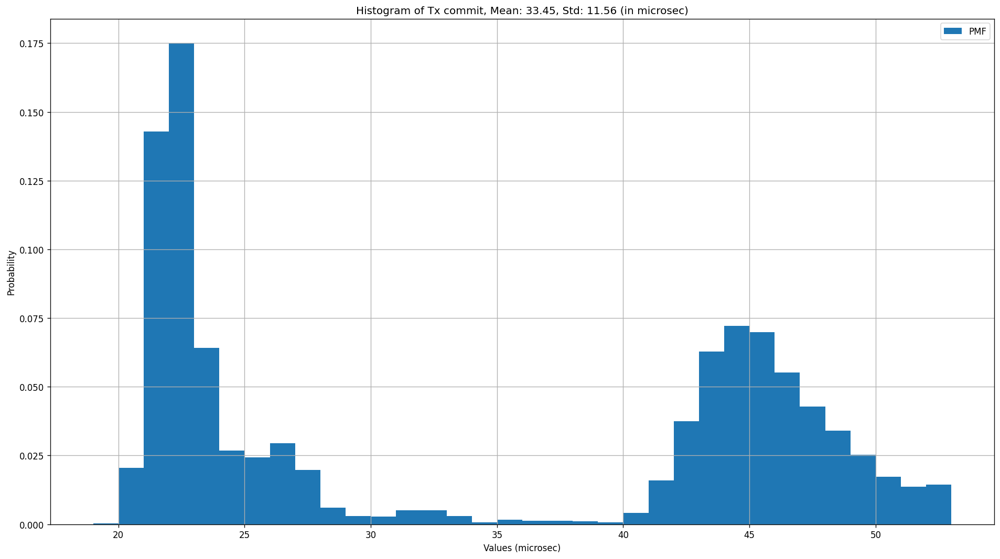

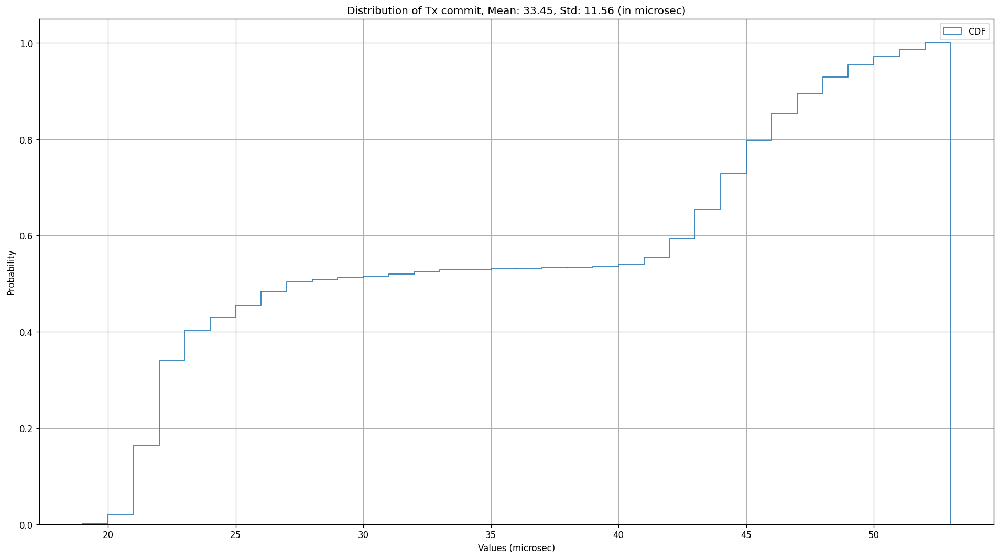

OU - Tx commit Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
1,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9997,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - Tx commit Targets shape: (10000,)


0       46885
1       50282
2       48736
3       49212
4       47365
        ...  
9995    21933
9996    43806
9997    42054
9998    21613
9999    22439
Name: Tx commit, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0682/0.069
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


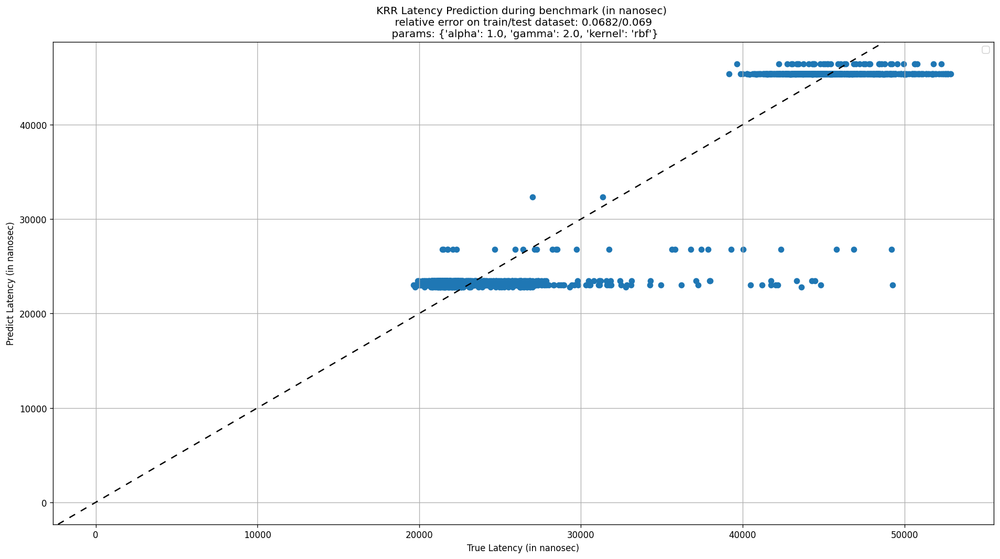

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.27496181 -0.27921516
 -0.28268904 -0.28585981 -0.24630577 -0.25548291 -0.26254758 -0.26895323
 -0.18845923 -0.20943586 -0.22401726 -0.23735551 -0.11110645 -0.13432769
 -0.15548046 -0.17788937]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.1111/0.0929
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


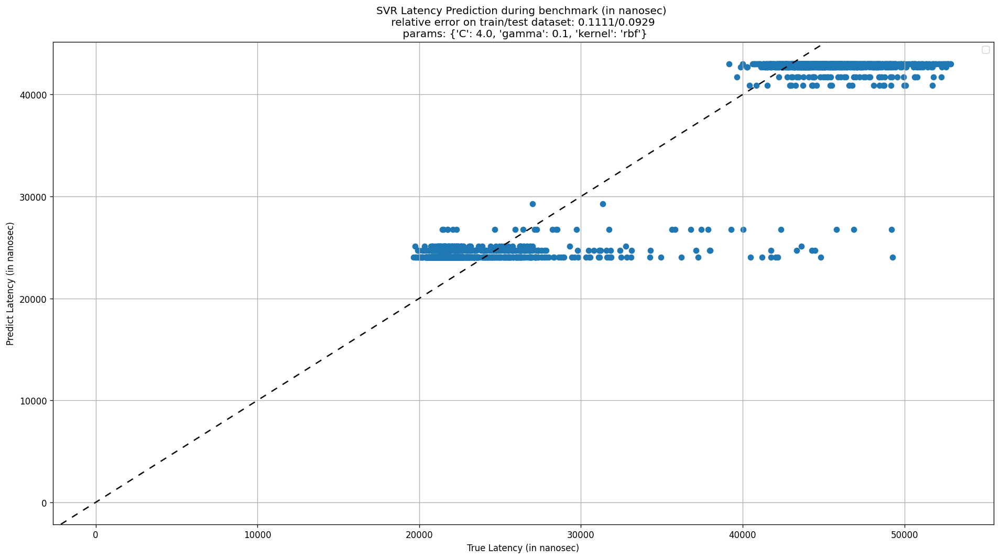

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0597/0.0611
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


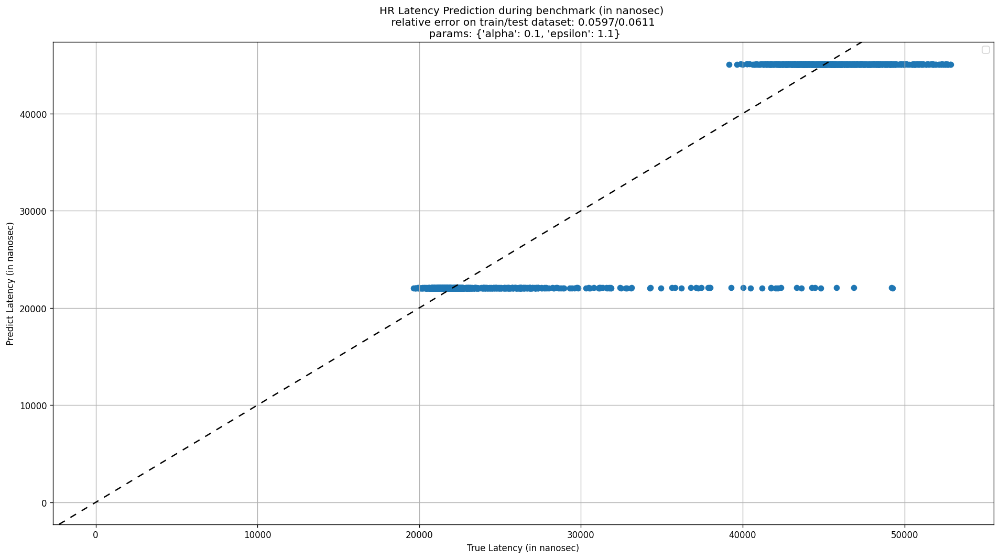

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0595/0.0605
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 100, 'n_jobs': None, 'random_state': 0}


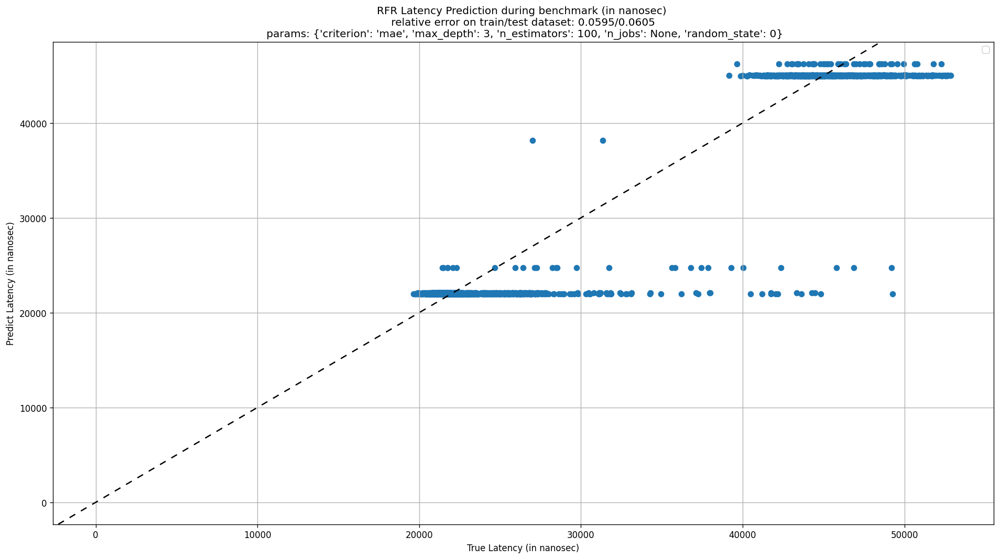

In microsec, Number of bins: 175, nBins: [2.000e+00 3.000e+00 4.000e+00 5.000e+00 6.000e+00 7.000e+00 8.000e+00
 9.000e+00 1.000e+01 1.100e+01 1.200e+01 1.300e+01 1.500e+01 1.600e+01
 1.700e+01 1.800e+01 2.000e+01 2.800e+01 3.300e+01 4.400e+01 4.500e+01
 2.229e+03 2.231e+03 2.234e+03 2.235e+03 2.237e+03 2.238e+03 2.239e+03
 2.240e+03 2.241e+03 2.242e+03 2.243e+03 2.244e+03 2.245e+03 2.246e+03
 2.247e+03 2.248e+03 2.249e+03 2.250e+03 2.251e+03 2.252e+03 2.253e+03
 2.254e+03 2.255e+03 2.256e+03 2.257e+03 2.258e+03 2.259e+03 2.260e+03
 2.261e+03 2.262e+03 2.263e+03 2.264e+03 2.265e+03 2.266e+03 2.267e+03
 2.268e+03 2.269e+03 2.270e+03 2.271e+03 2.272e+03 2.273e+03 2.274e+03
 2.275e+03 2.276e+03 2.277e+03 2.278e+03 2.279e+03 2.280e+03 2.281e+03
 2.282e+03 2.283e+03 2.284e+03 2.285e+03 2.286e+03 2.287e+03 2.288e+03
 2.289e+03 2.290e+03 2.291e+03 2.292e+03 2.293e+03 2.294e+03 2.295e+03
 2.296e+03 2.297e+03 2.298e+03 2.299e+03 2.300e+03 2.301e+03 2.302e+03
 2.303e+03 2.304e+03 2.305e+03 2.306

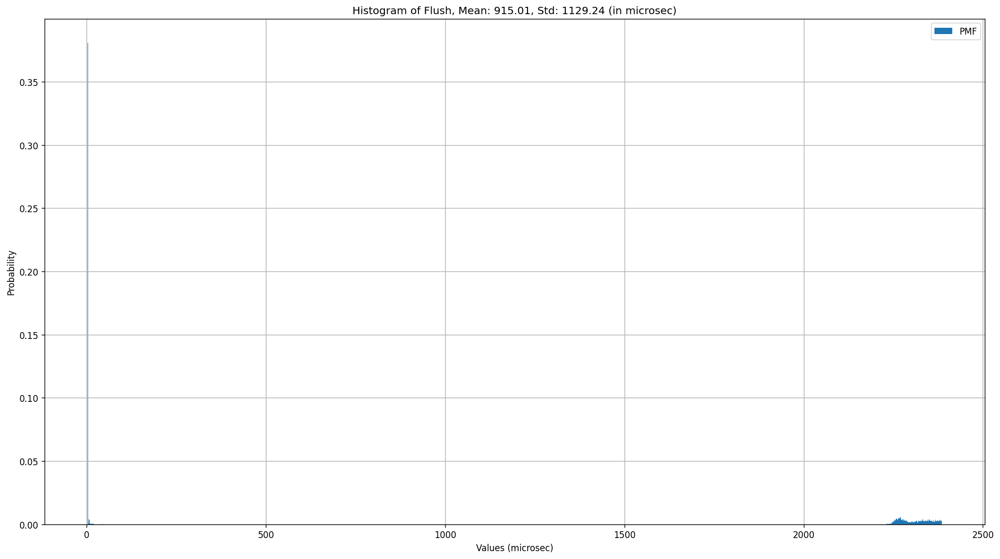

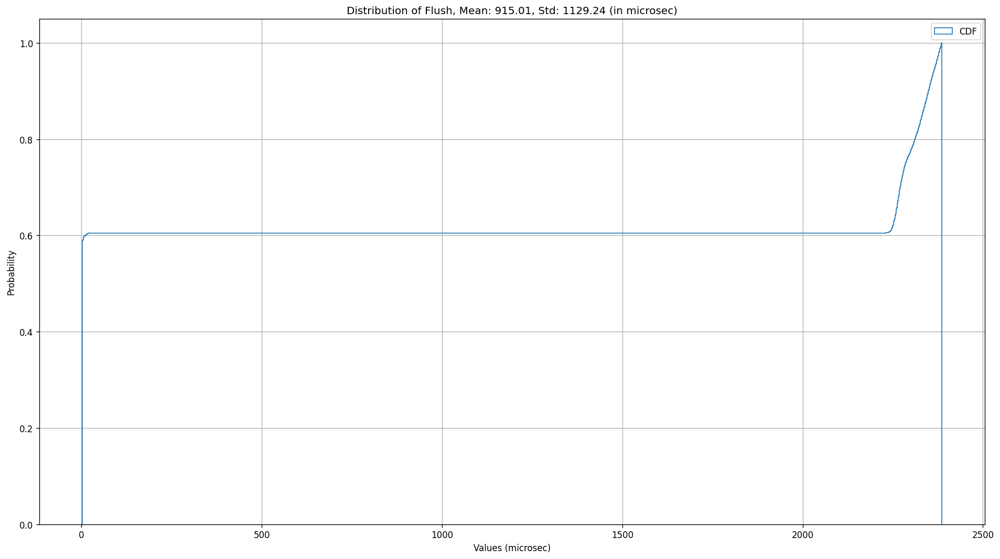

OU - Flush Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,28
1,100,0,1,50,3.0,200,0,0,0,0,0,100,0,35
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,45
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,49
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9996,100,100,1,50,3.0,200,0,100,0,100,3300,200,0,67
9997,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - Flush Targets shape: (10000,)


0         43746
1         17403
2         18497
3         18129
4         15960
         ...   
9995    2383587
9996    2249994
9997    2375540
9998       2526
9999       2444
Name: Flush, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0561/0.0589
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


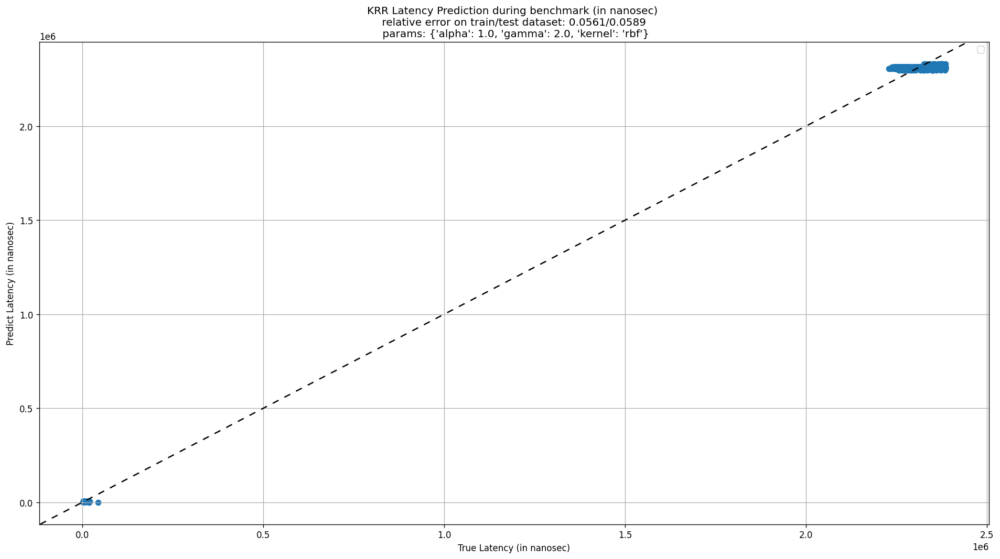

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.44539952 -0.45455899
 -0.45864047 -0.46107568 -0.4495366  -0.47106789 -0.47942685 -0.4849483
 -0.46035818 -0.50653973 -0.52435443 -0.5354734  -0.48375363 -0.57155068
 -0.60413479 -0.62530102]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.4454/0.4472
Best Params: {'C': 0.5, 'gamma': 0.1, 'kernel': 'rbf'}


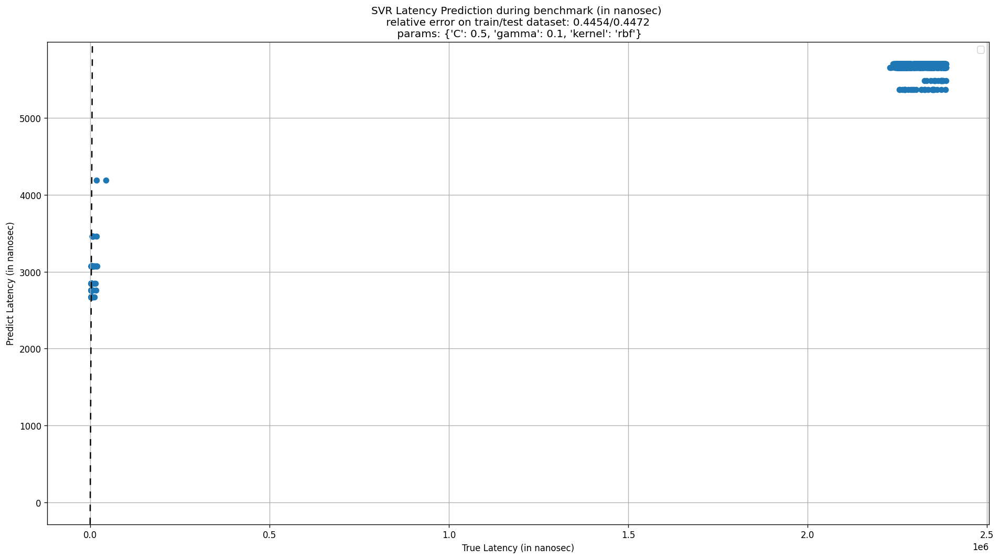

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0407/0.0436
Best Params: {'alpha': 1, 'epsilon': 1.1}


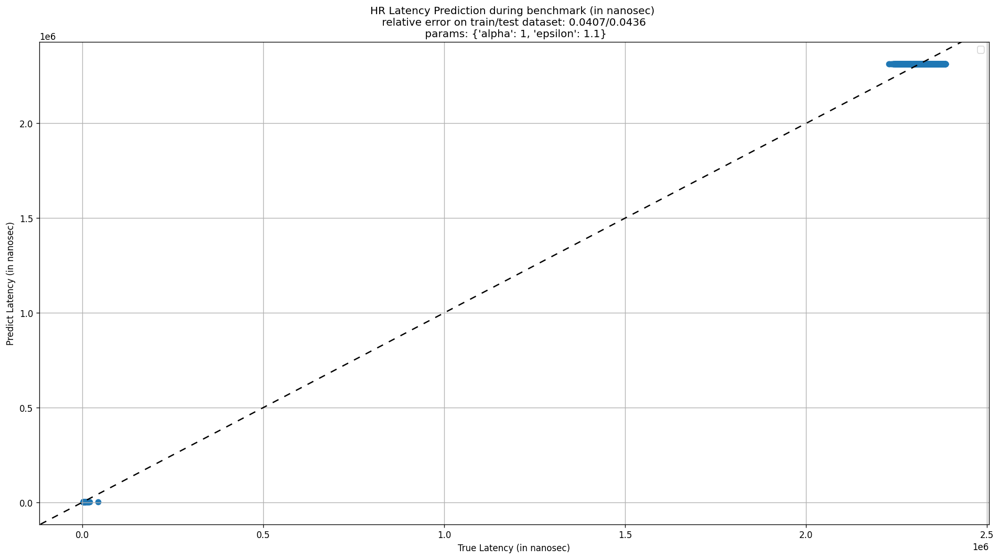

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0402/0.0413
Best Params: {'criterion': 'mae', 'max_depth': 3, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


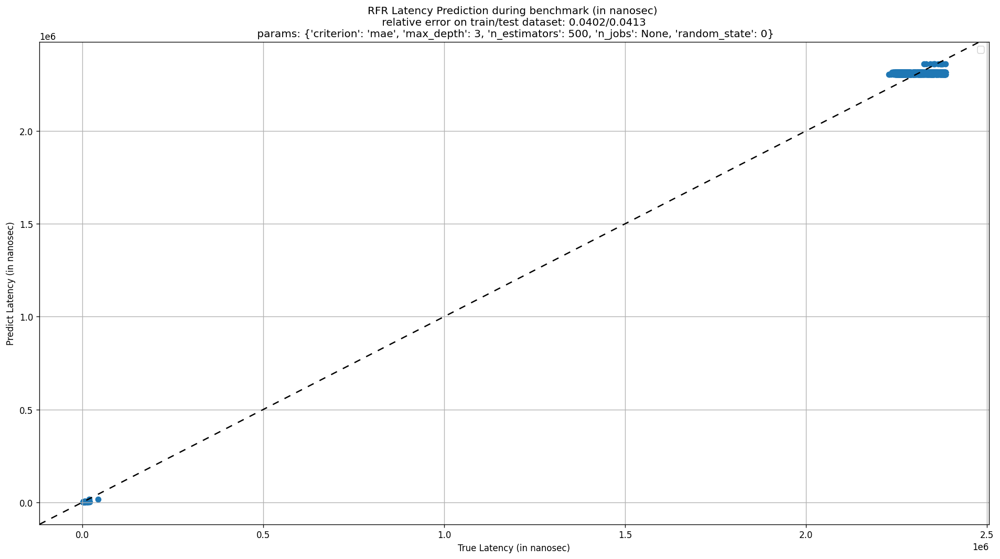

In microsec, Number of bins: 76, nBins: [16. 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33.
 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 46. 49. 50. 51. 53. 54. 55.
 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71. 72. 73.
 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89. 90. 91.
 92. 93. 94. 95.]
Mean Latency: 43.51, Std Latency: 23.93 (microsec)


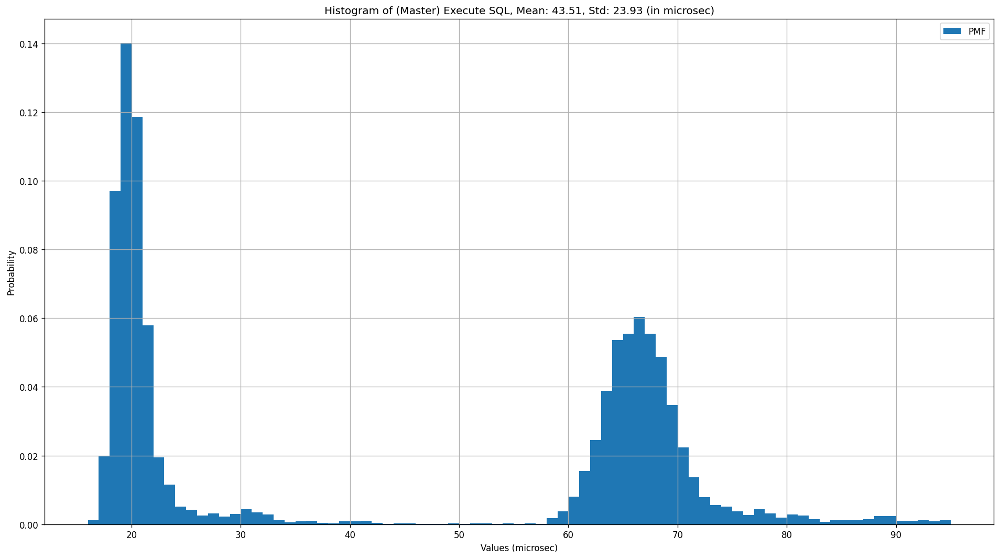

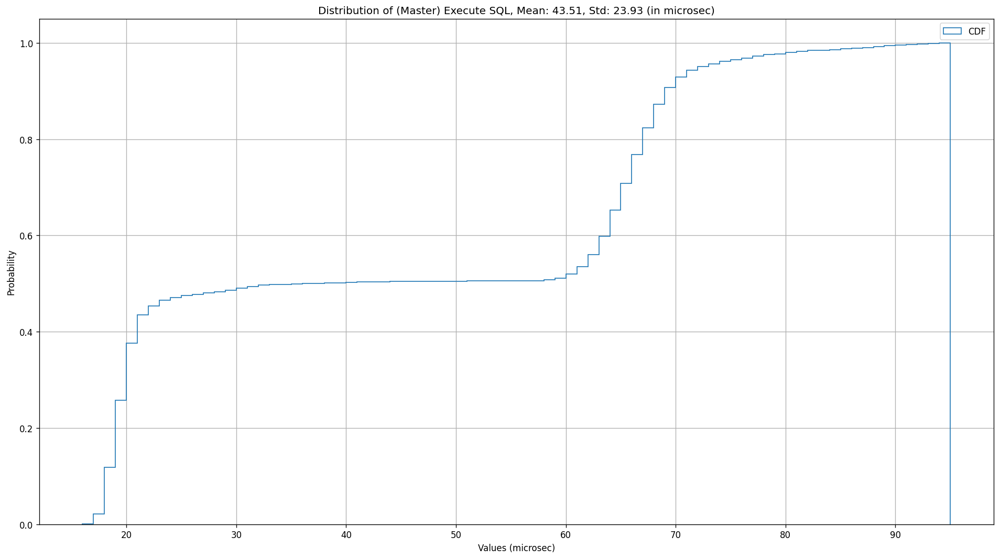

OU - (Master) Execute SQL Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,49
1,100,0,1,50,3.0,200,0,0,0,0,0,100,0,54
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,66
3,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67
9998,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67


OU - (Master) Execute SQL Targets shape: (10000,)


0       65191
1       64110
2       61363
3       58671
4       58744
        ...  
9995    19230
9996    17853
9997    68586
9998    19255
9999    19177
Name: (Master) Execute SQL, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0689/0.072
Best Params: {'alpha': 1.0, 'gamma': 2.0, 'kernel': 'rbf'}


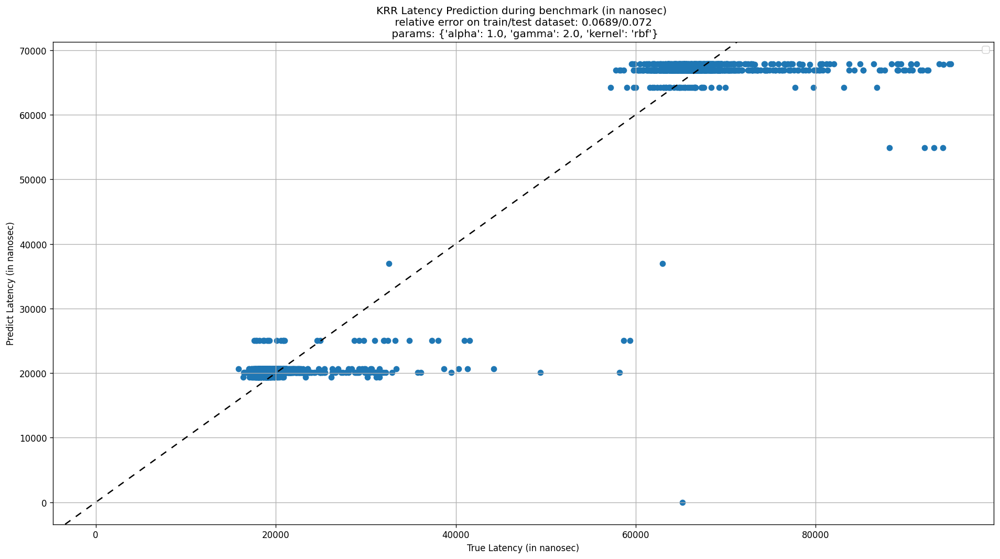

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.76038048 -0.76510645
 -0.7689804  -0.77265588 -0.72392362 -0.73225579 -0.74184136 -0.75021444
 -0.64190648 -0.66946974 -0.68751401 -0.70261009 -0.44701417 -0.51748689
 -0.56113312 -0.59437978]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.447/0.3487
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


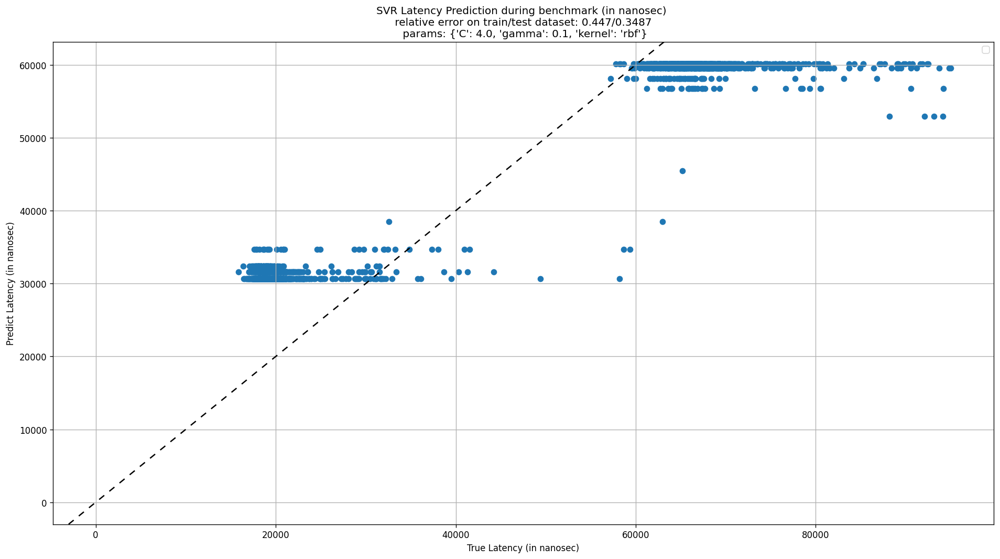

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.062/0.0649
Best Params: {'alpha': 0.1, 'epsilon': 1.1}


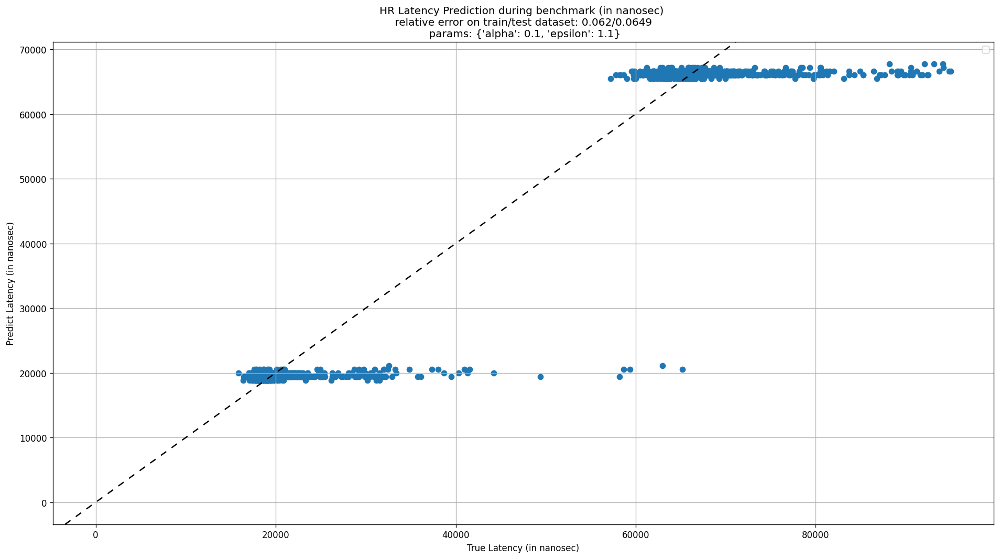

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0618/0.064
Best Params: {'criterion': 'mae', 'max_depth': 5, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


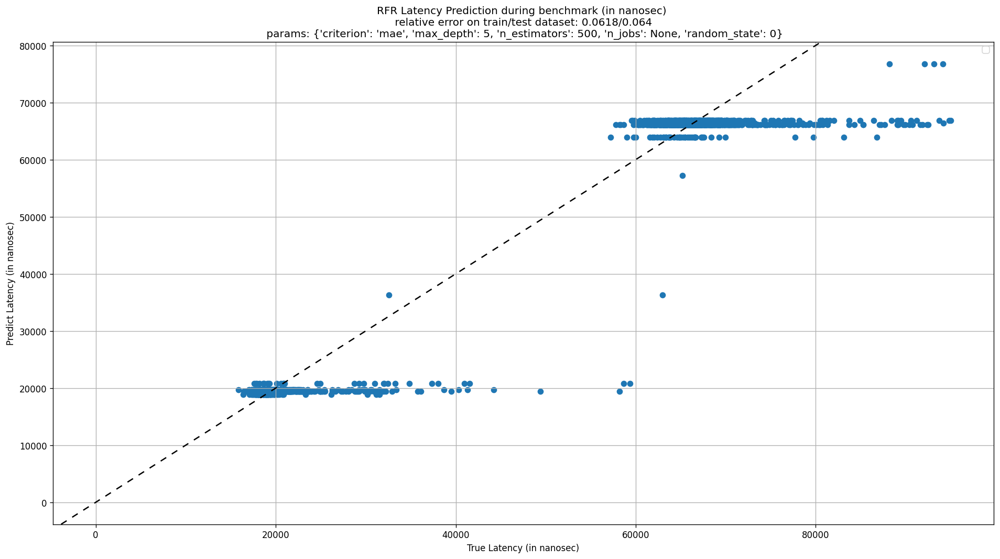

In microsec, Number of bins: 172, nBins: [141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151. 152. 153. 154.
 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166. 167. 168.
 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181. 182.
 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194. 195. 196.
 197. 198. 199. 200. 201. 202. 203. 204. 205. 206. 207. 208. 209. 210.
 211. 212. 213. 214. 215. 216. 217. 218. 219. 220. 221. 222. 223. 224.
 225. 226. 227. 228. 229. 230. 231. 232. 233. 234. 235. 237. 238. 239.
 240. 241. 242. 243. 244. 245. 246. 247. 248. 249. 250. 251. 252. 253.
 254. 255. 256. 257. 258. 259. 260. 261. 262. 263. 264. 265. 266. 267.
 268. 269. 270. 271. 272. 273. 274. 275. 276. 277. 278. 279. 280. 281.
 282. 283. 284. 285. 286. 287. 288. 289. 290. 291. 292. 293. 294. 295.
 296. 297. 298. 299. 300. 301. 302. 303. 304. 305. 306. 307. 308. 309.
 310. 311. 312. 313.]
Mean Latency: 211.94, Std Latency: 54.08 (microsec)


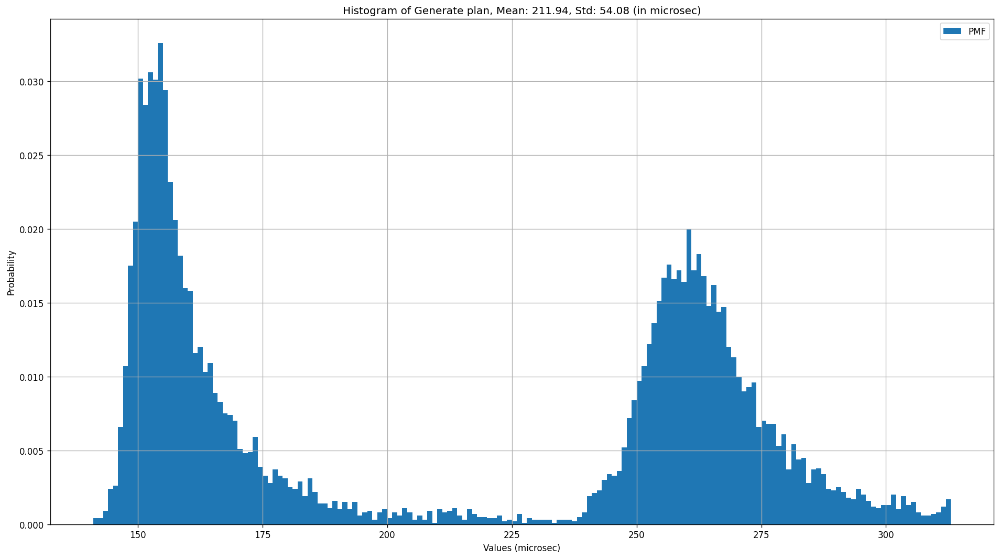

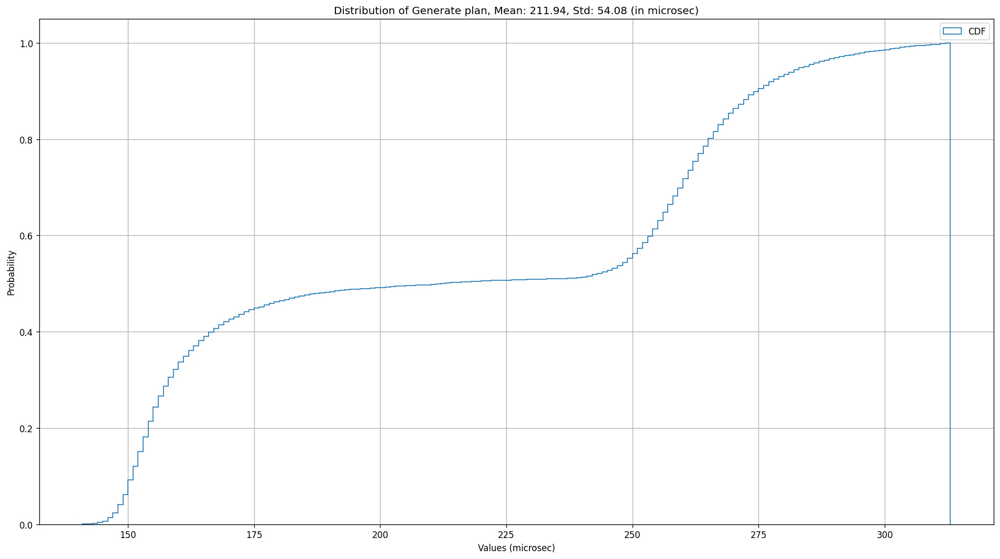

OU - Generate plan Features shape: (10000, 14)


,Num of reads,Num of writes,Num of active txs,Thread pool size,CPU utilization,Num of cache read,Num of cache insert,Num of cache update,Num of arithmetic operations,Num of write record,Num of bytes,Num of read write record,Num of log flush bytes,Num of Threads
0,100,0,1,50,3.0,200,0,0,0,0,0,100,0,63
1,100,0,1,50,4.0,200,0,0,0,0,0,100,0,67
2,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
3,100,0,1,50,4.0,200,0,0,0,0,0,100,0,67
4,100,0,1,50,3.0,200,0,0,0,0,0,100,0,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9996,100,0,1,50,1.0,200,0,0,0,0,0,100,0,67
9997,100,100,1,50,2.0,200,0,100,0,100,3300,200,0,67
9998,100,100,1,50,1.0,200,0,100,0,100,3300,200,0,67


OU - Generate plan Targets shape: (10000,)


0       269844
1       281377
2       252359
3       250002
4       271294
         ...  
9995    155017
9996    150480
9997    264883
9998    257957
9999    154365
Name: Generate plan, Length: 10000, dtype: int64

Fitting 5 folds for each of 4 candidates, totalling 20 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0513/0.0528
Best Params: {'alpha': 1.0, 'gamma': 0.5, 'kernel': 'rbf'}


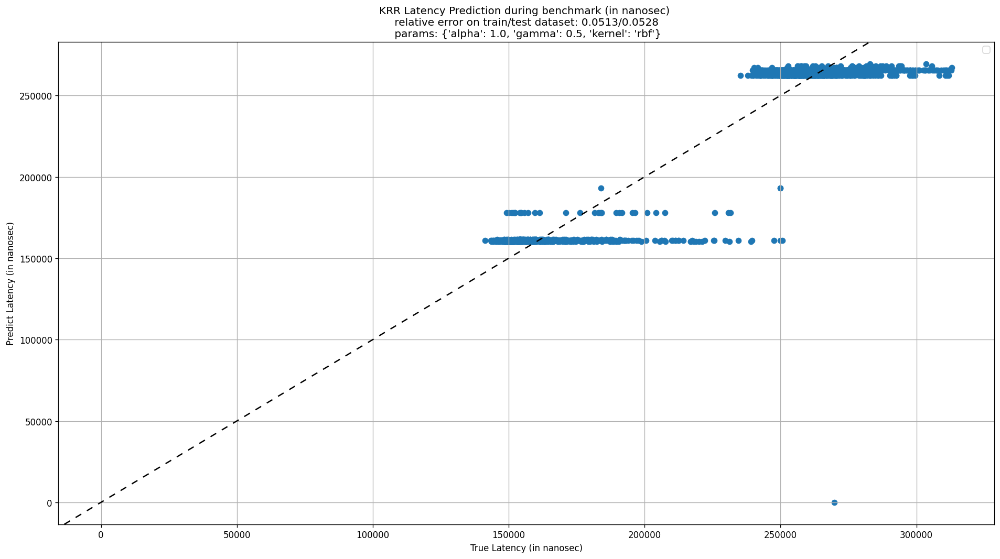

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/weidagogo/anaconda3/envs/tempenv/lib/python3.7/site-packages/sklearn/model_selection/_search.py:925: UserWarning: One or more of the test scores are non-finite: [        nan         nan         nan         nan -0.25800294 -0.25872544
 -0.25924416 -0.25974041 -0.25258633 -0.25397848 -0.25518297 -0.25632001
 -0.24166499 -0.24490767 -0.24711604 -0.24934342 -0.21995242 -0.22665498
 -0.2312054  -0.2357654 ]
  category=UserWarning
No handles with labels found to put in legend.


Best training/testing score: 0.22/0.2067
Best Params: {'C': 4.0, 'gamma': 0.1, 'kernel': 'rbf'}


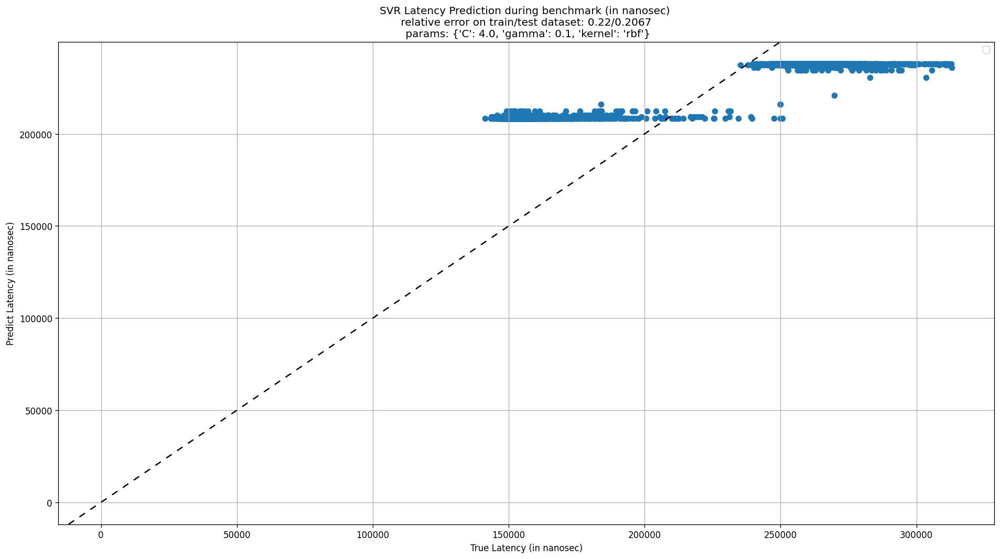

Fitting 5 folds for each of 20 candidates, totalling 100 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0469/0.0493
Best Params: {'alpha': 0, 'epsilon': 1.1}


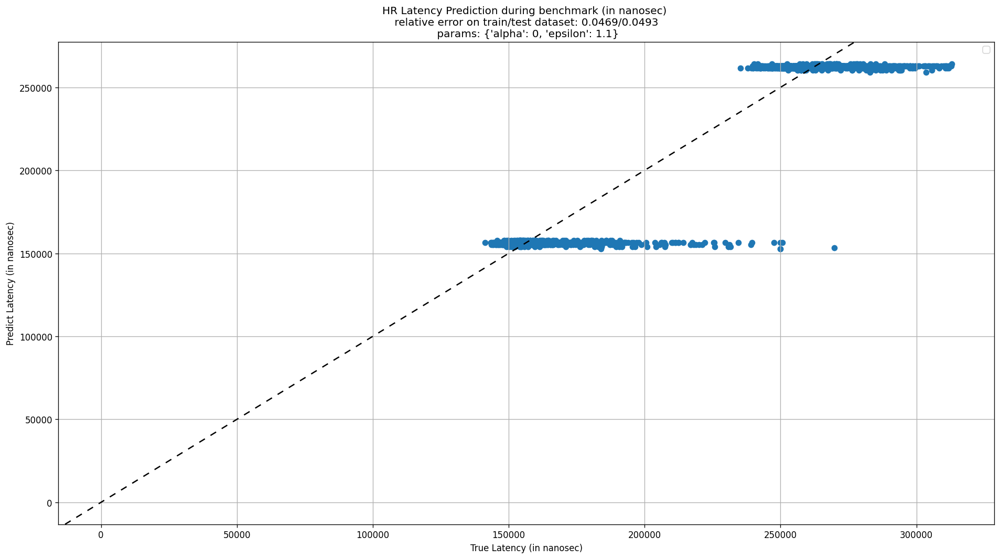

Fitting 5 folds for each of 24 candidates, totalling 120 fits


No handles with labels found to put in legend.


Best training/testing score: 0.0463/0.0484
Best Params: {'criterion': 'mae', 'max_depth': 7, 'n_estimators': 500, 'n_jobs': None, 'random_state': 0}


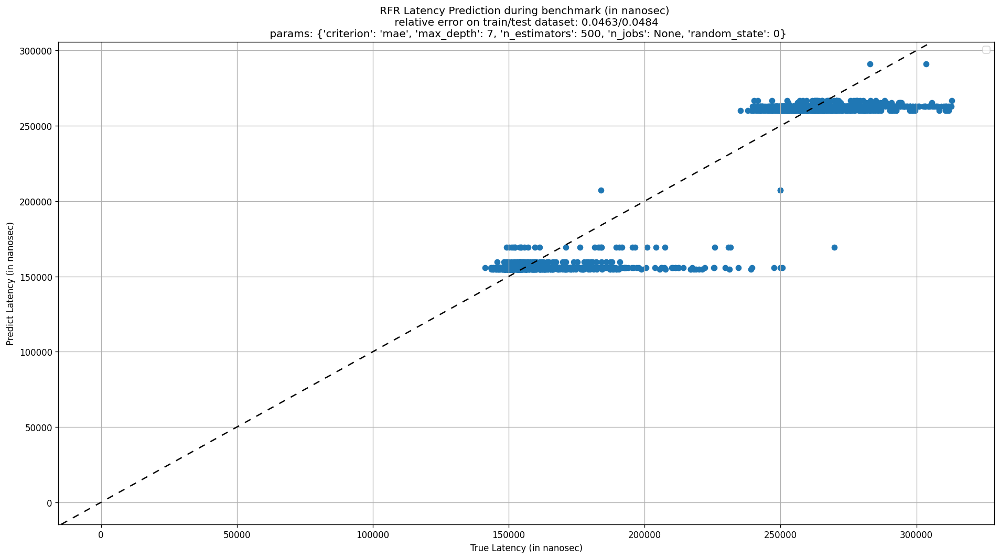

In [7]:
for path in paths:
    rt.setPath(path=path)
    rt.buildDataset()
    for targetName in targetNames:
        rt.fit(featureNames=featureNames, targetName=targetName)